In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../../model')
import numpy as np
import matplotlib.pyplot as plt
from config import Conf
import os
from tqdm import tqdm
from plotting import *
import h5py
from functions import *

In [2]:
# load_dir = '/Users/jo/notebooks_paper/run_data/2024-02-05/Untitled/18:37'
# pre_trial = False
load_dir = '/Users/jo/notebooks_paper/run_data/best/'
pre_trial = True

In [3]:
def partition_trials(arr, t_axis=1):
    arr_trial = np.array_split(arr, arr.shape[t_axis]//Conf.trial_len, axis=t_axis)
    arr_trial = np.stack(arr_trial, axis=1)
    return arr_trial

def partition_all(arrs, pre_trial, t_axis=1):
    offset=0 if not pre_trial else 2
    return [partition_trials(arr[:, offset:, :], t_axis=t_axis) for arr in arrs]

def argmax_all(arrs, onehot_axis=-1):
    return [np.argmax(arr, axis=onehot_axis) for arr in arrs]

def unpack_data_dict(data_dict):
    return data_dict['inputs'], data_dict['targets'], data_dict['choices'], data_dict['ground_truth'], data_dict['p_A_high'], data_dict['hidden']

def detect_anomalies(thresholds = Conf.threshold):
    # thresholds = 4.99
    if thresholds is not None:
        thresholds = thresholds - 0.01
        anomaly = hidden_trial > thresholds
        return np.any(anomaly, axis=(1,2,3))
    else:
        return []

In [4]:
def list_all_datasets(h5file, prefix=''):
    print([k for k in h5file.keys()])
    for key in h5file.keys():
        item = h5file[key]
        path = f"{prefix}/{key}"
        if isinstance(item, h5py.Dataset):
            # This is a dataset
            print(f"Dataset: {path} {item.shape}")
        elif isinstance(item, h5py.Group):
            # This is a group, recurse into it
            list_all_datasets(item, path)

with h5py.File(os.path.join(load_dir, 'data_all.h5'), 'r') as file:
    # Access the dataset
    list_all_datasets(file)

    # Load the data
    n_chunks = 1
    means, bin_counts = [], []

    data_dict = {}
    for key in file.keys():
        data_dict[key] = file[key][:]

    inputs, targets, choices, ground_truth, p_A, hiddens = unpack_data_dict(data_dict)
    print([x.shape for x in [inputs, targets, choices, ground_truth, p_A, hiddens]])
    
    inputs_trial, choices_trial, targets_trial, hidden_trial = partition_all([inputs, choices, targets, hiddens], pre_trial=pre_trial)
    print([x.shape for x in [inputs_trial, choices_trial, targets_trial, hidden_trial]])

    # del inputs, targets, ground_truth
    # del inputs_trial, choices_trial, targets_trial, hidden_trial

    # if Conf.pre_trial:
    #     x_arg_trial = np.argmax(inputs[:,:2,:Conf.x_dim], axis=-1)
    #     print(x_arg_trial.shape)
    # else:
    #     raise NotImplementedError
    #     x_arg_trial = np.argmax(inputs_trial[:,:Conf.x_dim,:], axis=-1)[:,0,:]
    # x_arg_trial = np.repeat(x_arg_trial[:, np.newaxis, :], inputs_trial.shape[1], axis=1)
    # print(x_arg_trial.shape)

    if pre_trial:
        layouts = np.argmax(inputs[:,:2,:Conf.x_dim], axis=-1)
    else:
        layouts = np.argmax(inputs_trial[:,0,1:3,:Conf.x_dim], axis=-1)
    # anomalous_batches = []
    # mean, bin_count = get_means(p_A, x_arg_trial, hidden_trial, anomalous_batches, n_p_bins=20 if Conf.reward_prob == 0.8 else 2)

if Conf.pre_trial: 
    hiddens = hiddens[:, 2:, :]
    targets = targets[:, 2:, :]
    choices = choices[:, 2:, :]
    inputs = inputs[:, 2:, :]
    ground_truth = ground_truth[:, 2:, :]

del inputs_trial, choices_trial, targets_trial, hidden_trial #, ground_truth

['choices', 'ground_truth', 'hidden', 'inputs', 'p_A_high', 'targets']
Dataset: /choices (10000, 82, 404)
Dataset: /ground_truth (10000, 82, 404)
Dataset: /hidden (10000, 82, 1024)
Dataset: /inputs (10000, 82, 404)
Dataset: /p_A_high (10000, 40, 1)
Dataset: /targets (10000, 82, 404)
[(10000, 82, 404), (10000, 82, 404), (10000, 82, 404), (10000, 82, 404), (10000, 40, 1), (10000, 82, 1024)]
[(10000, 40, 2, 404), (10000, 40, 2, 404), (10000, 40, 2, 404), (10000, 40, 2, 1024)]


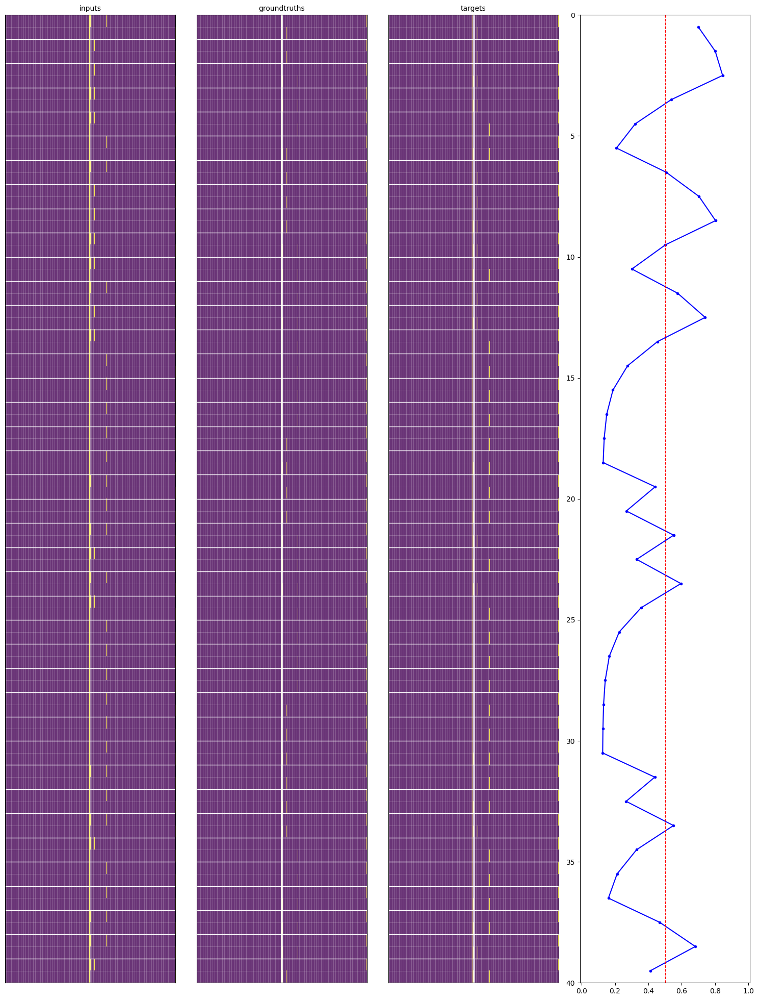

In [5]:
b = 1
num_trials = 40

import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 4, figsize=(15, num_trials//2))
if Conf.pre_trial:
    offset = 2
else:
    offset = 0
    
def display_mat(ax, data, title=''):
    ax.imshow(data, aspect='auto', interpolation='none')
    ax.axvline(x=Conf.x_dim-0.5, c='w', linewidth=1)
    ax.axvline(x=Conf.r_dim + Conf.x_dim-0.5, c='w', linewidth=1)
    for i in range(0,num_trials):
        ax.axhline(y=i * Conf.trial_len+offset-0.5, c='w', linewidth=1)
    ax.set_title(title, fontsize=10)
    # ax.yaxis.set_visible(False)
    # ax.xaxis.set_visible(False)
    # q: how do I turn on the grid on the plot?
    # a: ax.grid(True)
    # q: its not showing up
    # a: try plt.grid(True)
    # q: its still not showing up
    # Set grid
    ax.set_xticks([i+0.5 for i in range(data.shape[1])])  # Adjust x-ticks to align with grid
    ax.set_yticks([i+0.5 for i in range(data.shape[0])])  # Adjust y-ticks to align with grid
    ax.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    ax.grid(True, which='both', color='white', alpha=0.3, linestyle='-', linewidth=0.5)

def display_curve(ax, data, title='p(A)'):
    trials = data.shape[0]
    ax.plot(data, 0.5 + np.arange(trials), marker='o', markersize=3, color='b')
    ax.set_ylim([0, trials])
    ax.set_xlim([-.01, 1.01])
    ax.invert_yaxis()
    ax.axvline(x=0.5, color='red', linestyle='--', linewidth=1)

display_mat(axes[0], inputs[b, :Conf.trial_len * num_trials, :], title='inputs')
display_mat(axes[1], ground_truth[b, :Conf.trial_len * num_trials, :], title='groundtruths')
display_mat(axes[2], targets[b, :Conf.trial_len * num_trials, :], title='targets')
display_curve(axes[3], p_A[b, :num_trials, :], title='targets')

plt.tight_layout(rect=[0, 0, 1, 0.985]) # Adjust layout to make space for suptitle

In [6]:
anomalous_idxs, non_anomalous_idxs = get_anomalous_batches(choices)

action = choices[:,:,Conf.x_dim + Conf.r_dim:][:, Conf.ab_choice_step::Conf.trial_len]
# Turn action array into 1's if element in row equals max in row
action = np.argmax(action, axis=-1)
# Repeat choice for each of the trial steps
action = np.repeat(action, Conf.trial_len, axis=1)

not_action = swap_unique_elements(action, layouts)

# anomalous: 81
# non-anomalous: 9919


In [ ]:
accuracies_action, _, chance, _ = train_decoders(hiddens, targets=action, layouts=layouts, scale=False, exclude_batch_idxs=None, T=20, multi_class='ovr', max_iter=1000, random_state=42)

Using multiclass: True


 50%|█████     | 10/20 [02:15<02:15, 13.57s/it]


KeyboardInterrupt: 

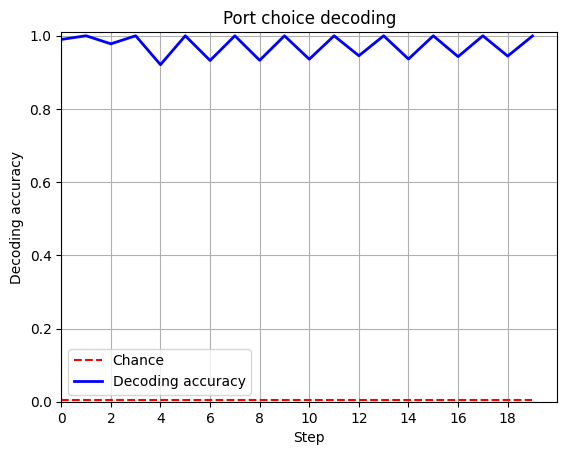

In [ ]:
plot_decoding_accuracy(accuracies_action, chance=chance, n_class=Conf.port_dim, title='Port choice decoding')

In [ ]:
accuracies_action, _, chance, _ = train_decoders(hiddens, targets=action, layouts=layouts, exclude_batch_idxs=None, T=20, multi_class='ovr', max_iter=10000, random_state=41)

In [ ]:
plot_decoding_accuracy(accuracies_action, chance=chance, n_class=Conf.port_dim, title='Port choice decoding')

In [ ]:
accuracies_not_action, conf_matrices_not_action, chance_not_action, data = train_decoders(hiddens, targets=not_action, layouts=layouts, exclude_batch_idxs=None, T=20, multi_class='ovr', max_iter=200, random_state=42)

In [ ]:
plot_decoding_accuracy(accuracies_not_action, n_class=Conf.port_dim, title='Port non-choice decoding')

In [ ]:
n_p_bins = 50
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins

fig, axes = plt.subplots(5,8)
for i,ax in enumerate(axes.flatten()):
    bins = np.digitize(p_A[:,i,:], bin_edges).squeeze()
    counts = np.bincount(bins.flatten(), minlength=n_p_bins)
    print(bin_edges.shape, counts.shape)

    ax.bar(bin_edges - 0.5 / n_p_bins, counts, width=np.diff(bin_edges, prepend=0), align='edge', capsize=2)

In [ ]:
n_p_bins = 50
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)
print(bins.shape, hiddens.shape)
accuracies_p_bins, conf_matrices_p_bins, chance_p_bins, data = train_decoders(hiddens[:, 2:, :], targets=bins, layouts=layouts, n_class=n_p_bins, exclude_batch_idxs=non_anomalous_idxs, T=40, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy(accuracies_p_bins, chance=chance_p_bins, n_class=n_p_bins, title='p(A) decoding')

In [ ]:
plot_conf_matrices(conf_matrices_p_bins, bins, n_p_bins, bin_edges, mask_type='all')

In [ ]:
n_p_bins = 4
bin_edges = np.array([0.2, 0.5, 0.8, 1.0]) #np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)
accuracies_p_bins, conf_matrices_p_bins, chance, data = train_decoders(hiddens, targets=bins, layouts=layouts, n_class=n_p_bins, exclude_batch_idxs=non_anomalous_idxs, T=40, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy(accuracies_p_bins, chance=None, n_class=n_p_bins, title='p(A) decoding')

In [ ]:
plot_conf_matrices(conf_matrices_p_bins, bins, n_p_bins, bin_edges, mask_type='step')

In [ ]:
N_step = 40

hiddens_flatten = hiddens[:, :N_step, :].reshape(-1, 1, hiddens.shape[-1])
t_step = np.broadcast_to(np.arange(N_step), (hiddens.shape[0], N_step))
t_step_flatten = t_step.flatten()
layouts_flatten = np.repeat(layouts, hiddens_flatten.shape[0] // hiddens.shape[0], axis=0)
print(hiddens_flatten.shape)
print(t_step_flatten.shape)
print(layouts_flatten.shape)

accuracies_t_step, conf_matrices_t_step, chance, _ = train_decoders(hiddens_flatten, targets=t_step_flatten, layouts=layouts_flatten, T=40, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy(accuracies_p_good, n_class=2, title='p(A) decoding')

In [ ]:
def train_test_split_layouts_(layouts, *arrs, **kwargs):
    print('Using custom train/test split')
    test_size = kwargs['test_size'] / 2 if 'test_size' in kwargs else 0.2
    np.random.seed(kwargs['random_state'] if 'random' in kwargs else None)

    return_arrs = []
    # exclude_port_set = np.random.choice(np.arange(Conf.port_dim), size=(int(Conf.port_dim*test_size)), replace=False)
    exclude_port_set = np.arange(60)
    truth_array = np.isin(layouts, exclude_port_set)
    exclude_batch_idxs = np.all(truth_array, axis=1)
    include_batch_idxs = np.any(truth_array, axis=1) == False

    layouts_train, layouts_test = layouts[include_batch_idxs], layouts[exclude_batch_idxs]

    for arr in arrs:
        train_arr, test_arr = arr[include_batch_idxs], arr[exclude_batch_idxs]
        return_arrs += [train_arr, test_arr]

    print('Shapes: {}'.format([x.shape for x in return_arrs]))

    # if np.isin(layouts_train, exclude_port_set).any():
    #     raise ValueError(f'Port found in training set')
    
    # if not np.any(np.isin(layouts_test, exclude_port_set), axis=1).all():
    #     raise ValueError(f'Port not found in testing set')

    return tuple(return_arrs)

action_train, action_test, hiddens_train, hiddens_test, layouts_train, layouts_test = train_test_split_layouts_(layouts, action, hiddens, layouts, test_size=0.2, random_state=42)

Using custom train/test split
Shapes: [(4842, 80), (898, 80), (4842, 80, 1024), (898, 80, 1024), (4842, 2), (898, 2)]


In [ ]:
layouts_test[:40,:]

array([[ 4, 30],
       [ 4, 53],
       [38, 44],
       [49, 40],
       [40, 59],
       [21, 57],
       [ 7, 27],
       [39,  8],
       [50, 11],
       [58, 19],
       [44, 20],
       [ 3, 24],
       [52, 13],
       [24,  8],
       [36,  2],
       [ 1, 28],
       [27, 15],
       [52,  9],
       [14, 21],
       [40, 59],
       [30,  1],
       [32, 28],
       [ 5,  6],
       [ 6, 36],
       [22, 29],
       [20, 30],
       [56, 41],
       [27, 12],
       [55, 34],
       [ 9, 32],
       [ 9, 18],
       [ 6, 40],
       [15, 39],
       [43, 30],
       [ 4, 55],
       [51,  7],
       [31, 30],
       [35, 44],
       [ 6, 54],
       [34, 40]])

## Cross-step decoding

### Port choice

In [ ]:
import numpy as np
step = np.ones_like(action, dtype=np.int64)
step[:, ::2] = 0

def double_up_arr(arr):
    shape = np.array(arr.shape)
    shape[0] *= 2
    shape[1] //= 2
    print(shape)
    new_arr = np.zeros(shape, dtype=arr.dtype)

    new_arr[::2,:] = arr[:, ::2]
    new_arr[1::2,:] = arr[:, 1::2]
    
    return new_arr

step_double = double_up_arr(step)
hiddens_double = double_up_arr(hiddens)
layouts_double = layouts.repeat(2, axis=0)

[20000    40]
[20000    40  1024]


In [ ]:
train_steps = [10]
scale = False
fold = False
accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens_double, step_double, layouts_double, train_steps=train_steps, T=None, fold_trials=fold, 
                                                                   scale=scale, exclude_batch_idxs=None, 
                                                                   by_port=True, n_class=Conf.port_dim, multi_class='ovr', 
                                                                   max_iter=1000, random_state=42)

Using custom train/test split
Shapes: [(9684, 40, 1024), (1796, 40, 1024), (9684, 40), (1796, 40)]
Finished scaling.
Train/test:	(9684, 40, 1024),	(1796, 40, 1024)
Folded:		(9684, 1, 1024)


100%|██████████| 40/40 [00:01<00:00, 25.51it/s]


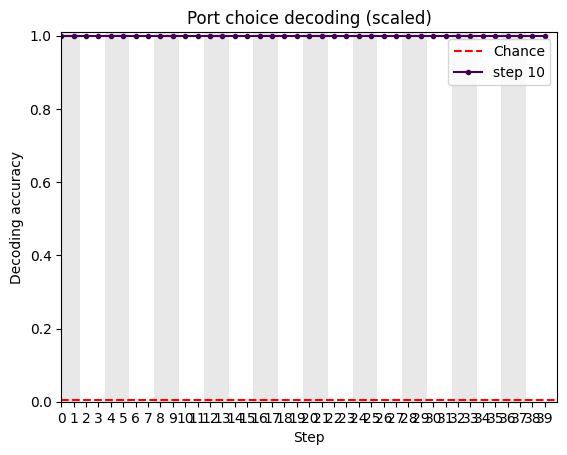

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, title='Port choice decoding (scaled)')
fig = plt.gcf()
# fig.savefig('./figs/full/choice_fold.png', dpi=300)

In [ ]:
A_choice = (action == layouts[:,0][:, np.newaxis]).astype(np.int64)

train_steps = [40,41]
scale = False
fold = False
accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, A_choice, layouts, train_steps=train_steps, T=None, fold_trials=fold, 
                                                                   scale=scale, exclude_batch_idxs=None, 
                                                                   by_port=False, n_class=Conf.port_dim, multi_class='ovr', 
                                                                   max_iter=1000, random_state=42)

(10000, 80, 1024) (10000, 80)
Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


100%|██████████| 80/80 [00:02<00:00, 39.22it/s]


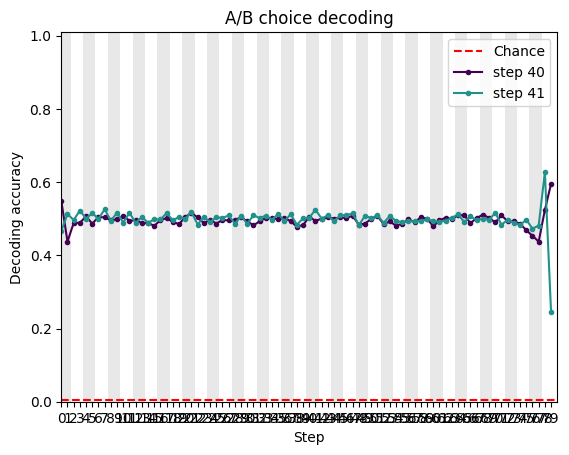

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, title='A/B choice decoding')
fig = plt.gcf()
# fig.savefig('./figs/full/choice_fold.png', dpi=300)

In [ ]:
from copy import copy

p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]

print(p_port[0, :10, :])
print(p_A[0, :10, :])

bin_edges = np.linspace(0.0, np.max(p_port), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
p_bins = np.digitize(p_port, bin_edges).squeeze()

np.unique(p_bins, return_counts=True)


[[0.7       ]
 [0.5746268 ]
 [0.6564767 ]
 [0.78087735]
 [0.51499474]
 [0.7083304 ]
 [0.56875205]
 [0.73713934]
 [0.8178882 ]
 [0.8522114 ]]
[[0.7       ]
 [0.42537317]
 [0.6564767 ]
 [0.78087735]
 [0.4850053 ]
 [0.29166958]
 [0.56875205]
 [0.73713934]
 [0.8178882 ]
 [0.8522114 ]]


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 array([  1108,   1053,   1252,    562,  29464,  88052,  72666,  73265,
        132577,      1]))

In [ ]:
p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
bin_edges = np.linspace(0.0, np.max(p_port), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_port, bin_edges).squeeze()

bins = np.repeat(bins, Conf.trial_len, axis=-1)

print(bins[1, :])

[7 7 6 6 7 7 8 8 9 9 9 9 9 9 9 9 6 6 8 8 9 9 9 9 9 9 9 9 9 9 6 6 7 7 8 8 9
 9 9 9 6 6 7 7 6 6 8 8 6 6 7 7 6 6 8 8 9 9 5 5 8 8 9 9 9 9 9 9 6 6 7 7 8 8
 9 9 6 6 8 8]


In [ ]:
from copy import copy

n_p_bins = 10

# bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
# bins = np.digitize(p_A, bin_edges).squeeze()

p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
bin_edges = np.linspace(0.0, np.max(p_port), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_port, bin_edges).squeeze()

bins = np.repeat(bins, Conf.trial_len, axis=-1)

action_p = action * n_p_bins + bins

train_steps = np.arange(60,62)
scale = True
fold = False
accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, action_p, layouts, train_steps=train_steps, T=None, fold_trials=fold, 
                                                                   scale=scale, exclude_batch_idxs=None, 
                                                                   by_port=False, n_class=Conf.port_dim * n_p_bins, multi_class='ovr', 
                                                                   max_iter=1000, random_state=42)

(10000, 80, 1024) (10000, 80)


/Users/jo/notebooks_paper/analysis/decoder/functions.py:430: RuntimeWarning: invalid value encountered in divide
  hiddens_train_scaled = (hiddens_train - mean) / std
/Users/jo/notebooks_paper/analysis/decoder/functions.py:431: RuntimeWarning: divide by zero encountered in divide
  hiddens_test_scaled = (hiddens_test - mean) / std
/Users/jo/notebooks_paper/analysis/decoder/functions.py:431: RuntimeWarning: invalid value encountered in divide
  hiddens_test_scaled = (hiddens_test - mean) / std


Finished scaling.
Train/test:	(8000, 80, 968),	(2000, 80, 968)
Folded:		(8000, 2, 968)


100%|██████████| 2/2 [02:55<00:00, 87.73s/it]
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered 

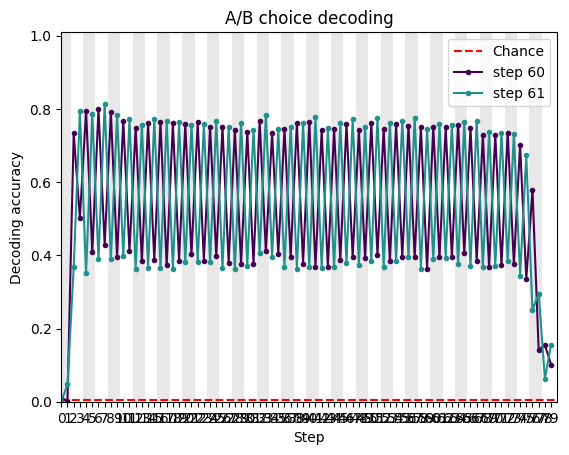

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, title='A/B choice decoding')
fig = plt.gcf()
# fig.savefig('./figs/full/choice_fold.png', dpi=300)

[  0 113   0   0 113 113   0   0   0   0   0   0   0   0   0   0   0 113
 113   0]
[  0   0 113   0   0 113 113   0   0   0   0   0   0   0   0   0   0   0
 113 113]
[False  True  True False  True False  True False False False False False
 False False False False False  True False  True]


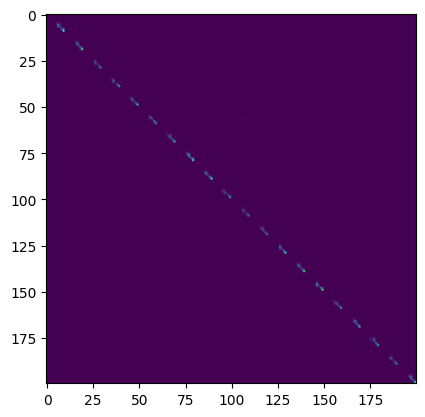

In [ ]:
plt.imshow(np.sum(conf_mats[0][::2], axis=0)[:200, :200])

In [ ]:
s=1
idxs = np.where(np.sum(conf_mats[s][s::2], axis=0))
true_p = idxs[0] % n_p_bins
pred_p = idxs[1] % n_p_bins

print(np.sum(true_p == pred_p) / len(true_p))

0.30764401192905355


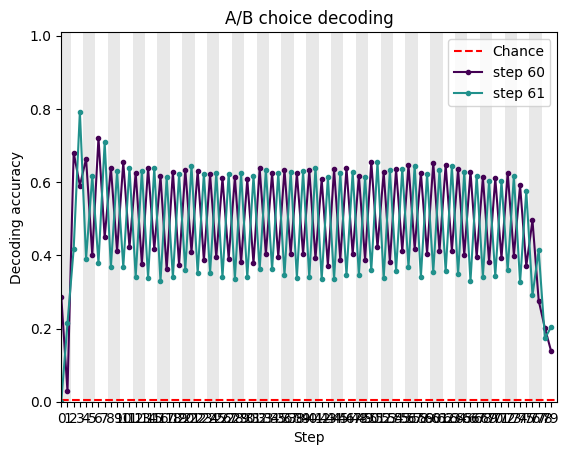

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, title='A/B choice decoding')
fig = plt.gcf()
# fig.savefig('./figs/full/choice_fold.png', dpi=300)

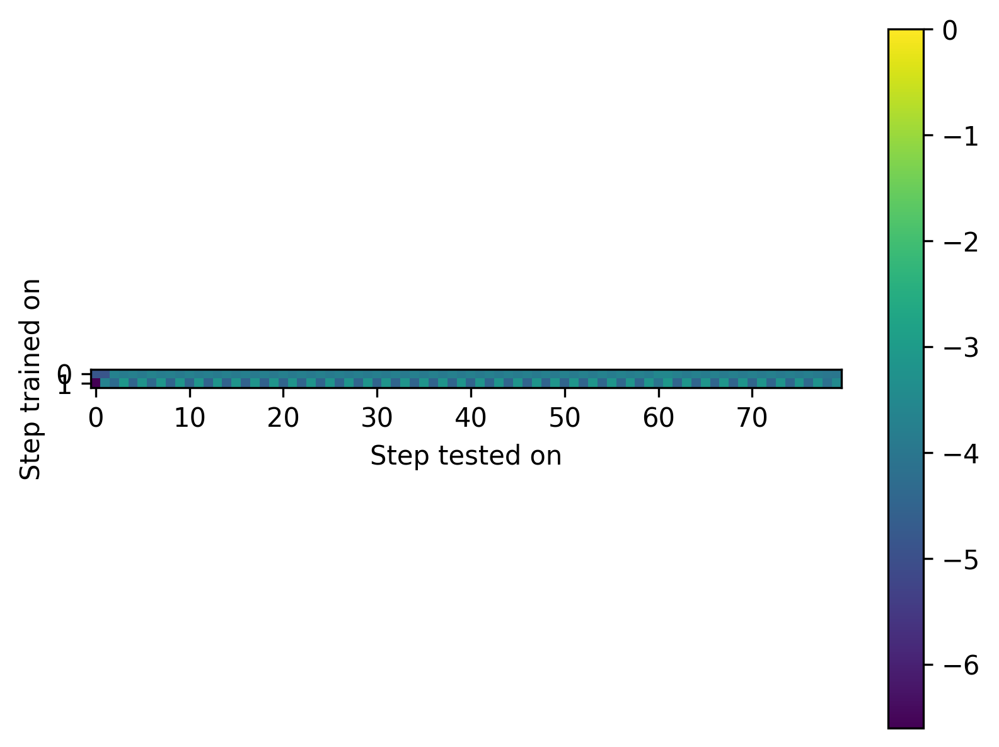

In [ ]:
plt.figure(dpi=300)
plt.imshow(np.array(losses_train), vmax=0)
plt.xlabel('Step tested on')
plt.xticks(np.arange(0, 80, 10), np.arange(0, 80, 10))
# plt.yticks(np.arange(len(train_steps))[10::10]-train_steps[0], np.arange(len(train_steps))[10::10])
plt.ylabel('Step trained on')
plt.colorbar()
# plt.savefig('./figs/full/choice_accs_mat.png', dpi=300)

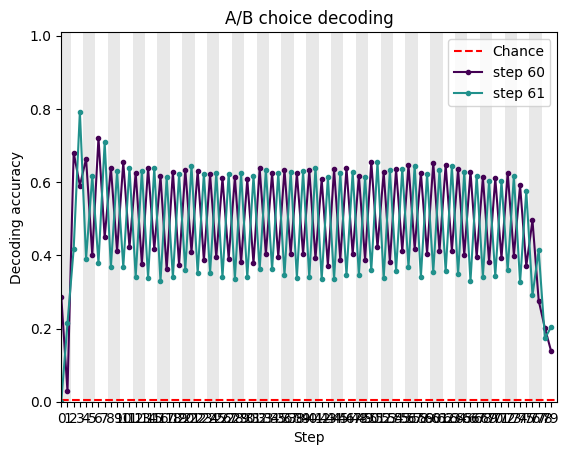

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, title='A/B choice decoding')
fig = plt.gcf()
# fig.savefig('./figs/full/choice_fold.png', dpi=300)

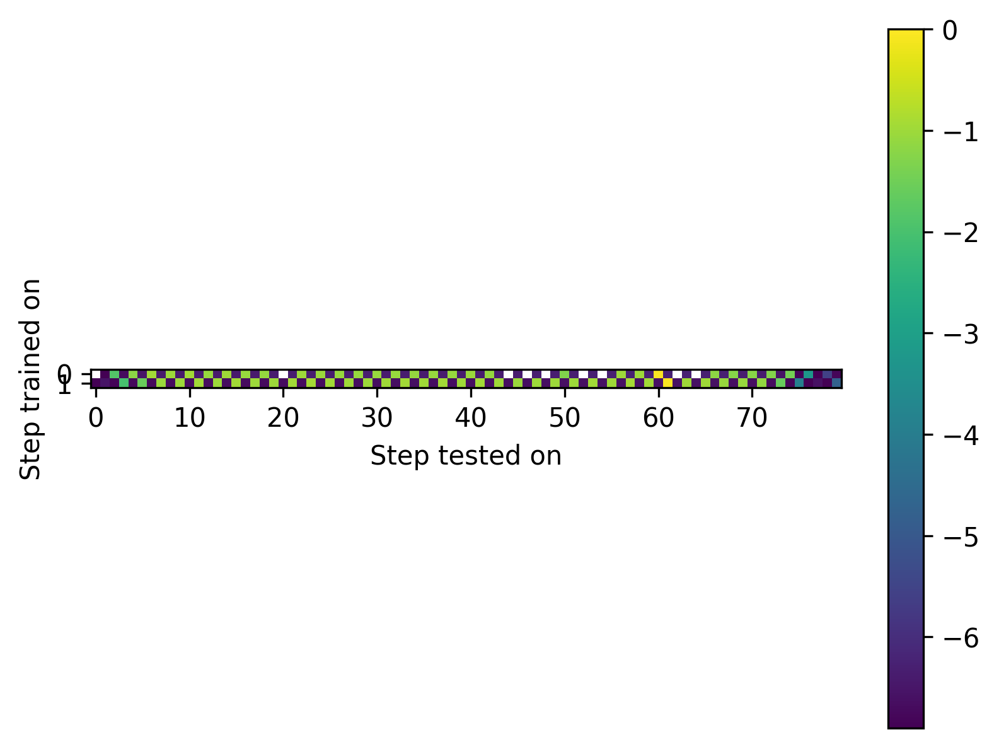

In [ ]:
plt.figure(dpi=300)
plt.imshow(np.array(losses_train), vmax=0)
plt.xlabel('Step tested on')
plt.xticks(np.arange(0, 80, 10), np.arange(0, 80, 10))
# plt.yticks(np.arange(len(train_steps))[10::10]-train_steps[0], np.arange(len(train_steps))[10::10])
plt.ylabel('Step trained on')
plt.colorbar()
# plt.savefig('./figs/full/choice_accs_mat.png', dpi=300)

#### Scaled

In [ ]:
from functions import *

In [ ]:
print(action[0,:20])
print(not_action[0,:20])

[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0
   0   0]
[113 113   0   0 113 113 113 113   0   0   0   0 113 113 113 113 113 113
 113 113]


In [ ]:

X = hiddens_train_scaled[:, train_step, :][switches_train[:, step]]
y = targets_train[:, train_step][switches_train[:, step]]

print(X.shape)

(3995, 968)


In [679]:
n_p_bins = 10

# bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
# bins = np.digitize(p_A, bin_edges).squeeze()

p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
bin_edges = np.linspace(0.0, 1.0, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_port, bin_edges).squeeze()
not_bins = np.digitize(1-p_port, bin_edges).squeeze()

bins = np.repeat(bins, Conf.trial_len, axis=-1)
not_bins = np.repeat(not_bins, Conf.trial_len, axis=-1)

action_p = action * n_p_bins + bins
not_action_p = not_action * n_p_bins + not_bins

In [680]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

train_step = 60
scale = True

# start, end = 10, -10

switches = get_switches(action)

hiddens_train, hiddens_test, targets_train, targets_test, \
    switches_train, switches_test, targets_train_, targets_test_ = train_test_split(hiddens, not_action_p, switches, action_p, test_size=0.2, random_state=40)

if scale:
    mean = np.mean(hiddens_train, axis=(0,1))
    std = np.mean(hiddens_train, axis=(0,1))
    if mean.shape[-1] != hiddens_train.shape[-1]:
        raise ValueError('Mean shape must match X_train shape')
    
    hiddens_train_scaled = (hiddens_train - mean) / std
    hiddens_test_scaled = (hiddens_test - mean) / std

    nan_idxs = np.where(np.any(np.isnan(hiddens_train_scaled)==False, axis=(0,1)))[0]
    hiddens_train_scaled = hiddens_train_scaled[:,:,nan_idxs]
    hiddens_test_scaled = hiddens_test_scaled[:,:,nan_idxs]
else:
    hiddens_train_scaled = hiddens_train
    hiddens_test_scaled = hiddens_test

X = hiddens_train_scaled[:, train_step, :][~switches_train[:, train_step]]
y = targets_train[:, train_step][~switches_train[:, train_step]]

model = LogisticRegression(solver='lbfgs', class_weight='balanced', multi_class='ovr', max_iter=10000, random_state=40)
model.fit(X, y)

class_idxs = np.unique(y)

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1439626525.py:20: RuntimeWarning: invalid value encountered in divide
  hiddens_train_scaled = (hiddens_train - mean) / std
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1439626525.py:21: RuntimeWarning: invalid value encountered in divide
  hiddens_test_scaled = (hiddens_test - mean) / std


In [681]:
from sklearn.metrics import accuracy_score, confusion_matrix

accuracies, accuracies_switch, accuracies_non_switch = [], [], []
losses, losses_switch, losses_non_switch = np.zeros(targets_train.shape[1]), np.zeros(targets_train.shape[1]), np.zeros(targets_train.shape[1])
for step in range(targets_train.shape[1]):
    X = hiddens_test_scaled[:, step, :]
    y = targets_test[:, step]
    
    y_pred = model.predict(X)

    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies.append(accuracy)

    p_train = model.predict_log_proba(X)
    sparse_idxs = class_idxs
    p_train_sparse = np.nan * np.zeros((p_train.shape[0], n_p_bins * Conf.port_dim))
    p_train_sparse[:, sparse_idxs] = p_train
                                      
    idxs = (np.arange(p_train.shape[0]), y)
    losses[step] = np.nanmean(p_train_sparse[idxs])

    X = hiddens_test_scaled[:, step, :][switches_test[:, step]]
    y = targets_test[:, step][switches_test[:, step]]
    print(X.shape, y.shape)
    
    if len(y):
        y_pred = model.predict(X)
        # Evaluate the model
        accuracy = accuracy_score(y, y_pred)
        accuracies_switch.append(accuracy)

        p_train = model.predict_log_proba(X)
        sparse_idxs = class_idxs
        p_train_sparse = np.nan * np.zeros((p_train.shape[0], n_p_bins * Conf.port_dim))
        p_train_sparse[:, sparse_idxs] = p_train
                                      
        idxs = (np.arange(p_train.shape[0]), y)
        losses_switch[step] = np.nanmean(p_train_sparse[idxs])
    else:
        accuracies_switch.append(np.nan)

    X = hiddens_test_scaled[:, step, :][~switches_test[:, step]]
    y = targets_test[:, step][~switches_test[:, step]]
    print(X.shape, y.shape)
    
    if len(y):
        y_pred = model.predict(X)
        # Evaluate the model
        accuracy = accuracy_score(y, y_pred)
        accuracies_non_switch.append(accuracy)

        p_train = model.predict_log_proba(X)
        sparse_idxs = class_idxs
        p_train_sparse = np.nan * np.zeros((p_train.shape[0], n_p_bins * Conf.port_dim))
        p_train_sparse[:, sparse_idxs] = p_train
                                      
        idxs = (np.arange(p_train.shape[0]), y)
        losses_non_switch[step] = np.nanmean(p_train_sparse[idxs])
    else:
        accuracies_non_switch.append(np.nan)

/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:21: RuntimeWarning: Mean of empty slice
  losses[step] = np.nanmean(p_train_sparse[idxs])
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:59: RuntimeWarning: Mean of empty slice
  losses_non_switch[step] = np.nanmean(p_train_sparse[idxs])
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:21: RuntimeWarning: Mean of empty slice
  losses[step] = np.nanmean(p_train_sparse[idxs])


(0, 969) (0,)
(2000, 969) (2000,)
(0, 969) (0,)
(2000, 969) (2000,)


/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:59: RuntimeWarning: Mean of empty slice
  losses_non_switch[step] = np.nanmean(p_train_sparse[idxs])


(822, 969) (822,)
(1178, 969) (1178,)
(822, 969) (822,)
(1178, 969) (1178,)
(418, 969) (418,)
(1582, 969) (1582,)


/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:39: RuntimeWarning: Mean of empty slice
  losses_switch[step] = np.nanmean(p_train_sparse[idxs])
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/1847157978.py:39: RuntimeWarning: Mean of empty slice
  losses_switch[step] = np.nanmean(p_train_sparse[idxs])


(418, 969) (418,)
(1582, 969) (1582,)
(592, 969) (592,)
(1408, 969) (1408,)
(592, 969) (592,)
(1408, 969) (1408,)
(661, 969) (661,)
(1339, 969) (1339,)
(661, 969) (661,)
(1339, 969) (1339,)
(625, 969) (625,)
(1375, 969) (1375,)
(625, 969) (625,)
(1375, 969) (1375,)
(664, 969) (664,)
(1336, 969) (1336,)
(664, 969) (664,)
(1336, 969) (1336,)
(661, 969) (661,)
(1339, 969) (1339,)
(661, 969) (661,)
(1339, 969) (1339,)
(671, 969) (671,)
(1329, 969) (1329,)
(671, 969) (671,)
(1329, 969) (1329,)
(753, 969) (753,)
(1247, 969) (1247,)
(753, 969) (753,)
(1247, 969) (1247,)
(682, 969) (682,)
(1318, 969) (1318,)
(682, 969) (682,)
(1318, 969) (1318,)
(653, 969) (653,)
(1347, 969) (1347,)
(653, 969) (653,)
(1347, 969) (1347,)
(613, 969) (613,)
(1387, 969) (1387,)
(613, 969) (613,)
(1387, 969) (1387,)
(674, 969) (674,)
(1326, 969) (1326,)
(674, 969) (674,)
(1326, 969) (1326,)
(662, 969) (662,)
(1338, 969) (1338,)
(662, 969) (662,)
(1338, 969) (1338,)
(679, 969) (679,)
(1321, 969) (1321,)
(679, 969) (

/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(638, 969) (638,)
(1362, 969) (1362,)
(638, 969) (638,)
(1362, 969) (1362,)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(670, 969) (670,)
(1330, 969) (1330,)
(670, 969) (670,)
(1330, 969) (1330,)
(667, 969) (667,)
(1333, 969) (1333,)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(667, 969) (667,)
(1333, 969) (1333,)
(707, 969) (707,)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(1293, 969) (1293,)
(707, 969) (707,)
(1293, 969) (1293,)
(694, 969) (694,)
(1306, 969) (1306,)
(694, 969) (694,)
(1306, 969) (1306,)
(690, 969) (690,)
(1310, 969) (1310,)
(690, 969) (690,)
(1310, 969) (1310,)
(676, 969) (676,)
(1324, 969) (1324,)
(676, 969) (676,)
(1324, 969) (1324,)
(669, 969) (669,)
(1331, 969) (1331,)
(669, 969) (669,)
(1331, 969) (1331,)
(674, 969) (674,)
(1326, 969) (1326,)
(674, 969) (674,)
(1326, 969) (1326,)
(663, 969) (663,)
(1337, 969) (1337,)
(663, 969) (663,)
(1337, 969) (1337,)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(652, 969) (652,)
(1348, 969) (1348,)
(652, 969) (652,)
(1348, 969) (1348,)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1407: RuntimeWarning: divide by zero encountered in log
  return np.log(self.predict_proba(X))


(678, 969) (678,)
(1322, 969) (1322,)
(678, 969) (678,)
(1322, 969) (1322,)
(661, 969) (661,)
(1339, 969) (1339,)
(661, 969) (661,)
(1339, 969) (1339,)
(689, 969) (689,)
(1311, 969) (1311,)
(689, 969) (689,)
(1311, 969) (1311,)
(670, 969) (670,)
(1330, 969) (1330,)
(670, 969) (670,)
(1330, 969) (1330,)
(676, 969) (676,)
(1324, 969) (1324,)
(676, 969) (676,)
(1324, 969) (1324,)
(652, 969) (652,)
(1348, 969) (1348,)
(652, 969) (652,)
(1348, 969) (1348,)
(658, 969) (658,)
(1342, 969) (1342,)
(658, 969) (658,)
(1342, 969) (1342,)
(1009, 969) (1009,)
(991, 969) (991,)
(1009, 969) (1009,)
(991, 969) (991,)


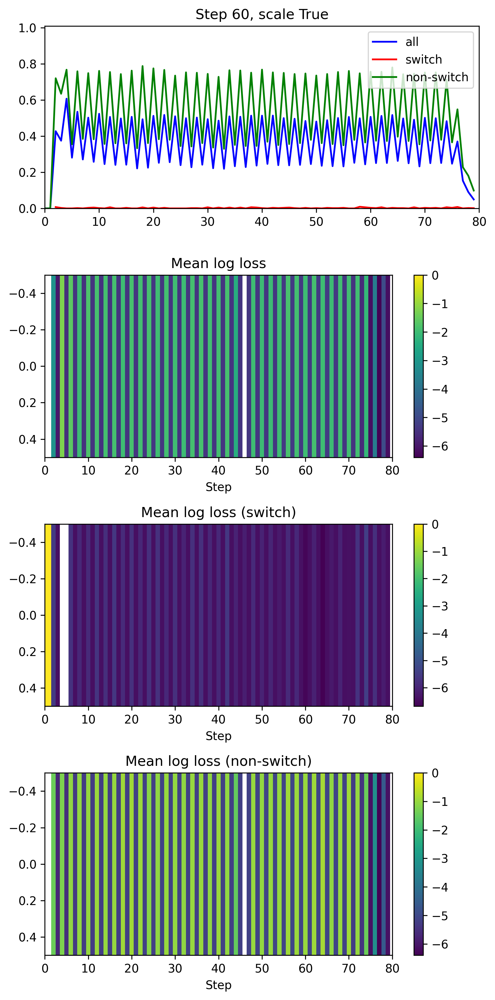

In [682]:
fig, axes = plt.subplots(4,1, figsize=(6, 12), dpi=300)

axes[0].plot(accuracies, c='b', label='all')
axes[0].plot(accuracies_switch, c='r', label='switch')
axes[0].plot(accuracies_non_switch, c='g', label='non-switch')
axes[0].set_title(f'Step {train_step}, scale {scale}')
axes[0].set_xlim(0,80)
axes[0].set_ylim(0,1.01)
axes[0].legend()

im = axes[1].imshow(losses[None,:], aspect='auto', vmax=0)
axes[1].set_title('Mean log loss')
axes[1].set_xlabel('Step')
axes[1].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[1])

im = axes[2].imshow(losses_switch[None,:], aspect='auto', vmax=0)
axes[2].set_title('Mean log loss (switch)')
axes[2].set_xlabel('Step')
axes[2].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[2])

im = axes[3].imshow(losses_non_switch[None,:], aspect='auto', vmax=0)
axes[3].set_title('Mean log loss (non-switch)')
axes[3].set_xlabel('Step')
axes[3].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[3])
plt.tight_layout()

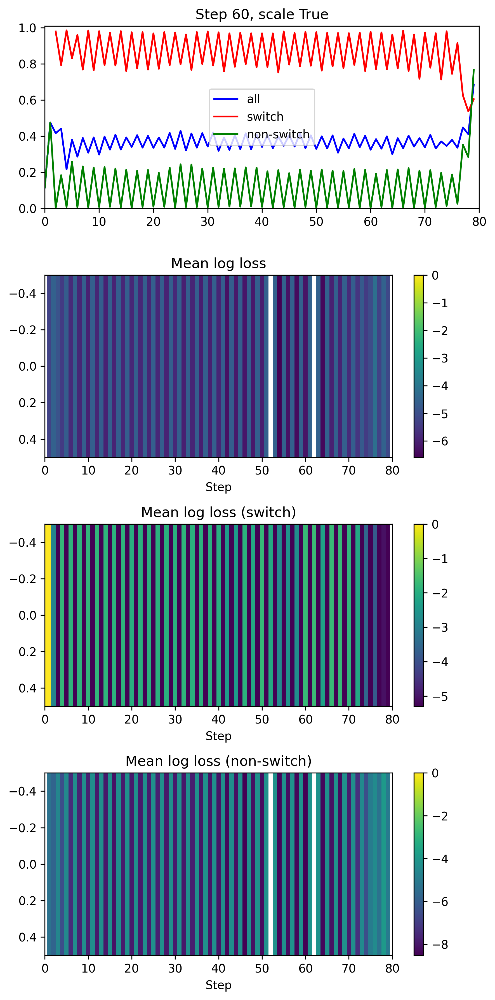

In [645]:
fig, axes = plt.subplots(4,1, figsize=(6, 12), dpi=300)

axes[0].plot(accuracies, c='b', label='all')
axes[0].plot(accuracies_switch, c='r', label='switch')
axes[0].plot(accuracies_non_switch, c='g', label='non-switch')
axes[0].set_title(f'Step {train_step}, scale {scale}')
axes[0].set_xlim(0,80)
axes[0].set_ylim(0,1.01)
axes[0].legend()

im = axes[1].imshow(losses[None,:], aspect='auto', vmax=0)
axes[1].set_title('Mean log loss')
axes[1].set_xlabel('Step')
axes[1].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[1])

im = axes[2].imshow(losses_switch[None,:], aspect='auto', vmax=0)
axes[2].set_title('Mean log loss (switch)')
axes[2].set_xlabel('Step')
axes[2].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[2])

im = axes[3].imshow(losses_non_switch[None,:], aspect='auto', vmax=0)
axes[3].set_title('Mean log loss (non-switch)')
axes[3].set_xlabel('Step')
axes[3].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[3])
plt.tight_layout()

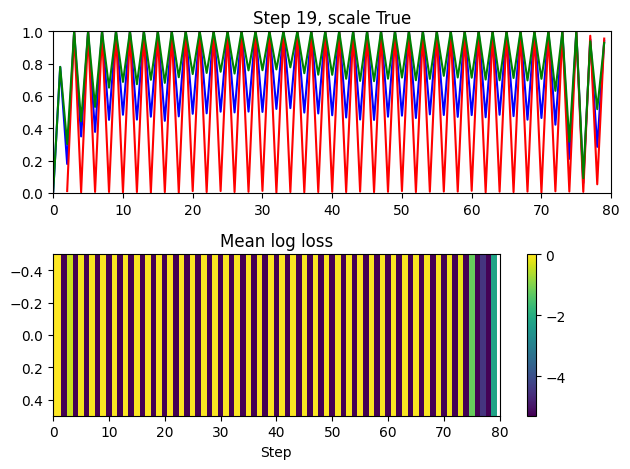

In [ ]:
fig, axes = plt.subplots(2,1)

axes[0].plot(accuracies, c='b')
axes[0].plot(accuracies_switch, c='r')
axes[0].plot(accuracies_non_switch, c='g')
axes[0].set_title(f'Step {train_step}, scale {scale}')
axes[0].set_xlim(0,80)
axes[0].set_ylim(0,1)

im = axes[1].imshow(losses[None,:], aspect='auto', vmax=0)
axes[1].set_title('Mean log loss')
axes[1].set_xlabel('Step')
axes[1].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[1])
plt.tight_layout()

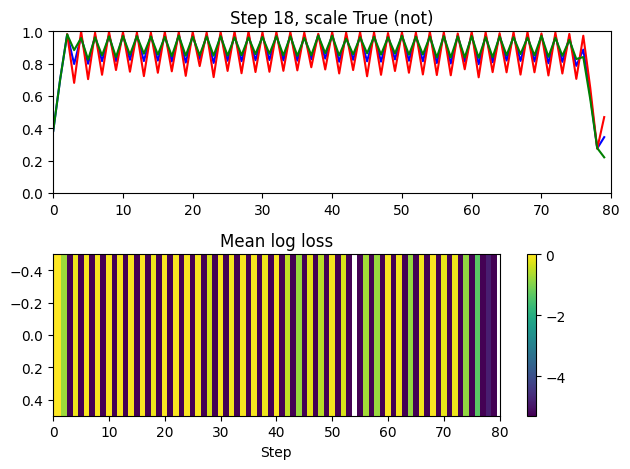

In [ ]:
fig, axes = plt.subplots(2,1)

axes[0].plot(accuracies, c='b')
axes[0].plot(accuracies_switch, c='r')
axes[0].plot(accuracies_non_switch, c='g')
axes[0].set_title(f'Step {train_step}, scale {scale} (not)')
axes[0].set_xlim(0,80)
axes[0].set_ylim(0,1)

im = axes[1].imshow(losses[None,:], aspect='auto', vmax=0)
axes[1].set_title('Mean log loss')
axes[1].set_xlabel('Step')
axes[1].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[1])
plt.tight_layout()

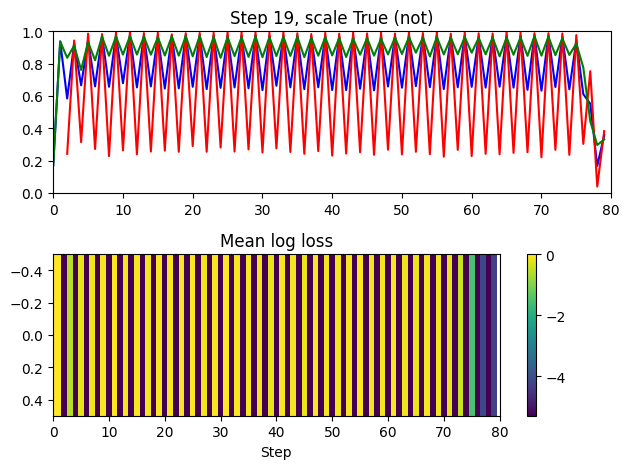

In [ ]:
fig, axes = plt.subplots(2,1)

axes[0].plot(accuracies, c='b')
axes[0].plot(accuracies_switch, c='r')
axes[0].plot(accuracies_non_switch, c='g')
axes[0].set_title(f'Step {train_step}, scale {scale} (not)')
axes[0].set_xlim(0,80)
axes[0].set_ylim(0,1)

im = axes[1].imshow(losses[None,:], aspect='auto', vmax=0)
axes[1].set_title('Mean log loss')
axes[1].set_xlabel('Step')
axes[1].set_xlim(0, 80)

cbar = fig.colorbar(im, ax=axes[1])
plt.tight_layout()

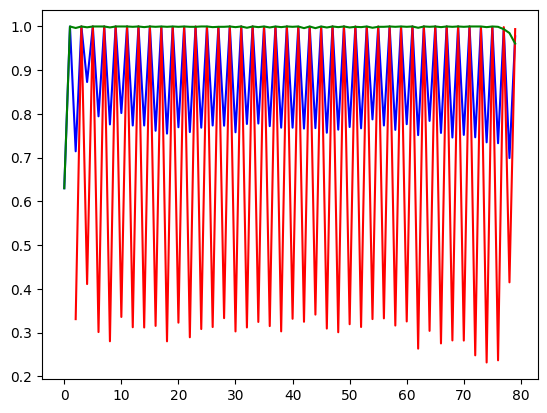

In [ ]:
plt.plot(accuracies, c='b')
plt.plot(accuracies_switch, c='r')
plt.plot(accuracies_non_switch, c='g')

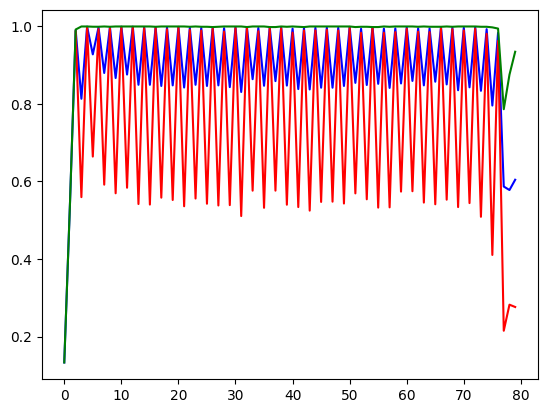

In [ ]:
plt.plot(accuracies, c='b')
plt.plot(accuracies_switch, c='r')
plt.plot(accuracies_non_switch, c='g')

In [ ]:
plt.plot(accuracies, c='b')
plt.plot(accuracies_switch, c='r')
plt.plot(accuracies_non_switch, c='g')

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

for train_step in [18, 19]:
    for scale in [False, True]:
# step = 19
# scale = False

# start, end = 10, -10

        switches = get_switches(action)

        hiddens_train, hiddens_test, targets_train, targets_test, switches_train, switches_test = train_test_split(hiddens, action, switches, test_size=0.2, random_state=42)

        if scale:
            mean = np.mean(hiddens_train, axis=(0,1))
            std = np.mean(hiddens_train, axis=(0,1))
            if mean.shape[-1] != hiddens_train.shape[-1]:
                raise ValueError('Mean shape must match X_train shape')
            
            hiddens_train_scaled = (hiddens_train - mean) / std
            hiddens_test_scaled = (hiddens_test - mean) / std

            nan_idxs = np.where(np.any(np.isnan(hiddens_train_scaled)==False, axis=(0,1)))[0]
            hiddens_train_scaled = hiddens_train_scaled[:,:,nan_idxs]
            hiddens_test_scaled = hiddens_test_scaled[:,:,nan_idxs]
        else:
            hiddens_train_scaled = hiddens_train
            hiddens_test_scaled = hiddens_test

        X = hiddens_train_scaled[:, train_step, :]
        y = targets_train[:, train_step]

        model = LogisticRegression(solver='lbfgs', class_weight='balanced', multi_class='ovr', max_iter=1000, random_state=41)
        model.fit(X, y)

        print('Fit')

        ###
        losses_test = np.zeros((1,targets_train.shape[1]))
        accuracies, accuracies_switch, accuracies_non_switch = [], [], []
        for step in range(targets_train.shape[1]):
            X = hiddens_test_scaled[:, step, :]
            y = targets_test[:, step]
            
            y_pred = model.predict(X)

            # Evaluate the model
            accuracy = accuracy_score(y, y_pred)
            accuracies.append(accuracy)

            p_test = model.predict_log_proba(X)
            losses_test[:, step] = np.nanmean(p_test)

            X = hiddens_test_scaled[:, step, :][switches_test[:, step]]
            y = targets_test[:, step][switches_test[:, step]]
            # print(X.shape, y.shape)
            
            if len(y):
                y_pred = model.predict(X)
                # Evaluate the model
                accuracy = accuracy_score(y, y_pred)
                accuracies_switch.append(accuracy)
            else:
                accuracies_switch.append(np.nan)

            X = hiddens_test_scaled[:, step, :][~switches_test[:, step]]
            y = targets_test[:, step][~switches_test[:, step]]
            
            if len(y):
                y_pred = model.predict(X)
                # Evaluate the model
                accuracy = accuracy_score(y, y_pred)
                accuracies_non_switch.append(accuracy)
            else:
                accuracies_non_switch.append(np.nan)

        fig, axes = plt.subplots(2,1)
        axes[0].plot(accuracies, c='b')
        axes[0].plot(accuracies_switch, c='r')
        axes[0].plot(accuracies_non_switch, c='g')

        im = axes[1].imshow(np.array(losses_test), vmax=0)
        axes[1].set_xlabel('Step tested on')
        axes[1].set_xticks(np.arange(0, 80, 10), np.arange(0, 80, 10))
        # plt.yticks(np.arange(len(train_steps))[10::10]-train_steps[0], np.arange(len(train_steps))[10::10])
        axes[1].set_ylabel('Step trained on')

        # Add colorbar
        cbar = fig.colorbar(im, ax=axes[1])

        plt.show()


In [ ]:
for i, n in enumerate(hist_range):
    action_ = np.zeros_like(action)
    if n == 0:
        action_ = action
    elif n < 0:
        action_[:, :n] = action[:, -n:]
    elif n > 0:
        action_[:, n:] = action[:, :-n]

    print(n)
    print(action[0,:18])
    print(action_[0,:18])

-6
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[  0   0 113 113 113 113   0   0   0   0   0   0   0   0   0   0   0   0]
-5
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[  0   0   0 113 113 113 113   0   0   0   0   0   0   0   0   0   0   0]
-4
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[  0   0   0   0 113 113 113 113   0   0   0   0   0   0   0   0   0   0]
-3
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[113   0   0   0   0 113 113 113 113   0   0   0   0   0   0   0   0   0]
-2
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0   0   0]
-1
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[  0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0   0]
0
[  0   0 113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0]
[  0   0 113 113  

In [ ]:
acc_means_ = np.zeros((acc_means.shape[0]+2, acc_means.shape[1], acc_means.shape[2]))
acc_means_[:-2, :, :] = acc_means
hist_range = np.arange(5,7)
hist_range

array([5, 6])

In [ ]:
acc_means_old = acc_means
acc_means_old

array([[[0.50531667, 0.46338333, 0.        ],
        [0.41073333, 0.51118333, 0.        ]],

       [[0.55918333, 0.48248333, 0.        ],
        [0.4097    , 0.51118333, 0.        ]],

       [[0.55645   , 0.5126    , 0.        ],
        [0.4601    , 0.55058333, 0.        ]],

       [[0.6032    , 0.53353333, 0.        ],
        [0.4744    , 0.55058333, 0.        ]],

       [[0.6032    , 0.56316667, 0.        ],
        [0.4993    , 0.60015   , 0.        ]],

       [[0.99698333, 0.61906667, 0.        ],
        [0.55198333, 0.60015   , 0.        ]],

       [[0.99698333, 0.84851667, 0.        ],
        [0.4809    , 0.9996    , 0.        ]],

       [[0.99926667, 0.67378333, 0.        ],
        [0.48065   , 0.9996    , 0.        ]],

       [[0.99926667, 0.91838333, 0.        ],
        [0.99223333, 0.99866667, 0.        ]],

       [[0.8437    , 0.83105   , 0.        ],
        [0.67066667, 0.99866667, 0.        ]],

       [[0.8437    , 0.6885    , 0.        ],
        [0.707

In [ ]:
start, end = 10, -10
hist_range = np.arange(-1,2)
acc_means = np.zeros((len(hist_range), 2, 3))

for i, n in enumerate(hist_range):
    action_ = np.zeros_like(action)
    if n == 0:
        action_ = action
    elif n < 0:
        action_[:, :n] = action[:, -n:]
    elif n > 0:
        action_[:, n:] = action[:, :-n]

    train_steps = np.arange(18,20)
    scale = False
    accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, action_, layouts, train_steps=train_steps, T=None, fold_trials=False, 
                                                                    scale=scale, exclude_batch_idxs=None, 
                                                                    by_port=False, n_class=Conf.port_dim, multi_class='ovr', 
                                                                    max_iter=1000, random_state=41)
    
    for decoder_id, acc in enumerate(accs):
        acc_means[i, decoder_id, 0] = np.mean(acc[start:end][::2])
        acc_means[i, decoder_id, 1] = np.mean(acc[start:end][1::2])

        print(acc_means)

(10000, 80, 1024) (10000, 80)
Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


100%|██████████| 2/2 [00:28<00:00, 14.42s/it]


[[[0.94963333 0.65036667 0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]]
[[[0.94963333 0.65036667 0.        ]
  [0.73268333 0.65995    0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]]
(10000, 80, 1024) (10000, 80)
Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


100%|██████████| 2/2 [00:25<00:00, 12.86s/it]


[[[0.94963333 0.65036667 0.        ]
  [0.73268333 0.65995    0.        ]]

 [[0.94963333 0.87658333 0.        ]
  [0.         0.         0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]]
[[[0.94963333 0.65036667 0.        ]
  [0.73268333 0.65995    0.        ]]

 [[0.94963333 0.87658333 0.        ]
  [0.77356667 0.99966667 0.        ]]

 [[0.         0.         0.        ]
  [0.         0.         0.        ]]]
(10000, 80, 1024) (10000, 80)
Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


100%|██████████| 2/2 [00:24<00:00, 12.35s/it]


[[[0.94963333 0.65036667 0.        ]
  [0.73268333 0.65995    0.        ]]

 [[0.94963333 0.87658333 0.        ]
  [0.77356667 0.99966667 0.        ]]

 [[0.99951667 0.68838333 0.        ]
  [0.         0.         0.        ]]]
[[[0.94963333 0.65036667 0.        ]
  [0.73268333 0.65995    0.        ]]

 [[0.94963333 0.87658333 0.        ]
  [0.77356667 0.99966667 0.        ]]

 [[0.99951667 0.68838333 0.        ]
  [0.89206667 0.99966667 0.        ]]]


In [ ]:
choice_arg = np.argmax(choices[:,:,Conf.x_dim + Conf.r_dim:][:, Conf.ab_choice_step::Conf.trial_len], axis=-1)
# Turn action array into 1's if element in row equals max in row
print(choice_arg.shape)

(10000, 40)


In [ ]:
current_choice, last_choice = np.zeros_like(choice_arg), np.zeros_like(choice_arg)

current_choice = choice_arg
last_choice[:, 1:] = choice_arg[:, :-1]
switch = current_choice != last_choice

switch_repeat = np.repeat(switch, Conf.trial_len, axis=-1)
print(current_choice[0, :20])
print(last_choice[0, :20])
print(switch[0, :20])

idxs = np.where(switch)

step_0_switches = hiddens[:, ::2, :][idxs]
step_1_switches = hiddens[:, 1::2, :][idxs]


[  0 113   0   0 113 113   0   0   0   0   0   0   0   0   0   0   0 113
 113   0]
[  0   0 113   0   0 113 113   0   0   0   0   0   0   0   0   0   0   0
 113 113]
[False  True  True False  True False  True False False False False False
 False False False False False  True False  True]


In [ ]:
def get_switches(arr):
    switch_ = np.zeros_like(arr[:, ::2]).astype(bool)
    switch_[:, 1:] = arr[:, ::2][:, 1:] != arr[:,::2][:, :-1]

    return np.repeat(switch_, Conf.trial_len, axis=-1)

a = get_switches(action)
print(a.dtype)

bool


/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/3912919551.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


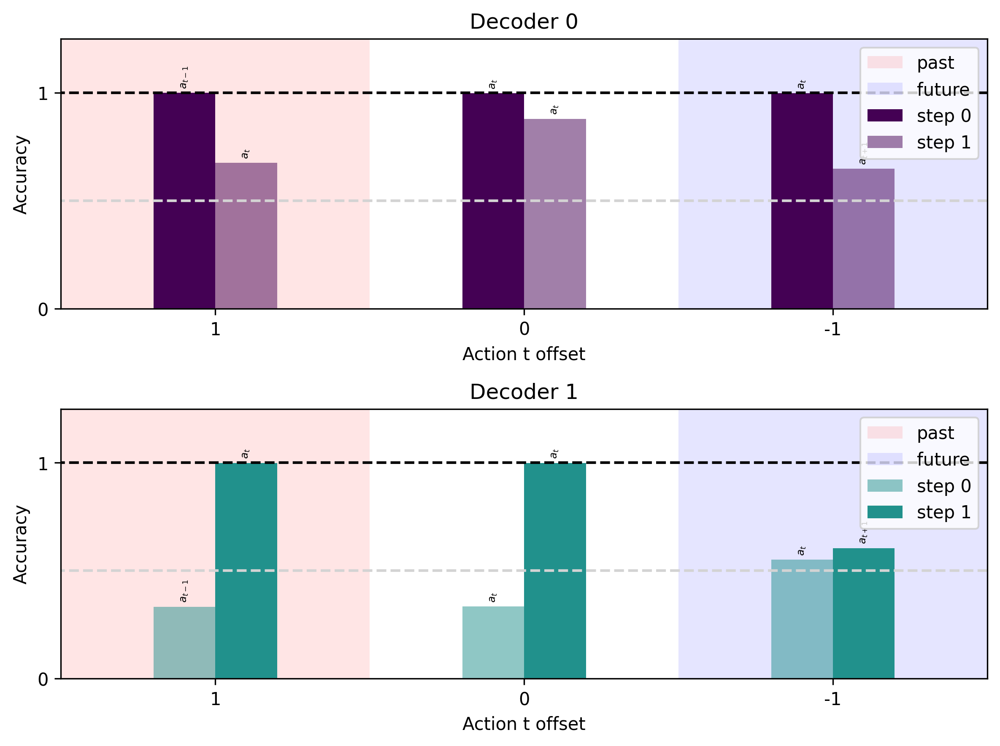

In [ ]:
# fig, axes = plt.subplots(2,2)

cmap = plt.cm.get_cmap('viridis')

fig, axes = plt.subplots(2, 1, figsize=(8, 6), dpi=300)

ticks = [f't-{offset//2}' for offset in hist_range]
for decoder in range(2):
    ax = axes[decoder]
    ax.axvspan(0.5, hist_range[-1]+0.5, facecolor='r', alpha=0.1, label='past')
    ax.axvspan(-0.5, -hist_range[-1]-0.5, facecolor='b', alpha=0.1, label='future')
    ax.hlines(1.0, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='k')
    ax.hlines(0.5, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='lightgrey')

    for step in range(2):
        offset = np.abs(step-1)
        color = cmap(decoder / 2)
        alpha = 1.0 if step == decoder else 0.5

        for h, a in zip(hist_range, acc_means[:, decoder, step]):
            # ax.text(h, o, f'{o:.2f}', ha='center', va='bottom', fontsize=8, color=color)
            # alpha = 1 - ((h-min(hist_range))//2)/(max(hist_range) - min(hist_range))
            # ax.bar(h - 0.1 + offset * 0.2, a, width=0.2, color=color, alpha=alpha)
            # a = acc_means[i, decoder, step]
            lbl = -(h-step)//2 if -(h-step)//2!=0 else ""
            string = rf'$a_{{t{"+" if -(h-step)//2 > 0 else ""}{lbl}}}$'
            ax.annotate(string, xy=(h-0.1 + offset * 0.2, a), xytext=(h - 0.1 + offset * 0.2, a+0.02), rotation=90, fontsize=6, ha='center', va='bottom')

        ax.bar(hist_range - 0.1 + offset * 0.2, acc_means[:, decoder, step], width=0.2, color=color, alpha=alpha, label=f'step {step}')
        
    ax.set_title(f'Decoder {decoder}')
    ax.set_ylim([0, 1.25])
    ax.set_yticks([0, 1], [0, 1])
    ax.set_ylabel('Accuracy')
    ax.set_xlabel('Action t offset')
    ax.set_xticks(hist_range)
    ax.set_xticklabels(hist_range, rotation=0)
    ax.set_xlim([hist_range[0]-0.5, hist_range[-1]+0.5])
    ax.invert_xaxis()
    ax.legend()

    
plt.tight_layout()

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/3912919551.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


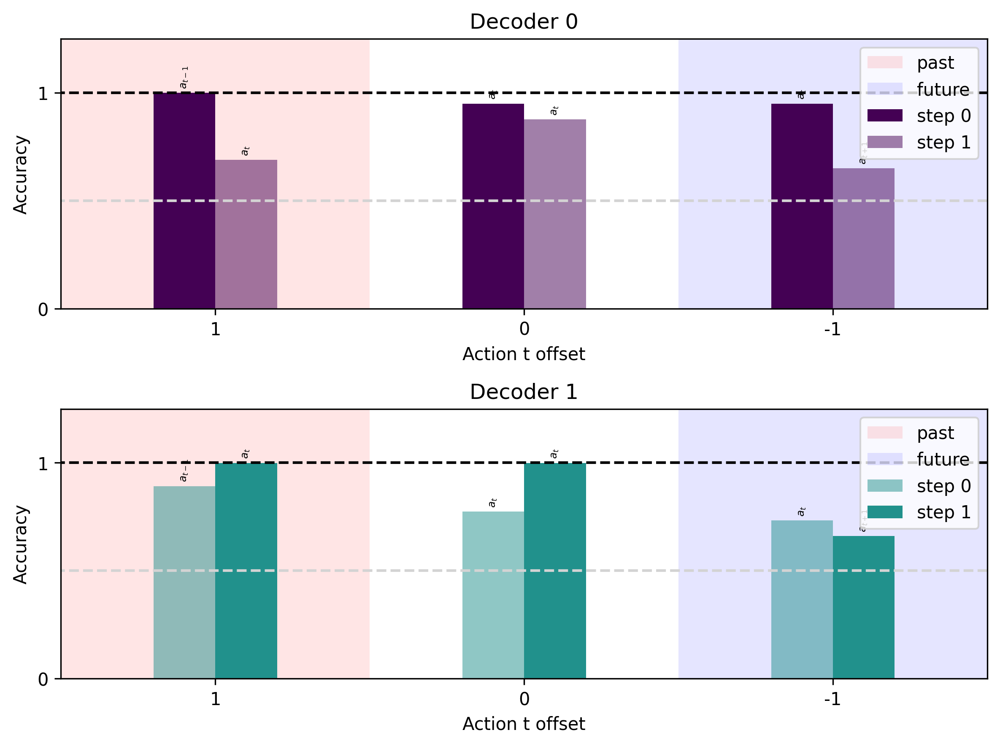

In [ ]:
# fig, axes = plt.subplots(2,2)

cmap = plt.cm.get_cmap('viridis')

fig, axes = plt.subplots(2, 1, figsize=(8, 6), dpi=300)

ticks = [f't-{offset//2}' for offset in hist_range]
for decoder in range(2):
    ax = axes[decoder]
    ax.axvspan(0.5, hist_range[-1]+0.5, facecolor='r', alpha=0.1, label='past')
    ax.axvspan(-0.5, -hist_range[-1]-0.5, facecolor='b', alpha=0.1, label='future')
    ax.hlines(1.0, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='k')
    ax.hlines(0.5, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='lightgrey')

    for step in range(2):
        offset = np.abs(step-1)
        color = cmap(decoder / 2)
        alpha = 1.0 if step == decoder else 0.5

        for h, a in zip(hist_range, acc_means[:, decoder, step]):
            # ax.text(h, o, f'{o:.2f}', ha='center', va='bottom', fontsize=8, color=color)
            # alpha = 1 - ((h-min(hist_range))//2)/(max(hist_range) - min(hist_range))
            # ax.bar(h - 0.1 + offset * 0.2, a, width=0.2, color=color, alpha=alpha)
            # a = acc_means[i, decoder, step]
            lbl = -(h-step)//2 if -(h-step)//2!=0 else ""
            string = rf'$a_{{t{"+" if -(h-step)//2 > 0 else ""}{lbl}}}$'
            ax.annotate(string, xy=(h-0.1 + offset * 0.2, a), xytext=(h - 0.1 + offset * 0.2, a+0.02), rotation=90, fontsize=6, ha='center', va='bottom')

        ax.bar(hist_range - 0.1 + offset * 0.2, acc_means[:, decoder, step], width=0.2, color=color, alpha=alpha, label=f'step {step}')
        
    ax.set_title(f'Decoder {decoder}')
    ax.set_ylim([0, 1.25])
    ax.set_yticks([0, 1], [0, 1])
    ax.set_ylabel('Accuracy')
    ax.set_xlabel('Action t offset')
    ax.set_xticks(hist_range)
    ax.set_xticklabels(hist_range, rotation=0)
    ax.set_xlim([hist_range[0]-0.5, hist_range[-1]+0.5])
    ax.invert_xaxis()
    ax.legend()

    
plt.tight_layout()

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/122927778.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


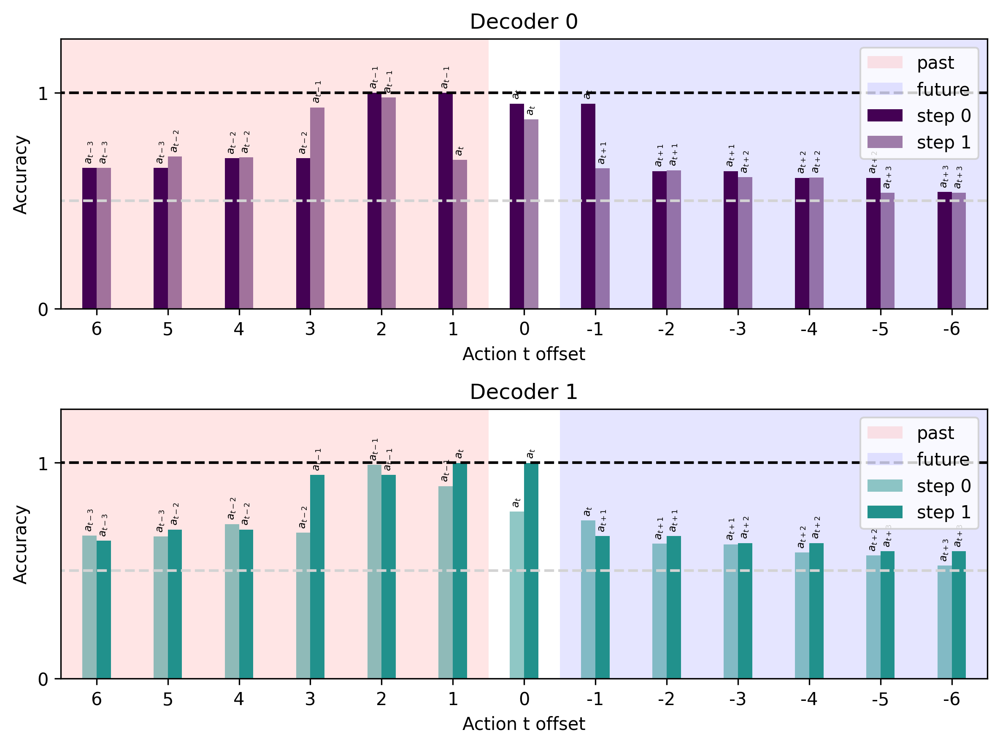

In [ ]:
# fig, axes = plt.subplots(2,2)

cmap = plt.cm.get_cmap('viridis')

# ticks = [f't-{offset//2}' for offset in hist_range]
# for decoder in range(2):
#     for step in range(2):
#         axes[decoder, step].bar(hist_range, acc_means[:,decoder, step])
#         axes[decoder, step].set_title(f'Decoder {decoder} step {step}')
#         axes[decoder, step].set_ylim([0, 1])
#         axes[decoder, step].set_xlabel('History')
#         # str = [f't{"+" if -(offset-step)//2 > 0 else ""}{-(offset-step)//2 if -(offset-step)//2!=0 else ""}' for offset in hist_range]
#         # ticks = [r'a_{s}' for s in str]
#         # ticks = [rf'$a_{{{s}}}$' for s in str]
#         # axes[decoder, step].set_xticks(hist_range, [])
#         # axes[decoder, step].set_xticklabels(ticks, rotation=45)
#         axes[decoder, step].invert_xaxis()

# plt.tight_layout()

fig, axes = plt.subplots(2, 1, figsize=(8, 6), dpi=300)

ticks = [f't-{offset//2}' for offset in hist_range]
for decoder in range(2):
    ax = axes[decoder]
    ax.axvspan(0.5, hist_range[-1]+0.5, facecolor='r', alpha=0.1, label='past')
    ax.axvspan(-0.5, -hist_range[-1]-0.5, facecolor='b', alpha=0.1, label='future')
    ax.hlines(1.0, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='k')
    ax.hlines(0.5, hist_range[0]-0.5, hist_range[-1]+0.5, linestyles='dashed', color='lightgrey')

    for step in range(2):
        offset = np.abs(step-1)
        color = cmap(decoder / 2)
        alpha = 1.0 if step == decoder else 0.5

        for h, a in zip(hist_range, acc_means[:, decoder, step]):
            # ax.text(h, o, f'{o:.2f}', ha='center', va='bottom', fontsize=8, color=color)
            # alpha = 1 - ((h-min(hist_range))//2)/(max(hist_range) - min(hist_range))
            # ax.bar(h - 0.1 + offset * 0.2, a, width=0.2, color=color, alpha=alpha)
            # a = acc_means[i, decoder, step]
            lbl = -(h-step)//2 if -(h-step)//2!=0 else ""
            string = rf'$a_{{t{"+" if -(h-step)//2 > 0 else ""}{lbl}}}$'
            ax.annotate(string, xy=(h-0.1 + offset * 0.2, a), xytext=(h - 0.1 + offset * 0.2, a+0.02), rotation=90, fontsize=6, ha='center', va='bottom')

        ax.bar(hist_range - 0.1 + offset * 0.2, acc_means[:, decoder, step], width=0.2, color=color, alpha=alpha, label=f'step {step}')
        
    ax.set_title(f'Decoder {decoder}')
    ax.set_ylim([0, 1.25])
    ax.set_yticks([0, 1], [0, 1])
    ax.set_ylabel('Accuracy')
    ax.set_xlabel('Action t offset')
    ax.set_xticks(hist_range)
    ax.set_xticklabels(hist_range, rotation=0)
    ax.set_xlim([hist_range[0]-0.5, hist_range[-1]+0.5])
    ax.invert_xaxis()
    ax.legend()

    
plt.tight_layout()

In [ ]:
start, end = 10, -10
hist_range = np.arange(5,7)
acc_means = np.zeros((len(hist_range), 2, 3))

n_p_bins = 10
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)

action_p = action * n_p_bins + bins

for i, n in enumerate(hist_range):
    action_ = np.zeros_like(action)
    if n == 0:
        action_ = action_p
    elif n < 0:
        action_[:, :n] = action_p[:, -n:]
    elif n > 0:
        action_[:, n:] = action_p[:, :-n]

    train_steps = np.arange(18,20)
    scale = True
    accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, action_, layouts, train_steps=train_steps, T=None, fold_trials=False, 
                                                                    scale=scale, exclude_batch_idxs=None, 
                                                                    by_port=False, n_class=Conf.port_dim, multi_class='ovr', 
                                                                    max_iter=1000, random_state=41)
    
    for decoder_id, acc in enumerate(accs):
        acc_means[i, decoder_id, 0] = np.mean(acc[start:end][::2])
        acc_means[i, decoder_id, 1] = np.mean(acc[start:end][1::2])

        print(acc_means)

#### Unscaled

In [ ]:
# train_steps = range(2,82)
scale = False
accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                                                   scale=scale, exclude_batch_idxs=None, by_port=False, n_class=Conf.port_dim,
                                                                   multi_class='ovr', max_iter=1000, 
                                                                   random_state=42)

Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


  1%|▏         | 1/80 [00:00<00:12,  6.41it/s]

(2000, 200)
(2000, 200)


  5%|▌         | 4/80 [00:00<00:09,  8.31it/s]

(2000, 200)
(2000, 200)


  8%|▊         | 6/80 [00:00<00:09,  7.70it/s]

(2000, 200)
(2000, 200)


 10%|█         | 8/80 [00:01<00:09,  7.50it/s]

(2000, 200)
(2000, 200)


 12%|█▎        | 10/80 [00:01<00:08,  7.89it/s]

(2000, 200)
(2000, 200)


 15%|█▌        | 12/80 [00:01<00:07,  8.52it/s]

(2000, 200)
(2000, 200)


 18%|█▊        | 14/80 [00:01<00:08,  7.83it/s]

(2000, 200)
(2000, 200)


 20%|██        | 16/80 [00:02<00:08,  7.79it/s]

(2000, 200)
(2000, 200)


 22%|██▎       | 18/80 [00:02<00:08,  7.29it/s]

(2000, 200)
(2000, 200)


 25%|██▌       | 20/80 [00:02<00:07,  8.18it/s]

(2000, 200)
(2000, 200)


 28%|██▊       | 22/80 [00:02<00:06,  8.37it/s]

(2000, 200)
(2000, 200)


 30%|███       | 24/80 [00:03<00:06,  8.65it/s]

(2000, 200)
(2000, 200)


 32%|███▎      | 26/80 [00:03<00:06,  8.62it/s]

(2000, 200)
(2000, 200)


 35%|███▌      | 28/80 [00:03<00:07,  7.27it/s]

(2000, 200)
(2000, 200)


 38%|███▊      | 30/80 [00:03<00:06,  7.56it/s]

(2000, 200)
(2000, 200)


 39%|███▉      | 31/80 [00:03<00:06,  8.12it/s]

(2000, 200)
(2000, 200)


 42%|████▎     | 34/80 [00:04<00:05,  8.66it/s]

(2000, 200)
(2000, 200)
(2000, 200)


 46%|████▋     | 37/80 [00:04<00:05,  8.49it/s]

(2000, 200)
(2000, 200)


 48%|████▊     | 38/80 [00:04<00:04,  8.65it/s]

(2000, 200)
(2000, 200)


 51%|█████▏    | 41/80 [00:05<00:04,  8.34it/s]

(2000, 200)
(2000, 200)


 54%|█████▍    | 43/80 [00:05<00:04,  8.49it/s]

(2000, 200)
(2000, 200)


 56%|█████▋    | 45/80 [00:05<00:04,  7.78it/s]

(2000, 200)
(2000, 200)


 59%|█████▉    | 47/80 [00:05<00:04,  8.14it/s]

(2000, 200)
(2000, 200)


 61%|██████▏   | 49/80 [00:06<00:03,  7.75it/s]

(2000, 200)
(2000, 200)


 64%|██████▍   | 51/80 [00:06<00:03,  7.88it/s]

(2000, 200)
(2000, 200)


 66%|██████▋   | 53/80 [00:06<00:03,  6.81it/s]

(2000, 200)
(2000, 200)


 70%|███████   | 56/80 [00:06<00:02,  8.33it/s]

(2000, 200)
(2000, 200)
(2000, 200)


 72%|███████▎  | 58/80 [00:07<00:02,  8.07it/s]

(2000, 200)
(2000, 200)


 75%|███████▌  | 60/80 [00:07<00:02,  8.79it/s]

(2000, 200)
(2000, 200)


 78%|███████▊  | 62/80 [00:07<00:02,  8.40it/s]

(2000, 200)
(2000, 200)


 80%|████████  | 64/80 [00:07<00:01,  8.64it/s]

(2000, 200)
(2000, 200)


 82%|████████▎ | 66/80 [00:08<00:01,  7.70it/s]

(2000, 200)
(2000, 200)


 85%|████████▌ | 68/80 [00:08<00:01,  7.77it/s]

(2000, 200)
(2000, 200)


 88%|████████▊ | 70/80 [00:08<00:01,  7.68it/s]

(2000, 200)
(2000, 200)


 90%|█████████ | 72/80 [00:08<00:00,  8.37it/s]

(2000, 200)
(2000, 200)


 92%|█████████▎| 74/80 [00:09<00:00,  8.18it/s]

(2000, 200)
(2000, 200)


 95%|█████████▌| 76/80 [00:09<00:00,  7.74it/s]

(2000, 200)
(2000, 200)


 98%|█████████▊| 78/80 [00:09<00:00,  7.69it/s]

(2000, 200)
(2000, 200)


100%|██████████| 80/80 [00:10<00:00,  7.98it/s]


(2000, 200)
(2000, 200)


  2%|▎         | 2/80 [00:00<00:12,  6.11it/s]

(2000, 200)
(2000, 200)


  5%|▌         | 4/80 [00:00<00:10,  7.40it/s]

(2000, 200)
(2000, 200)


  8%|▊         | 6/80 [00:00<00:09,  7.75it/s]

(2000, 200)
(2000, 200)


  9%|▉         | 7/80 [00:00<00:09,  8.03it/s]

(2000, 200)
(2000, 200)


 12%|█▎        | 10/80 [00:01<00:09,  7.77it/s]

(2000, 200)
(2000, 200)


 14%|█▍        | 11/80 [00:01<00:08,  8.01it/s]

(2000, 200)
(2000, 200)


 18%|█▊        | 14/80 [00:01<00:08,  8.12it/s]

(2000, 200)
(2000, 200)


 20%|██        | 16/80 [00:02<00:07,  8.69it/s]

(2000, 200)
(2000, 200)


 22%|██▎       | 18/80 [00:02<00:07,  8.71it/s]

(2000, 200)
(2000, 200)


 25%|██▌       | 20/80 [00:02<00:06,  8.79it/s]

(2000, 200)
(2000, 200)


 29%|██▉       | 23/80 [00:02<00:06,  9.23it/s]

(2000, 200)
(2000, 200)
(2000, 200)


 31%|███▏      | 25/80 [00:03<00:06,  8.72it/s]

(2000, 200)
(2000, 200)


 34%|███▍      | 27/80 [00:03<00:06,  8.79it/s]

(2000, 200)
(2000, 200)


 36%|███▋      | 29/80 [00:03<00:06,  8.29it/s]

(2000, 200)
(2000, 200)


 39%|███▉      | 31/80 [00:03<00:05,  8.28it/s]

(2000, 200)
(2000, 200)


 41%|████▏     | 33/80 [00:04<00:06,  7.53it/s]

(2000, 200)
(2000, 200)


 44%|████▍     | 35/80 [00:04<00:05,  7.81it/s]

(2000, 200)
(2000, 200)


 46%|████▋     | 37/80 [00:04<00:05,  7.79it/s]

(2000, 200)
(2000, 200)


 49%|████▉     | 39/80 [00:04<00:05,  7.78it/s]

(2000, 200)
(2000, 200)


 51%|█████▏    | 41/80 [00:05<00:05,  7.46it/s]

(2000, 200)
(2000, 200)


 54%|█████▍    | 43/80 [00:05<00:04,  7.67it/s]

(2000, 200)
(2000, 200)
(2000, 200)


 59%|█████▉    | 47/80 [00:05<00:03,  9.15it/s]

(2000, 200)
(2000, 200)
(2000, 200)


 61%|██████▏   | 49/80 [00:05<00:03,  9.04it/s]

(2000, 200)
(2000, 200)


 64%|██████▍   | 51/80 [00:06<00:03,  8.61it/s]

(2000, 200)
(2000, 200)


 66%|██████▋   | 53/80 [00:06<00:03,  7.86it/s]

(2000, 200)
(2000, 200)


 68%|██████▊   | 54/80 [00:06<00:03,  7.73it/s]

(2000, 200)
(2000, 200)


 71%|███████▏  | 57/80 [00:06<00:02,  8.28it/s]

(2000, 200)
(2000, 200)


 74%|███████▍  | 59/80 [00:07<00:02,  8.05it/s]

(2000, 200)
(2000, 200)


 76%|███████▋  | 61/80 [00:07<00:02,  8.18it/s]

(2000, 200)
(2000, 200)


 79%|███████▉  | 63/80 [00:07<00:02,  7.80it/s]

(2000, 200)
(2000, 200)


 81%|████████▏ | 65/80 [00:07<00:02,  7.41it/s]

(2000, 200)
(2000, 200)


 84%|████████▍ | 67/80 [00:08<00:01,  7.79it/s]

(2000, 200)
(2000, 200)


 86%|████████▋ | 69/80 [00:08<00:01,  7.69it/s]

(2000, 200)
(2000, 200)


 89%|████████▉ | 71/80 [00:08<00:01,  8.09it/s]

(2000, 200)
(2000, 200)


 91%|█████████▏| 73/80 [00:09<00:00,  7.10it/s]

(2000, 200)
(2000, 200)


 94%|█████████▍| 75/80 [00:09<00:00,  7.68it/s]

(2000, 200)
(2000, 200)


 96%|█████████▋| 77/80 [00:09<00:00,  7.62it/s]

(2000, 200)
(2000, 200)


 99%|█████████▉| 79/80 [00:09<00:00,  8.41it/s]

(2000, 200)
(2000, 200)


100%|██████████| 80/80 [00:09<00:00,  8.10it/s]


(2000, 200)


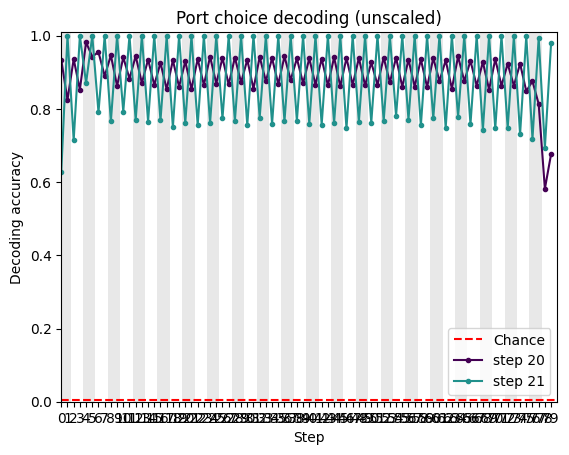

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, 
                              title='Port choice decoding ({})'.format('scaled' if scale else 'unscaled'))

### Port non-choice

#### Scaled

In [ ]:
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale=scale, exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=80, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

#### Unscaled

In [ ]:
# train_steps = range(2,82)
scale = False
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale=scale, exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

In [ ]:
train_steps = range(70,82)
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale=scale, exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

In [ ]:
train_steps = range(70,82)
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale_old=True, scale_new=False, 
                                        exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

In [ ]:
train_steps = range(70,82)
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale_old=False, scale_new=False, 
                                        exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

In [ ]:
train_steps = range(2,82)
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale_old=False, scale_new=True, 
                                        exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding ({})'.format('scaled' if scale else 'unscaled'))

In [ ]:
train_steps = [41]
scale = True
accs, conf_mats = train_decoders_looped(hiddens, not_action, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale_new=False, scale_old=False,
                                        exclude_batch_idxs=None, multi_class='ovr', max_iter=10000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding old scaling')

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding no scaling')

In [ ]:
plt.plot(np.m(hiddens, axis=(0,-1)))

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding new scaling')

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding minus mean')

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding minus mean')

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=Conf.port_dim, T=82, 
                              title='Port non-choice decoding minus mean')

### p(A)

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_16804/1532166980.py:4: RuntimeWarning: invalid value encountered in divide
  hiddens_ = (hiddens - mean) / std


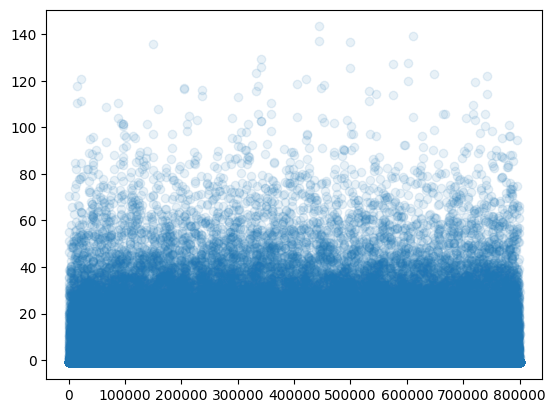

In [ ]:
mean = np.mean(hiddens, axis=(0,1))
std = np.mean(hiddens, axis=(0,1))

hiddens_ = (hiddens - mean) / std

nan_idxs = np.where(np.any(np.isnan(hiddens_)==False, axis=(0,1)))[0]
hiddens_ = hiddens_[:,:,nan_idxs]
plt.plot(hiddens_[:,:,4].flatten(), marker='o', alpha=0.1, linestyle='')

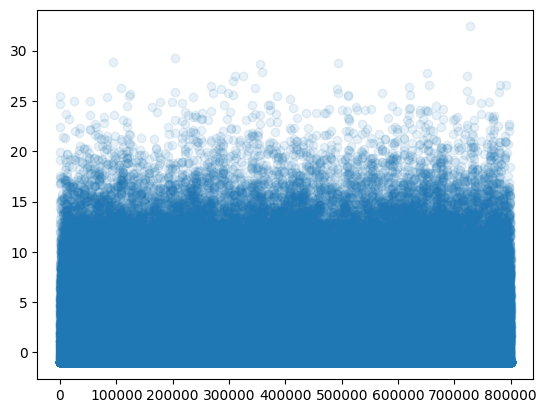

In [ ]:
plt.plot(hiddens_[:,:,6].flatten(), marker='o', alpha=0.1, linestyle='')

In [480]:
collapse_p = True

train_steps = np.arange(60,62)

n_p_bins = 40
bin_edges = np.linspace(0.5, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze() if not collapse_p else np.digitize(0.5 + np.abs(p_A - 0.5), bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)

scale = False
by_port = False
fold = False
accs, conf_mats, losses_train, losses_test = train_decoders_looped(hiddens, bins, layouts, train_steps=train_steps, n_class=n_p_bins, 
                                                                   T=None, fold_trials=fold, scale=scale, exclude_batch_idxs=None, by_port=by_port,
                                                                   multi_class='ovr', max_iter=1000, random_state=42)

(10000, 80, 1024) (10000, 80)
Finished scaling.
Train/test:	(8000, 80, 1024),	(2000, 80, 1024)
Folded:		(8000, 2, 1024)


100%|██████████| 2/2 [00:05<00:00,  2.87s/it]


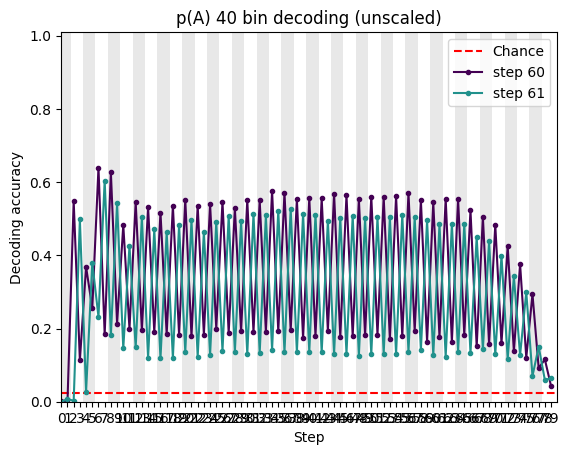

In [481]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=n_p_bins, T=80, 
                              title='p(A) {} bin decoding ({})'.format(n_p_bins, 'scaled' if scale else 'unscaled'))
fig = plt.gcf()
# fig.savefig('./figs/full/probs.png', dpi=300)

(0.0, 82.95)

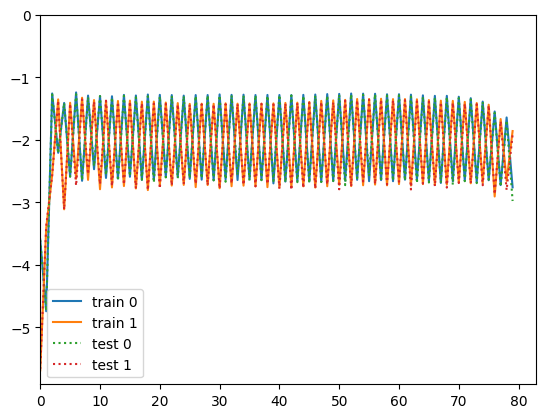

In [ ]:
for i, l in enumerate(losses_train):
    plt.plot(l, label='train ' + str(i))
for i, l in enumerate(losses_test):
    plt.plot(l, label='test ' + str(i), linestyle=':')
plt.legend()
plt.ylim(top=0)
plt.xlim(left=0)

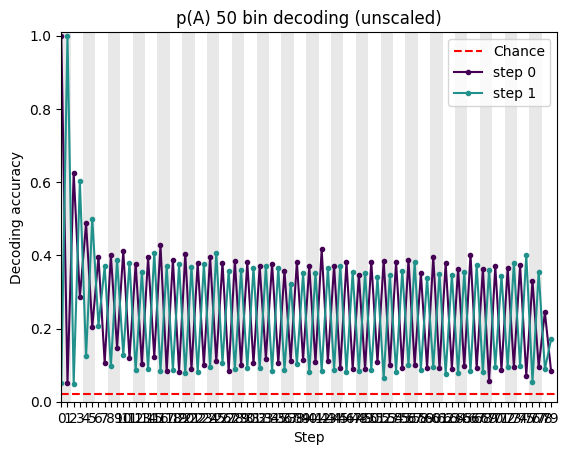

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=n_p_bins, T=80, 
                              title='p(A) {} bin decoding ({})'.format(n_p_bins, 'scaled' if scale else 'unscaled'))
fig = plt.gcf()
fig.savefig('./figs/probs_scaled.png', dpi=300)

(0.0, 82.95)

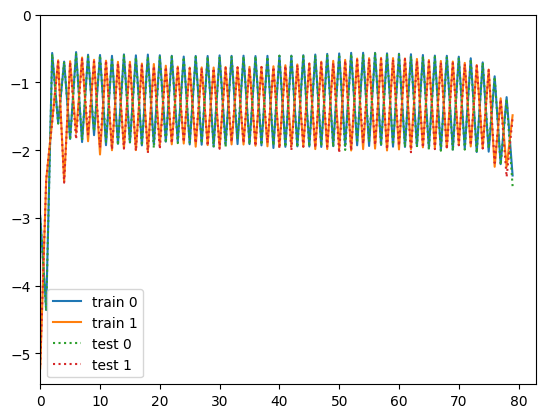

In [ ]:
for i, l in enumerate(losses_train):
    plt.plot(l, label='train ' + str(i))
for i, l in enumerate(losses_test):
    plt.plot(l, label='test ' + str(i), linestyle=':')
plt.legend()
plt.ylim(top=0)
plt.xlim(left=0)

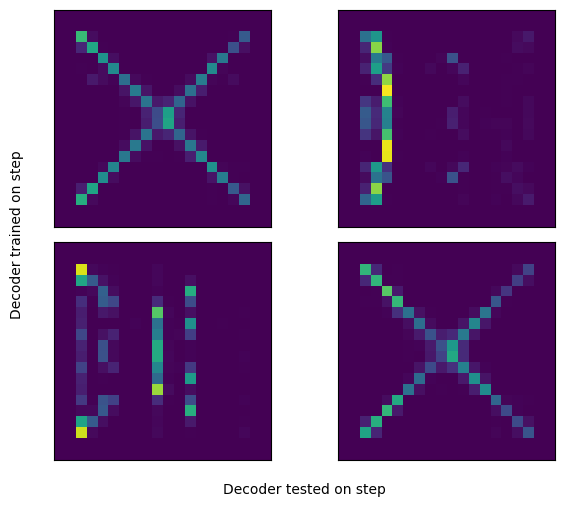

In [ ]:
plot_conf_matrices_by_step(conf_mats)
fig = plt.gcf()
fig.savefig(f'./figs/full/cm_probs_fold_byport.png', dpi=300)

In [ ]:
train_steps = np.arange(0,80)

n_p_bins = 50
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)

scale = False
accs, conf_mats = train_decoders_looped(hiddens[:,2:,:], bins, layouts, train_steps=train_steps, T=None, fold_trials=True, 
                                        scale=scale, exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)

In [ ]:
plot_decoding_accuracy_looped(accs, train_steps, n_class=n_p_bins, T=20, 
                              title='p(A) {} bin decoding ({})'.format(n_p_bins, 'scaled' if scale else 'unscaled'))
fig = plt.gcf()
fig.savefig('./figs/probs_unscaled.png', dpi=300)

In [ ]:
plot_conf_matrices_by_step(conf_mats)
fig = plt.gcf()
fig.savefig('./figs/cm_probs_unscaled.png')

## Cross port decoding

In [ ]:
port_id = 1

In [ ]:
from functions import *
n_p_bins = 10
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins

p_A_ = np.abs(p_A-0.5)+0.5
bins = np.digitize(p_A_, bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)
train_steps = np.arange(4,160)

accs_all = []
for port_id in range(20):
    accs, conf_matrices = train_decoders_looped_port(port_id, hiddens, bins, layouts, train_steps=train_steps, T=160, fold_trials=True, scale=False,
                                                exclude_batch_idxs=None, multi_class='ovr', max_iter=1000, random_state=42)
    accs_all.append(accs)

In [ ]:
accs_all = np.array(accs_all)
print(accs_all.shape)
accs_mean = np.mean(accs_all, axis=0)

In [ ]:
plot_decoding_accuracy_looped(accs_mean, train_steps, n_class=n_p_bins, T=40, title='p(A) 50 bin decoding (unscaled)')

In [ ]:
accs_means_fold = np.zeros((Conf.trial_len, Conf.trial_len))
for i in range(Conf.trial_len):
    x = np.mean(accs_mean[:,2*Conf.trial_len+i::Conf.trial_len], axis=(-1))
    accs_means_fold[:, i] = x

cmap = plt.cm.get_cmap('viridis')
for i, line in enumerate(accs_means_fold):
    color = cmap(i / len(accs))
    plt.plot(line, color=color, marker='o', markersize=3)

In [ ]:
plot_conf_matrices_by_step(conf_matrices)

## What are my hypotheses?

### Trivial ones
1. Both ports decodable at every timestep
2. p(A) decodable at every timestep

### Non-trivial ones
3. Choice represented as good/bad binary or value continuum
4. Value integration is stimulus-generic
5. Value integration is stimulus-specific


## PCA

In [701]:
from sklearn.decomposition import PCA

scale = True

hiddens_flat = np.reshape(hiddens, (-1, hiddens.shape[-1]))
if scale:
    hiddens_flat -= np.mean(hiddens_flat, axis=0)
    hiddens_flat /= np.std(hiddens_flat, axis=0)
    hiddens_flat = hiddens_flat[:,~np.isnan(hiddens_flat).any(axis=0)]

pca = PCA(n_components=100)
pca.fit(hiddens_flat)
print(pca.explained_variance_ratio_[:50])

action_port = np.argmax(choices[:,:,-Conf.port_dim-1:], axis=-1)
a_choice = action_port == layouts[:,0, np.newaxis]
b_choice = action_port == layouts[:,1, np.newaxis]
null_choice = action_port == 200

X_comp = pca.transform(hiddens_flat)
X_comp = np.reshape(X_comp, (hiddens.shape[0], hiddens.shape[1], -1))

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_19914/2761525091.py:8: RuntimeWarning: invalid value encountered in divide
  hiddens_flat /= np.std(hiddens_flat, axis=0)


[0.11090361 0.03143977 0.02034233 0.0192255  0.01562931 0.01423387
 0.01360883 0.01163058 0.01143274 0.01065974 0.01028686 0.0100627
 0.00950115 0.00889403 0.00853969 0.00816341 0.00789747 0.00739136
 0.00728626 0.00666114 0.00638529 0.00603574 0.00590849 0.00551462
 0.00547134 0.00534365 0.00502866 0.0045584  0.00453311 0.00439605
 0.00414477 0.00401184 0.00397353 0.00383184 0.00378553 0.0035673
 0.00354878 0.00352764 0.00347074 0.00337438 0.00334746 0.00325637
 0.003206   0.00316989 0.00312488 0.00300591 0.00299418 0.00296142
 0.0029156  0.00289727]


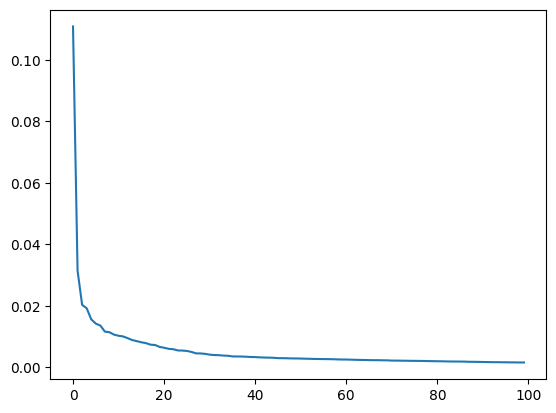

In [702]:
plt.plot(pca.explained_variance_ratio_[:100])

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/766727300.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/766727300.py:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(x, y, z, c=color)


Text(0.5, 0, 'PC3')

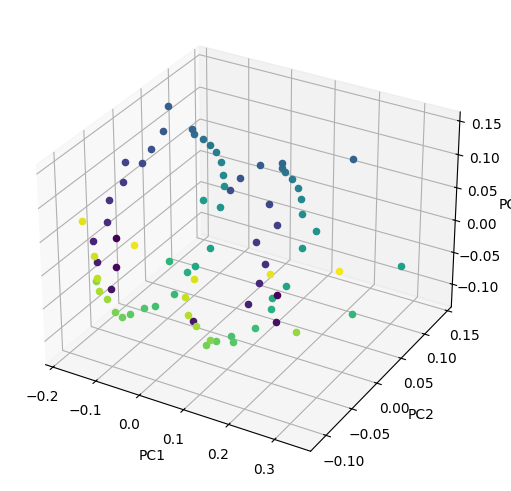

In [ ]:
b = 7
fig = plt.figure(layout='constrained')
ax = fig.add_subplot(projection='3d')

T = X_comp.shape[1]
cmap = plt.cm.get_cmap('viridis')

for i in range(T):
    x, y, z = X_comp[b, i, :3]
    color = cmap(i / T)
    ax.scatter(x, y, z, c=color)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')


In [ ]:
a = np.arange(10)
print(a)
print(a[-3:])

[0 1 2 3 4 5 6 7 8 9]
[7 8 9]


[ True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False  True False  True False
  True False  True False  True False  True False]


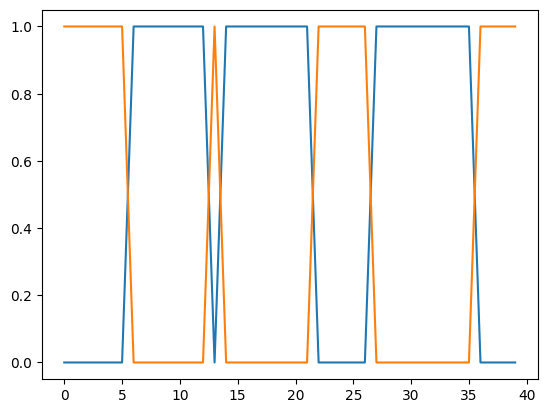

In [ ]:
b=5
action_port = np.argmax(choices[:,:,-Conf.port_dim-1:], axis=-1)
a_choice = action_port == layouts[:,0, np.newaxis]
b_choice = action_port == layouts[:,1, np.newaxis]
null_choice = action_port == 200
print(null_choice[0,:])

plt.plot(np.arange(len(a_choice[b,1::2])), a_choice[b,1::2])
plt.plot(np.arange(len(b_choice[b,1::2])), b_choice[b,1::2])

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/3911556863.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('cool')
MovieWriter imagemagick unavailable; using Pillow instead.
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/3911556863.py:49: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(x, y, z, s=25, c=c, edgecolor=[.6,.6,.6])


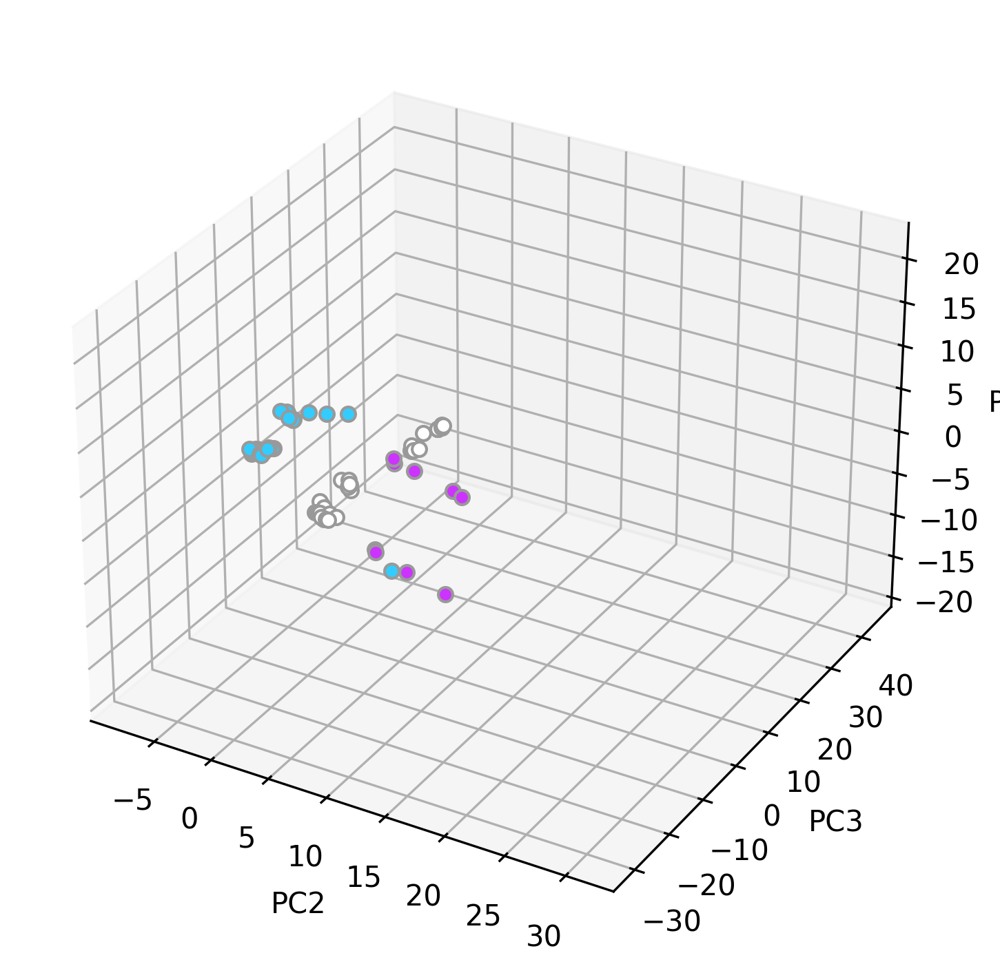

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

b = 1
T = X_comp.shape[1]
cmap = plt.cm.get_cmap('cool')

# Setup the figure and axis for 3D plotting
fig = plt.figure(dpi=300)
ax = fig.add_subplot(projection='3d')

# Setting the limits if necessary (you might want to adjust these based on your data)
dims= [1, 2, 3]

ax.set_xlim([np.min(X_comp[:,:,dims[0]]), np.max(X_comp[:,:,dims[0]])])
ax.set_ylim([np.min(X_comp[:,:,dims[1]]), np.max(X_comp[:,:,dims[1]])])
ax.set_zlim([np.min(X_comp[:,:,dims[2]]), np.max(X_comp[:,:,dims[2]])])

# Initialize an empty plot
plot = ax.scatter([], [], [], c=[])

ax.set_xlabel(f'PC{dims[0]+1}')
ax.set_ylabel(f'PC{dims[1]+1}')
ax.set_zlabel(f'PC{dims[2]+1}')

plt.tight_layout()

# Animation update function
def update(i):
    x, y, z = X_comp[b, i, dims]
    # if a_choice[b, i]:
    #     c = 'r'
    # elif b_choice[b, i]:
    #     c = 'b'
    # elif null_choice[b, i]:
    #     c = 'k'
    # else:
    #     c = 'g'
    if null_choice[b, i]:
        c = 'w'
    else:
        # v = 2*np.abs(p_A[b, i//2, 0] - 0.5)
        # v = p_A[b, i//2, 0]
        v = 0.2 + 0.6*switch[b, i//2]
        c = cmap(v)
    ax.scatter(x, y, z, s=25, c=c, edgecolor=[.6,.6,.6]) 
    # ax.scatter(x, y, z, c=c)  # Scatter expects a list of colors
    return plot,

# Create animation
ani = FuncAnimation(fig, update, frames=range(T), blit=True)

ani.save('animation6.gif', writer='imagemagick')

# To display the animation in a Jupyter notebook
# HTML(ani.to_html5_video())

In [ ]:
switch[0,:]

array([0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1])

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/79901354.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_35280/79901354.py:36: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(x, y, s=25, c=c, alpha=alpha)  # Scatter expects a list of colors


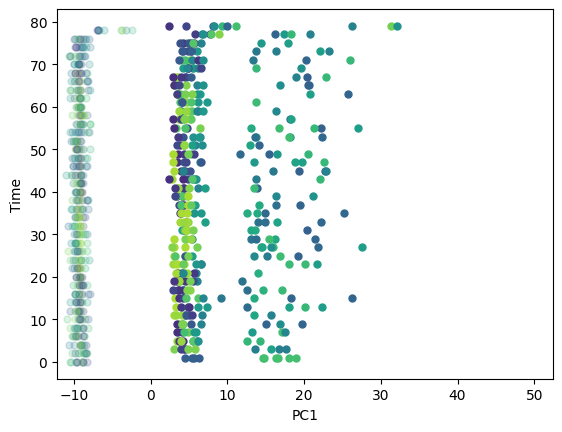

In [ ]:
b = 0
T = X_comp.shape[1]
cmap = plt.cm.get_cmap('viridis')

# Setup the figure and axis for 3D plotting
fig = plt.figure()
ax = fig.add_subplot()

# Setting the limits if necessary (you might want to adjust these based on your data)
dim=0
ax.set_xlim([np.min(X_comp[:,:,dim]), np.max(X_comp[:,:,dim])])
# ax.set_ylim((-0.05, 0.05))

# Initialize an empty plot
plot = ax.scatter([], [], c=[])
ax.set_xlabel(f'PC{dim+1}')
ax.set_ylabel('Time')

# Animation update function
for b in range(10):
    for i in range(T):
        x, y = X_comp[b, i, dim], i
        # v = 0.2 + 0.6*switch[b, i//2]
        # v = np.abs(p_A[b, i//2, 0]-0.5)
        # v = p_A[b, i//2, 0]

        if null_choice[b, i]:
            # c = 'w'
            alpha = 0.2
        else:
            alpha = 1.
            # v = 2*np.abs(p_A[b, i//2, 0] - 0.5)
            v = p_A[b, i//2, 0]
            c = cmap(v)

        ax.scatter(x, y, s=25, c=c, alpha=alpha)  # Scatter expects a list of colors

plt.savefig(f'pc{dim+1}_absprob_scaled.png', dpi=300)


<BarContainer object of 100 artists>

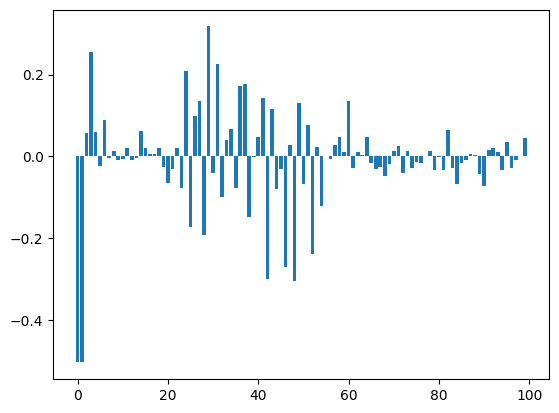

In [ ]:
true = np.abs(p_A-0.5).flatten()
corrs = []
for dim in range(100):
    pred = X_comp[:, 1::2, dim].flatten()
    corr = np.corrcoef(true, pred)[0,1]
    corrs.append(corr)

plt.bar(np.arange(100), corrs)

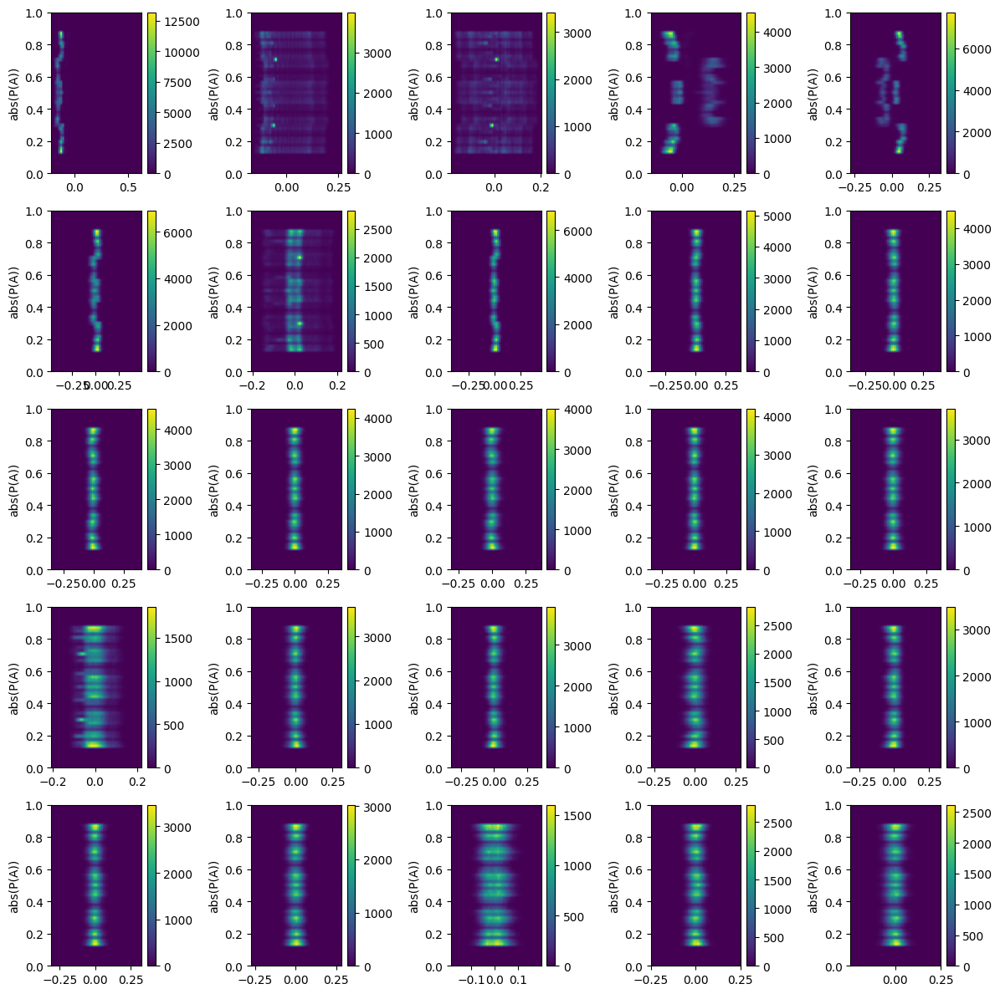

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(5,5, figsize=(12,12))
for dim, ax in enumerate(axes.flatten()):
    val_pred = X_comp[:, 0::2, dim].flatten()
    val_true = p_A.flatten()

    # Compute a 2D histogram
    xbins = np.linspace(np.min(X_comp[:, :, dim]), np.max(X_comp[:, :, dim]), 50)
    ybins = np.linspace(0, 1.0, 50)
    hist, xedges, yedges = np.histogram2d(val_pred, val_true, bins=(xbins, ybins))

    # Display the 2D histogram as an image
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    im = ax.imshow(hist.T, extent=extent, origin='lower', aspect='auto', cmap='viridis')

    ax.set_ylabel('abs(P(A))')
    fig.colorbar(im, ax=ax)

plt.tight_layout()


In [ ]:
np.reshape(np.arange(10), (50))

ValueError: cannot reshape array of size 10 into shape (50,)

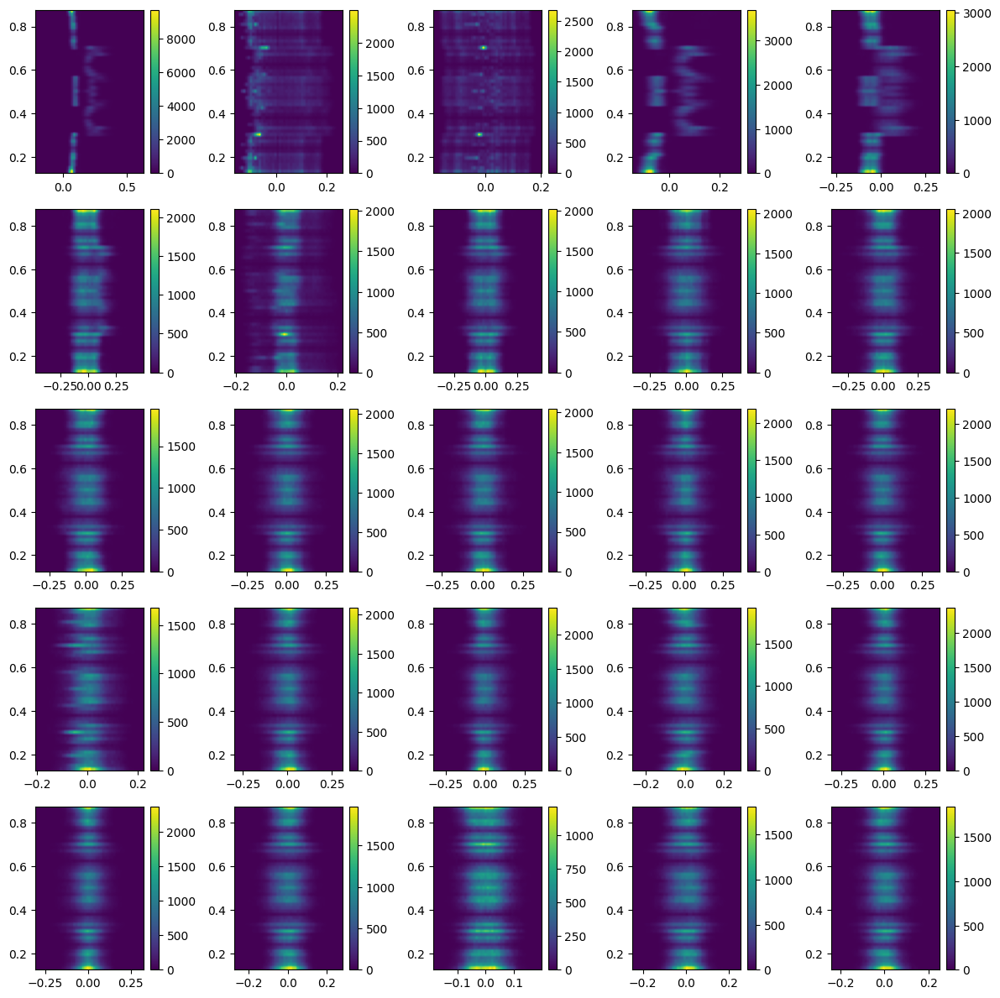

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = X_comp[:, 1::2, :]
# y_true = np.tile(np.array([0, 1]), (x.shape[1]*x.shape[0])//2)
# print(x.shape, y_true.shape)
y_true = p_A.flatten()
# y_true = switch.flatten()
# y_true = np.tile(np.arange(x.shape[1]), x.shape[0])

fig, axes = plt.subplots(5,5, figsize=(12,12))
for dim, ax in enumerate(axes.flatten()):
    y_pred = x[:, :, dim].flatten()

    # Compute a 2D histogram
    xbins = np.linspace(np.min(X_comp[:, :, dim]), np.max(X_comp[:, :, dim]), 50)
    ybins = np.linspace(np.min(y_true), np.max(y_true), 50)
    hist, xedges, yedges = np.histogram2d(y_pred, y_true, bins=(xbins, ybins))

    # Display the 2D histogram as an image
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    im = ax.imshow(hist.T, extent=extent, origin='lower', aspect='auto', cmap='viridis')

    # ax.set_ylabel('abs(P(A))')
    fig.colorbar(im, ax=ax)

plt.tight_layout()


In [ ]:
ab_choice = (p_A[:,:,0]>0.5).astype(int)
switch = np.pad(np.abs(ab_choice[:,1:] - ab_choice[:,:-1]), ((0,0),(1,0)))
switch.shape

(10000, 40)

[0.  0.5 1. ]


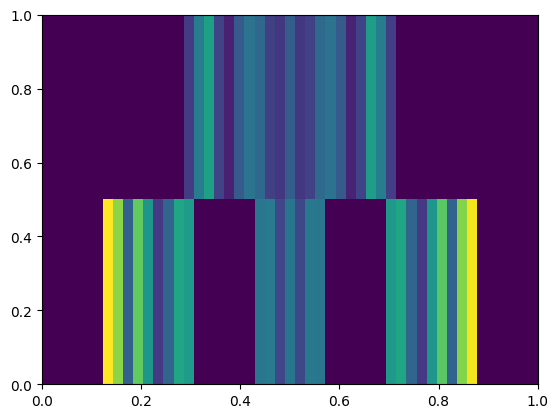

In [ ]:
xbins = np.linspace(0, 1., 50)
ybins = np.linspace(0, 1, 3)
print(ybins)
hist, xedges, yedges = np.histogram2d(p_A.flatten(), switch.flatten(), bins=(xbins, ybins))
plt.figure()
# Display the 2D histogram as an image
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
im = plt.imshow(hist.T, extent=extent, origin='lower', aspect='auto', cmap='viridis')
plt.show()

(0.0, 1.0)

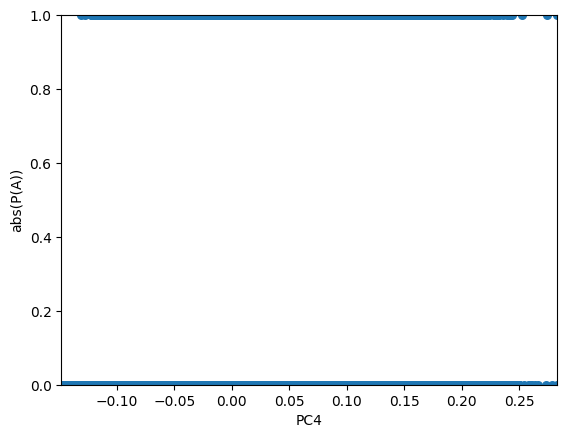

In [ ]:
dim=3
x = X_comp[:, 1::2, dim].flatten()
y = switch.flatten()

plt.scatter(x, y, s=30)
plt.xlabel('PC4')
plt.ylabel('abs(P(A))')
plt.xlim(min(x), max(x))
plt.ylim(min(y), max(y))

In [351]:
bins

array([21, 32,  0, ..., 19,  9, 26])

(101, 101)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/matplotlib/transforms.py:766: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.asarray(points, float)


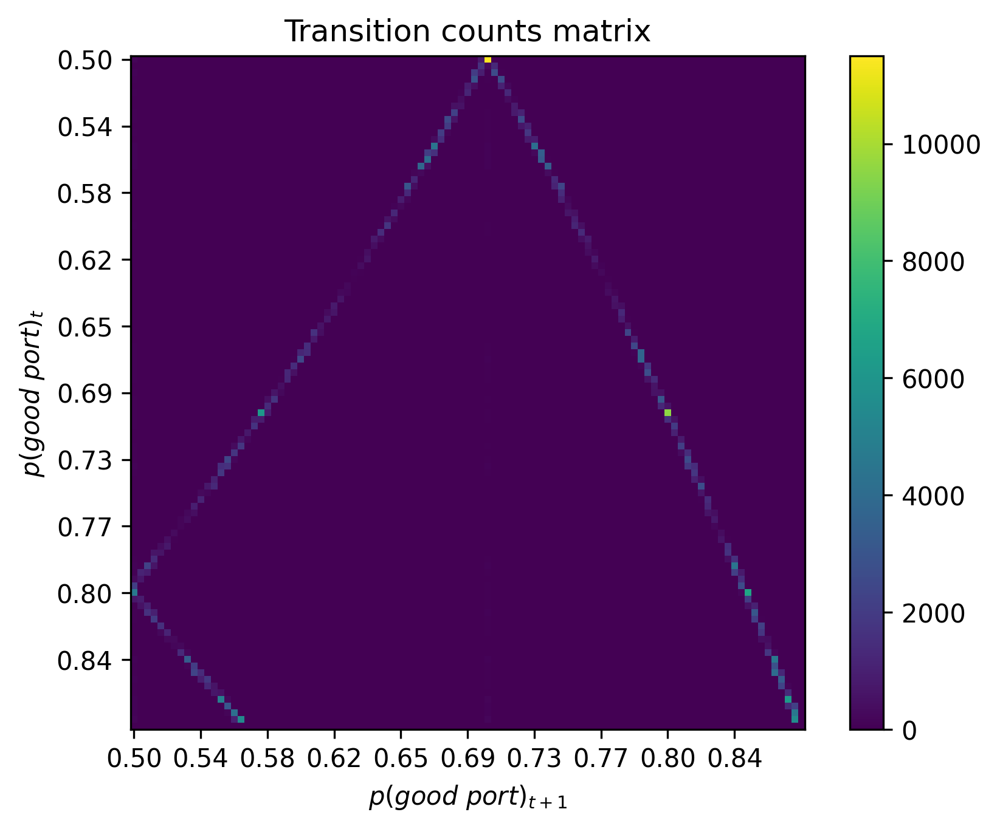

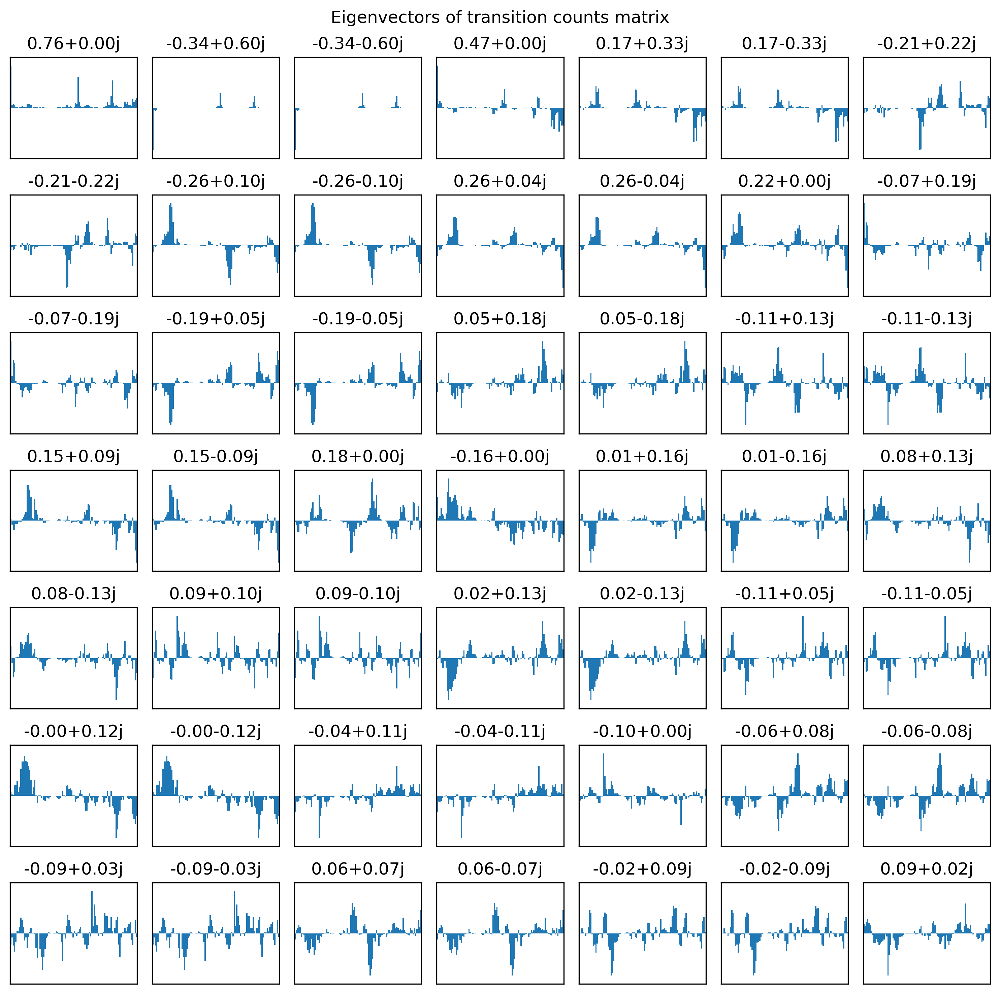

In [385]:
use_tm = False

n_p_bins_ = 100
p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
bin_edges = np.linspace(0.5, np.max(p_port), n_p_bins_+1)[:-1]  # Creates 5 edges for 4 bins
bins = np.digitize(p_port, bin_edges)

# how to get a transition matrix from this series of numbers?
import numpy as np
from scipy.sparse import csr_matrix

# Number of unique states
bins = bins.flatten()
num_states = max(bins) + 1

# Collect transitions
rows = bins[:-1]
cols = bins[1:]

# Count transitions using a sparse matrix
counts = csr_matrix((np.ones(len(rows)), (rows, cols)), shape=(num_states, num_states)).toarray()

# Normalize to get probabilities
transition_matrix = counts / counts.sum(axis=1, keepdims=True)

M = transition_matrix if use_tm else counts
plt.figure(dpi=300)
plt.imshow(M)
plt.xticks(np.arange(0, n_p_bins_, 10), [f'{b:.2f}' for b in bin_edges[::10]])
plt.yticks(np.arange(0, n_p_bins_, 10), [f'{b:.2f}' for b in bin_edges[::10]])
plt.ylabel(r'$p(good\ port)_{t}$')
plt.xlabel(r'$p(good\ port)_{t+1}$')
plt.colorbar()
plt.title('Transition probability matrix' if use_tm else 'Transition counts matrix')
plt.savefig('./regression/mat_tm.png' if use_tm else './regression/mat_counts.png', dpi=300)
# plt.axhline(np.mean(bins), c='w')
# plt.axvline(np.mean(bins), c='w')


eigenvalues, eigenvectors = np.linalg.eig(M if use_tm else M / np.max(M))

print(eigenvectors.shape)
n = 49
fig, axes = plt.subplots(7,7, figsize=(10,10), dpi=300)
fig.suptitle('Eigenvectors of transition probability matrix' if use_tm else 'Eigenvectors of transition counts matrix')
for i, ax in enumerate(axes.flatten()):
    v = eigenvectors[:, i]
    ax.bar(np.arange(len(v)), v, width=1)
    ax.set_ylim([-1.2*np.max(np.abs(v)), 1.2*np.max(np.abs(v))])
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_title(f'{eigenvalues[i]:.2f}')
    ax.set_xlim([-0.5, n_p_bins_-0.5])

plt.tight_layout()
plt.savefig('./regression/eigenvectors_tm.png' if use_tm else './regression/eigenvectors_counts.png', dpi=300)

In [688]:
action_trimmed = action[:, 2 * start_trial : 2 * end_trial]
target_choices = np.repeat(np.argmax(targets[:, 2 * start_trial : 2 * end_trial, -(Conf.port_dim + 1):-1], axis=-1)[:, 1::2], 2, axis=-1)

correct = action_trimmed == target_choices

print(action_trimmed[0,:])
print(target_choices[0,:])

idx = np.where(~correct)
p_A_trimmed[idx]

[113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 113 113 113 113
   0   0 113 113 113 113 113 113 113 113 113 113 113 113 113 113   0   0
 113 113 113 113 113 113 113 113 113 113   0   0   0   0   0   0   0   0
   0   0 113 113]
[113 113   0   0   0   0 113 113 113 113   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 113 113 113 113
   0   0 113 113 113 113 113 113 113 113 113 113 113 113 113 113   0   0
 113 113 113 113 113 113 113 113 113 113   0   0   0   0   0   0   0   0
   0   0 113 113]


array([[0.573588  ],
       [0.573588  ],
       [0.499955  ],
       [0.499955  ],
       [0.49991798],
       [0.49991798],
       [0.6769534 ],
       [0.6769534 ],
       [0.44106692],
       [0.44106692],
       [0.49778026],
       [0.49778026],
       [0.69804126],
       [0.69804126],
       [0.44842875],
       [0.44842875],
       [0.47579426],
       [0.47579426],
       [0.13030386],
       [0.13030386],
       [0.33609414],
       [0.33609414],
       [0.27966404],
       [0.27966404],
       [0.49985617],
       [0.49985617],
       [0.49991286],
       [0.49991286],
       [0.30200353],
       [0.30200353],
       [0.13624114],
       [0.13624114],
       [0.33038303],
       [0.33038303],
       [0.36215279],
       [0.36215279],
       [0.69261765],
       [0.69261765],
       [0.49977702],
       [0.49977702],
       [0.49966636],
       [0.49966636],
       [0.27004248],
       [0.27004248],
       [0.12621546],
       [0.12621546],
       [0.15783793],
       [0.157

In [708]:
p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]

In [709]:
print(p_A[0,:20,0])
print(p_port[0,:20,0])

[0.7        0.42537317 0.6564767  0.78087735 0.4850053  0.29166958
 0.56875205 0.73713934 0.8178882  0.8522114  0.8660471  0.8715044
 0.8736385  0.8744702  0.8747939  0.87491983 0.5624299  0.33616492
 0.21562494 0.5122789 ]
[0.7        0.5746268  0.6564767  0.78087735 0.51499474 0.7083304
 0.56875205 0.73713934 0.8178882  0.8522114  0.8660471  0.8715044
 0.8736385  0.8744702  0.8747939  0.87491983 0.5624299  0.66383505
 0.7843751  0.5122789 ]


In [18]:
exclude_port_set = np.arange(5)
truth_array = np.isin(layouts, exclude_port_set)
exclude_batch_idxs = np.all(truth_array, axis=1)
include_batch_idxs = np.any(truth_array, axis=1) == False
print(np.count_nonzero(exclude_batch_idxs))
layouts_train, layouts_test = layouts[include_batch_idxs], layouts[exclude_batch_idxs]
print(layouts_test)
# print(layouts_train)

np.unique(layouts_test, return_counts=True)

128
[[1 4]
 [3 0]
 [3 1]
 [3 4]
 [1 2]
 [0 4]
 [4 0]
 [2 1]
 [0 3]
 [4 2]
 [2 3]
 [1 0]
 [4 3]
 [2 0]
 [0 2]
 [1 3]
 [4 1]
 [3 2]
 [2 4]
 [0 1]
 [1 2]
 [3 2]
 [3 0]
 [0 4]
 [4 1]
 [2 1]
 [0 1]
 [4 2]
 [0 3]
 [2 4]
 [1 3]
 [4 3]
 [2 3]
 [1 4]
 [2 0]
 [3 4]
 [3 1]
 [4 0]
 [0 2]
 [1 0]
 [0 1]
 [0 2]
 [4 0]
 [4 3]
 [0 3]
 [0 4]
 [3 1]
 [1 4]
 [3 0]
 [4 1]
 [2 4]
 [3 4]
 [2 0]
 [4 2]
 [1 2]
 [1 3]
 [2 1]
 [1 0]
 [3 2]
 [2 3]
 [3 4]
 [4 3]
 [3 0]
 [3 1]
 [4 2]
 [0 2]
 [4 0]
 [2 3]
 [2 0]
 [0 3]
 [2 4]
 [1 0]
 [1 4]
 [0 4]
 [3 2]
 [1 2]
 [2 1]
 [0 1]
 [1 3]
 [4 1]
 [1 0]
 [4 1]
 [1 4]
 [4 2]
 [1 2]
 [2 0]
 [4 0]
 [3 2]
 [2 3]
 [0 3]
 [3 0]
 [3 4]
 [2 4]
 [2 1]
 [4 3]
 [0 4]
 [3 1]
 [0 2]
 [0 1]
 [1 3]
 [2 3]
 [0 2]
 [3 4]
 [1 4]
 [4 2]
 [3 1]
 [0 4]
 [1 2]
 [3 0]
 [4 0]
 [2 1]
 [2 0]
 [4 3]
 [1 0]
 [0 3]
 [1 3]
 [0 1]
 [4 1]
 [2 4]
 [3 2]
 [1 2]
 [0 2]
 [4 2]
 [0 4]
 [3 1]
 [2 3]
 [2 1]
 [0 3]]


(array([0, 1, 2, 3, 4]), array([51, 51, 53, 51, 50]))

In [46]:
idx = np.where(p_A_trimmed < 0.5)
print(p_A_trimmed.shape)
print(idx)
print(np.min(p_A_trimmed), p_A_trimmed[idx])
suss_actions = action_trimmed[idx[0], idx[1]]
suss_targets = target_choices[idx[0], idx[1]]
corr = suss_actions == suss_targets
print(np.sum(corr)/corr.size)
for i in range(0, len(idx[0]),2):
    print('time', idx[1][i], 'a', action_trimmed[idx[0][i], idx[1][i]], 't', target_choices[idx[0][i], idx[1][i]], p_A_trimmed[idx[0][i], idx[1][i]], layouts_trimmed[idx[0][i]])
# print(suss_actions)
# print(suss_targets)
# print(layouts_trimmed[idx[0]])
# print(action[idx])

(846, 76, 1)
(array([ 16,  16,  35,  35, 129, 129, 182, 182, 316, 316, 385, 385, 434,
       434, 437, 437, 444, 444, 562, 562, 606, 606, 611, 611, 621, 621,
       636, 636, 644, 644, 650, 650, 660, 660, 719, 719, 728, 728, 730,
       730, 734, 734, 759, 759, 821, 821]), array([74, 75, 36, 37, 74, 75, 74, 75, 74, 75, 54, 55, 56, 57, 74, 75, 64,
       65, 74, 75, 46, 47, 58, 59, 58, 59, 42, 43, 26, 27, 74, 75, 74, 75,
       74, 75, 66, 67, 74, 75, 74, 75, 30, 31, 68, 69]), array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0]))
0.2072416 [0.29540902 0.29540902 0.33581853 0.33581853 0.33547348 0.33547348
 0.48774356 0.48774356 0.37947106 0.37947106 0.3070167  0.3070167
 0.49970108 0.49970108 0.42483443 0.42483443 0.49969172 0.49969172
 0.44017822 0.44017822 0.49987894 0.49987894 0.49994165 0.49994165
 0.44940645 0.44940645 0.33607224 0.33607224 0.33141685 0.33141685
 0.33007687 0.

In [477]:
print(Y[0,:20])
print(p_bins[0,:20])

[ 5  5 19 19 25 25 28 28 29 29 29 29  4  4 13 13 22 22 27 27]
[ 7  7 25 25 34 34 37 37 39 39 39 39  6  6 17 17 30 30 36 36]


In [484]:
pcs.shape

(2, 20, 40, 831)

In [491]:
np.where(Y != p_bins)

(array([2222, 2222]), array([68, 69]))

(1948, 1024) (1948,)


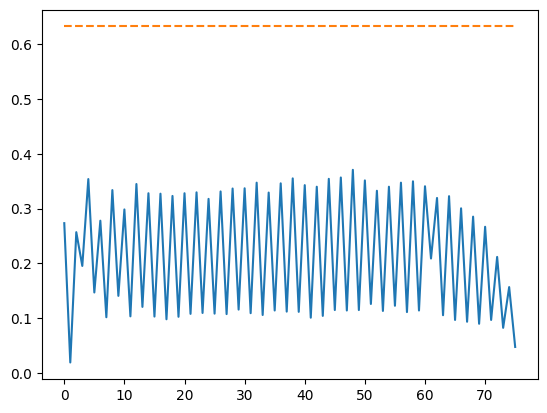

In [487]:
train_step = 60


n_p_bins = 40
bin_edges = np.linspace(0.5, np.max(p_A), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
Y = np.repeat(np.digitize(p_port, bin_edges).squeeze(), 2, axis=1)
# X = hiddens

X = hiddens_trimmed
Y = Y[exclude_batch_idxs][:, 2:-2]

assert Y.shape[0] == X.shape[0]
assert Y.shape[1] == X.shape[1]

x_train, x_test, y_train, y_test  = train_test_split(X[:, train_step, :], Y[:, train_step], test_size=0.2, random_state=41)

print(x_train.shape, y_train.shape)
model = LogisticRegression(solver='lbfgs', class_weight='balanced', multi_class='ovr', max_iter=1000, random_state=41)
model.fit(x_train, y_train)

y_pred = model.predict(x_train)
train_accuracy = accuracy_score(y_train, y_pred)

accuracies = []
for test_step in range(action_trimmed.shape[-1]):
    if test_step == train_step:
        x = x_test
        y = y_test
    else:
        x = X[:, test_step, :]
        y = Y[:, test_step]
    
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies.append(accuracy)

plt.plot(accuracies)
plt.plot(np.ones_like(accuracies) * train_accuracy, '--')

In [448]:
import pandas as pd
from copy import copy

use_p_port = True
isolate_port_batches = True

if isolate_port_batches:
    n_port = 20
    exclude_port_set = np.arange(n_port)
    truth_array = np.isin(layouts, exclude_port_set)
    exclude_batch_idxs = np.all(truth_array, axis=1)
    print(np.count_nonzero(exclude_batch_idxs))
else:
    n_port = 20
    exclude_port_set = np.arange(n_port)
    truth_array = np.isin(layouts, exclude_port_set)
    exclude_batch_idxs = np.any(truth_array, axis=1)

n_p_bins = 40

# start_trial, end_trial = 1, -1
# action_trimmed = action[:, 2 * start_trial : 2 * end_trial]
# not_action_trimmed = not_action[:, 2 * start_trial : 2 * end_trial]
# target_choices = np.repeat(np.argmax(targets[:, 2 * start_trial : 2 * end_trial, -(Conf.port_dim + 1):-1], axis=-1)[:, 1::2], 2, axis=-1)
# correct = action_trimmed == target_choices

start_trial, end_trial = 1, -1
layouts_trimmed = layouts[exclude_batch_idxs]
action_trimmed = action[exclude_batch_idxs, 2 * start_trial : 2 * end_trial]
print(action_trimmed)
not_action_trimmed = not_action[exclude_batch_idxs, 2 * start_trial : 2 * end_trial]
target_choices = np.repeat(np.argmax(targets[exclude_batch_idxs, 2 * start_trial : 2 * end_trial, -(Conf.port_dim + 1):-1], axis=-1)[:, 1::2], 2, axis=-1)
correct = action_trimmed == target_choices
hiddens_trimmed = hiddens[exclude_batch_idxs, 2 * start_trial : 2 * end_trial]

print(np.sum(correct)/correct.size)
if use_p_port:
    p_port = copy(p_A)
    p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
    p_A_trimmed = np.repeat(p_port[exclude_batch_idxs], 2, axis=1)[:, 2 * start_trial : 2 * end_trial]
    bin_edges = np.linspace(0.5, np.max(p_A_trimmed), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
else:
    p_A_trimmed = np.repeat(p_A[exclude_batch_idxs], 2, axis=1)[:, 2 * start_trial : 2 * end_trial]
    bin_edges = np.linspace(np.min(p_A_trimmed), np.max(p_A_trimmed), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins

p_bins = np.digitize(p_A_trimmed, bin_edges).squeeze()

steps = np.repeat(np.tile(np.arange(2), action_trimmed.shape[1] // 2)[np.newaxis, :], action_trimmed.shape[0], axis=0)
print(action_trimmed.shape, p_bins.shape, steps.shape, correct.shape)

assert steps.shape == action_trimmed.shape

datas = []

for step in range(2):
    for port in range(n_port):
        for prob in range(n_p_bins):
            # idxs = np.where((action_trimmed[:, ::2] == port) & (p_bins == prob))
            # idxs = np.where((action_trimmed == port) & (p_bins == prob) & (steps == step))
            idxs = np.where((action_trimmed == port) & (p_bins == prob) & (steps == step) & (correct))

            n_elem = len(idxs[0])

            # hid_data = hiddens[idxs]
            row_idx_data = np.expand_dims(idxs[0], -1)
            col_idx_data = np.expand_dims(idxs[1], -1)
            port_data = int(port) * np.ones((n_elem, 1), dtype=np.int64)
            step_data = int(step) * np.ones((n_elem, 1), dtype=np.int64)
            prob_data = int(prob) * np.ones((n_elem, 1), dtype=np.int64)

            data = np.concatenate([step_data, port_data, prob_data, row_idx_data, col_idx_data], axis=1)
            print(f'step {step}, port {port}, prob {prob}, shape {data.shape}')
            # print(data)
            # break
            datas.append(data)

datas = np.concatenate(datas, axis=0)
print(datas.shape)

df = pd.DataFrame(datas)
df.columns = ['step', 'port', 'prob', 'row', 'col']

# X = np.concatenate(xs)
# Y = np.concatenate(ys)

# y = hiddens[choice_zero_idxs]
# x = np.ones((y.shape[0], 1))
# print(x.shape)
# y.shape is (2141, 1024)
# I want to train a linear regression model with Lasso regularization to predict the 2141 batches, from x

2435
[[11 11 11 ...  0  0  0]
 [ 4  4  4 ...  4  7  7]
 [17 17 17 ... 17 17 17]
 ...
 [14 14 14 ... 14 19 19]
 [18 18 18 ... 15 15 15]
 [ 0  0  0 ...  0  0  0]]
0.9992434885982925
(2435, 76) (2435, 76) (2435, 76) (2435, 76)
step 0, port 0, prob 0, shape (163, 5)
step 0, port 0, prob 1, shape (140, 5)
step 0, port 0, prob 2, shape (37, 5)
step 0, port 0, prob 3, shape (126, 5)
step 0, port 0, prob 4, shape (125, 5)
step 0, port 0, prob 5, shape (222, 5)
step 0, port 0, prob 6, shape (181, 5)
step 0, port 0, prob 7, shape (139, 5)
step 0, port 0, prob 8, shape (70, 5)
step 0, port 0, prob 9, shape (51, 5)
step 0, port 0, prob 10, shape (84, 5)
step 0, port 0, prob 11, shape (43, 5)
step 0, port 0, prob 12, shape (26, 5)
step 0, port 0, prob 13, shape (10, 5)
step 0, port 0, prob 14, shape (29, 5)
step 0, port 0, prob 15, shape (58, 5)
step 0, port 0, prob 16, shape (86, 5)
step 0, port 0, prob 17, shape (138, 5)
step 0, port 0, prob 18, shape (130, 5)
step 0, port 0, prob 19, shape (91, 

In [321]:
import numpy as np

# mask = (df['step'] == step) & (df['port'] == port) & (df['prob'] == prob)
mask = None
remove_dead_neurons = True

def indices_to_onehot(indices):
    dim1, dim2, dim3 = 2, n_port, n_p_bins
    num_samples = indices.shape[0]
    num_classes = dim1 * dim2 * dim3
    onehot = np.zeros((num_samples, num_classes), dtype=np.float32)
    print(onehot.shape)
    onehot[np.arange(num_samples), indices[:, 0] * (dim2 * dim3) + indices[:, 1] * dim3 + indices[:, 2]] = 1
    return onehot

def get_xy(df, mask, hiddens_trimmed, scale=True, remove_dead_neurons=False):
    df_masked = df[mask] if mask is not None else df
    row = df_masked['row']
    col = df_masked['col']

    y = copy(hiddens_trimmed[row, col])

    if remove_dead_neurons:
        keep_idxs = np.where(~np.all(y == 0, axis=(0)))[0]
        y = y[:, keep_idxs]

    if scale:
        y -= np.mean(y, axis=0)
        y /= np.std(y, axis=0)
        y = y[:,~np.isnan(y).any(axis=0)]

    x_ = pd.concat([df_masked['step'], df_masked['port'], df_masked['prob']], axis=1).to_numpy()

    x = indices_to_onehot(x_)
    return x, y

# hiddens_trimmed = hiddens[:, 2*start_trial : 2*end_trial, :]

if remove_dead_neurons:
    keep_idxs = np.where(~np.all(hiddens_trimmed == 0, axis=(0,1)))[0]
    hiddens_trimmed = hiddens_trimmed[:, :, keep_idxs]

x, y = get_xy(df, mask, hiddens_trimmed, scale=False, remove_dead_neurons=False)

print(x.shape, y.shape)

(184918, 1600)
(184918, 1600) (184918, 831)


In [322]:
print(df)

        step  port  prob   row  col
0          0     0     0    42   22
1          0     0     0    63    2
2          0     0     0    90   56
3          0     0     0   110   54
4          0     0     0   170    2
...      ...   ...   ...   ...  ...
184913     1    19    39  2364   27
184914     1    19    39  2405   51
184915     1    19    39  2421   43
184916     1    19    39  2421   45
184917     1    19    39  2428   47

[184918 rows x 5 columns]


In [323]:
import numpy as np
from sklearn.linear_model import Lasso, LinearRegression
from tqdm import tqdm
from sklearn.metrics import mean_squared_error

# You would typically train one model per feature in y if you're trying to predict each feature independently
# Initialize an empty list to store models
losses_models = []

coeffs, losses_test, losses_train = [], [], []

# Loop over each feature in y
for i in tqdm(range(0, y.shape[-1])):
    # Initialize the Lasso model. You can adjust the alpha parameter to control the amount of regularization
    lasso = Lasso(alpha=1e-5, max_iter=1000)  # Example alpha, adjust based on your needs
    # lasso = LinearRegression()

    x_train, x_test, y_train, y_test = train_test_split(x, y[:, i], test_size=0.5) 

    # Fit the model to the data
    # Note: y[:, i] selects the i-th feature across all samples
    lasso.fit(x_train, y_train)

    y_pred = lasso.predict(x_test)
    test_loss = mean_squared_error(y_test, y_pred)
    losses_test.append(test_loss)

    y_pred = lasso.predict(x_train)
    train_loss = mean_squared_error(y_train, y_pred)
    losses_train.append(train_loss)

    # print(f'Train: {train_loss},\tTest: {test_loss}')
    # Store the trained model
    coeffs.append(lasso.coef_)

  0%|          | 0/831 [00:00<?, ?it/s]

  0%|          | 1/831 [00:02<32:27,  2.35s/it]

Train: 8.784855890553445e-05,	Test: 8.938656537793577e-05


  0%|          | 2/831 [00:04<28:20,  2.05s/it]

Train: 8.781904762145132e-05,	Test: 8.97433637874201e-05


  0%|          | 3/831 [00:05<26:28,  1.92s/it]

Train: 7.938208727864549e-05,	Test: 7.981093949638307e-05


  0%|          | 4/831 [00:07<25:43,  1.87s/it]

Train: 0.00027278836932964623,	Test: 0.0002772848238237202


  1%|          | 5/831 [00:09<25:05,  1.82s/it]

Train: 2.72104844043497e-05,	Test: 2.636647150211502e-05


  1%|          | 6/831 [00:11<27:55,  2.03s/it]

Train: 0.0008474147180095315,	Test: 0.0008707958040758967


  1%|          | 7/831 [00:13<27:10,  1.98s/it]

Train: 0.00012319456436671317,	Test: 0.0001236685347976163


  1%|          | 8/831 [00:15<26:18,  1.92s/it]

Train: 8.271584374597296e-05,	Test: 8.330388664035127e-05


  1%|          | 9/831 [00:17<25:10,  1.84s/it]

Train: 0.0001287141494685784,	Test: 0.00013087636034470052


  1%|          | 10/831 [00:18<24:19,  1.78s/it]

Train: 0.00013684546865988523,	Test: 0.00013902067439630628


  1%|▏         | 11/831 [00:20<23:41,  1.73s/it]

Train: 4.720751167042181e-05,	Test: 4.924375389236957e-05


  1%|▏         | 12/831 [00:22<23:29,  1.72s/it]

Train: 8.431503374595195e-05,	Test: 8.629515650682151e-05


  2%|▏         | 13/831 [00:23<22:00,  1.61s/it]

Train: 3.091908365604468e-05,	Test: 3.01963955280371e-05


  2%|▏         | 14/831 [00:25<22:17,  1.64s/it]

Train: 9.638164920033887e-05,	Test: 9.883084567263722e-05


  2%|▏         | 15/831 [00:27<23:08,  1.70s/it]

Train: 0.00011717382585629821,	Test: 0.00011780104978242889


  2%|▏         | 16/831 [00:28<23:12,  1.71s/it]

Train: 6.95094422553666e-05,	Test: 7.058592018438503e-05


  2%|▏         | 17/831 [00:30<24:04,  1.77s/it]

Train: 0.00017700988973956555,	Test: 0.00017859216313809156


  2%|▏         | 18/831 [00:32<24:15,  1.79s/it]

Train: 0.00010935435420833528,	Test: 0.00011264381464570761


  2%|▏         | 19/831 [00:34<23:58,  1.77s/it]

Train: 8.491664630128071e-05,	Test: 8.572140359319746e-05


  2%|▏         | 20/831 [00:35<23:23,  1.73s/it]

Train: 3.213126183254644e-05,	Test: 3.1344668968813494e-05


  3%|▎         | 21/831 [00:37<23:18,  1.73s/it]

Train: 0.0001402890047756955,	Test: 0.0001432688586646691


  3%|▎         | 22/831 [00:39<22:24,  1.66s/it]

Train: 1.0501907610205308e-07,	Test: 9.649949106460554e-08


  3%|▎         | 23/831 [00:41<23:05,  1.71s/it]

Train: 0.00012623985821846873,	Test: 0.0001269724452868104


  3%|▎         | 24/831 [00:42<23:12,  1.73s/it]

Train: 9.191392018692568e-05,	Test: 9.524825873086229e-05


  3%|▎         | 25/831 [00:44<23:29,  1.75s/it]

Train: 0.000142917619086802,	Test: 0.00014310999540612102


  3%|▎         | 26/831 [00:46<22:15,  1.66s/it]

Train: 6.026903793099336e-05,	Test: 6.180602213134989e-05


  3%|▎         | 27/831 [00:47<22:15,  1.66s/it]

Train: 0.00010724436288001016,	Test: 0.00010862223280128092


  3%|▎         | 28/831 [00:49<22:31,  1.68s/it]

Train: 0.00010997188655892387,	Test: 0.00010956301412079483


  3%|▎         | 29/831 [00:51<22:36,  1.69s/it]

Train: 0.00010151807509828359,	Test: 0.00010176342038903385


  4%|▎         | 30/831 [00:52<22:08,  1.66s/it]

Train: 7.333268877118826e-05,	Test: 7.620758697157726e-05


  4%|▎         | 31/831 [00:54<21:55,  1.64s/it]

Train: 0.0001078197019523941,	Test: 0.00010941919026663527


  4%|▍         | 32/831 [00:56<22:02,  1.66s/it]

Train: 0.00028404733166098595,	Test: 0.00028811825904995203


  4%|▍         | 33/831 [00:57<21:54,  1.65s/it]

Train: 0.00011089329927926883,	Test: 0.00011237918079132214


  4%|▍         | 34/831 [00:59<21:57,  1.65s/it]

Train: 9.569848771207035e-05,	Test: 9.844154556049034e-05


  4%|▍         | 35/831 [01:01<22:35,  1.70s/it]

Train: 0.0003685395931825042,	Test: 0.0003749371971935034


  4%|▍         | 36/831 [01:02<21:13,  1.60s/it]

Train: 2.6623729354469106e-05,	Test: 2.701297307794448e-05


  4%|▍         | 37/831 [01:04<20:54,  1.58s/it]

Train: 8.401527156820521e-05,	Test: 8.706856169737875e-05


  5%|▍         | 38/831 [01:05<22:04,  1.67s/it]

Train: 0.000304336310364306,	Test: 0.0003075995482504368


  5%|▍         | 39/831 [01:08<24:11,  1.83s/it]

Train: 0.0007061316864565015,	Test: 0.0007120841182768345


  5%|▍         | 40/831 [01:09<23:11,  1.76s/it]

Train: 7.956730405567214e-05,	Test: 7.810688839526847e-05


  5%|▍         | 41/831 [01:11<22:56,  1.74s/it]

Train: 9.06619243323803e-05,	Test: 9.629617852624506e-05


  5%|▌         | 42/831 [01:13<22:23,  1.70s/it]

Train: 0.00018404830188956112,	Test: 0.00018654328596312553


  5%|▌         | 43/831 [01:14<22:00,  1.68s/it]

Train: 6.41520819044672e-05,	Test: 6.476735870819539e-05


  5%|▌         | 44/831 [01:16<21:43,  1.66s/it]

Train: 3.8957863580435514e-05,	Test: 3.934089545509778e-05


  5%|▌         | 45/831 [01:17<21:23,  1.63s/it]

Train: 6.086080247769132e-05,	Test: 6.15595345152542e-05


  6%|▌         | 46/831 [01:19<20:14,  1.55s/it]

Train: 2.3040271912577737e-08,	Test: 1.3659798625553776e-08


  6%|▌         | 47/831 [01:20<20:28,  1.57s/it]

Train: 7.767404895275831e-05,	Test: 7.896326860645786e-05


  6%|▌         | 48/831 [01:22<20:22,  1.56s/it]

Train: 0.00010511888103792444,	Test: 0.00010757722338894382


  6%|▌         | 49/831 [01:23<19:36,  1.50s/it]

Train: 6.624277011724189e-05,	Test: 6.84480182826519e-05


  6%|▌         | 50/831 [01:25<21:02,  1.62s/it]

Train: 0.00036415259819477797,	Test: 0.0003607150574680418


  6%|▌         | 51/831 [01:27<21:28,  1.65s/it]

Train: 0.000216229964280501,	Test: 0.00022539938800036907


  6%|▋         | 52/831 [01:29<21:41,  1.67s/it]

Train: 9.954791312338784e-05,	Test: 0.00010273677617078647


  6%|▋         | 53/831 [01:30<21:38,  1.67s/it]

Train: 0.00014951577759347856,	Test: 0.00015113205881789327


  6%|▋         | 54/831 [01:32<21:36,  1.67s/it]

Train: 0.00014734639262314886,	Test: 0.00015244698442984372


  7%|▋         | 55/831 [01:34<22:44,  1.76s/it]

Train: 0.000560553977265954,	Test: 0.000571361044421792


  7%|▋         | 56/831 [01:35<21:35,  1.67s/it]

Train: 6.0855734773213044e-05,	Test: 5.9718877309933305e-05


  7%|▋         | 57/831 [01:37<21:11,  1.64s/it]

Train: 4.3572774302447215e-05,	Test: 4.421459379955195e-05


  7%|▋         | 58/831 [01:38<20:53,  1.62s/it]

Train: 0.00013035477604717016,	Test: 0.00013191103062126786


  7%|▋         | 59/831 [01:40<20:31,  1.60s/it]

Train: 1.0680015293473843e-05,	Test: 1.1013844414264895e-05


  7%|▋         | 60/831 [01:42<20:45,  1.61s/it]

Train: 6.800344999646768e-05,	Test: 6.96356946718879e-05


  7%|▋         | 61/831 [01:43<20:56,  1.63s/it]

Train: 0.00022629566956311464,	Test: 0.00022711887140758336


  7%|▋         | 62/831 [01:45<21:39,  1.69s/it]

Train: 0.00036257566534914076,	Test: 0.0003624476958066225


  8%|▊         | 63/831 [01:47<20:55,  1.64s/it]

Train: 8.811064617475495e-06,	Test: 8.604707545600832e-06


  8%|▊         | 64/831 [01:48<21:01,  1.64s/it]

Train: 0.00010204263526247814,	Test: 0.0001048904232447967


  8%|▊         | 65/831 [01:50<20:58,  1.64s/it]

Train: 6.973696872591972e-05,	Test: 7.032902067294344e-05


  8%|▊         | 66/831 [01:52<20:58,  1.64s/it]

Train: 0.0003154169535264373,	Test: 0.00032218327396549284


  8%|▊         | 67/831 [01:53<20:02,  1.57s/it]

Train: 0.0001254109083674848,	Test: 0.00012348378368187696


  8%|▊         | 68/831 [01:54<19:07,  1.50s/it]

Train: 0.00017213590035680681,	Test: 0.00017439010844100267


  8%|▊         | 69/831 [01:56<20:18,  1.60s/it]

Train: 0.00019926762615796179,	Test: 0.0002095670934068039


  8%|▊         | 70/831 [01:58<19:26,  1.53s/it]

Train: 0.00013206801668275148,	Test: 0.00013212405610829592


  9%|▊         | 71/831 [01:59<19:38,  1.55s/it]

Train: 0.000138751114718616,	Test: 0.00014577904948964715


  9%|▊         | 72/831 [02:00<18:44,  1.48s/it]

Train: 6.292293983278796e-05,	Test: 6.550511170644313e-05


  9%|▉         | 73/831 [02:02<19:17,  1.53s/it]

Train: 0.00010980037768604234,	Test: 0.00011094297951785848


  9%|▉         | 74/831 [02:04<21:06,  1.67s/it]

Train: 9.284265252063051e-05,	Test: 9.423484152648598e-05


  9%|▉         | 75/831 [02:06<22:51,  1.81s/it]

Train: 0.00040812359657138586,	Test: 0.0004139229713473469


  9%|▉         | 76/831 [02:08<22:58,  1.83s/it]

Train: 9.793133358471096e-05,	Test: 0.00010302433656761423


  9%|▉         | 77/831 [02:10<21:55,  1.74s/it]

Train: 1.361622526019346e-05,	Test: 1.284297013626201e-05


  9%|▉         | 78/831 [02:12<22:23,  1.78s/it]

Train: 0.005477505270391703,	Test: 0.005509442649781704


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
 10%|▉         | 79/831 [02:40<2:01:16,  9.68s/it]

Train: 0.0,	Test: 2.1002276306969492e-11


 10%|▉         | 80/831 [02:41<1:31:25,  7.30s/it]

Train: 7.030680717434734e-05,	Test: 7.023461512289941e-05


 10%|▉         | 81/831 [02:43<1:10:19,  5.63s/it]

Train: 9.349315223516896e-05,	Test: 9.419295383850113e-05


 10%|▉         | 82/831 [02:45<55:39,  4.46s/it]  

Train: 0.00011608891509240493,	Test: 0.0001146753056673333


 10%|▉         | 83/831 [02:47<46:16,  3.71s/it]

Train: 0.0004175813519395888,	Test: 0.0004226529854349792


 10%|█         | 84/831 [02:49<38:51,  3.12s/it]

Train: 0.00031334845698438585,	Test: 0.0003124124777968973


 10%|█         | 85/831 [02:50<32:34,  2.62s/it]

Train: 7.046569862723118e-06,	Test: 7.122101123968605e-06


 10%|█         | 86/831 [02:52<29:24,  2.37s/it]

Train: 9.703278919914737e-05,	Test: 9.751334437169135e-05


 10%|█         | 87/831 [02:54<27:37,  2.23s/it]

Train: 0.00011215860286029056,	Test: 0.00011653755063889548


 11%|█         | 88/831 [02:55<25:31,  2.06s/it]

Train: 8.68437418830581e-05,	Test: 8.681420149514452e-05


 11%|█         | 89/831 [02:57<24:27,  1.98s/it]

Train: 0.00015199120389297605,	Test: 0.0001522092061350122


 11%|█         | 90/831 [02:59<23:07,  1.87s/it]

Train: 0.00016960210632532835,	Test: 0.0001703354500932619


 11%|█         | 91/831 [03:00<22:15,  1.80s/it]

Train: 0.00010348459181841463,	Test: 0.00010365910566179082


 11%|█         | 92/831 [03:02<21:55,  1.78s/it]

Train: 4.5059132389724255e-05,	Test: 4.580082168104127e-05


 11%|█         | 93/831 [03:04<21:35,  1.76s/it]

Train: 7.974031177582219e-05,	Test: 8.181208977475762e-05


 11%|█▏        | 94/831 [03:06<21:28,  1.75s/it]

Train: 0.00036631597322411835,	Test: 0.00036751225707121193


 11%|█▏        | 95/831 [03:07<21:27,  1.75s/it]

Train: 0.00016292101645376533,	Test: 0.000168372193002142


 12%|█▏        | 96/831 [03:09<21:30,  1.76s/it]

Train: 0.00025046264636330307,	Test: 0.00025130872381851077


 12%|█▏        | 97/831 [03:11<21:16,  1.74s/it]

Train: 0.0001190539333038032,	Test: 0.0001197020392282866


 12%|█▏        | 98/831 [03:12<20:52,  1.71s/it]

Train: 0.00012766818690579385,	Test: 0.000128861895063892


 12%|█▏        | 99/831 [03:14<20:27,  1.68s/it]

Train: 8.897878433344886e-05,	Test: 8.905391587177292e-05


 12%|█▏        | 100/831 [03:16<20:17,  1.67s/it]

Train: 0.00013816369755659252,	Test: 0.00013906354433856905


 12%|█▏        | 101/831 [03:17<20:08,  1.65s/it]

Train: 0.00015801582776475698,	Test: 0.00015983796038199216


 12%|█▏        | 102/831 [03:19<20:58,  1.73s/it]

Train: 0.0002954553929157555,	Test: 0.0002997142728418112


 12%|█▏        | 103/831 [03:21<21:09,  1.74s/it]

Train: 0.0001751195959514007,	Test: 0.00017710536485537887


 13%|█▎        | 104/831 [03:22<20:06,  1.66s/it]

Train: 2.671962465683464e-05,	Test: 2.7721116566681303e-05


 13%|█▎        | 105/831 [03:24<20:22,  1.68s/it]

Train: 0.0002093325019814074,	Test: 0.00021175967413000762


 13%|█▎        | 106/831 [03:26<19:24,  1.61s/it]

Train: 6.849209603387862e-05,	Test: 7.073126471368596e-05


 13%|█▎        | 107/831 [03:27<19:39,  1.63s/it]

Train: 6.05279637966305e-05,	Test: 6.1026166804367676e-05


 13%|█▎        | 108/831 [03:29<19:57,  1.66s/it]

Train: 7.297834235941991e-05,	Test: 7.319853466469795e-05


 13%|█▎        | 109/831 [03:31<20:06,  1.67s/it]

Train: 0.0001011200511129573,	Test: 0.00010441073391120881


 13%|█▎        | 110/831 [03:32<20:01,  1.67s/it]

Train: 8.433185575995594e-05,	Test: 8.385551336687058e-05


 13%|█▎        | 111/831 [03:34<20:36,  1.72s/it]

Train: 0.00022196692589204758,	Test: 0.00022546220861840993


 13%|█▎        | 112/831 [03:36<20:17,  1.69s/it]

Train: 4.7070967411855236e-05,	Test: 4.7779176384210587e-05


 14%|█▎        | 113/831 [03:37<19:14,  1.61s/it]

Train: 3.146881135762669e-05,	Test: 3.119474422419444e-05


 14%|█▎        | 114/831 [03:39<20:30,  1.72s/it]

Train: 0.00048071934725157917,	Test: 0.00048084507579915226


 14%|█▍        | 115/831 [03:41<20:52,  1.75s/it]

Train: 0.000241254543652758,	Test: 0.0002448335289955139


 14%|█▍        | 116/831 [03:43<21:19,  1.79s/it]

Train: 0.0002393115864833817,	Test: 0.00024098146241158247


 14%|█▍        | 117/831 [03:45<20:46,  1.75s/it]

Train: 8.840696682455018e-05,	Test: 9.108979429583997e-05


 14%|█▍        | 118/831 [03:46<20:47,  1.75s/it]

Train: 0.00015874703240115196,	Test: 0.00016684838919900358


 14%|█▍        | 119/831 [03:48<20:41,  1.74s/it]

Train: 0.00012167200475232676,	Test: 0.0001249668566742912


 14%|█▍        | 120/831 [03:50<20:38,  1.74s/it]

Train: 0.00018944685871247202,	Test: 0.00019005374633707106


 15%|█▍        | 121/831 [03:51<20:14,  1.71s/it]

Train: 6.30401773378253e-05,	Test: 6.420457793865353e-05


 15%|█▍        | 122/831 [03:53<20:20,  1.72s/it]

Train: 0.0002685948566067964,	Test: 0.00026952382177114487


 15%|█▍        | 123/831 [03:55<20:37,  1.75s/it]

Train: 0.0001342038158327341,	Test: 0.00013518152991309762


 15%|█▍        | 124/831 [03:57<20:22,  1.73s/it]

Train: 0.00016065436648204923,	Test: 0.00016285829769913107


 15%|█▌        | 125/831 [03:58<20:02,  1.70s/it]

Train: 5.939665061305277e-05,	Test: 6.045449845260009e-05


 15%|█▌        | 126/831 [04:00<19:47,  1.68s/it]

Train: 0.00014042800466995686,	Test: 0.00014655248378403485


 15%|█▌        | 127/831 [04:02<20:00,  1.70s/it]

Train: 0.00020243199833203107,	Test: 0.00020709619275294244


 15%|█▌        | 128/831 [04:03<20:00,  1.71s/it]

Train: 0.00039554754039272666,	Test: 0.00041188258910551667


 16%|█▌        | 129/831 [04:05<19:52,  1.70s/it]

Train: 0.00010051620483864099,	Test: 0.00010852666309801862


 16%|█▌        | 130/831 [04:07<19:42,  1.69s/it]

Train: 6.27060144324787e-05,	Test: 6.285966082941741e-05


 16%|█▌        | 131/831 [04:09<20:10,  1.73s/it]

Train: 0.00039810442831367254,	Test: 0.00039777709753252566


 16%|█▌        | 132/831 [04:10<19:52,  1.71s/it]

Train: 6.970886897761375e-05,	Test: 7.065584213705733e-05


 16%|█▌        | 133/831 [04:12<19:41,  1.69s/it]

Train: 8.54885220178403e-05,	Test: 8.528287435183302e-05


 16%|█▌        | 134/831 [04:14<19:38,  1.69s/it]

Train: 0.00022447777155321091,	Test: 0.00022997971973381937


 16%|█▌        | 135/831 [04:15<20:21,  1.76s/it]

Train: 0.00013603638217318803,	Test: 0.00013679346011485904


 16%|█▋        | 136/831 [04:17<19:55,  1.72s/it]

Train: 6.0837621276732534e-05,	Test: 6.0581362049560994e-05


 16%|█▋        | 137/831 [04:19<19:34,  1.69s/it]

Train: 1.0592683793220203e-05,	Test: 1.083174083760241e-05


 17%|█▋        | 138/831 [04:20<19:35,  1.70s/it]

Train: 7.975804328452796e-05,	Test: 8.097520185401663e-05


 17%|█▋        | 139/831 [04:22<19:26,  1.69s/it]

Train: 0.0002018115483224392,	Test: 0.00020057034271303564


 17%|█▋        | 140/831 [04:24<18:35,  1.61s/it]

Train: 4.1116381908068433e-05,	Test: 4.143453043070622e-05


 17%|█▋        | 141/831 [04:25<19:27,  1.69s/it]

Train: 0.00032259325962513685,	Test: 0.0003259444492869079


 17%|█▋        | 142/831 [04:27<19:08,  1.67s/it]

Train: 6.243168172659352e-05,	Test: 6.378535181283951e-05


 17%|█▋        | 143/831 [04:29<19:50,  1.73s/it]

Train: 0.0004877110477536917,	Test: 0.000494659470859915


 17%|█▋        | 144/831 [04:31<19:38,  1.71s/it]

Train: 4.893424193141982e-05,	Test: 5.111034261062741e-05


 17%|█▋        | 145/831 [04:32<19:35,  1.71s/it]

Train: 9.396151290275156e-05,	Test: 9.55633950070478e-05


 18%|█▊        | 146/831 [04:34<19:26,  1.70s/it]

Train: 0.00019869618699885905,	Test: 0.00019926100503653288


 18%|█▊        | 147/831 [04:36<19:40,  1.73s/it]

Train: 0.0001587346341693774,	Test: 0.00016089744167402387


 18%|█▊        | 148/831 [04:37<19:36,  1.72s/it]

Train: 0.00019250533659942448,	Test: 0.0001900225761346519


 18%|█▊        | 149/831 [04:39<18:26,  1.62s/it]

Train: 6.865291652502492e-05,	Test: 6.915569247212261e-05


 18%|█▊        | 150/831 [04:41<19:09,  1.69s/it]

Train: 0.0001533936447231099,	Test: 0.00015381647972390056


 18%|█▊        | 151/831 [04:43<19:44,  1.74s/it]

Train: 0.0005794340395368636,	Test: 0.0005819090874865651


 18%|█▊        | 152/831 [04:44<19:31,  1.73s/it]

Train: 6.856879190308973e-05,	Test: 6.975384167162701e-05


 18%|█▊        | 153/831 [04:46<19:50,  1.76s/it]

Train: 0.0002807238488458097,	Test: 0.0002852388715837151


 19%|█▊        | 154/831 [04:48<20:15,  1.80s/it]

Train: 0.0003963311028201133,	Test: 0.0003958112502004951


 19%|█▊        | 155/831 [04:50<20:03,  1.78s/it]

Train: 0.0003236866323277354,	Test: 0.00032827447284944355


 19%|█▉        | 156/831 [04:51<19:41,  1.75s/it]

Train: 8.37595434859395e-05,	Test: 8.561320282751694e-05


 19%|█▉        | 157/831 [04:53<19:54,  1.77s/it]

Train: 0.00017773469153326005,	Test: 0.0001795166463125497


 19%|█▉        | 158/831 [04:55<19:18,  1.72s/it]

Train: 5.996507024974562e-05,	Test: 5.890061947866343e-05


 19%|█▉        | 159/831 [04:56<19:00,  1.70s/it]

Train: 5.1135397370671853e-05,	Test: 5.194293407839723e-05


 19%|█▉        | 160/831 [04:58<18:57,  1.70s/it]

Train: 0.00016087009862530977,	Test: 0.00016307178884744644


 19%|█▉        | 161/831 [05:00<18:25,  1.65s/it]

Train: 8.528820762876421e-05,	Test: 8.645616617286578e-05


 19%|█▉        | 162/831 [05:01<18:26,  1.65s/it]

Train: 4.8482848796993494e-05,	Test: 4.785203782375902e-05


 20%|█▉        | 163/831 [05:03<18:29,  1.66s/it]

Train: 8.955594967119396e-05,	Test: 9.214516467181966e-05


 20%|█▉        | 164/831 [05:05<18:43,  1.68s/it]

Train: 0.00010182365804212168,	Test: 0.00010222100536338985


 20%|█▉        | 165/831 [05:07<18:50,  1.70s/it]

Train: 0.00014988354814704508,	Test: 0.00015635938325431198


 20%|█▉        | 166/831 [05:08<19:09,  1.73s/it]

Train: 0.00012007441546302289,	Test: 0.0001232361828442663


 20%|██        | 167/831 [05:10<19:55,  1.80s/it]

Train: 0.00017320585902780294,	Test: 0.0001775381970219314


 20%|██        | 168/831 [05:12<19:36,  1.78s/it]

Train: 6.683840183541179e-05,	Test: 6.819932605139911e-05


 20%|██        | 169/831 [05:14<19:23,  1.76s/it]

Train: 0.00015925882325973362,	Test: 0.0001605356956133619


 20%|██        | 170/831 [05:15<19:02,  1.73s/it]

Train: 0.00011258060112595558,	Test: 0.00011166416516061872


 21%|██        | 171/831 [05:17<18:57,  1.72s/it]

Train: 0.00015973098925314844,	Test: 0.0001625999720999971


 21%|██        | 172/831 [05:19<18:57,  1.73s/it]

Train: 0.00010940807987935841,	Test: 0.00011277916928520426


 21%|██        | 173/831 [05:21<18:49,  1.72s/it]

Train: 0.00029462447855621576,	Test: 0.0002954163355752826


 21%|██        | 174/831 [05:22<18:56,  1.73s/it]

Train: 0.0001282078301301226,	Test: 0.00013216855586506426


 21%|██        | 175/831 [05:24<18:57,  1.73s/it]

Train: 0.00018163019558414817,	Test: 0.00018220512720290571


 21%|██        | 176/831 [05:26<19:14,  1.76s/it]

Train: 6.45846885163337e-05,	Test: 6.563222268596292e-05


 21%|██▏       | 177/831 [05:28<20:07,  1.85s/it]

Train: 0.00046932633267715573,	Test: 0.00046967912930995226


 21%|██▏       | 178/831 [05:30<20:36,  1.89s/it]

Train: 0.0002761018695309758,	Test: 0.0002857310464605689


 22%|██▏       | 179/831 [05:32<19:43,  1.82s/it]

Train: 0.00020391118596307933,	Test: 0.00020881311502307653


 22%|██▏       | 180/831 [05:33<19:47,  1.82s/it]

Train: 9.307378059020266e-05,	Test: 9.592541755409911e-05


 22%|██▏       | 181/831 [05:35<19:07,  1.76s/it]

Train: 3.269773151259869e-05,	Test: 3.2857744372449815e-05


 22%|██▏       | 182/831 [05:37<18:54,  1.75s/it]

Train: 9.933968249242753e-05,	Test: 9.86566228675656e-05


 22%|██▏       | 183/831 [05:39<19:15,  1.78s/it]

Train: 5.583422171184793e-05,	Test: 5.5578020692337304e-05


 22%|██▏       | 184/831 [05:40<19:27,  1.80s/it]

Train: 5.679114110535011e-05,	Test: 5.788033377029933e-05


 22%|██▏       | 185/831 [05:43<20:22,  1.89s/it]

Train: 0.00019813200924545527,	Test: 0.00020488306472543627


 22%|██▏       | 186/831 [05:44<20:28,  1.91s/it]

Train: 4.743612589663826e-05,	Test: 4.7217272367561236e-05


 23%|██▎       | 187/831 [05:46<20:08,  1.88s/it]

Train: 0.0004476998292375356,	Test: 0.00045356625923886895


 23%|██▎       | 188/831 [05:48<19:11,  1.79s/it]

Train: 8.889982564141974e-05,	Test: 8.85412227944471e-05


 23%|██▎       | 189/831 [05:50<18:55,  1.77s/it]

Train: 9.147376840701327e-05,	Test: 9.382489952258766e-05


 23%|██▎       | 190/831 [05:51<18:22,  1.72s/it]

Train: 8.22064612293616e-05,	Test: 8.457756484858692e-05


 23%|██▎       | 191/831 [05:53<18:15,  1.71s/it]

Train: 0.0001418389583704993,	Test: 0.00014505654689855874


 23%|██▎       | 192/831 [05:55<19:12,  1.80s/it]

Train: 0.00019815677660517395,	Test: 0.00019972324662376195


 23%|██▎       | 193/831 [05:57<19:34,  1.84s/it]

Train: 0.00018759581143967807,	Test: 0.00019204489944968373


 23%|██▎       | 194/831 [05:58<18:48,  1.77s/it]

Train: 2.179679768232745e-06,	Test: 1.7826895373218576e-06


 23%|██▎       | 195/831 [06:04<31:53,  3.01s/it]

Train: 0.0006180398049764335,	Test: 0.0006281027453951538


 24%|██▎       | 196/831 [06:07<29:31,  2.79s/it]

Train: 6.874009704915807e-05,	Test: 6.897102866787463e-05


 24%|██▎       | 197/831 [06:09<26:50,  2.54s/it]

Train: 0.0001163968481705524,	Test: 0.00011730599362635985


 24%|██▍       | 198/831 [06:11<25:07,  2.38s/it]

Train: 0.00012068536307197064,	Test: 0.00012249241990502924


 24%|██▍       | 199/831 [06:13<25:01,  2.38s/it]

Train: 0.00018460306455381215,	Test: 0.00018970208475366235


 24%|██▍       | 200/831 [06:15<25:26,  2.42s/it]

Train: 0.00015546516806352884,	Test: 0.00015764635463710874


 24%|██▍       | 201/831 [06:18<24:16,  2.31s/it]

Train: 2.851241697499063e-05,	Test: 2.8538524929899722e-05


 24%|██▍       | 202/831 [06:20<23:14,  2.22s/it]

Train: 5.59923100809101e-05,	Test: 5.779554703622125e-05


 24%|██▍       | 203/831 [06:22<22:39,  2.17s/it]

Train: 0.00019972848531324416,	Test: 0.00020510185277089477


 25%|██▍       | 204/831 [06:23<20:38,  1.98s/it]

Train: 1.1401622032281011e-05,	Test: 1.24979278552928e-05


 25%|██▍       | 205/831 [06:25<19:45,  1.89s/it]

Train: 0.00015743254334665835,	Test: 0.00016445168876089156


 25%|██▍       | 206/831 [06:26<18:05,  1.74s/it]

Train: 1.9972057998529635e-05,	Test: 2.1043941160314716e-05


 25%|██▍       | 207/831 [06:28<19:39,  1.89s/it]

Train: 0.0002502397110220045,	Test: 0.00025384017499163747


 25%|██▌       | 208/831 [06:30<20:01,  1.93s/it]

Train: 0.00010478631884325296,	Test: 0.00010715564712882042


 25%|██▌       | 209/831 [06:32<18:53,  1.82s/it]

Train: 2.48691667259493e-09,	Test: 7.777007482445697e-09


 25%|██▌       | 210/831 [06:34<18:28,  1.78s/it]

Train: 0.00018977026047650725,	Test: 0.00019222020637243986


 25%|██▌       | 211/831 [06:35<18:24,  1.78s/it]

Train: 8.59027641126886e-05,	Test: 8.644579065730795e-05


 26%|██▌       | 212/831 [06:37<17:17,  1.68s/it]

Train: 0.000299621548037976,	Test: 0.0003035020490642637


 26%|██▌       | 213/831 [06:38<16:47,  1.63s/it]

Train: 2.1894591554882936e-05,	Test: 2.199385744461324e-05


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.617e-04, tolerance: 5.047e-04
  model = cd_fast.enet_coordinate_descent(
 26%|██▌       | 214/831 [07:07<1:41:21,  9.86s/it]

Train: 3.867251143674366e-05,	Test: 3.9322210795944557e-05


 26%|██▌       | 215/831 [07:09<1:15:11,  7.32s/it]

Train: 1.7992864741245285e-05,	Test: 1.7606813344173133e-05


 26%|██▌       | 216/831 [07:11<59:15,  5.78s/it]  

Train: 0.000475481734611094,	Test: 0.00048094504745677114


 26%|██▌       | 217/831 [07:13<46:50,  4.58s/it]

Train: 8.14678642200306e-05,	Test: 8.126860484480858e-05


 26%|██▌       | 218/831 [07:14<37:35,  3.68s/it]

Train: 6.92147295922041e-05,	Test: 7.123331306502223e-05


 26%|██▋       | 219/831 [07:16<31:05,  3.05s/it]

Train: 0.00012799998512491584,	Test: 0.00013003173808101565


 26%|██▋       | 220/831 [07:18<26:34,  2.61s/it]

Train: 0.00012407069152686745,	Test: 0.0001255978422705084


 27%|██▋       | 221/831 [07:19<23:31,  2.31s/it]

Train: 0.00011964257282670587,	Test: 0.00011949850886594504


 27%|██▋       | 222/831 [07:21<20:38,  2.03s/it]

Train: 3.7641410699507105e-07,	Test: 3.59728062448994e-07


 27%|██▋       | 223/831 [07:22<19:10,  1.89s/it]

Train: 8.895155770005658e-05,	Test: 9.129591489909217e-05


 27%|██▋       | 224/831 [07:24<18:25,  1.82s/it]

Train: 0.00030129836522974074,	Test: 0.00030679459450766444


 27%|██▋       | 225/831 [07:25<17:28,  1.73s/it]

Train: 3.716658341090806e-07,	Test: 1.9251186245128338e-07


 27%|██▋       | 226/831 [07:27<17:49,  1.77s/it]

Train: 0.0001169390743598342,	Test: 0.00012021502334391698


 27%|██▋       | 227/831 [07:29<16:49,  1.67s/it]

Train: 2.3477936338167638e-05,	Test: 2.372550625295844e-05


 27%|██▋       | 228/831 [07:31<18:06,  1.80s/it]

Train: 0.000538764288648963,	Test: 0.0005468635354191065


 28%|██▊       | 229/831 [07:32<16:58,  1.69s/it]

Train: 0.001385493902489543,	Test: 0.0013730708742514253


 28%|██▊       | 230/831 [07:34<16:28,  1.65s/it]

Train: 6.2679493566975e-05,	Test: 6.111035327194259e-05


 28%|██▊       | 231/831 [07:35<16:40,  1.67s/it]

Train: 9.601816418580711e-05,	Test: 9.676485206000507e-05


 28%|██▊       | 232/831 [07:37<16:49,  1.68s/it]

Train: 0.0002279816981172189,	Test: 0.00022981430811341852


 28%|██▊       | 233/831 [07:39<16:36,  1.67s/it]

Train: 0.00013206887524574995,	Test: 0.0001354222622467205


 28%|██▊       | 234/831 [07:40<16:34,  1.67s/it]

Train: 0.0001977296924451366,	Test: 0.00019899247854482383


 28%|██▊       | 235/831 [07:42<15:46,  1.59s/it]

Train: 0.0001840952900238335,	Test: 0.00018877619004342705


 28%|██▊       | 236/831 [07:44<16:02,  1.62s/it]

Train: 0.00010699201084207743,	Test: 0.00010786171333165839


 29%|██▊       | 237/831 [07:45<16:11,  1.64s/it]

Train: 4.9411653890274465e-05,	Test: 4.981033634976484e-05


 29%|██▊       | 238/831 [07:47<16:12,  1.64s/it]

Train: 0.00010810630192281678,	Test: 0.0001089731085812673


 29%|██▉       | 239/831 [07:48<15:54,  1.61s/it]

Train: 4.50757252110634e-05,	Test: 4.571952376863919e-05


 29%|██▉       | 240/831 [07:50<16:12,  1.65s/it]

Train: 0.0002677347220014781,	Test: 0.0002704873913899064


 29%|██▉       | 241/831 [07:52<16:29,  1.68s/it]

Train: 0.00042039647814817727,	Test: 0.00043163044028915465


 29%|██▉       | 242/831 [07:54<16:33,  1.69s/it]

Train: 0.0002203416806878522,	Test: 0.0002223190967924893


 29%|██▉       | 243/831 [07:55<16:31,  1.69s/it]

Train: 0.0002623293548822403,	Test: 0.0002674916759133339


 29%|██▉       | 244/831 [07:57<17:14,  1.76s/it]

Train: 0.0004275224346201867,	Test: 0.00043794684461317956


 29%|██▉       | 245/831 [07:59<16:49,  1.72s/it]

Train: 0.00016620040696579963,	Test: 0.00016747461631894112


 30%|██▉       | 246/831 [08:00<16:06,  1.65s/it]

Train: 1.5560802646419347e-10,	Test: 4.838342504420723e-10


 30%|██▉       | 247/831 [08:02<15:37,  1.61s/it]

Train: 9.450415745959617e-06,	Test: 9.22513208934106e-06


 30%|██▉       | 248/831 [08:03<15:30,  1.60s/it]

Train: 8.309948316309601e-05,	Test: 8.488557796226814e-05


 30%|██▉       | 249/831 [08:05<15:57,  1.64s/it]

Train: 0.0002594332327134907,	Test: 0.000261318200500682


 30%|███       | 250/831 [08:07<16:12,  1.67s/it]

Train: 0.00022453231213148683,	Test: 0.00022611350868828595


 30%|███       | 251/831 [08:09<16:08,  1.67s/it]

Train: 0.00014444353291764855,	Test: 0.00014552348875440657


 30%|███       | 252/831 [08:10<15:34,  1.61s/it]

Train: 0.0003804030711762607,	Test: 0.0003889263025484979


 30%|███       | 253/831 [08:12<15:25,  1.60s/it]

Train: 0.00022238495876081288,	Test: 0.0002254783030366525


 31%|███       | 254/831 [08:13<15:09,  1.58s/it]

Train: 7.945550896693021e-05,	Test: 8.119332051137462e-05


 31%|███       | 255/831 [08:15<15:14,  1.59s/it]

Train: 6.36013355688192e-05,	Test: 6.516846769955009e-05


 31%|███       | 256/831 [08:16<14:56,  1.56s/it]

Train: 0.0001074230603990145,	Test: 0.00011123414878966287


 31%|███       | 257/831 [08:18<15:02,  1.57s/it]

Train: 0.00028320419369265437,	Test: 0.0002846159623004496


 31%|███       | 258/831 [08:19<14:19,  1.50s/it]

Train: 1.6734515156713314e-05,	Test: 1.6748710550018586e-05


 31%|███       | 259/831 [08:21<14:52,  1.56s/it]

Train: 0.00022333662491291761,	Test: 0.00022540836653206497


 31%|███▏      | 260/831 [08:22<14:07,  1.48s/it]

Train: 2.254198625450954e-05,	Test: 2.278432839375455e-05


 31%|███▏      | 261/831 [08:24<14:44,  1.55s/it]

Train: 9.033198148244992e-05,	Test: 9.302556281909347e-05


 32%|███▏      | 262/831 [08:26<14:49,  1.56s/it]

Train: 8.756964234635234e-05,	Test: 9.225447865901515e-05


 32%|███▏      | 263/831 [08:27<14:45,  1.56s/it]

Train: 7.197428931249306e-05,	Test: 7.701379945501685e-05


 32%|███▏      | 264/831 [08:28<14:17,  1.51s/it]

Train: 2.148591920558829e-05,	Test: 2.2303767764242366e-05


 32%|███▏      | 265/831 [08:30<14:39,  1.55s/it]

Train: 0.0002659177116584033,	Test: 0.0002680538163986057


 32%|███▏      | 266/831 [08:32<14:38,  1.55s/it]

Train: 5.648249862133525e-05,	Test: 5.6950320868054405e-05


 32%|███▏      | 267/831 [08:33<14:43,  1.57s/it]

Train: 7.100572838680819e-05,	Test: 7.22979093552567e-05


 32%|███▏      | 268/831 [08:35<14:56,  1.59s/it]

Train: 0.00010528783604968339,	Test: 0.00010796848073368892


 32%|███▏      | 269/831 [08:37<15:46,  1.68s/it]

Train: 0.0005630209343507886,	Test: 0.0005794644239358604


 32%|███▏      | 270/831 [08:38<14:56,  1.60s/it]

Train: 2.417016986555609e-08,	Test: 1.6539907221613248e-08


 33%|███▎      | 271/831 [08:40<14:30,  1.55s/it]

Train: 2.755747664195951e-05,	Test: 2.777416921162512e-05


 33%|███▎      | 272/831 [08:41<14:08,  1.52s/it]

Train: 0.0002022508706431836,	Test: 0.00020350900012999773


 33%|███▎      | 273/831 [08:42<13:27,  1.45s/it]

Train: 3.521747657941887e-07,	Test: 3.8981437455731793e-07


 33%|███▎      | 274/831 [08:44<14:03,  1.51s/it]

Train: 0.0001190981492982246,	Test: 0.00011894755880348384


 33%|███▎      | 275/831 [08:46<14:45,  1.59s/it]

Train: 0.0004853511636611074,	Test: 0.0004904147936031222


 33%|███▎      | 276/831 [08:48<15:12,  1.64s/it]

Train: 0.0001899533235700801,	Test: 0.00018885635654442012


 33%|███▎      | 277/831 [08:49<15:37,  1.69s/it]

Train: 0.0003936641733162105,	Test: 0.00039806292625144124


 33%|███▎      | 278/831 [08:51<15:38,  1.70s/it]

Train: 0.0002844703267328441,	Test: 0.00028655288042500615


 34%|███▎      | 279/831 [08:53<15:35,  1.70s/it]

Train: 6.42289815004915e-05,	Test: 6.466911145253107e-05


 34%|███▎      | 280/831 [08:54<15:11,  1.65s/it]

Train: 5.853005131939426e-05,	Test: 5.77309874643106e-05


 34%|███▍      | 281/831 [08:56<14:04,  1.53s/it]

Train: 2.1405024419607344e-09,	Test: 4.333613912166356e-09


 34%|███▍      | 282/831 [08:57<14:28,  1.58s/it]

Train: 0.0001562630059197545,	Test: 0.00015759860980324447


 34%|███▍      | 283/831 [08:59<13:37,  1.49s/it]

Train: 6.126958032837138e-05,	Test: 6.0832877352368087e-05


 34%|███▍      | 284/831 [09:00<14:29,  1.59s/it]

Train: 0.00024141145695466548,	Test: 0.00024239222693722695


 34%|███▍      | 285/831 [09:02<14:31,  1.60s/it]

Train: 0.00010202283010585234,	Test: 0.0001032041254802607


 34%|███▍      | 286/831 [09:03<13:50,  1.52s/it]

Train: 8.002721733646467e-05,	Test: 8.235350105678663e-05


 35%|███▍      | 287/831 [09:05<13:24,  1.48s/it]

Train: 1.4450223773110338e-07,	Test: 1.3314389946117444e-07


 35%|███▍      | 288/831 [09:06<13:48,  1.53s/it]

Train: 9.799557301448658e-05,	Test: 9.959163435269147e-05


 35%|███▍      | 289/831 [09:08<14:13,  1.57s/it]

Train: 0.00032900527003221214,	Test: 0.0003297679068055004


 35%|███▍      | 290/831 [09:10<14:08,  1.57s/it]

Train: 0.00014414654287975281,	Test: 0.00014502336853183806


 35%|███▌      | 291/831 [09:11<14:10,  1.57s/it]

Train: 7.154962804634124e-05,	Test: 7.155864295782521e-05


 35%|███▌      | 292/831 [09:13<14:12,  1.58s/it]

Train: 5.647526268148795e-05,	Test: 5.6722306908341125e-05


 35%|███▌      | 293/831 [09:15<16:13,  1.81s/it]

Train: 0.00035468130954541266,	Test: 0.00036440487019717693


 35%|███▌      | 294/831 [09:18<19:06,  2.14s/it]

Train: 0.0004381801118142903,	Test: 0.0004395911528263241


 35%|███▌      | 295/831 [09:20<19:05,  2.14s/it]

Train: 0.0006094645359553397,	Test: 0.0006196025642566383


 36%|███▌      | 296/831 [09:22<17:52,  2.00s/it]

Train: 6.601998029509559e-05,	Test: 6.75338160363026e-05


 36%|███▌      | 297/831 [09:24<17:45,  2.00s/it]

Train: 0.00042358963401056826,	Test: 0.0004249154881108552


 36%|███▌      | 298/831 [09:25<16:39,  1.87s/it]

Train: 7.532154268119484e-05,	Test: 7.484560046577826e-05


 36%|███▌      | 299/831 [09:27<16:23,  1.85s/it]

Train: 0.0002964024606626481,	Test: 0.0002977940603159368


 36%|███▌      | 300/831 [09:29<16:23,  1.85s/it]

Train: 8.291461563203484e-05,	Test: 8.372356387553737e-05


 36%|███▌      | 301/831 [09:31<16:01,  1.81s/it]

Train: 0.0002069209876935929,	Test: 0.00020757045422215015


 36%|███▋      | 302/831 [09:33<15:51,  1.80s/it]

Train: 0.00022836553398519754,	Test: 0.00022823148174211383


 36%|███▋      | 303/831 [09:34<16:02,  1.82s/it]

Train: 0.00013111082080285996,	Test: 0.00013517559273168445


 37%|███▋      | 304/831 [09:36<16:11,  1.84s/it]

Train: 0.0006474542897194624,	Test: 0.0006592388963326812


 37%|███▋      | 305/831 [09:38<15:45,  1.80s/it]

Train: 0.0002542099682614207,	Test: 0.0002597114653326571


 37%|███▋      | 306/831 [09:40<15:52,  1.81s/it]

Train: 0.000251495890552178,	Test: 0.0002598496212158352


 37%|███▋      | 307/831 [09:42<16:08,  1.85s/it]

Train: 0.0004300552827771753,	Test: 0.0004353099793661386


 37%|███▋      | 308/831 [09:44<15:52,  1.82s/it]

Train: 0.0003298782685305923,	Test: 0.0003326109144836664


 37%|███▋      | 309/831 [09:45<15:22,  1.77s/it]

Train: 7.679516420466825e-05,	Test: 7.712888327660039e-05


 37%|███▋      | 310/831 [09:47<15:09,  1.75s/it]

Train: 8.339733903994784e-05,	Test: 8.36707913549617e-05


 37%|███▋      | 311/831 [09:49<14:58,  1.73s/it]

Train: 0.00011942060518776998,	Test: 0.0001221687998622656


 38%|███▊      | 312/831 [09:50<14:50,  1.72s/it]

Train: 0.00036937437835149467,	Test: 0.0003684269904624671


 38%|███▊      | 313/831 [09:52<14:47,  1.71s/it]

Train: 8.323397196363658e-05,	Test: 8.518162212567404e-05


 38%|███▊      | 314/831 [09:54<14:21,  1.67s/it]

Train: 2.2218910089577548e-05,	Test: 2.183485594287049e-05


 38%|███▊      | 315/831 [09:55<14:29,  1.69s/it]

Train: 0.00015816908853594214,	Test: 0.00015740781964268535


 38%|███▊      | 316/831 [09:57<14:43,  1.72s/it]

Train: 0.000371378700947389,	Test: 0.0003807122993748635


 38%|███▊      | 317/831 [09:59<14:46,  1.72s/it]

Train: 0.0002782406227197498,	Test: 0.0002832349855452776


 38%|███▊      | 318/831 [10:00<14:36,  1.71s/it]

Train: 6.871420191600919e-05,	Test: 6.997800664976239e-05


 38%|███▊      | 319/831 [10:02<14:44,  1.73s/it]

Train: 0.00046653710887767375,	Test: 0.0004707449988927692


 39%|███▊      | 320/831 [10:04<14:47,  1.74s/it]

Train: 0.00032132581691257656,	Test: 0.00031998573103919625


 39%|███▊      | 321/831 [10:06<15:01,  1.77s/it]

Train: 0.0001731783850118518,	Test: 0.00017606037727091461


 39%|███▊      | 322/831 [10:08<14:56,  1.76s/it]

Train: 0.00022302233264781535,	Test: 0.00022568805434275419


 39%|███▉      | 323/831 [10:10<15:18,  1.81s/it]

Train: 0.0004245988675393164,	Test: 0.00043225023546256125


 39%|███▉      | 324/831 [10:11<15:03,  1.78s/it]

Train: 0.00010035173909272999,	Test: 0.0001007463870337233


 39%|███▉      | 325/831 [10:13<13:45,  1.63s/it]

Train: 1.196008815895766e-05,	Test: 1.2110220268368721e-05


 39%|███▉      | 326/831 [10:14<13:59,  1.66s/it]

Train: 0.00011558308324310929,	Test: 0.00011763138900278136


 39%|███▉      | 327/831 [10:16<14:50,  1.77s/it]

Train: 0.0006606114911846817,	Test: 0.0006657026242464781


 39%|███▉      | 328/831 [10:18<14:10,  1.69s/it]

Train: 6.902813038323075e-05,	Test: 7.067531259963289e-05


 40%|███▉      | 329/831 [10:20<14:33,  1.74s/it]

Train: 0.0002089981862809509,	Test: 0.00021042914886493236


 40%|███▉      | 330/831 [10:21<14:00,  1.68s/it]

Train: 0.00014725190703757107,	Test: 0.00015377532690763474


 40%|███▉      | 331/831 [10:23<13:55,  1.67s/it]

Train: 0.0003030857187695801,	Test: 0.00030643114587292075


 40%|███▉      | 332/831 [10:24<12:57,  1.56s/it]

Train: 1.941324399012956e-06,	Test: 1.989508064070833e-06


 40%|████      | 333/831 [10:26<13:07,  1.58s/it]

Train: 0.00027066320762969553,	Test: 0.00027547634090296924


 40%|████      | 334/831 [10:28<13:35,  1.64s/it]

Train: 0.0001679123379290104,	Test: 0.0001675595121923834


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
 40%|████      | 335/831 [10:55<1:17:18,  9.35s/it]

Train: 0.0,	Test: 1.6555442572396828e-09


 40%|████      | 336/831 [10:57<58:51,  7.13s/it]  

Train: 0.00018414600344840437,	Test: 0.0001856107555795461


 41%|████      | 337/831 [10:59<45:34,  5.54s/it]

Train: 8.948698814492673e-05,	Test: 9.0697685664054e-05


 41%|████      | 338/831 [11:00<36:13,  4.41s/it]

Train: 7.594816270284355e-05,	Test: 7.693023508181795e-05


 41%|████      | 339/831 [11:02<29:17,  3.57s/it]

Train: 6.342911365209147e-05,	Test: 6.288362055784091e-05


 41%|████      | 340/831 [11:04<24:28,  2.99s/it]

Train: 0.00010088746785186231,	Test: 0.00010222822311334312


 41%|████      | 341/831 [11:05<21:27,  2.63s/it]

Train: 0.00015212420839816332,	Test: 0.0001564998528920114


 41%|████      | 342/831 [11:07<19:09,  2.35s/it]

Train: 0.0001981034001801163,	Test: 0.00020315776055213064


 41%|████▏     | 343/831 [11:09<17:34,  2.16s/it]

Train: 0.0002822464157361537,	Test: 0.0002836961066350341


 41%|████▏     | 344/831 [11:11<16:20,  2.01s/it]

Train: 0.0001559392549097538,	Test: 0.00016133717144839466


 42%|████▏     | 345/831 [11:12<15:22,  1.90s/it]

Train: 5.0896709581138566e-05,	Test: 5.192374374018982e-05


 42%|████▏     | 346/831 [11:14<14:11,  1.76s/it]

Train: 4.112899478059262e-05,	Test: 4.1112300095846877e-05


 42%|████▏     | 347/831 [11:15<14:22,  1.78s/it]

Train: 0.00011409287253627554,	Test: 0.00011338679905747995


 42%|████▏     | 348/831 [11:17<13:57,  1.73s/it]

Train: 9.383245196659118e-05,	Test: 9.480377048021182e-05


 42%|████▏     | 349/831 [11:18<13:08,  1.64s/it]

Train: 5.159319334779866e-05,	Test: 5.059908653493039e-05


 42%|████▏     | 350/831 [11:20<13:20,  1.66s/it]

Train: 0.00016094859165605158,	Test: 0.00016222924750763923


 42%|████▏     | 351/831 [11:22<13:08,  1.64s/it]

Train: 6.286937423283234e-05,	Test: 6.434052193071693e-05


 42%|████▏     | 352/831 [11:23<13:13,  1.66s/it]

Train: 0.00013637788651976734,	Test: 0.00013658966054208577


 42%|████▏     | 353/831 [11:25<13:25,  1.69s/it]

Train: 0.00013479830522555858,	Test: 0.00013772201782558113


 43%|████▎     | 354/831 [11:27<13:49,  1.74s/it]

Train: 0.0004297565028537065,	Test: 0.0004315075057093054


 43%|████▎     | 355/831 [11:29<13:04,  1.65s/it]

Train: 0.00012447440531104803,	Test: 0.00012166636588517576


 43%|████▎     | 356/831 [11:31<14:25,  1.82s/it]

Train: 9.043308818945661e-05,	Test: 9.206714457832277e-05


 43%|████▎     | 357/831 [11:33<14:23,  1.82s/it]

Train: 0.0003172415599692613,	Test: 0.00031672013574279845


 43%|████▎     | 358/831 [11:34<14:33,  1.85s/it]

Train: 0.004293015692383051,	Test: 0.004342786502093077


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.421e-04, tolerance: 1.284e-04
  model = cd_fast.enet_coordinate_descent(
 43%|████▎     | 359/831 [12:04<1:19:40, 10.13s/it]

Train: 1.3373150977713522e-05,	Test: 1.3190013305575121e-05


 43%|████▎     | 360/831 [12:06<1:00:01,  7.65s/it]

Train: 6.938244041521102e-05,	Test: 7.03767072991468e-05


 43%|████▎     | 361/831 [12:08<46:09,  5.89s/it]  

Train: 0.00016971351578831673,	Test: 0.00017048684821929783


 44%|████▎     | 362/831 [12:09<35:45,  4.58s/it]

Train: 0.00012694437464233488,	Test: 0.00013024048530496657


 44%|████▎     | 363/831 [12:11<28:58,  3.71s/it]

Train: 9.823209256865084e-05,	Test: 0.00010182643018197268


 44%|████▍     | 364/831 [12:13<24:15,  3.12s/it]

Train: 0.00010371109965490177,	Test: 0.00010536005720496178


 44%|████▍     | 365/831 [12:14<20:57,  2.70s/it]

Train: 8.6903506598901e-05,	Test: 9.019750723382458e-05


 44%|████▍     | 366/831 [12:16<18:34,  2.40s/it]

Train: 0.00021692112204618752,	Test: 0.0002179825387429446


 44%|████▍     | 367/831 [12:18<16:54,  2.19s/it]

Train: 9.099698218051344e-05,	Test: 9.187532123178244e-05


 44%|████▍     | 368/831 [12:20<16:11,  2.10s/it]

Train: 0.00015249988064169884,	Test: 0.0001550925080664456


 44%|████▍     | 369/831 [12:21<15:18,  1.99s/it]

Train: 0.00013661597040481865,	Test: 0.00013771821977570653


 45%|████▍     | 370/831 [12:23<14:40,  1.91s/it]

Train: 0.00011425051343394443,	Test: 0.00011510244075907394


 45%|████▍     | 371/831 [12:25<14:10,  1.85s/it]

Train: 5.25214163644705e-05,	Test: 5.304505612002686e-05


 45%|████▍     | 372/831 [12:26<13:36,  1.78s/it]

Train: 8.552092185709625e-05,	Test: 8.70753065100871e-05


 45%|████▍     | 373/831 [12:28<13:14,  1.74s/it]

Train: 0.000131099863210693,	Test: 0.00013298532576300204


 45%|████▌     | 374/831 [12:30<13:12,  1.74s/it]

Train: 0.00020104135910514742,	Test: 0.00020452991884667426


 45%|████▌     | 375/831 [12:31<13:06,  1.72s/it]

Train: 3.732185723492876e-05,	Test: 3.778561585932039e-05


 45%|████▌     | 376/831 [12:33<12:21,  1.63s/it]

Train: 1.7508944438304752e-05,	Test: 2.0521219994407147e-05


 45%|████▌     | 377/831 [12:34<12:01,  1.59s/it]

Train: 1.903122104351951e-08,	Test: 4.6627706140611735e-09


 45%|████▌     | 378/831 [12:36<11:49,  1.57s/it]

Train: 6.744957318005618e-06,	Test: 5.641823008772917e-06


 46%|████▌     | 379/831 [12:37<11:56,  1.59s/it]

Train: 5.954366133664735e-05,	Test: 5.9746820625150576e-05


 46%|████▌     | 380/831 [12:39<12:09,  1.62s/it]

Train: 0.00010018700413638726,	Test: 0.00010161989484913647


 46%|████▌     | 381/831 [12:41<12:41,  1.69s/it]

Train: 0.0004612206539604813,	Test: 0.000467108708107844


 46%|████▌     | 382/831 [12:43<12:36,  1.68s/it]

Train: 0.00014608155470341444,	Test: 0.00014758041652385145


 46%|████▌     | 383/831 [12:44<12:35,  1.69s/it]

Train: 6.923139881109819e-05,	Test: 6.809663318563253e-05


 46%|████▌     | 384/831 [12:46<12:43,  1.71s/it]

Train: 0.00013249900075607002,	Test: 0.00013186925207264721


 46%|████▋     | 385/831 [12:48<12:35,  1.70s/it]

Train: 4.665368760470301e-05,	Test: 4.598401937982999e-05


 46%|████▋     | 386/831 [12:50<12:46,  1.72s/it]

Train: 0.00018600173643790185,	Test: 0.0001891370484372601


 47%|████▋     | 387/831 [12:51<12:38,  1.71s/it]

Train: 0.00017866204143501818,	Test: 0.00017974700313061476


 47%|████▋     | 388/831 [12:53<12:32,  1.70s/it]

Train: 9.815277735469863e-05,	Test: 9.857884288066998e-05


 47%|████▋     | 389/831 [12:55<12:33,  1.71s/it]

Train: 4.9997699534287676e-05,	Test: 5.0109531002817675e-05


 47%|████▋     | 390/831 [12:56<12:28,  1.70s/it]

Train: 7.740255387034267e-05,	Test: 8.05479648988694e-05


 47%|████▋     | 391/831 [12:58<11:51,  1.62s/it]

Train: 7.012111780113628e-08,	Test: 8.144878904658981e-08


 47%|████▋     | 392/831 [13:00<12:45,  1.74s/it]

Train: 0.00025234874919988215,	Test: 0.0002552359364926815


 47%|████▋     | 393/831 [13:01<12:31,  1.71s/it]

Train: 0.00010109304275829345,	Test: 0.00010458005272084847


 47%|████▋     | 394/831 [13:03<12:52,  1.77s/it]

Train: 0.00015910629008430988,	Test: 0.00016245372535195202


 48%|████▊     | 395/831 [13:05<12:44,  1.75s/it]

Train: 7.291886868188158e-05,	Test: 6.983165076235309e-05


 48%|████▊     | 396/831 [13:07<12:22,  1.71s/it]

Train: 8.518948743585497e-05,	Test: 8.680933387950063e-05


 48%|████▊     | 397/831 [13:08<12:34,  1.74s/it]

Train: 0.0003676794876810163,	Test: 0.0003731345641426742


 48%|████▊     | 398/831 [13:10<12:27,  1.73s/it]

Train: 7.613647903781384e-05,	Test: 7.738437852822244e-05


 48%|████▊     | 399/831 [13:12<12:28,  1.73s/it]

Train: 0.0002227278018835932,	Test: 0.00022262644779402763


 48%|████▊     | 400/831 [13:14<12:11,  1.70s/it]

Train: 2.961642894661054e-05,	Test: 2.9939559681224637e-05


 48%|████▊     | 401/831 [13:15<12:09,  1.70s/it]

Train: 2.8722506613121368e-05,	Test: 2.8871760150650516e-05


 48%|████▊     | 402/831 [13:17<12:20,  1.73s/it]

Train: 8.818344940664247e-05,	Test: 9.117287117987871e-05


 48%|████▊     | 403/831 [13:19<12:28,  1.75s/it]

Train: 0.00013602331455331296,	Test: 0.00013561708328779787


 49%|████▊     | 404/831 [13:21<12:32,  1.76s/it]

Train: 0.00013902336650062352,	Test: 0.00014518362877424806


 49%|████▊     | 405/831 [13:22<12:35,  1.77s/it]

Train: 0.00010048323747469112,	Test: 0.00010342447058064863


 49%|████▉     | 406/831 [13:24<12:19,  1.74s/it]

Train: 0.00015855857054702938,	Test: 0.0001562959369039163


 49%|████▉     | 407/831 [13:26<12:31,  1.77s/it]

Train: 0.00012942372995894402,	Test: 0.00013062071229796857


 49%|████▉     | 408/831 [13:28<12:26,  1.76s/it]

Train: 9.430595673620701e-05,	Test: 9.610959386918694e-05


 49%|████▉     | 409/831 [13:29<12:07,  1.72s/it]

Train: 9.563109051669016e-05,	Test: 9.670504368841648e-05


 49%|████▉     | 410/831 [13:31<12:20,  1.76s/it]

Train: 0.000222634946112521,	Test: 0.0002262097696075216


 49%|████▉     | 411/831 [13:33<12:27,  1.78s/it]

Train: 7.60842885938473e-05,	Test: 7.843234925530851e-05


 50%|████▉     | 412/831 [13:35<13:20,  1.91s/it]

Train: 0.0009925253689289093,	Test: 0.0010133808245882392


 50%|████▉     | 413/831 [13:37<12:56,  1.86s/it]

Train: 7.700417336309329e-05,	Test: 7.766231283312663e-05


 50%|████▉     | 414/831 [13:39<13:32,  1.95s/it]

Train: 0.000693119247443974,	Test: 0.0007087421836331487


 50%|████▉     | 415/831 [13:41<13:05,  1.89s/it]

Train: 0.0001627320161787793,	Test: 0.0001694000093266368


 50%|█████     | 416/831 [13:43<13:09,  1.90s/it]

Train: 0.00044939739746041596,	Test: 0.0004554027982521802


 50%|█████     | 417/831 [13:45<13:16,  1.92s/it]

Train: 0.0005877374787814915,	Test: 0.0005936120287515223


 50%|█████     | 418/831 [13:47<13:25,  1.95s/it]

Train: 0.00040816765977069736,	Test: 0.0004169790481682867


 50%|█████     | 419/831 [13:49<13:08,  1.91s/it]

Train: 0.0001327121426584199,	Test: 0.0001352231192868203


 51%|█████     | 420/831 [13:50<12:34,  1.84s/it]

Train: 3.343370190123096e-05,	Test: 3.3234016882488504e-05


 51%|█████     | 421/831 [13:52<12:22,  1.81s/it]

Train: 9.777587547432631e-05,	Test: 9.750935714691877e-05


 51%|█████     | 422/831 [13:54<12:07,  1.78s/it]

Train: 6.711538298986852e-05,	Test: 6.724329432472587e-05


 51%|█████     | 423/831 [13:55<11:55,  1.75s/it]

Train: 8.270972466561943e-05,	Test: 8.231135143432766e-05


 51%|█████     | 424/831 [13:57<12:15,  1.81s/it]

Train: 0.0001597182999830693,	Test: 0.0001607472077012062


 51%|█████     | 425/831 [13:59<12:14,  1.81s/it]

Train: 8.753901784075424e-05,	Test: 8.879576489562169e-05


 51%|█████▏    | 426/831 [14:01<11:59,  1.78s/it]

Train: 5.811150185763836e-05,	Test: 5.7160283176926896e-05


 51%|█████▏    | 427/831 [14:02<11:46,  1.75s/it]

Train: 6.222091906238347e-05,	Test: 6.183199730003253e-05


 52%|█████▏    | 428/831 [14:04<12:06,  1.80s/it]

Train: 0.00012512471585068852,	Test: 0.00012774995411746204


 52%|█████▏    | 429/831 [14:06<12:02,  1.80s/it]

Train: 0.0003567032690625638,	Test: 0.00035694026155397296


 52%|█████▏    | 430/831 [14:08<11:45,  1.76s/it]

Train: 3.6383669794304296e-05,	Test: 3.617086622398347e-05


 52%|█████▏    | 431/831 [14:09<11:15,  1.69s/it]

Train: 7.86198961577611e-06,	Test: 8.196463568310719e-06


 52%|█████▏    | 432/831 [14:12<12:19,  1.85s/it]

Train: 0.00015904077736195177,	Test: 0.00015905137115623802


 52%|█████▏    | 433/831 [14:13<12:15,  1.85s/it]

Train: 8.615973638370633e-05,	Test: 8.732604328542948e-05


 52%|█████▏    | 434/831 [14:15<11:49,  1.79s/it]

Train: 4.491238492221328e-10,	Test: 2.2346231531855665e-09


 52%|█████▏    | 435/831 [14:17<12:17,  1.86s/it]

Train: 0.00023439290816895664,	Test: 0.00023463765683118254


 52%|█████▏    | 436/831 [14:19<13:06,  1.99s/it]

Train: 0.00016297218098770827,	Test: 0.00016691065684426576


 53%|█████▎    | 437/831 [14:21<13:02,  1.99s/it]

Train: 0.00022083160001784563,	Test: 0.00022313611407298595


 53%|█████▎    | 438/831 [14:24<13:36,  2.08s/it]

Train: 9.195277380058542e-05,	Test: 9.650481661083177e-05


 53%|█████▎    | 439/831 [14:26<13:48,  2.11s/it]

Train: 0.00013514723104890436,	Test: 0.00013808342919219285


 53%|█████▎    | 440/831 [14:28<13:22,  2.05s/it]

Train: 6.308969022938982e-05,	Test: 6.348735769279301e-05


 53%|█████▎    | 441/831 [14:30<12:55,  1.99s/it]

Train: 0.00012823475117329508,	Test: 0.00012908542703371495


 53%|█████▎    | 442/831 [14:32<12:51,  1.98s/it]

Train: 0.00023819170019123703,	Test: 0.00024224279331974685


 53%|█████▎    | 443/831 [14:33<11:59,  1.85s/it]

Train: 1.5589746908517554e-05,	Test: 1.526844425825402e-05


 53%|█████▎    | 444/831 [14:35<11:34,  1.79s/it]

Train: 8.458804950350896e-05,	Test: 8.654905832372606e-05


 54%|█████▎    | 445/831 [14:37<12:00,  1.87s/it]

Train: 0.0007008810061961412,	Test: 0.0007166226860135794


 54%|█████▎    | 446/831 [14:39<11:43,  1.83s/it]

Train: 0.00013051231508143246,	Test: 0.00013178211520425975


 54%|█████▍    | 447/831 [14:40<11:44,  1.83s/it]

Train: 0.00017494447820354253,	Test: 0.00017918368394020945


 54%|█████▍    | 448/831 [14:42<11:28,  1.80s/it]

Train: 0.00012052444071741775,	Test: 0.00012350270117167383


 54%|█████▍    | 449/831 [14:44<11:24,  1.79s/it]

Train: 8.700301987119019e-05,	Test: 8.769081614445895e-05


 54%|█████▍    | 450/831 [14:46<11:16,  1.78s/it]

Train: 0.00012156918091932312,	Test: 0.0001225538580911234


 54%|█████▍    | 451/831 [14:47<11:03,  1.75s/it]

Train: 0.00011294424621155486,	Test: 0.00011358553456375375


 54%|█████▍    | 452/831 [14:49<10:21,  1.64s/it]

Train: 3.745988942682743e-05,	Test: 3.7007372156949714e-05


 55%|█████▍    | 453/831 [14:50<10:24,  1.65s/it]

Train: 8.53507372085005e-05,	Test: 8.735390292713419e-05


 55%|█████▍    | 454/831 [14:52<10:28,  1.67s/it]

Train: 8.789117418928072e-05,	Test: 8.916228398447856e-05


 55%|█████▍    | 455/831 [14:54<11:32,  1.84s/it]

Train: 0.000691117427777499,	Test: 0.0006983552011661232


 55%|█████▍    | 456/831 [14:56<11:14,  1.80s/it]

Train: 0.0001244088780367747,	Test: 0.00012406219320837408


 55%|█████▍    | 457/831 [14:58<10:51,  1.74s/it]

Train: 0.00010950173600576818,	Test: 0.0001089181678253226


 55%|█████▌    | 458/831 [14:59<10:51,  1.75s/it]

Train: 0.00010961700172629207,	Test: 0.00011262321640970185


 55%|█████▌    | 459/831 [15:02<11:51,  1.91s/it]

Train: 0.00011469504534034058,	Test: 0.00011828171409433708


 55%|█████▌    | 460/831 [15:04<12:25,  2.01s/it]

Train: 0.00023037209757603705,	Test: 0.00024020361888688058


 55%|█████▌    | 461/831 [15:06<13:17,  2.16s/it]

Train: 0.00025065115187317133,	Test: 0.00025184592232108116


 56%|█████▌    | 462/831 [15:09<13:23,  2.18s/it]

Train: 0.00019298536062706262,	Test: 0.00019411394896451384


 56%|█████▌    | 463/831 [15:11<13:33,  2.21s/it]

Train: 9.562663763063028e-05,	Test: 9.679971117293462e-05


 56%|█████▌    | 464/831 [15:13<12:48,  2.10s/it]

Train: 7.356778223766014e-05,	Test: 7.468971307389438e-05


 56%|█████▌    | 465/831 [15:15<12:16,  2.01s/it]

Train: 0.0001297887647524476,	Test: 0.0001338024012511596


 56%|█████▌    | 466/831 [15:16<11:37,  1.91s/it]

Train: 0.0001278109848499298,	Test: 0.00012720502854790539


 56%|█████▌    | 467/831 [15:18<11:14,  1.85s/it]

Train: 6.833263614680618e-05,	Test: 6.886283517815173e-05


 56%|█████▋    | 468/831 [15:20<10:58,  1.82s/it]

Train: 0.00013449466496240348,	Test: 0.0001342205359833315


 56%|█████▋    | 469/831 [15:21<10:38,  1.76s/it]

Train: 7.374450797215104e-05,	Test: 7.407560042338446e-05


 57%|█████▋    | 470/831 [15:23<10:45,  1.79s/it]

Train: 0.00027766445418819785,	Test: 0.00027648149989545345


 57%|█████▋    | 471/831 [15:25<10:26,  1.74s/it]

Train: 4.944807005813345e-05,	Test: 5.148214768269099e-05


 57%|█████▋    | 472/831 [15:27<10:14,  1.71s/it]

Train: 8.668244117870927e-05,	Test: 8.875804633134976e-05


 57%|█████▋    | 473/831 [15:28<10:09,  1.70s/it]

Train: 3.563746940926649e-05,	Test: 3.4889631933765486e-05


 57%|█████▋    | 474/831 [15:30<09:59,  1.68s/it]

Train: 5.021368633606471e-05,	Test: 5.009247979614884e-05


 57%|█████▋    | 475/831 [15:31<09:50,  1.66s/it]

Train: 4.315066689741798e-05,	Test: 4.3113541323691607e-05


 57%|█████▋    | 476/831 [15:33<10:02,  1.70s/it]

Train: 9.22341423574835e-05,	Test: 9.523198968963698e-05


 57%|█████▋    | 477/831 [15:35<10:07,  1.72s/it]

Train: 0.00010717582335928455,	Test: 0.00010831664258148521


 58%|█████▊    | 478/831 [15:37<10:01,  1.70s/it]

Train: 9.174035949399695e-05,	Test: 9.611832501832396e-05


 58%|█████▊    | 479/831 [15:38<10:04,  1.72s/it]

Train: 9.595288429409266e-05,	Test: 9.721278183860704e-05


 58%|█████▊    | 480/831 [15:40<10:03,  1.72s/it]

Train: 0.00019037601305171847,	Test: 0.00018964837363455445


 58%|█████▊    | 481/831 [15:42<09:43,  1.67s/it]

Train: 2.8627464416786097e-05,	Test: 2.924989166785963e-05


 58%|█████▊    | 482/831 [15:44<10:08,  1.74s/it]

Train: 0.00020726521324831992,	Test: 0.00020934519125148654


 58%|█████▊    | 483/831 [15:45<10:18,  1.78s/it]

Train: 0.00011416175402700901,	Test: 0.00011768587137339637


 58%|█████▊    | 484/831 [15:47<10:02,  1.74s/it]

Train: 8.478386007482186e-05,	Test: 8.786868420429528e-05


 58%|█████▊    | 485/831 [15:49<09:53,  1.72s/it]

Train: 9.494714322499931e-05,	Test: 9.439747373107821e-05


 58%|█████▊    | 486/831 [15:50<09:25,  1.64s/it]

Train: 4.519501999311615e-07,	Test: 3.4754489774968533e-07


 59%|█████▊    | 487/831 [15:52<09:32,  1.66s/it]

Train: 0.00010471752466401085,	Test: 0.0001084199029719457


 59%|█████▊    | 488/831 [15:54<09:33,  1.67s/it]

Train: 0.0001703994785202667,	Test: 0.0001691293145995587


 59%|█████▉    | 489/831 [15:55<09:42,  1.70s/it]

Train: 0.0001251554349437356,	Test: 0.00012711634917650372


 59%|█████▉    | 490/831 [15:57<09:37,  1.69s/it]

Train: 0.0001535897026769817,	Test: 0.00015531977987848222


 59%|█████▉    | 491/831 [15:59<09:37,  1.70s/it]

Train: 6.846704491181299e-05,	Test: 7.065682439133525e-05


 59%|█████▉    | 492/831 [16:01<09:40,  1.71s/it]

Train: 0.00020333203428890556,	Test: 0.00020532266353257


 59%|█████▉    | 493/831 [16:02<09:38,  1.71s/it]

Train: 9.310615860158578e-05,	Test: 9.620744094718248e-05


 59%|█████▉    | 494/831 [16:04<09:46,  1.74s/it]

Train: 9.906350169330835e-05,	Test: 9.937938739312813e-05


 60%|█████▉    | 495/831 [16:06<09:32,  1.70s/it]

Train: 0.00010472595022292808,	Test: 0.00010871069389395416


 60%|█████▉    | 496/831 [16:07<09:31,  1.71s/it]

Train: 0.00010890412522712722,	Test: 0.00011110235936939716


 60%|█████▉    | 497/831 [16:09<09:33,  1.72s/it]

Train: 0.00011087576422141865,	Test: 0.00011344102676957846


 60%|█████▉    | 498/831 [16:11<09:55,  1.79s/it]

Train: 0.0004133830370847136,	Test: 0.0004144932609051466


 60%|██████    | 499/831 [16:13<09:43,  1.76s/it]

Train: 9.542597399558872e-05,	Test: 9.567513916408643e-05


 60%|██████    | 500/831 [16:15<10:01,  1.82s/it]

Train: 0.00042314911843277514,	Test: 0.00043177761835977435


 60%|██████    | 501/831 [16:17<10:31,  1.91s/it]

Train: 0.0009024125174619257,	Test: 0.0009179604821838439


 60%|██████    | 502/831 [16:18<10:02,  1.83s/it]

Train: 2.8599290089914575e-05,	Test: 2.8189037038828246e-05


 61%|██████    | 503/831 [16:20<09:49,  1.80s/it]

Train: 6.61982485326007e-05,	Test: 6.855762330815196e-05


 61%|██████    | 504/831 [16:22<09:30,  1.74s/it]

Train: 0.00023055545170791447,	Test: 0.00023902209068182856


 61%|██████    | 505/831 [16:24<09:41,  1.78s/it]

Train: 0.0003652445157058537,	Test: 0.00036339357029646635


 61%|██████    | 506/831 [16:25<09:37,  1.78s/it]

Train: 0.00021034340898040682,	Test: 0.0002187602804042399


 61%|██████    | 507/831 [16:27<09:18,  1.72s/it]

Train: 9.878540004137903e-05,	Test: 9.956090070772916e-05


 61%|██████    | 508/831 [16:29<09:13,  1.71s/it]

Train: 0.00019118571071885526,	Test: 0.00019121839432045817


 61%|██████▏   | 509/831 [16:30<09:11,  1.71s/it]

Train: 9.229622810380533e-05,	Test: 9.437990229343995e-05


 61%|██████▏   | 510/831 [16:32<08:47,  1.64s/it]

Train: 4.350160816102289e-05,	Test: 4.472351793083362e-05


 61%|██████▏   | 511/831 [16:34<08:45,  1.64s/it]

Train: 4.61313065898139e-05,	Test: 4.5536024117609486e-05


 62%|██████▏   | 512/831 [16:35<08:59,  1.69s/it]

Train: 0.00014081361587159336,	Test: 0.00014361791545525193


 62%|██████▏   | 513/831 [16:37<09:27,  1.79s/it]

Train: 0.0003503094194456935,	Test: 0.00035684992326423526


 62%|██████▏   | 514/831 [16:40<10:28,  1.98s/it]

Train: 0.00026692214305512607,	Test: 0.00027001596754416823


 62%|██████▏   | 515/831 [16:42<10:51,  2.06s/it]

Train: 0.00015934168186504394,	Test: 0.00016127013077493757


 62%|██████▏   | 516/831 [16:44<10:11,  1.94s/it]

Train: 0.00011714693391695619,	Test: 0.000118748597742524


 62%|██████▏   | 517/831 [16:45<09:47,  1.87s/it]

Train: 8.221674215747043e-05,	Test: 8.505104051437229e-05


 62%|██████▏   | 518/831 [16:47<09:54,  1.90s/it]

Train: 0.0002307309041498229,	Test: 0.0002327670226804912


 62%|██████▏   | 519/831 [16:49<09:25,  1.81s/it]

Train: 8.489733590977266e-05,	Test: 9.027771011460572e-05


 63%|██████▎   | 520/831 [16:51<09:23,  1.81s/it]

Train: 0.0001122359317378141,	Test: 0.00011456806532805786


 63%|██████▎   | 521/831 [16:53<09:21,  1.81s/it]

Train: 8.26901596155949e-05,	Test: 8.404745312873274e-05


 63%|██████▎   | 522/831 [16:54<09:22,  1.82s/it]

Train: 0.00040877200081013143,	Test: 0.00041204786975868046


 63%|██████▎   | 523/831 [16:56<09:07,  1.78s/it]

Train: 0.0001678745320532471,	Test: 0.000168849786859937


 63%|██████▎   | 524/831 [16:58<09:10,  1.79s/it]

Train: 0.00034381504519842565,	Test: 0.0003455767873674631


 63%|██████▎   | 525/831 [16:59<08:40,  1.70s/it]

Train: 2.7190905083074313e-10,	Test: 4.270482231727435e-11


 63%|██████▎   | 526/831 [17:01<08:59,  1.77s/it]

Train: 0.0001584191486472264,	Test: 0.00016052091086748987


 63%|██████▎   | 527/831 [17:03<09:08,  1.81s/it]

Train: 0.00012369440810289234,	Test: 0.00012490010703913867


 64%|██████▎   | 528/831 [17:05<08:48,  1.74s/it]

Train: 9.877145203063264e-05,	Test: 0.00010095293691847473


 64%|██████▎   | 529/831 [17:06<08:30,  1.69s/it]

Train: 0.00010121334344148636,	Test: 0.00010144233965547755


 64%|██████▍   | 530/831 [17:08<08:35,  1.71s/it]

Train: 0.0002082528662867844,	Test: 0.0002118000847985968


 64%|██████▍   | 531/831 [17:10<08:21,  1.67s/it]

Train: 0.00014721234038006514,	Test: 0.0001521167141618207


 64%|██████▍   | 532/831 [17:11<08:00,  1.61s/it]

Train: 2.2086695025791414e-05,	Test: 2.248479358968325e-05


 64%|██████▍   | 533/831 [17:13<07:55,  1.60s/it]

Train: 0.00010455449955770746,	Test: 0.00010637765080900863


 64%|██████▍   | 534/831 [17:14<07:55,  1.60s/it]

Train: 5.543115548789501e-05,	Test: 5.471053009387106e-05


 64%|██████▍   | 535/831 [17:16<07:55,  1.61s/it]

Train: 0.00021533355175051838,	Test: 0.0002204157499363646


 65%|██████▍   | 536/831 [17:18<07:56,  1.61s/it]

Train: 1.550901106384117e-05,	Test: 1.4737963283550926e-05


 65%|██████▍   | 537/831 [17:19<07:55,  1.62s/it]

Train: 0.00012834723747801036,	Test: 0.00012855582463089377


 65%|██████▍   | 538/831 [17:21<07:51,  1.61s/it]

Train: 5.166302798897959e-05,	Test: 5.0892333092633635e-05


 65%|██████▍   | 539/831 [17:22<07:43,  1.59s/it]

Train: 3.6491606958399814e-10,	Test: 7.42944880014482e-15


 65%|██████▍   | 540/831 [17:24<07:57,  1.64s/it]

Train: 0.00012912332022096962,	Test: 0.00013448762183543295


 65%|██████▌   | 541/831 [17:26<07:45,  1.61s/it]

Train: 0.00041653780499473214,	Test: 0.0004159036325290799


 65%|██████▌   | 542/831 [17:27<07:36,  1.58s/it]

Train: 0.00012295575288590044,	Test: 0.0001221100683324039


 65%|██████▌   | 543/831 [17:29<07:21,  1.53s/it]

Train: 0.00014997852849774063,	Test: 0.00015313619223888963


 65%|██████▌   | 544/831 [17:31<08:23,  1.75s/it]

Train: 0.0006503432523459196,	Test: 0.0006662544910795987


 66%|██████▌   | 545/831 [17:32<07:57,  1.67s/it]

Train: 1.8986182112712413e-05,	Test: 1.8979721062351018e-05


 66%|██████▌   | 546/831 [17:34<07:45,  1.63s/it]

Train: 7.114868640201166e-05,	Test: 7.607191218994558e-05


 66%|██████▌   | 547/831 [17:36<08:07,  1.72s/it]

Train: 9.403980948263779e-05,	Test: 9.512185351923108e-05


 66%|██████▌   | 548/831 [17:37<07:52,  1.67s/it]

Train: 0.00015731964958831668,	Test: 0.0001587274600751698


 66%|██████▌   | 549/831 [17:39<07:35,  1.61s/it]

Train: 2.8103500881115906e-05,	Test: 2.836906242009718e-05


 66%|██████▌   | 550/831 [17:41<08:13,  1.75s/it]

Train: 0.0003246346313972026,	Test: 0.00032596246455796063


 66%|██████▋   | 551/831 [17:43<08:04,  1.73s/it]

Train: 7.893005385994911e-05,	Test: 8.390074799535796e-05


 66%|██████▋   | 552/831 [17:44<07:51,  1.69s/it]

Train: 9.721649257699028e-05,	Test: 9.818500984692946e-05


 67%|██████▋   | 553/831 [17:46<08:07,  1.75s/it]

Train: 0.0006249989382922649,	Test: 0.000630171678494662


 67%|██████▋   | 554/831 [17:48<07:54,  1.71s/it]

Train: 6.0592166846618056e-05,	Test: 6.150374247226864e-05


 67%|██████▋   | 555/831 [17:50<09:05,  1.98s/it]

Train: 0.00022223044652491808,	Test: 0.0002254123246530071


 67%|██████▋   | 556/831 [17:53<09:56,  2.17s/it]

Train: 0.0005014605703763664,	Test: 0.0005030023748986423


 67%|██████▋   | 557/831 [17:55<09:06,  1.99s/it]

Train: 0.00014213212125469,	Test: 0.0001388297532685101


 67%|██████▋   | 558/831 [17:57<08:56,  1.96s/it]

Train: 0.00016156525816768408,	Test: 0.00016426331421826035


 67%|██████▋   | 559/831 [17:58<08:31,  1.88s/it]

Train: 8.431109745288268e-05,	Test: 8.674256969243288e-05


 67%|██████▋   | 560/831 [18:00<08:28,  1.88s/it]

Train: 0.00010520521755097434,	Test: 0.0001047409896273166


 68%|██████▊   | 561/831 [18:02<08:27,  1.88s/it]

Train: 9.451995720155537e-05,	Test: 9.650701395003125e-05


 68%|██████▊   | 562/831 [18:04<08:33,  1.91s/it]

Train: 0.0001487762201577425,	Test: 0.00015378708485513926


 68%|██████▊   | 563/831 [18:06<08:56,  2.00s/it]

Train: 0.0005236105062067509,	Test: 0.0005298862233757973


 68%|██████▊   | 564/831 [18:08<08:29,  1.91s/it]

Train: 0.00016650544421281666,	Test: 0.00017063389532268047


 68%|██████▊   | 565/831 [18:09<08:03,  1.82s/it]

Train: 6.20690334471874e-05,	Test: 6.17139958194457e-05


 68%|██████▊   | 566/831 [18:11<08:05,  1.83s/it]

Train: 0.00010438508616061881,	Test: 0.00010772236419143155


 68%|██████▊   | 567/831 [18:13<08:01,  1.83s/it]

Train: 6.525249045807868e-05,	Test: 6.544002826558426e-05


 68%|██████▊   | 568/831 [18:15<07:44,  1.77s/it]

Train: 6.527758523589e-05,	Test: 6.532725819852203e-05


 68%|██████▊   | 569/831 [18:16<07:32,  1.73s/it]

Train: 8.204980258597061e-05,	Test: 8.310499106300995e-05


 69%|██████▊   | 570/831 [18:18<07:22,  1.69s/it]

Train: 6.916462734807283e-05,	Test: 6.647233385592699e-05


 69%|██████▊   | 571/831 [18:20<07:22,  1.70s/it]

Train: 8.687598892720416e-05,	Test: 8.793993765721098e-05


 69%|██████▉   | 572/831 [18:21<07:25,  1.72s/it]

Train: 8.651407551951706e-05,	Test: 8.789243292994797e-05


 69%|██████▉   | 573/831 [18:23<07:20,  1.71s/it]

Train: 7.650310726603493e-05,	Test: 7.858181925257668e-05


 69%|██████▉   | 574/831 [18:25<07:01,  1.64s/it]

Train: 2.3936809157021344e-05,	Test: 2.433913505228702e-05


 69%|██████▉   | 575/831 [18:26<06:59,  1.64s/it]

Train: 9.312008478445932e-05,	Test: 9.285295527661219e-05


 69%|██████▉   | 576/831 [18:28<07:00,  1.65s/it]

Train: 0.0002581317676231265,	Test: 0.00026020954828709364


 69%|██████▉   | 577/831 [18:30<07:28,  1.77s/it]

Train: 7.137766078813002e-05,	Test: 7.272641960298643e-05


 70%|██████▉   | 578/831 [18:32<07:53,  1.87s/it]

Train: 0.00010691804345697165,	Test: 0.00011042082769563422


 70%|██████▉   | 579/831 [18:34<08:04,  1.92s/it]

Train: 0.0004188660532236099,	Test: 0.00042233598651364446


 70%|██████▉   | 580/831 [18:36<07:36,  1.82s/it]

Train: 0.00011487738811410964,	Test: 0.00011350691056577489


 70%|██████▉   | 581/831 [18:37<07:16,  1.75s/it]

Train: 0.0001569805754115805,	Test: 0.00016219704411923885


 70%|███████   | 582/831 [18:39<07:13,  1.74s/it]

Train: 0.00018765540153253824,	Test: 0.0001911940926220268


 70%|███████   | 583/831 [18:41<07:26,  1.80s/it]

Train: 7.989360892679542e-05,	Test: 8.027193689486012e-05


 70%|███████   | 584/831 [18:43<08:14,  2.00s/it]

Train: 0.00035850703716278076,	Test: 0.00036005800939165056


 70%|███████   | 585/831 [18:45<08:06,  1.98s/it]

Train: 0.00012162519851699471,	Test: 0.00012680969666689634


 71%|███████   | 586/831 [18:47<08:00,  1.96s/it]

Train: 0.00038940171361900866,	Test: 0.00039287417894229293


 71%|███████   | 587/831 [18:49<07:41,  1.89s/it]

Train: 8.570672798668966e-05,	Test: 8.692052506376058e-05


 71%|███████   | 588/831 [18:51<07:36,  1.88s/it]

Train: 0.00012778950622305274,	Test: 0.00012980945757590234


 71%|███████   | 589/831 [18:53<07:40,  1.90s/it]

Train: 0.0004415521107148379,	Test: 0.00044554780470207334


 71%|███████   | 590/831 [18:55<07:25,  1.85s/it]

Train: 0.0001243247970705852,	Test: 0.00012407105532474816


 71%|███████   | 591/831 [18:56<07:22,  1.84s/it]

Train: 0.00013318561832420528,	Test: 0.0001381298789056018


 71%|███████   | 592/831 [18:59<07:46,  1.95s/it]

Train: 0.00020096371008548886,	Test: 0.00020159634004812688


 71%|███████▏  | 593/831 [19:00<07:26,  1.88s/it]

Train: 8.216662536142394e-05,	Test: 8.455784700345248e-05


 71%|███████▏  | 594/831 [19:02<07:10,  1.81s/it]

Train: 6.803603173466399e-05,	Test: 7.364541670540348e-05


 72%|███████▏  | 595/831 [19:04<07:01,  1.79s/it]

Train: 0.00018616850138641894,	Test: 0.00019686215091496706


 72%|███████▏  | 596/831 [19:05<06:57,  1.78s/it]

Train: 0.00016160849190782756,	Test: 0.00016149475413840264


 72%|███████▏  | 597/831 [19:07<06:57,  1.79s/it]

Train: 8.90647861524485e-05,	Test: 8.967686881078407e-05


 72%|███████▏  | 598/831 [19:09<06:57,  1.79s/it]

Train: 0.0001366203505313024,	Test: 0.0001394762221025303


 72%|███████▏  | 599/831 [19:11<07:01,  1.82s/it]

Train: 7.640189141966403e-05,	Test: 7.880633347667754e-05


 72%|███████▏  | 600/831 [19:13<07:17,  1.89s/it]

Train: 0.00017472045146860182,	Test: 0.000176530476892367


 72%|███████▏  | 601/831 [19:15<07:21,  1.92s/it]

Train: 9.020420111482963e-05,	Test: 8.991205686470494e-05


 72%|███████▏  | 602/831 [19:17<07:08,  1.87s/it]

Train: 0.00010390413808636367,	Test: 0.00010406037472421303


 73%|███████▎  | 603/831 [19:19<07:03,  1.86s/it]

Train: 0.00012520492600742728,	Test: 0.000126621249364689


 73%|███████▎  | 604/831 [19:20<06:50,  1.81s/it]

Train: 8.700486796442419e-05,	Test: 8.831034938339144e-05


 73%|███████▎  | 605/831 [19:22<06:29,  1.72s/it]

Train: 4.6156757889548317e-05,	Test: 4.90290331072174e-05


 73%|███████▎  | 606/831 [19:24<06:51,  1.83s/it]

Train: 0.00011439450463512912,	Test: 0.00011587222979869694


 73%|███████▎  | 607/831 [19:26<06:58,  1.87s/it]

Train: 0.00012233719462528825,	Test: 0.000125622667837888


 73%|███████▎  | 608/831 [19:27<06:43,  1.81s/it]

Train: 0.00015495599654968828,	Test: 0.00015716691268607974


 73%|███████▎  | 609/831 [19:29<06:39,  1.80s/it]

Train: 2.1628106878779363e-06,	Test: 2.209328386015841e-06


 73%|███████▎  | 610/831 [19:31<06:50,  1.86s/it]

Train: 0.00012142741616116837,	Test: 0.0001248084008693695


 74%|███████▎  | 611/831 [19:33<06:39,  1.82s/it]

Train: 0.00018428060866426677,	Test: 0.00018377942615188658


 74%|███████▎  | 612/831 [19:34<06:16,  1.72s/it]

Train: 0.0001365448406431824,	Test: 0.00013013300485908985


 74%|███████▍  | 613/831 [19:36<06:12,  1.71s/it]

Train: 2.8094389563193545e-05,	Test: 2.8121732611907646e-05


 74%|███████▍  | 614/831 [19:38<06:16,  1.73s/it]

Train: 9.412075451109558e-05,	Test: 9.468529606238008e-05


 74%|███████▍  | 615/831 [19:40<06:12,  1.72s/it]

Train: 8.69361829245463e-05,	Test: 8.838372741593048e-05


 74%|███████▍  | 616/831 [19:42<06:22,  1.78s/it]

Train: 0.00015754826017655432,	Test: 0.00015720083320047706


 74%|███████▍  | 617/831 [19:43<06:14,  1.75s/it]

Train: 6.001987640047446e-05,	Test: 6.220500654308125e-05


 74%|███████▍  | 618/831 [19:45<06:09,  1.73s/it]

Train: 0.00016117143968585879,	Test: 0.0001594354398548603


 74%|███████▍  | 619/831 [19:47<06:22,  1.80s/it]

Train: 0.0001667927426751703,	Test: 0.00016899821639526635


 75%|███████▍  | 620/831 [19:49<06:13,  1.77s/it]

Train: 0.00010823433694895357,	Test: 0.00010766079503810033


 75%|███████▍  | 621/831 [19:50<06:05,  1.74s/it]

Train: 0.00010068467236123979,	Test: 0.00010080503125209361


 75%|███████▍  | 622/831 [19:52<06:14,  1.79s/it]

Train: 0.00013097081682644784,	Test: 0.00013439830217976123


 75%|███████▍  | 623/831 [19:54<06:15,  1.81s/it]

Train: 0.00022224946587812155,	Test: 0.00022710270422976464


 75%|███████▌  | 624/831 [19:56<06:10,  1.79s/it]

Train: 0.00013905821833759546,	Test: 0.0001414777070749551


 75%|███████▌  | 625/831 [19:58<06:10,  1.80s/it]

Train: 0.0001914861350087449,	Test: 0.00019301721476949751


 75%|███████▌  | 626/831 [19:59<06:07,  1.79s/it]

Train: 0.00016538456839043647,	Test: 0.00017092181951738894


 75%|███████▌  | 627/831 [20:01<06:12,  1.83s/it]

Train: 0.00043682477553375065,	Test: 0.0004336521087680012


 76%|███████▌  | 628/831 [20:03<06:04,  1.80s/it]

Train: 7.115597691154107e-05,	Test: 7.241412822622806e-05


 76%|███████▌  | 629/831 [20:05<06:04,  1.80s/it]

Train: 5.443404006655328e-05,	Test: 5.480229083332233e-05


 76%|███████▌  | 630/831 [20:07<06:05,  1.82s/it]

Train: 0.00029969826573506,	Test: 0.0003012986562680453


 76%|███████▌  | 631/831 [20:08<06:02,  1.81s/it]

Train: 5.780478386441246e-05,	Test: 5.822240200359374e-05


 76%|███████▌  | 632/831 [20:10<05:51,  1.77s/it]

Train: 7.55100481910631e-05,	Test: 7.415592699544504e-05


 76%|███████▌  | 633/831 [20:12<05:58,  1.81s/it]

Train: 0.0005721895722672343,	Test: 0.0005821907543577254


 76%|███████▋  | 634/831 [20:14<05:58,  1.82s/it]

Train: 0.0001937394408741966,	Test: 0.0002033987402683124


 76%|███████▋  | 635/831 [20:16<05:51,  1.79s/it]

Train: 6.878381100250408e-05,	Test: 7.054011803120375e-05


 77%|███████▋  | 636/831 [20:17<05:39,  1.74s/it]

Train: 3.803995423368178e-05,	Test: 3.7563546356977895e-05


 77%|███████▋  | 637/831 [20:19<05:38,  1.75s/it]

Train: 0.00011589813948376104,	Test: 0.0001149697054643184


 77%|███████▋  | 638/831 [20:21<05:38,  1.76s/it]

Train: 0.00010880127229029313,	Test: 0.00011372538574505597


 77%|███████▋  | 639/831 [20:23<05:39,  1.77s/it]

Train: 7.483093941118568e-05,	Test: 7.687031029490754e-05


 77%|███████▋  | 640/831 [20:24<05:36,  1.76s/it]

Train: 3.4419845178490505e-05,	Test: 3.350089173181914e-05


 77%|███████▋  | 641/831 [20:26<05:57,  1.88s/it]

Train: 0.0002532705257181078,	Test: 0.0002687944215722382


 77%|███████▋  | 642/831 [20:28<05:53,  1.87s/it]

Train: 0.00025164734688587487,	Test: 0.0002523240982554853


 77%|███████▋  | 643/831 [20:30<05:46,  1.84s/it]

Train: 5.743301517213695e-05,	Test: 5.913816494285129e-05


 77%|███████▋  | 644/831 [20:32<05:40,  1.82s/it]

Train: 7.557265053037554e-05,	Test: 7.854041177779436e-05


 78%|███████▊  | 645/831 [20:34<05:37,  1.82s/it]

Train: 0.00011272004485363141,	Test: 0.00011503765563247725


 78%|███████▊  | 646/831 [20:36<05:37,  1.82s/it]

Train: 0.00010050244600279257,	Test: 0.00010191689216298983


 78%|███████▊  | 647/831 [20:37<05:39,  1.85s/it]

Train: 0.00015904995962046087,	Test: 0.00015941905439831316


 78%|███████▊  | 648/831 [20:39<05:37,  1.85s/it]

Train: 0.0003364064614288509,	Test: 0.000341394217684865


 78%|███████▊  | 649/831 [20:41<05:38,  1.86s/it]

Train: 0.00028005545027554035,	Test: 0.00028163313982076943


 78%|███████▊  | 650/831 [20:43<05:27,  1.81s/it]

Train: 0.000171965584740974,	Test: 0.0001713482924969867


 78%|███████▊  | 651/831 [20:45<05:24,  1.80s/it]

Train: 6.588196265511215e-05,	Test: 6.632668373640627e-05


 78%|███████▊  | 652/831 [20:46<05:24,  1.81s/it]

Train: 0.00015664008969906718,	Test: 0.000159421018906869


 79%|███████▊  | 653/831 [20:48<05:16,  1.78s/it]

Train: 5.764841625932604e-05,	Test: 5.74127261643298e-05


 79%|███████▊  | 654/831 [20:50<05:13,  1.77s/it]

Train: 0.0001934639731189236,	Test: 0.00019672929192893207


 79%|███████▉  | 655/831 [20:52<05:14,  1.79s/it]

Train: 0.00011992022336926311,	Test: 0.00011717589950421825


 79%|███████▉  | 656/831 [20:54<05:14,  1.80s/it]

Train: 0.00030152860563248396,	Test: 0.0003062706673517823


 79%|███████▉  | 657/831 [20:55<05:06,  1.76s/it]

Train: 7.402100891340524e-05,	Test: 7.581904355902225e-05


 79%|███████▉  | 658/831 [20:57<05:16,  1.83s/it]

Train: 0.0001698817068245262,	Test: 0.0001701776491245255


 79%|███████▉  | 659/831 [20:59<05:09,  1.80s/it]

Train: 0.00011104782606707886,	Test: 0.00011209205695195124


 79%|███████▉  | 660/831 [21:01<05:01,  1.76s/it]

Train: 5.465977665153332e-05,	Test: 5.505887747858651e-05


 80%|███████▉  | 661/831 [21:02<05:00,  1.77s/it]

Train: 6.584693619515747e-05,	Test: 6.650598515989259e-05


 80%|███████▉  | 662/831 [21:04<04:59,  1.77s/it]

Train: 0.00014053979248274118,	Test: 0.00013990332081448287


 80%|███████▉  | 663/831 [21:06<04:54,  1.75s/it]

Train: 6.966722139623016e-05,	Test: 7.118922803783789e-05


 80%|███████▉  | 664/831 [21:08<05:12,  1.87s/it]

Train: 0.0004043401568196714,	Test: 0.00041204990702681243


 80%|████████  | 665/831 [21:10<05:05,  1.84s/it]

Train: 0.0001386020885547623,	Test: 0.00014126520545687526


 80%|████████  | 666/831 [21:11<04:55,  1.79s/it]

Train: 6.411587673937902e-05,	Test: 6.307469448074698e-05


 80%|████████  | 667/831 [21:13<04:55,  1.80s/it]

Train: 0.00010890791600104421,	Test: 0.00010897032916545868


 80%|████████  | 668/831 [21:15<04:50,  1.78s/it]

Train: 8.443881961284205e-05,	Test: 8.615638944320381e-05


 81%|████████  | 669/831 [21:17<04:45,  1.76s/it]

Train: 8.746294042794034e-05,	Test: 8.859617082634941e-05


 81%|████████  | 670/831 [21:18<04:39,  1.74s/it]

Train: 8.501307456754148e-05,	Test: 8.201329183066264e-05


 81%|████████  | 671/831 [21:20<04:36,  1.73s/it]

Train: 8.88049034983851e-05,	Test: 8.986713510239497e-05


 81%|████████  | 672/831 [21:22<04:48,  1.82s/it]

Train: 0.0005079067195765674,	Test: 0.0005138799897395074


 81%|████████  | 673/831 [21:24<04:44,  1.80s/it]

Train: 5.462623812491074e-05,	Test: 5.57474086235743e-05


 81%|████████  | 674/831 [21:26<04:46,  1.83s/it]

Train: 0.0003506472858134657,	Test: 0.0003514762211125344


 81%|████████  | 675/831 [21:28<04:40,  1.80s/it]

Train: 0.0001521363010397181,	Test: 0.00015329429879784584


 81%|████████▏ | 676/831 [21:29<04:35,  1.78s/it]

Train: 4.9517078878125176e-05,	Test: 4.932922456646338e-05


 81%|████████▏ | 677/831 [21:31<04:35,  1.79s/it]

Train: 9.82951169135049e-05,	Test: 0.00010074888268718496


 82%|████████▏ | 678/831 [21:33<04:42,  1.84s/it]

Train: 0.00041868913103826344,	Test: 0.0004211122577544302


 82%|████████▏ | 679/831 [21:35<04:45,  1.88s/it]

Train: 0.0001771705865394324,	Test: 0.00017915214993990958


 82%|████████▏ | 680/831 [21:37<04:41,  1.86s/it]

Train: 0.00021162039774935693,	Test: 0.00020976892847102135


 82%|████████▏ | 681/831 [21:39<04:31,  1.81s/it]

Train: 0.00015061408339533955,	Test: 0.00015401601558551192


 82%|████████▏ | 682/831 [21:40<04:35,  1.85s/it]

Train: 0.00022849749075248837,	Test: 0.0002306546812178567


 82%|████████▏ | 683/831 [21:42<04:31,  1.84s/it]

Train: 9.852900984697044e-05,	Test: 0.00010018478496931493


 82%|████████▏ | 684/831 [21:44<04:36,  1.88s/it]

Train: 0.0002076707169180736,	Test: 0.00020598704577423632


 82%|████████▏ | 685/831 [21:46<04:30,  1.85s/it]

Train: 6.7560285970103e-05,	Test: 7.051068678265437e-05


 83%|████████▎ | 686/831 [21:48<04:22,  1.81s/it]

Train: 8.406601409660652e-05,	Test: 8.339899068232626e-05


 83%|████████▎ | 687/831 [21:49<04:12,  1.75s/it]

Train: 4.9861551815411076e-05,	Test: 5.0047936383634806e-05


 83%|████████▎ | 688/831 [21:51<04:17,  1.80s/it]

Train: 0.00016191889881156385,	Test: 0.00016415910795331


 83%|████████▎ | 689/831 [21:53<04:23,  1.85s/it]

Train: 0.00020301011682022363,	Test: 0.00020368405967019498


 83%|████████▎ | 690/831 [21:55<04:29,  1.91s/it]

Train: 0.00022714071383234113,	Test: 0.00023082691768649966


 83%|████████▎ | 691/831 [21:57<04:33,  1.95s/it]

Train: 0.0005610787775367498,	Test: 0.0005676979781128466


 83%|████████▎ | 692/831 [21:59<04:23,  1.90s/it]

Train: 0.00018782752158585936,	Test: 0.00018664798699319363


 83%|████████▎ | 693/831 [22:01<04:11,  1.82s/it]

Train: 2.6903961042989977e-05,	Test: 2.7704531021299772e-05


 84%|████████▎ | 694/831 [22:02<04:04,  1.79s/it]

Train: 7.519191422034055e-05,	Test: 7.733939128229395e-05


 84%|████████▎ | 695/831 [22:04<04:01,  1.78s/it]

Train: 9.50675894273445e-05,	Test: 9.942816541297361e-05


 84%|████████▍ | 696/831 [22:06<03:56,  1.75s/it]

Train: 5.708127355319448e-05,	Test: 5.8249595895176753e-05


 84%|████████▍ | 697/831 [22:08<03:56,  1.77s/it]

Train: 0.00010892621503444389,	Test: 0.00010637128434609622


 84%|████████▍ | 698/831 [22:09<03:54,  1.76s/it]

Train: 0.00018837933021131903,	Test: 0.00019053049618378282


 84%|████████▍ | 699/831 [22:11<03:51,  1.76s/it]

Train: 7.395464490400627e-05,	Test: 7.541151717305183e-05


 84%|████████▍ | 700/831 [22:13<03:46,  1.73s/it]

Train: 2.3408234483213164e-05,	Test: 2.346593282709364e-05


 84%|████████▍ | 701/831 [22:15<03:48,  1.76s/it]

Train: 0.00017632736125960946,	Test: 0.0001766150089679286


 84%|████████▍ | 702/831 [22:17<03:48,  1.77s/it]

Train: 0.00031200487865135074,	Test: 0.0003139162727165967


 85%|████████▍ | 703/831 [22:18<03:48,  1.78s/it]

Train: 6.281922833295539e-05,	Test: 6.308298179646954e-05


 85%|████████▍ | 704/831 [22:20<03:43,  1.76s/it]

Train: 7.272257062140852e-05,	Test: 7.248485781019554e-05


 85%|████████▍ | 705/831 [22:22<03:41,  1.76s/it]

Train: 0.00010496826871531084,	Test: 0.00010486812243470922


 85%|████████▍ | 706/831 [22:24<03:51,  1.86s/it]

Train: 0.00039815143099986017,	Test: 0.00040184942190535367


 85%|████████▌ | 707/831 [22:26<03:44,  1.81s/it]

Train: 8.578191773267463e-05,	Test: 8.778146002441645e-05


 85%|████████▌ | 708/831 [22:27<03:43,  1.82s/it]

Train: 0.0002667044464033097,	Test: 0.00027051183860749006


 85%|████████▌ | 709/831 [22:29<03:36,  1.78s/it]

Train: 1.1482726222311612e-05,	Test: 1.2251477528479882e-05


 85%|████████▌ | 710/831 [22:31<03:33,  1.76s/it]

Train: 0.00021474137611221522,	Test: 0.00022393847757484764


 86%|████████▌ | 711/831 [22:33<03:33,  1.78s/it]

Train: 0.00016810822125989944,	Test: 0.00017384925740770996


 86%|████████▌ | 712/831 [22:35<03:41,  1.86s/it]

Train: 0.0001107000935007818,	Test: 0.00011387204722268507


 86%|████████▌ | 713/831 [22:36<03:26,  1.75s/it]

Train: 1.032380350807216e-05,	Test: 1.0576114618743304e-05


 86%|████████▌ | 714/831 [22:38<03:30,  1.80s/it]

Train: 0.00016893487190827727,	Test: 0.00017083491547964513


 86%|████████▌ | 715/831 [22:40<03:32,  1.83s/it]

Train: 0.0005816281773149967,	Test: 0.00059168366715312


 86%|████████▌ | 716/831 [22:42<03:30,  1.83s/it]

Train: 0.00011340398486936465,	Test: 0.00011473517952254042


 86%|████████▋ | 717/831 [22:44<03:27,  1.82s/it]

Train: 0.00013857173325959593,	Test: 0.00014189750072546303


 86%|████████▋ | 718/831 [22:45<03:25,  1.82s/it]

Train: 0.00011249721865169704,	Test: 0.00011018056102329865


 87%|████████▋ | 719/831 [22:47<03:22,  1.81s/it]

Train: 0.00011937074305023998,	Test: 0.00012157910532550886


 87%|████████▋ | 720/831 [22:49<03:19,  1.79s/it]

Train: 8.313880243804306e-05,	Test: 8.279113535536453e-05


 87%|████████▋ | 721/831 [22:51<03:23,  1.85s/it]

Train: 0.0003729540330823511,	Test: 0.00037007121136412024


 87%|████████▋ | 722/831 [22:53<03:16,  1.81s/it]

Train: 0.00012636810424737632,	Test: 0.00012981417239643633


 87%|████████▋ | 723/831 [22:54<03:14,  1.80s/it]

Train: 0.00018834052025340497,	Test: 0.00019055714074056596


 87%|████████▋ | 724/831 [22:56<03:17,  1.85s/it]

Train: 0.0001307008642470464,	Test: 0.00013258955732453614


 87%|████████▋ | 725/831 [22:58<03:13,  1.82s/it]

Train: 8.941406849771738e-05,	Test: 9.219406638294458e-05


 87%|████████▋ | 726/831 [23:00<03:05,  1.76s/it]

Train: 1.9461615011096e-05,	Test: 1.8432645447319373e-05


 87%|████████▋ | 727/831 [23:02<03:06,  1.79s/it]

Train: 0.00012163045903434977,	Test: 0.00012300742673687637


 88%|████████▊ | 728/831 [23:03<03:03,  1.78s/it]

Train: 0.00023324790527112782,	Test: 0.00024311574816238135


 88%|████████▊ | 729/831 [23:05<03:00,  1.77s/it]

Train: 0.00012423719454091042,	Test: 0.00012480124132707715


 88%|████████▊ | 730/831 [23:07<02:59,  1.78s/it]

Train: 0.00012559736205730587,	Test: 0.00012771025649271905


 88%|████████▊ | 731/831 [23:09<02:58,  1.78s/it]

Train: 0.00010884967196034268,	Test: 0.00010923382797045633


 88%|████████▊ | 732/831 [23:10<02:53,  1.75s/it]

Train: 7.710106001468375e-05,	Test: 8.28967968118377e-05


 88%|████████▊ | 733/831 [23:12<02:58,  1.82s/it]

Train: 0.0003004177997354418,	Test: 0.00030305111431516707


 88%|████████▊ | 734/831 [23:14<02:55,  1.81s/it]

Train: 4.451658242032863e-05,	Test: 4.542562601272948e-05


 88%|████████▊ | 735/831 [23:16<02:52,  1.80s/it]

Train: 0.00010436632146593183,	Test: 0.0001052657316904515


 89%|████████▊ | 736/831 [23:18<02:51,  1.80s/it]

Train: 8.848535071592778e-05,	Test: 8.88275753823109e-05


 89%|████████▊ | 737/831 [23:20<02:48,  1.79s/it]

Train: 0.00015360144607257098,	Test: 0.00015848448674660176


 89%|████████▉ | 738/831 [23:21<02:43,  1.76s/it]

Train: 6.826155004091561e-05,	Test: 6.833894440205768e-05


 89%|████████▉ | 739/831 [23:23<02:40,  1.74s/it]

Train: 3.257742719142698e-05,	Test: 3.368404577486217e-05


 89%|████████▉ | 740/831 [23:25<02:42,  1.78s/it]

Train: 0.00016435666475445032,	Test: 0.000167965074069798


 89%|████████▉ | 741/831 [23:27<02:42,  1.81s/it]

Train: 0.0003067153156735003,	Test: 0.00030757198692299426


 89%|████████▉ | 742/831 [23:29<02:43,  1.84s/it]

Train: 0.00012496093404479325,	Test: 0.0001246430620085448


 89%|████████▉ | 743/831 [23:30<02:39,  1.82s/it]

Train: 0.00014746622764505446,	Test: 0.00015092504327185452


 90%|████████▉ | 744/831 [23:32<02:34,  1.78s/it]

Train: 6.78921933285892e-05,	Test: 7.14641428203322e-05


 90%|████████▉ | 745/831 [23:34<02:40,  1.86s/it]

Train: 0.00013558832870330662,	Test: 0.00013896054588258266


 90%|████████▉ | 746/831 [23:36<02:33,  1.81s/it]

Train: 6.44634201307781e-05,	Test: 6.638085324084386e-05


 90%|████████▉ | 747/831 [23:37<02:27,  1.75s/it]

Train: 1.2474670256779063e-05,	Test: 1.2906311894766986e-05


 90%|█████████ | 748/831 [23:39<02:28,  1.79s/it]

Train: 0.0001228641631314531,	Test: 0.00012469562352634966


 90%|█████████ | 749/831 [23:41<02:24,  1.76s/it]

Train: 7.27877632016316e-05,	Test: 7.518241909565404e-05


 90%|█████████ | 750/831 [23:43<02:24,  1.79s/it]

Train: 0.00012697589409071952,	Test: 0.0001297876297030598


 90%|█████████ | 751/831 [23:45<02:21,  1.77s/it]

Train: 6.525530625367537e-05,	Test: 6.560472684213892e-05


 90%|█████████ | 752/831 [23:46<02:19,  1.77s/it]

Train: 0.00010332867532270029,	Test: 0.00010495111928321421


 91%|█████████ | 753/831 [23:48<02:20,  1.80s/it]

Train: 0.00012185861851321533,	Test: 0.0001242674479726702


 91%|█████████ | 754/831 [23:50<02:18,  1.80s/it]

Train: 6.0533326177392155e-05,	Test: 6.107046647230163e-05


 91%|█████████ | 755/831 [23:52<02:16,  1.80s/it]

Train: 6.93233814672567e-05,	Test: 6.934378325240687e-05


 91%|█████████ | 756/831 [23:54<02:14,  1.79s/it]

Train: 8.041836554184556e-05,	Test: 8.119338599499315e-05


 91%|█████████ | 757/831 [23:55<02:08,  1.73s/it]

Train: 7.542477760580368e-06,	Test: 8.05863419373054e-06


 91%|█████████ | 758/831 [23:57<02:16,  1.86s/it]

Train: 0.0006926193600520492,	Test: 0.0006993692950345576


 91%|█████████▏| 759/831 [23:59<02:11,  1.82s/it]

Train: 9.113139822147787e-05,	Test: 9.130837133852765e-05


 91%|█████████▏| 760/831 [24:01<02:12,  1.86s/it]

Train: 0.00013743678573518991,	Test: 0.0001395038270857185


 92%|█████████▏| 761/831 [24:03<02:12,  1.89s/it]

Train: 0.00014095191727392375,	Test: 0.00014359872147906572


 92%|█████████▏| 762/831 [24:05<02:07,  1.85s/it]

Train: 4.3732550693675876e-05,	Test: 4.5033913920633495e-05


 92%|█████████▏| 763/831 [24:07<02:05,  1.84s/it]

Train: 0.00012871770013589412,	Test: 0.000131448803585954


 92%|█████████▏| 764/831 [24:09<02:12,  1.98s/it]

Train: 0.0004403912171255797,	Test: 0.00045112211955711246


 92%|█████████▏| 765/831 [24:11<02:08,  1.95s/it]

Train: 0.0030318356584757566,	Test: 0.0029798373579978943


 92%|█████████▏| 766/831 [24:13<02:06,  1.94s/it]

Train: 5.6785902415867895e-05,	Test: 5.7559947890695184e-05


 92%|█████████▏| 767/831 [24:14<01:59,  1.87s/it]

Train: 3.799367186729796e-05,	Test: 3.8614853110630065e-05


 92%|█████████▏| 768/831 [24:16<01:56,  1.85s/it]

Train: 8.278876339318231e-05,	Test: 8.331458229804412e-05


 93%|█████████▎| 769/831 [24:18<01:52,  1.81s/it]

Train: 3.4892324038082734e-05,	Test: 3.6153291148366407e-05


 93%|█████████▎| 770/831 [24:20<01:50,  1.82s/it]

Train: 7.962917152326554e-05,	Test: 8.175531547749415e-05


 93%|█████████▎| 771/831 [24:21<01:46,  1.78s/it]

Train: 3.1451356335310265e-05,	Test: 3.104433199041523e-05


 93%|█████████▎| 772/831 [24:23<01:42,  1.74s/it]

Train: 8.419596997555345e-05,	Test: 8.065211295615882e-05


 93%|█████████▎| 773/831 [24:25<01:41,  1.75s/it]

Train: 7.990636368049309e-05,	Test: 8.082047133939341e-05


 93%|█████████▎| 774/831 [24:27<01:39,  1.75s/it]

Train: 5.8020053984364495e-05,	Test: 5.884213533136062e-05


 93%|█████████▎| 775/831 [24:29<01:44,  1.86s/it]

Train: 0.00048753820010460913,	Test: 0.0004949899739585817


 93%|█████████▎| 776/831 [24:31<01:45,  1.91s/it]

Train: 0.00012019516725558788,	Test: 0.00012068274372722954


 94%|█████████▎| 777/831 [24:33<01:44,  1.93s/it]

Train: 5.625593985314481e-05,	Test: 5.7273879065178335e-05


 94%|█████████▎| 778/831 [24:34<01:37,  1.84s/it]

Train: 3.904118784703314e-06,	Test: 3.7969778077240335e-06


 94%|█████████▎| 779/831 [24:36<01:35,  1.85s/it]

Train: 6.869476055726409e-05,	Test: 7.060090138111264e-05


 94%|█████████▍| 780/831 [24:38<01:36,  1.90s/it]

Train: 8.90740702743642e-05,	Test: 9.155965381069109e-05


 94%|█████████▍| 781/831 [24:40<01:36,  1.93s/it]

Train: 0.00012812197383027524,	Test: 0.0001338681613560766


 94%|█████████▍| 782/831 [24:42<01:35,  1.96s/it]

Train: 9.243592648999766e-05,	Test: 9.267980931326747e-05


 94%|█████████▍| 783/831 [24:44<01:32,  1.92s/it]

Train: 6.486059282906353e-05,	Test: 6.495835987152532e-05


 94%|█████████▍| 784/831 [24:46<01:31,  1.95s/it]

Train: 0.00028741025016643107,	Test: 0.0002904745633713901


 94%|█████████▍| 785/831 [24:48<01:30,  1.96s/it]

Train: 0.00035433718585409224,	Test: 0.0003570641565602273


 95%|█████████▍| 786/831 [24:50<01:27,  1.95s/it]

Train: 0.00016190551104955375,	Test: 0.00016615133790764958


 95%|█████████▍| 787/831 [24:52<01:23,  1.91s/it]

Train: 0.00010850563558051363,	Test: 0.0001176277146441862


 95%|█████████▍| 788/831 [24:54<01:22,  1.92s/it]

Train: 0.0001133020268753171,	Test: 0.00011215630365768448


 95%|█████████▍| 789/831 [24:56<01:19,  1.88s/it]

Train: 0.00012048268399666995,	Test: 0.00011981193529209122


 95%|█████████▌| 790/831 [24:57<01:16,  1.85s/it]

Train: 6.235573528101668e-05,	Test: 6.33134986856021e-05


 95%|█████████▌| 791/831 [24:59<01:14,  1.85s/it]

Train: 7.223150896606967e-05,	Test: 7.286348409252241e-05


 95%|█████████▌| 792/831 [25:01<01:11,  1.83s/it]

Train: 0.0001872639259090647,	Test: 0.00018958526197820902


 95%|█████████▌| 793/831 [25:03<01:15,  1.99s/it]

Train: 0.0006271562888287008,	Test: 0.0006355154910124838


 96%|█████████▌| 794/831 [25:05<01:11,  1.93s/it]

Train: 7.769009243929759e-05,	Test: 7.941268995637074e-05


 96%|█████████▌| 795/831 [25:07<01:09,  1.94s/it]

Train: 0.0005164376343600452,	Test: 0.0005205951165407896


 96%|█████████▌| 796/831 [25:09<01:11,  2.04s/it]

Train: 0.000652337446808815,	Test: 0.0006574676954187453


 96%|█████████▌| 797/831 [25:11<01:07,  1.98s/it]

Train: 0.0001133188561652787,	Test: 0.00011602155427681282


 96%|█████████▌| 798/831 [25:13<01:02,  1.91s/it]

Train: 0.0001477184850955382,	Test: 0.0001483915839344263


 96%|█████████▌| 799/831 [25:15<01:01,  1.93s/it]

Train: 0.0002083673607558012,	Test: 0.00021035521058365703


 96%|█████████▋| 800/831 [25:17<00:59,  1.92s/it]

Train: 0.00026173642254434526,	Test: 0.00026280040037818253


 96%|█████████▋| 801/831 [25:19<00:56,  1.89s/it]

Train: 0.00010267078323522583,	Test: 0.00010363112232880667


 97%|█████████▋| 802/831 [25:21<00:58,  2.00s/it]

Train: 0.0007174235070124269,	Test: 0.0007263996521942317


 97%|█████████▋| 803/831 [25:23<00:54,  1.95s/it]

Train: 9.128238161792979e-05,	Test: 9.120978211285546e-05


 97%|█████████▋| 804/831 [25:24<00:50,  1.88s/it]

Train: 5.174984107725322e-05,	Test: 5.241156759439036e-05


 97%|█████████▋| 805/831 [25:26<00:48,  1.85s/it]

Train: 0.00012167688691988587,	Test: 0.00012401001004036516


 97%|█████████▋| 806/831 [25:28<00:45,  1.83s/it]

Train: 0.00024691130965948105,	Test: 0.00025015571736730635


 97%|█████████▋| 807/831 [25:30<00:43,  1.81s/it]

Train: 6.469768413808197e-05,	Test: 6.631246651522815e-05


 97%|█████████▋| 808/831 [25:32<00:42,  1.85s/it]

Train: 0.00011034461203962564,	Test: 0.00011324606748530641


 97%|█████████▋| 809/831 [25:33<00:39,  1.82s/it]

Train: 5.566101026488468e-05,	Test: 5.640814924845472e-05


 97%|█████████▋| 810/831 [25:35<00:37,  1.81s/it]

Train: 7.602502591907978e-05,	Test: 8.142479055095464e-05


 98%|█████████▊| 811/831 [25:37<00:37,  1.88s/it]

Train: 0.00016709275951143354,	Test: 0.00016780069563537836


 98%|█████████▊| 812/831 [25:39<00:37,  1.97s/it]

Train: 0.00044676673132926226,	Test: 0.00045059967669658363


 98%|█████████▊| 813/831 [25:41<00:35,  1.96s/it]

Train: 9.271386807085946e-05,	Test: 9.900249278871343e-05


 98%|█████████▊| 814/831 [25:43<00:33,  1.97s/it]

Train: 8.403697574976832e-05,	Test: 8.437122596660629e-05


 98%|█████████▊| 815/831 [25:45<00:31,  1.95s/it]

Train: 0.00014003113028593361,	Test: 0.00014163048763293773


 98%|█████████▊| 816/831 [25:47<00:28,  1.87s/it]

Train: 0.00014157802797853947,	Test: 0.00013425092038232833


 98%|█████████▊| 817/831 [25:49<00:25,  1.84s/it]

Train: 4.3426175849736737e-11,	Test: 5.63666509301175e-11


 98%|█████████▊| 818/831 [25:51<00:24,  1.92s/it]

Train: 0.00013519191998057067,	Test: 0.00013610410678666085


 99%|█████████▊| 819/831 [25:53<00:22,  1.91s/it]

Train: 3.621963332989253e-05,	Test: 3.6262696085032076e-05


 99%|█████████▊| 820/831 [25:55<00:21,  1.98s/it]

Train: 0.0005669643869623542,	Test: 0.0005739781772717834


 99%|█████████▉| 821/831 [25:57<00:19,  1.98s/it]

Train: 4.979704681318253e-05,	Test: 4.9434856919106096e-05


 99%|█████████▉| 822/831 [25:59<00:18,  2.04s/it]

Train: 0.007902835495769978,	Test: 0.007993525825440884


 99%|█████████▉| 823/831 [26:01<00:16,  2.01s/it]

Train: 0.00021122863108757883,	Test: 0.0002158422867069021


 99%|█████████▉| 824/831 [26:03<00:13,  1.94s/it]

Train: 0.00013077256153337657,	Test: 0.00013226232840679586


 99%|█████████▉| 825/831 [26:05<00:11,  1.88s/it]

Train: 1.0467415449966211e-05,	Test: 8.847034223435912e-06


 99%|█████████▉| 826/831 [26:07<00:09,  1.96s/it]

Train: 0.00019497804169077426,	Test: 0.00019496645836625248


100%|█████████▉| 827/831 [26:09<00:07,  1.95s/it]

Train: 0.0001245651947101578,	Test: 0.0001315104600507766


100%|█████████▉| 828/831 [26:10<00:05,  1.93s/it]

Train: 0.000274509540759027,	Test: 0.0002777810441330075


100%|█████████▉| 829/831 [26:13<00:03,  1.97s/it]

Train: 0.0001534744951641187,	Test: 0.0001568737643538043


100%|█████████▉| 830/831 [26:15<00:02,  2.04s/it]

Train: 0.0003773750795517117,	Test: 0.00038697675336152315


100%|██████████| 831/831 [26:17<00:00,  1.90s/it]

Train: 0.00019360070291440934,	Test: 0.00019762699957937002


In [324]:
# a = np.array(coeffs).reshape(-1, 2, n_port, n_p_bins)
# for k in range(0, 5):
#     fig, axes = plt.subplots(1, n_port, figsize=(14, 1.5))
#     vmax = np.max(np.abs(a[k]))
#     for i in range(n_port):
#         axes[i].scatter(np.arange(10), a[k,0,i,:])
#         axes[i].set_ylim([-vmax, vmax])

In [ ]:
fig, axes = plt.subplots(50,1, figsize=(6,50), dpi=150)

coeffs_ = np.array(coeffs)
for neur_id, (ax, coef) in enumerate(zip(axes, coeffs_)):
    # Add alternating vertical bands every 10
    ax.axvspan(0, len(coef)//2, facecolor='blue', alpha=0.15)
    ax.axvspan(len(coef)//2, len(coef), facecolor='red', alpha=0.15)

    for i in range(0, len(coef), 10):
        if i // 10 % 2 == 0:
            ax.axvspan(i, i+10, facecolor='white', alpha=0.5)
        # else:
            # ax.axvspan(i, i+10, facecolor='white', alpha=0.2)

    # keep_idx = coef != 0
    keep_idx = np.ones_like(coef, dtype=bool)
    # ax.scatter(np.arange(len(coef))[keep_idx], coef[keep_idx], s=3)
    ax.bar(np.arange(len(coef))[keep_idx], coef[keep_idx])
    ax.set_xlim(0, len(coef))
    ax.xaxis.set_visible(False)

    vlim = np.max(np.abs(coef))
    ax.set_ylim(-vlim, vlim)
    ax.set_ylabel('Reg coef')
    ax.set_title(f'Neuron {neur_id}')

axes[-1].xaxis.set_visible(True)
axes[-1].xaxis.set_ticks(np.arange(0, n_p_bins), minor=True)
axes[-1].set_xticks(np.arange(0, len(coef), n_p_bins), np.tile(np.arange(0, n_port), 2))
axes[-1].set_xlabel('Step / Port / p(A)')

# Add legend
axes[0].legend(['Step 1', 'Step 2'], loc='upper left')

plt.tight_layout()

plt.savefig('./regression/reg_coeffs.png')

In [ ]:
from sklearn.decomposition import PCA

a = np.array(coeffs).reshape(-1, 2, n_port, n_p_bins)

step = 0
port = 0

fig, axes = plt.subplots(n_port, 2, figsize=(5, 14*n_port / 8), dpi=300)
cmap = plt.cm.get_cmap('viridis')
n_pcs = 40
pcs = np.zeros((2, n_port, n_pcs, a.shape[0]))

pc1s = np.zeros((2, n_port, a.shape[0]))
pc2s = np.zeros((2, n_port, a.shape[0]))

for step in range(2):
    for port in range(n_port):
        x_pca = a[:, step, port, :].T
        pca = PCA(n_components=n_pcs)
        pca.fit(x_pca)
        print(x_pca.shape)
        print(pca.explained_variance_ratio_)

        # action_port = np.argmax(choices[:,:,-Conf.port_dim-1:], axis=-1)
        # a_choice = action_port == layouts[:,0, np.newaxis]
        # b_choice = action_port == layouts[:,1, np.newaxis]
        # null_choice = action_port == 200

        x_comp = pca.transform(x_pca)

        dims = [1]
        if len(dims) > 1:
            for i in range(n_p_bins):
                col = cmap(i / n_p_bins)
                axes[port, step].scatter(x_comp[i, dims[0]], x_comp[i, dims[1]], c=col, s=7, marker='o', label=i)
            axes[port, step].set_ylabel(f'PC{dims[1]+1}, {100*pca.explained_variance_ratio_[dims[1]]:.0f}%')
            axes[port, step].set_xlabel(f'PC{dims[0]+1}, {100*pca.explained_variance_ratio_[dims[0]]:.0f}%')
        else:
            for i in range(n_p_bins):
                col = cmap(i / n_p_bins)
                # axes[port, step].scatter(x_comp[i, dims[0]], i, c=col, s=7, marker='o', label=i)
                axes[port, step].bar(i, x_comp[i, dims[0]], color=col, width=1, edgecolor='black')
            axes[port, step].set_ylabel(f'PC{dims[0]+1}, {100*pca.explained_variance_ratio_[dims[0]]:.0f}%')
            axes[port, step].set_xlabel(f'p(A)')

        
        axes[port, step].set_title(f'Port {port}')
        axes[port, step].set_xticks([])
        axes[port, step].set_yticks([])
        # axes[port, step].legend()
        
        print(pca.components_.shape)
        pcs[step, port] = pca.components_[:n_pcs]
        pc1s[step, port] = pca.components_[0]
        pc2s[step, port] = pca.components_[1]

plt.tight_layout()
# X_comp = np.reshape(X_comp, (hiddens.shape[0], hiddens.shape[1], -1))

os.makedirs('./regression/', exist_ok=True)
plt.savefig('./regression/pca2_prob.png', dpi=300)

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/2122656517.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


(40, 831)
[4.6411949e-01 2.0124941e-01 9.6679382e-02 6.5101460e-02 4.4673700e-02
 1.9758722e-02 1.7655842e-02 1.1996608e-02 1.1722055e-02 8.9102583e-03
 8.4870029e-03 7.6524536e-03 5.2374611e-03 5.0805113e-03 3.5982314e-03
 3.0669775e-03 2.8206697e-03 2.5182997e-03 2.2403998e-03 2.0852764e-03
 1.9075515e-03 1.7808699e-03 1.6720894e-03 1.4507690e-03 1.2807244e-03
 1.2190426e-03 1.0546199e-03 9.6961611e-04 8.7099534e-04 8.1869890e-04
 7.8390865e-04 6.7093206e-04 5.0992228e-04 2.9148313e-04 5.4862732e-05
 6.5698569e-06 3.0586987e-06 2.6382139e-14 9.4622029e-16 6.8084117e-16]
(40, 831)
[4.8012808e-01 2.6664031e-01 5.8617420e-02 3.6889192e-02 2.9362420e-02
 1.9996228e-02 1.8888216e-02 1.1537154e-02 1.0020755e-02 7.5827576e-03
 6.6584586e-03 5.7302522e-03 5.0625326e-03 4.3464880e-03 3.8137583e-03
 3.4577705e-03 3.1754207e-03 3.0145231e-03 2.7628110e-03 2.3563667e-03
 2.3195085e-03 2.0699888e-03 1.9780262e-03 1.7800400e-03 1.6025187e-03
 1.4607023e-03 1.4089561e-03 1.3331714e-03 1.2210810e-03

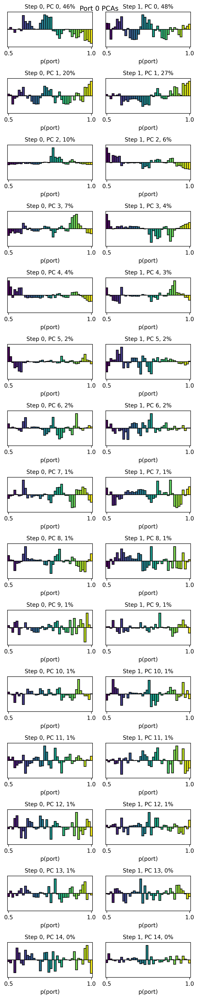

In [405]:
from sklearn.decomposition import PCA

a = np.array(coeffs).reshape(-1, 2, n_port, n_p_bins)

step = 0
port = 0
N = 15

fig, axes = plt.subplots(N, 2, figsize=(5, 20*10 / 8), dpi=300)
fig.suptitle(f'Port {port} PCAs')

cmap = plt.cm.get_cmap('viridis')
n_pcs = 40
pcs = np.zeros((2, n_port, n_pcs, a.shape[0]))

for step in range(2):
    x_pca = a[:, step, port, :].T
    pca = PCA(n_components=n_pcs)
    pca.fit(x_pca)
    print(x_pca.shape)
    print(pca.explained_variance_ratio_)

    # action_port = np.argmax(choices[:,:,-Conf.port_dim-1:], axis=-1)
    # a_choice = action_port == layouts[:,0, np.newaxis]
    # b_choice = action_port == layouts[:,1, np.newaxis]
    # null_choice = action_port == 200

    x_comp = pca.transform(x_pca)

    for p in range(N):
        for i in range(n_p_bins):
            col = cmap(i / n_p_bins)
            # axes[port, step].scatter(x_comp[i, dims[0]], i, c=col, s=7, marker='o', label=i)
            axes[p, step].bar(i, x_comp[i, p], color=col, width=1, edgecolor='black')
        # axes[p, step].set_ylabel(f'PC')
        axes[p, step].set_xlabel(f'p(port)')
        axes[p, step].set_title(f'Step {step}, PC {p}, {100*pca.explained_variance_ratio_[p]:.0f}%', fontsize=10)
        axes[p, step].set_xticks([0, n_p_bins-1], [0.5, 1.0])
        axes[p, step].set_yticks([])
        axes[p, step].set_xlim([-0.5, n_p_bins-0.5])
        axes[p, step].set_ylim([-1.2*np.max(np.abs(x_comp[:, p])), 1.2*np.max(np.abs(x_comp[:, p]))])
        # axes[port, step].legend()

plt.tight_layout()
# X_comp = np.reshape(X_comp, (hiddens.shape[0], hiddens.shape[1], -1))

os.makedirs('./regression/', exist_ok=True)
plt.savefig('./regression/pca_prob.png', dpi=300)

In [400]:
print(np.array(coeffs).reshape(np.array(coeffs).shape[0], 2, -1).shape)
print(a.shape)

(831, 2, 800)
(831, 2, 20, 40)


In [ ]:
from sklearn.decomposition import PCA

# a = np.array(coeffs).reshape(-1, 2, n_port, n_p_bins)
a = np.array(coeffs).reshape(np.array(coeffs).shape[0], 2, -1)

step = 0
port = 0
N = 40

fig, axes = plt.subplots(N, 2, figsize=(5, 40*10 / 8), dpi=300)
fig.suptitle(f'Port {port} PCAs')

cmap = plt.cm.get_cmap('viridis')
n_pcs = N
pcs = np.zeros((2, n_port, n_pcs, a.shape[0]))

for step in range(2):
    x_pca = a[:, step, :].T
    # x_pca = np.array(coeffs).T
    pca = PCA(n_components=n_pcs)
    pca.fit(x_pca)
    print(x_pca.shape)
    print(pca.explained_variance_ratio_)

    # action_port = np.argmax(choices[:,:,-Conf.port_dim-1:], axis=-1)
    # a_choice = action_port == layouts[:,0, np.newaxis]
    # b_choice = action_port == layouts[:,1, np.newaxis]
    # null_choice = action_port == 200

    x_comp = pca.transform(x_pca)

    for p in range(N):
        for i in range(n_p_bins):
            col = cmap(i / n_p_bins)
            # axes[port, step].scatter(x_comp[i, dims[0]], i, c=col, s=7, marker='o', label=i)
            axes[p, step].bar(i, x_comp[i, p], color=col, width=1, edgecolor='black')
        # axes[p, step].set_ylabel(f'PC')
        axes[p, step].set_xlabel(f'p(port)')
        axes[p, step].set_title(f'Step {step}, PC {p}, {100*pca.explained_variance_ratio_[p]:.0f}%', fontsize=10)
        axes[p, step].set_xticks([0, n_p_bins-1], [0.5, 1.0])
        axes[p, step].set_yticks([])
        axes[p, step].set_xlim([-0.5, n_p_bins-0.5])
        # axes[p, step].set_ylim([-1.2*np.max(np.abs(x_comp[:, p])), 1.2*np.max(np.abs(x_comp[:, p]))])
        # axes[port, step].legend()

plt.tight_layout()
# X_comp = np.reshape(X_comp, (hiddens.shape[0], hiddens.shape[1], -1))

os.makedirs('./regression/', exist_ok=True)
# plt.savefig('./regression/pca_prob.png', dpi=300)

In [88]:
pcs.shape

(2, 12, 10, 840)

In [ ]:
# Reshape the vectors to be 2D arrays
fig, axes=plt.subplots(8,8, dpi=200)
similarities = np.zeros((n_pcs, n_pcs, n_port, n_port))
for pc1 in range(8):
    for pc2 in range(8):
        # Reshape the vectors to be 2D arrays
        for port1 in range(n_port):
            vector1 = pcs[1, port1, pc1, :].reshape(1, -1)
            for port2 in range(n_port):
                vector2 = pcs[1, port2, pc2, :].reshape(1, -1)
                # Calculate the cosine similarity
                similarity = cosine_similarity(vector1, vector2)

                similarities[pc1, pc2, port1, port2] = np.abs(similarity)
                
        axes[pc1,pc2].imshow(similarities[pc1, pc2, :, :], cmap='bwr', vmin=-1, vmax=1)
        axes[pc1,pc2].xaxis.set_visible(False)
        axes[pc1,pc2].yaxis.set_visible(False)

In [ ]:
fig, axes = plt.subplots(n_pcs, figsize=(240,24), dpi=200)
maxes = np.max(np.abs(similarities),axis=(0))
for i in range(n_pcs):
    axes[i].imshow(maxes[i], vmin=-1, vmax=1, cmap='bwr')
    axes[i].xaxis.set_visible(False)
    axes[i].yaxis.set_visible(False)
    for j in range(maxes[i].shape[0]):
        for k in range(maxes[i].shape[1]):
            axes[i].text(k, j, f'{maxes[i, j, k]:.2f}', ha='center', va='center', color='white', size=3)

In [230]:
step = 1
not(step)

False

In [433]:
train_step = 40

n_p_bins = 40
bin_edges = np.linspace(0, 1, n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.digitize(p_A, bin_edges).squeeze() if not collapse_p else np.digitize(0.5 + np.abs(p_A - 0.5), bin_edges).squeeze()
bins = np.repeat(bins, Conf.trial_len, axis=-1)

x = hiddens_trimmed[:, train_step, :]
y = p_bins[:, train_step]

x_train, x_test, y_train, y_test  = train_test_split(x, y, test_size=0.2, random_state=41)

print(x_train.shape, y_train.shape)
model = LogisticRegression(solver='lbfgs', class_weight='balanced', multi_class='ovr', max_iter=1000, random_state=41)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)


(1948, 1024) (1948,)
0.36344969199178645


In [ ]:
accuracies_train, accuracies_test, cms = [], [], []
accuracies_opp_step = []
accuracies_port_not_action = []
accuracies_exclude_port = []
accuracies_include_port = []

step = 1
port = 0
if Conf.trial_len != 2:
    raise ValueError('This code is only for trial length 2')

for k in tqdm(range(1,40)):
    pc = pcs[step, port, :k, :]

    port_action_mask = action_trimmed[:, step::2] == port
    port_not_action_mask = not_action_trimmed[:, step::2] == port

    x = hiddens_trimmed[:, step::2, :][port_action_mask]
    y = p_bins[:, step::2][port_action_mask]
    x = x @ pc.T

    x_train, x_test, y_train, y_test  = train_test_split(x, y, test_size=0.2, random_state=41)

    model = LogisticRegression(solver='lbfgs', class_weight='balanced', max_iter=1000, random_state=41)
    model.fit(x_train, y_train)

    y_pred = model.predict(x_train)
    # Evaluate the model
    accuracy = accuracy_score(y_train, y_pred)
    accuracies_train.append(accuracy)

    y_pred = model.predict(x_test)
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    accuracies_test.append(accuracy)
    cms.append(cm)

    # # IF CHANGING TRIAL LENGTH, CHANGE THIS
    x = hiddens_trimmed[:, (step+1)%2::2, :][port_action_mask]
    x = x @ pc.T
    y = p_bins[:, (step+1)%2::2][port_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_opp_step.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][port_not_action_mask]
    x = x @ pc.T
    y = p_bins[:, step::2][port_not_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_port_not_action.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][~port_not_action_mask & ~port_action_mask]
    x = x @ pc.T
    y = p_bins[:, step::2][~port_not_action_mask & ~port_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_exclude_port.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][np.logical_or(port_not_action_mask, port_action_mask)]
    x = x @ pc.T
    y = p_bins[:, step::2][np.logical_or(port_not_action_mask, port_action_mask)]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_include_port.append(accuracy)
# plt.imshow(cm)

In [495]:
accuracies_train, accuracies_test, cms = [], [], []
accuracies_opp_step = []
accuracies_port_not_action = []
accuracies_exclude_port = []
accuracies_include_port = []

step = 1
port = 0
if Conf.trial_len != 2:
    raise ValueError('This code is only for trial length 2')

for k in tqdm(range(1,40)):
    pc = pcs[step, port, :k, :]

    port_action_mask = action_trimmed[:, step::2] == port
    port_not_action_mask = not_action_trimmed[:, step::2] == port

    y = p_bins[:, step::2][port_action_mask]
    print(pc.shape, y.shape)
    x = np.outer(y, pc)
    print(x.shape)

    x_train, x_test, y_train, y_test  = train_test_split(x, y, test_size=0.2, random_state=41)

    model = LogisticRegression(solver='lbfgs', class_weight='balanced', max_iter=1000, random_state=41)
    model.fit(x_train, y_train)

    y_pred = model.predict(x_train)
    # Evaluate the model
    accuracy = accuracy_score(y_train, y_pred)
    accuracies_train.append(accuracy)

    y_pred = model.predict(x_test)
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    accuracies_test.append(accuracy)
    cms.append(cm)

    # # # IF CHANGING TRIAL LENGTH, CHANGE THIS
    # x = hiddens_trimmed[:, (step+1)%2::2, :][port_action_mask]
    # x = x @ pc.T
    # y = p_bins[:, (step+1)%2::2][port_action_mask]
    # y_pred = model.predict(x)
    # # Evaluate the model
    # accuracy = accuracy_score(y, y_pred)
    # accuracies_opp_step.append(accuracy)

    # x = hiddens_trimmed[:, step::2, :][port_not_action_mask]
    # x = x @ pc.T
    # y = p_bins[:, step::2][port_not_action_mask]
    # y_pred = model.predict(x)
    # # Evaluate the model
    # accuracy = accuracy_score(y, y_pred)
    # accuracies_port_not_action.append(accuracy)

    # x = hiddens_trimmed[:, step::2, :][~port_not_action_mask & ~port_action_mask]
    # x = x @ pc.T
    # y = p_bins[:, step::2][~port_not_action_mask & ~port_action_mask]
    # y_pred = model.predict(x)
    # # Evaluate the model
    # accuracy = accuracy_score(y, y_pred)
    # accuracies_exclude_port.append(accuracy)

    # x = hiddens_trimmed[:, step::2, :][np.logical_or(port_not_action_mask, port_action_mask)]
    # x = x @ pc.T
    # y = p_bins[:, step::2][np.logical_or(port_not_action_mask, port_action_mask)]
    # y_pred = model.predict(x)
    # # Evaluate the model
    # accuracy = accuracy_score(y, y_pred)
    # accuracies_include_port.append(accuracy)
# plt.imshow(cm)

  0%|          | 0/39 [00:00<?, ?it/s]

(1, 831) (4574,)
(4574, 831)


/Users/jo/miniforge3/envs/notebooks_paper/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
  3%|▎         | 1/39 [00:25<16:05, 25.42s/it]

(2, 831) (4574,)
(4574, 1662)


  3%|▎         | 1/39 [00:35<22:23, 35.35s/it]


KeyboardInterrupt: 

In [285]:
accuracies_train, accuracies_test, cms = [], [], []
accuracies_opp_step = []
accuracies_port_not_action = []
accuracies_exclude_port = []
accuracies_include_port = []

step = 1
port = 0
if Conf.trial_len != 2:
    raise ValueError('This code is only for trial length 2')

for k in tqdm(range(1,40)):
    pc = pcs[step, port, :k, :]

    port_action_mask = action_trimmed[:, step::2] == port
    port_not_action_mask = not_action_trimmed[:, step::2] == port

    x = hiddens_trimmed[:, step::2, :][port_action_mask]
    y = p_bins[:, step::2][port_action_mask]
    x = x @ pc.T

    x_train, x_test, y_train, y_test  = train_test_split(x, y, test_size=0.2, random_state=41)

    model = LogisticRegression(solver='lbfgs', class_weight='balanced', max_iter=1000, random_state=41)
    model.fit(x_train, y_train)

    y_pred = model.predict(x_train)
    # Evaluate the model
    accuracy = accuracy_score(y_train, y_pred)
    accuracies_train.append(accuracy)

    y_pred = model.predict(x_test)
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    accuracies_test.append(accuracy)
    cms.append(cm)

    # # IF CHANGING TRIAL LENGTH, CHANGE THIS
    x = hiddens_trimmed[:, (step+1)%2::2, :][port_action_mask]
    x = x @ pc.T
    y = p_bins[:, (step+1)%2::2][port_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_opp_step.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][port_not_action_mask]
    x = x @ pc.T
    y = p_bins[:, step::2][port_not_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_port_not_action.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][~port_not_action_mask & ~port_action_mask]
    x = x @ pc.T
    y = p_bins[:, step::2][~port_not_action_mask & ~port_action_mask]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_exclude_port.append(accuracy)

    x = hiddens_trimmed[:, step::2, :][np.logical_or(port_not_action_mask, port_action_mask)]
    x = x @ pc.T
    y = p_bins[:, step::2][np.logical_or(port_not_action_mask, port_action_mask)]
    y_pred = model.predict(x)
    # Evaluate the model
    accuracy = accuracy_score(y, y_pred)
    accuracies_include_port.append(accuracy)
# plt.imshow(cm)

  0%|          | 0/39 [00:00<?, ?it/s]

100%|██████████| 39/39 [00:10<00:00,  3.84it/s]


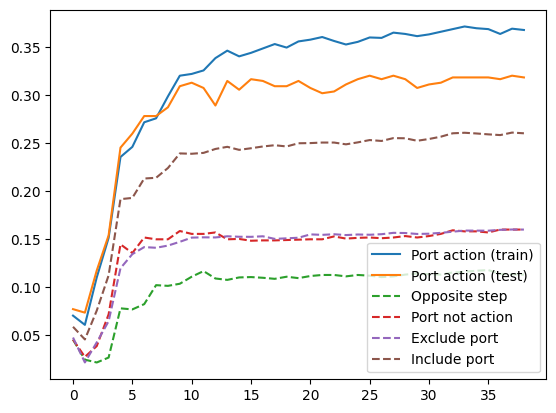

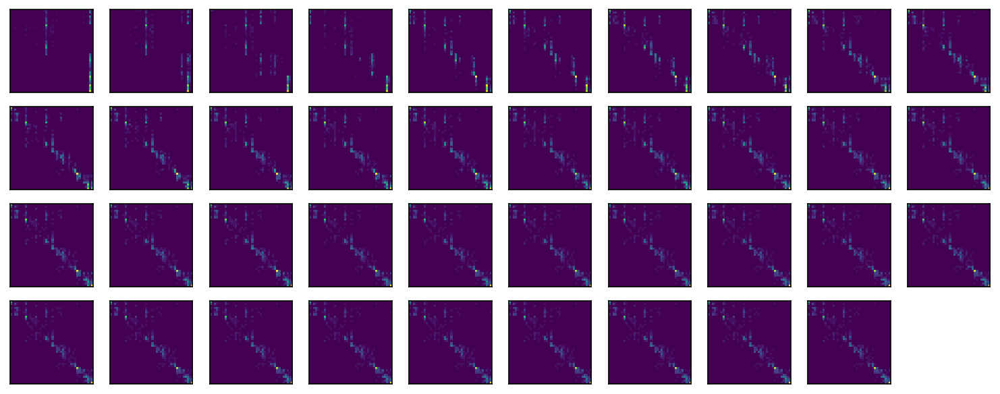

In [286]:
plt.figure()
plt.plot(accuracies_train, label='Port action (train)')
plt.plot(accuracies_test, label='Port action (test)')
plt.plot(accuracies_opp_step, linestyle='--', label='Opposite step')
plt.plot(accuracies_port_not_action, linestyle='--', label='Port not action')
plt.plot(accuracies_exclude_port, linestyle='--', label='Exclude port')
plt.plot(accuracies_include_port, linestyle='--', label='Include port')
plt.legend()

fig, axes = plt.subplots(4,10, figsize=(10,4), dpi=150)

for i, ax in enumerate(axes.flatten()[:-1]):
    ax.imshow(cms[i], cmap='viridis', vmin=0, interpolation=None)
    # if i == 0:
        # ax.set_ylabel('True')
    # else:
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    # ax.set_xticks([])

    # Remove the axis at position (row, column)
axes[-1, -1].remove()


plt.tight_layout()

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/3725651161.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similarities[0, port1] = similarity
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/3725651161.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similarities[0, port1] = similarity
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/3725651161.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similariti

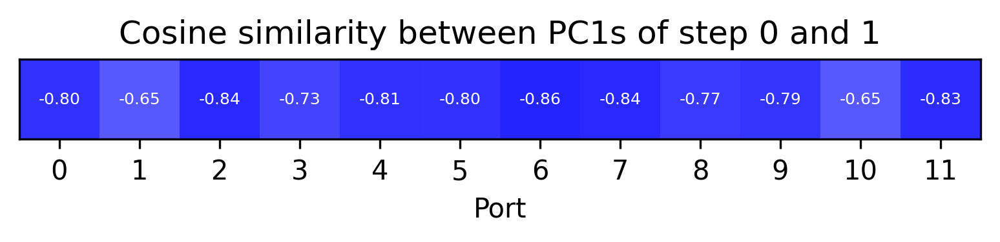

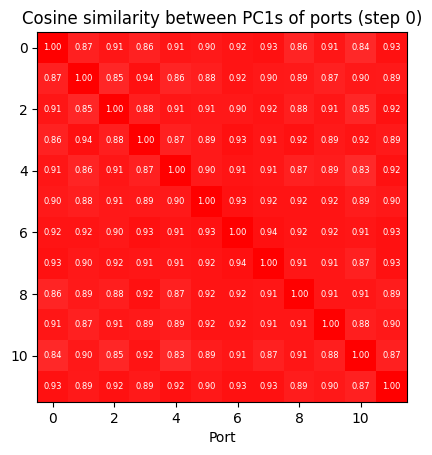

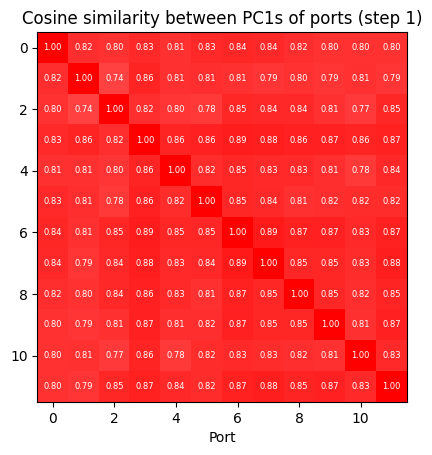

In [94]:
from sklearn.metrics.pairwise import cosine_similarity

plt.figure(dpi=300)
text = True
similarities = np.zeros((1, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc1s[0, port1, :].reshape(1, -1)
    vector2 = pc1s[1, port1, :].reshape(1, -1)
    # Calculate the cosine similarity
    similarity = cosine_similarity(vector1, vector2)
    similarities[0, port1] = similarity

plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')
plt.title('Cosine similarity between PC1s of step 0 and 1')
plt.xlabel('Port')
plt.xticks(np.arange(n_port), np.arange(n_port))
plt.yticks([])

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc1_sim_step01.png', dpi=300)

plt.figure()
similarities = np.zeros((n_port, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc1s[0, port1, :].reshape(1, -1)
    for port2 in range(n_port):
        vector2 = pc1s[0, port2, :].reshape(1, -1)
        # Calculate the cosine similarity
        similarity = cosine_similarity(vector1, vector2)

        similarities[port1, port2] = similarity

plt.title('Cosine similarity between PC1s of ports (step 0)')
plt.xlabel('Port')
plt.xlabel('Port')
plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc1_sim_step0.png', dpi=300)

plt.figure()
similarities = np.zeros((n_port, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc1s[1, port1, :].reshape(1, -1)
    for port2 in range(n_port):
        vector2 = pc1s[1, port2, :].reshape(1, -1)
        # Calculate the cosine similarity
        similarity = cosine_similarity(vector1, vector2)

        similarities[port1, port2] = similarity

plt.title('Cosine similarity between PC1s of ports (step 1)')
plt.xlabel('Port')
plt.xlabel('Port')
plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc1_sim_step1.png', dpi=300)



/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/1233749205.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similarities[0, port1] = similarity
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/1233749205.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similarities[0, port1] = similarity
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_83802/1233749205.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  similariti

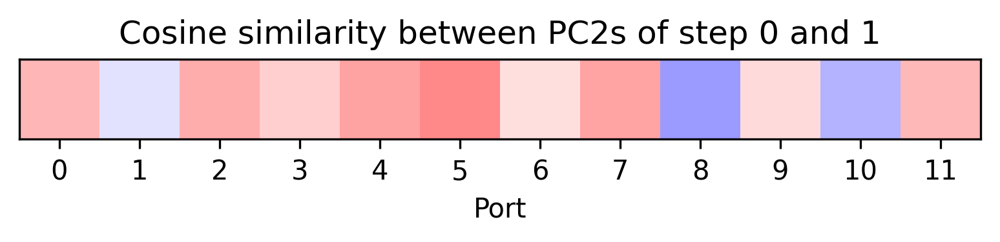

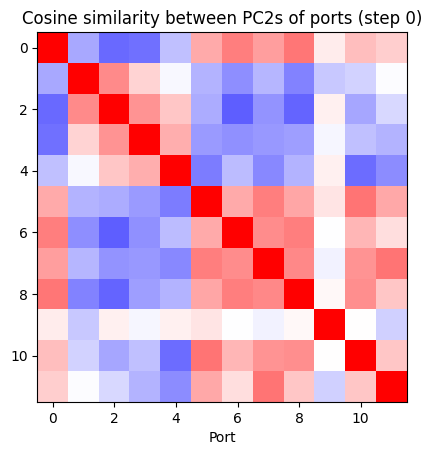

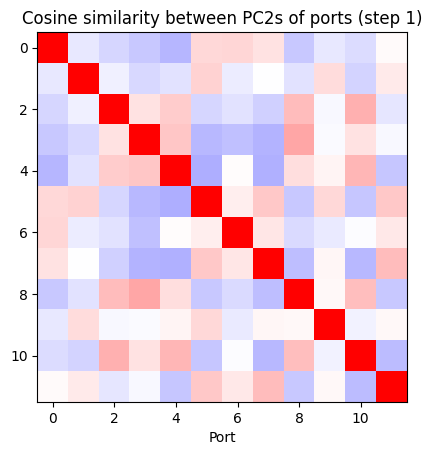

In [101]:
plt.figure(dpi=300)
text=False

similarities = np.zeros((1, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc2s[0, port1, :].reshape(1, -1)
    vector2 = pc2s[1, port1, :].reshape(1, -1)
    # Calculate the cosine similarity
    similarity = cosine_similarity(vector1, vector2)
    similarities[0, port1] = similarity

plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')
plt.title('Cosine similarity between PC2s of step 0 and 1')
plt.xlabel('Port')
plt.xticks(np.arange(n_port), np.arange(n_port))
plt.yticks([])

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc2_sim_step01.png', dpi=300)

plt.figure()
similarities = np.zeros((n_port, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc2s[0, port1, :].reshape(1, -1)
    for port2 in range(n_port):
        vector2 = pc2s[0, port2, :].reshape(1, -1)
        # Calculate the cosine similarity
        similarity = cosine_similarity(vector1, vector2)

        similarities[port1, port2] = similarity

plt.title('Cosine similarity between PC2s of ports (step 0)')
plt.xlabel('Port')
plt.xlabel('Port')
plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc2_sim_step0.png', dpi=300)

plt.figure()
similarities = np.zeros((n_port, n_port))
# Reshape the vectors to be 2D arrays
for port1 in range(n_port):
    vector1 = pc2s[1, port1, :].reshape(1, -1)
    for port2 in range(n_port):
        vector2 = pc2s[1, port2, :].reshape(1, -1)
        # Calculate the cosine similarity
        similarity = cosine_similarity(vector1, vector2)

        similarities[port1, port2] = similarity

plt.title('Cosine similarity between PC2s of ports (step 1)')
plt.xlabel('Port')
plt.xlabel('Port')
plt.imshow(similarities, vmin=-1, vmax=1, cmap='bwr')

# Add values as text annotations
if text:
    for i in range(similarities.shape[0]):
        for j in range(similarities.shape[1]):
            plt.text(j, i, f'{similarities[i, j]:.2f}', ha='center', va='center', color='white', size=6)

plt.savefig('./regression/pc2_sim_step1.png', dpi=300)

/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_8281/3530597251.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')
/var/folders/lv/jc4t_z1d75n6dp1c2sbbc9xc0000gn/T/ipykernel_8281/3530597251.py:4: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(x_comp[i, 0], x_comp[i, 1], c=color)


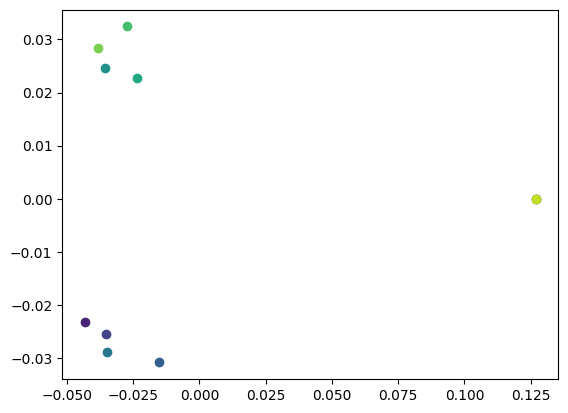

In [ ]:
cmap = plt.cm.get_cmap('viridis')
for i in range(10):
    color = cmap(i / 10)
    plt.scatter(x_comp[i, 0], x_comp[i, 1], c=color)

In [ ]:
np.arccos(0.56) * 180 / np.pi

55.94420225743209

In [549]:
from plotting import *
print(layouts[:, 0].shape)
means, _ = get_means(p_A, layouts, hiddens, n_p_bins=40, n_ports=20)

(10000,)


n_ports 10
/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40


  0%|          | 0/100 [00:00<?, ?it/s]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/0.png


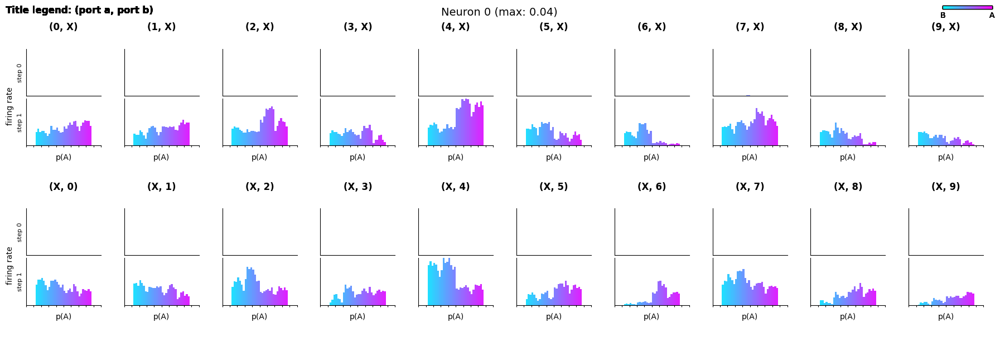

  1%|          | 1/100 [00:02<04:17,  2.60s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/1.png


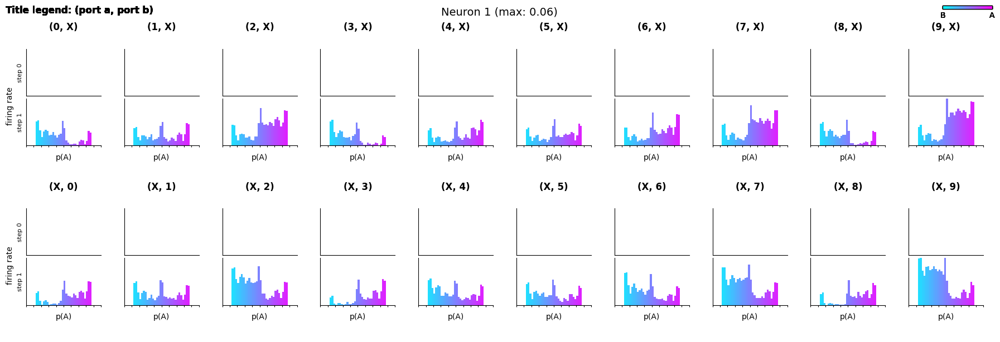

  2%|▏         | 2/100 [00:04<03:49,  2.34s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/2.png


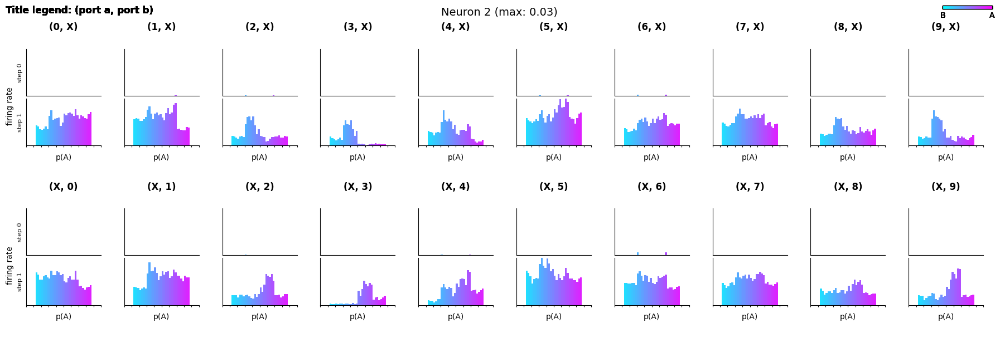

  3%|▎         | 3/100 [00:07<04:03,  2.52s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/3.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

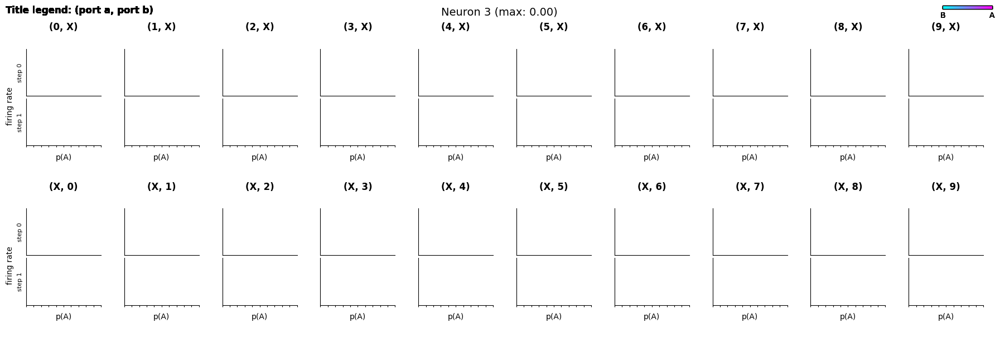

  4%|▍         | 4/100 [00:10<04:03,  2.54s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/4.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

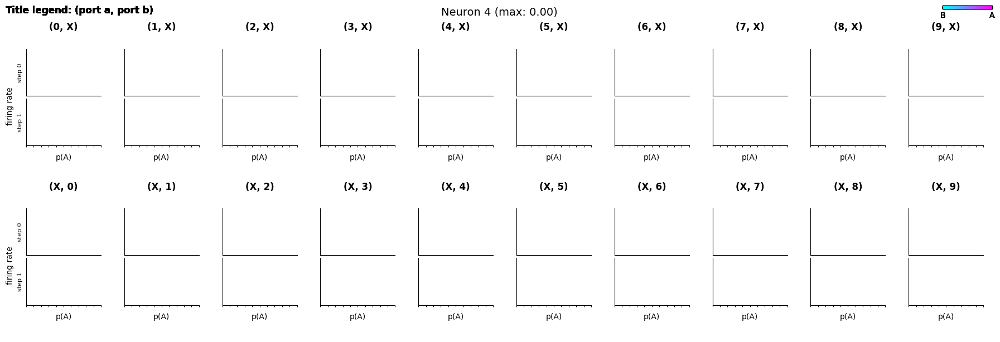

  5%|▌         | 5/100 [00:12<03:47,  2.40s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/5.png


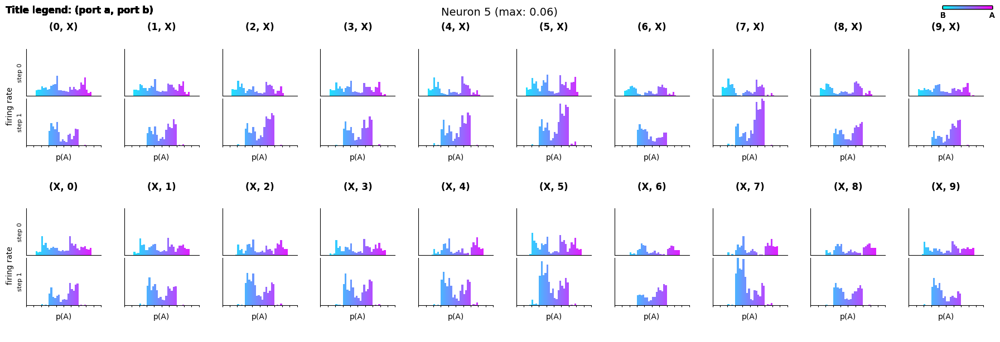

  6%|▌         | 6/100 [00:14<03:57,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/6.png


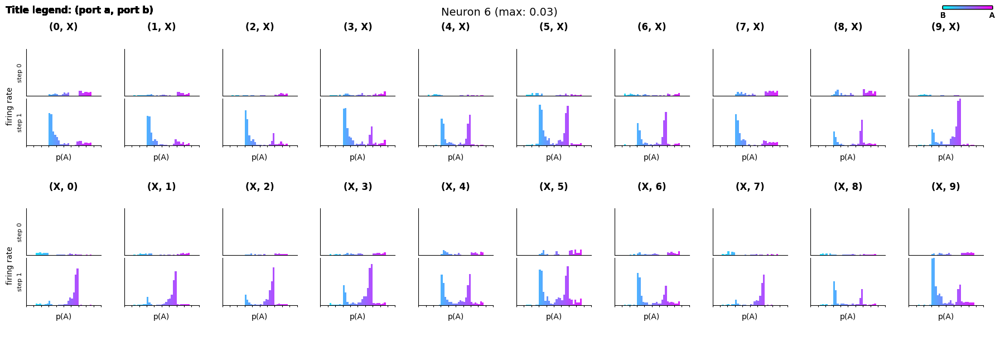

  7%|▋         | 7/100 [00:17<03:43,  2.40s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/7.png


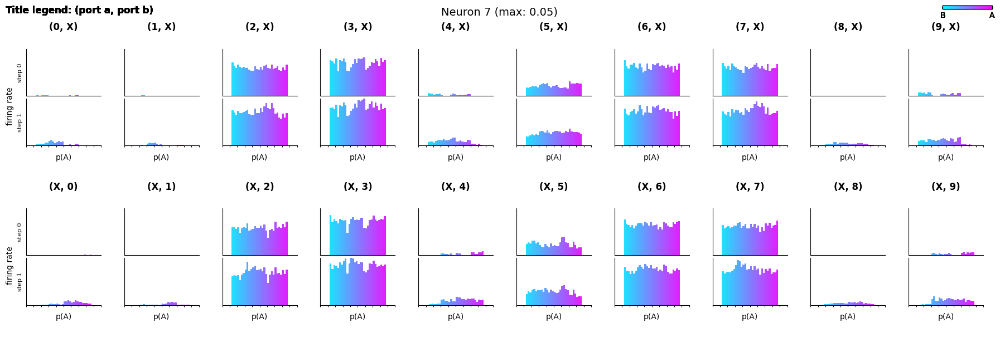

  8%|▊         | 8/100 [00:19<03:51,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/8.png


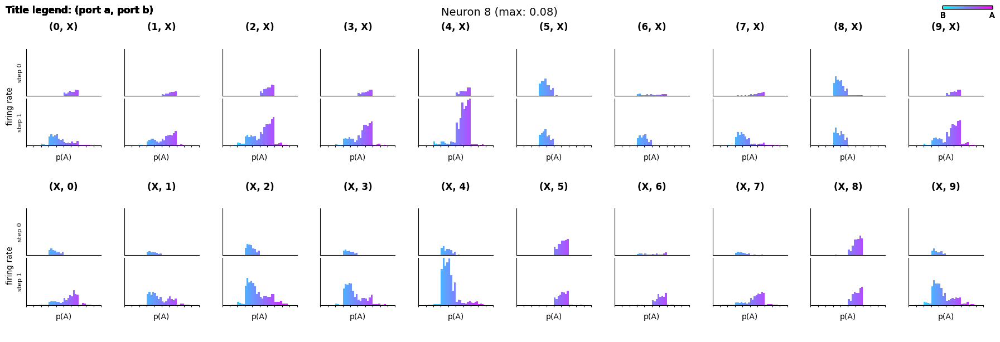

  9%|▉         | 9/100 [00:22<03:38,  2.40s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/9.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

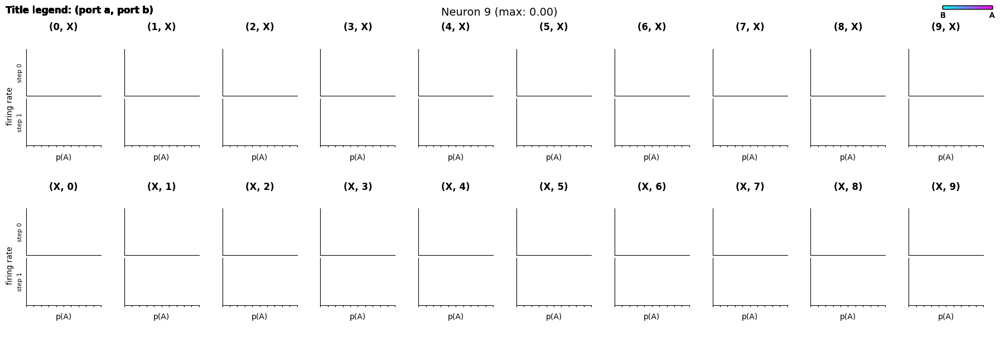

 10%|█         | 10/100 [00:24<03:45,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/10.png


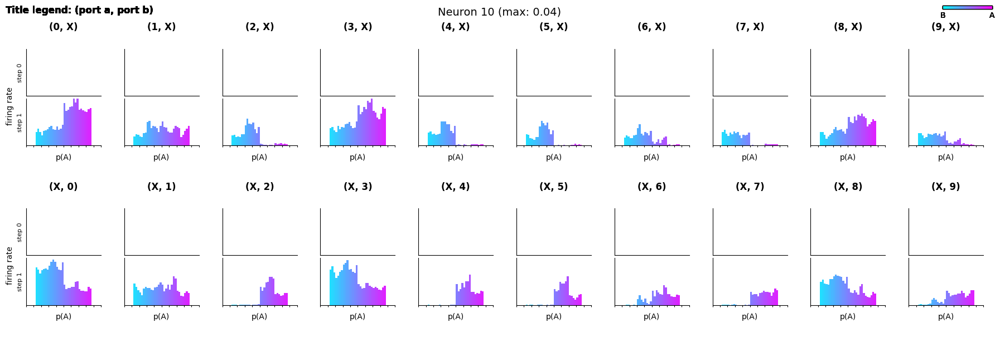

 11%|█         | 11/100 [00:27<03:47,  2.56s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/11.png


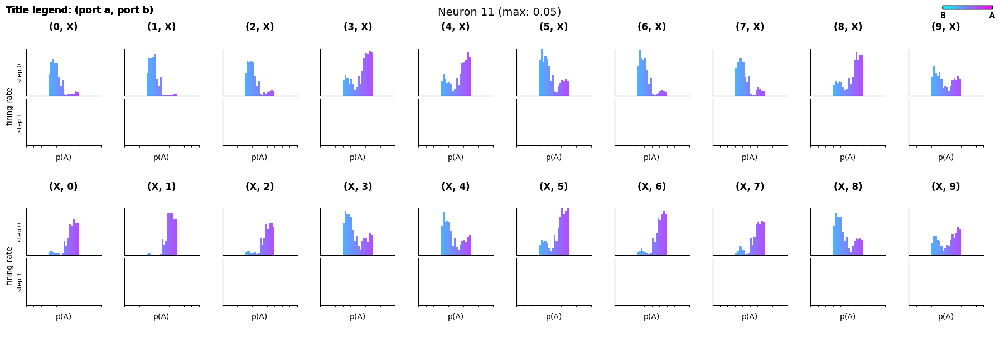

 12%|█▏        | 12/100 [00:29<03:36,  2.46s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/12.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

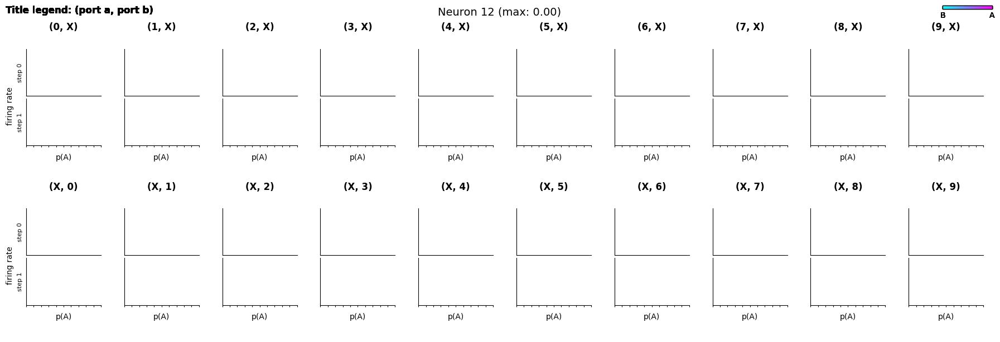

 13%|█▎        | 13/100 [00:32<03:42,  2.56s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/13.png


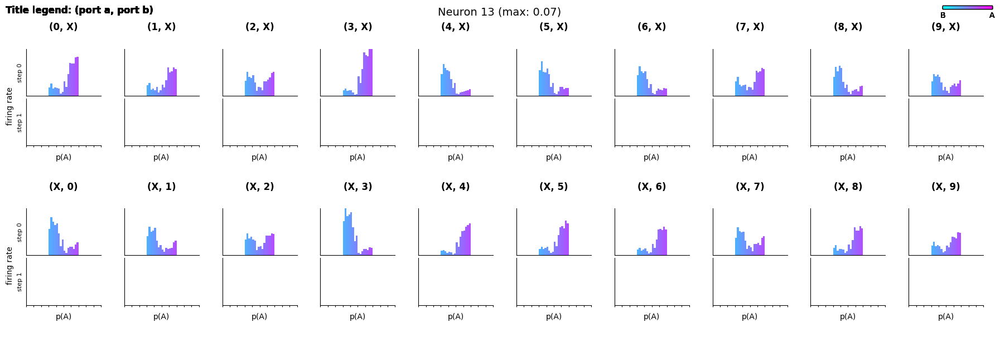

 14%|█▍        | 14/100 [00:34<03:29,  2.44s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/14.png


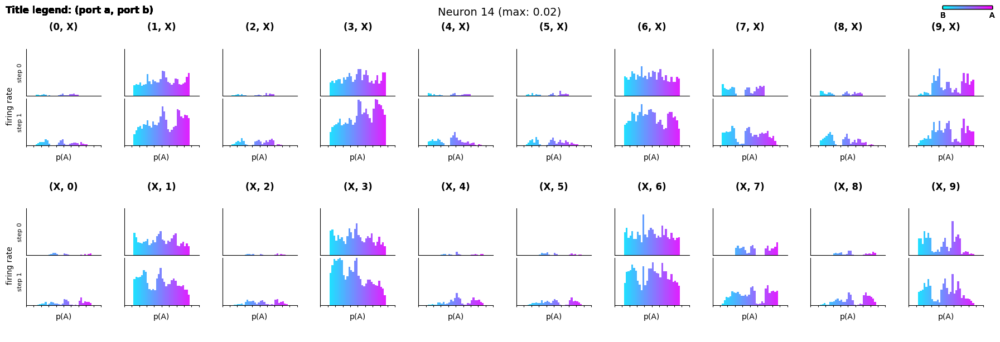

 15%|█▌        | 15/100 [00:37<03:33,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/15.png


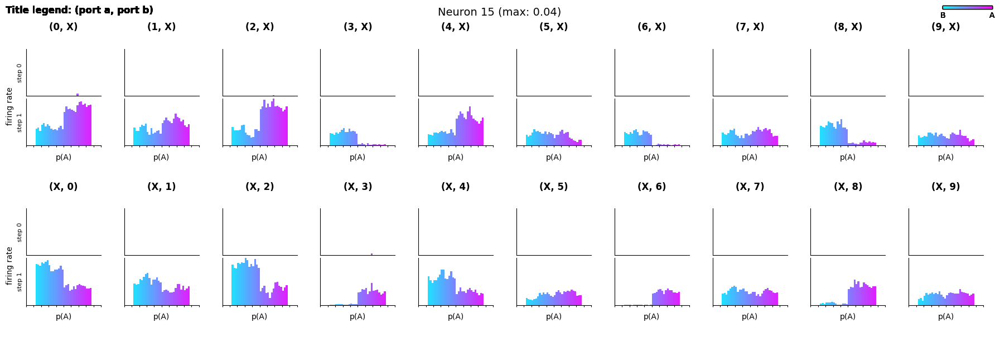

 16%|█▌        | 16/100 [00:39<03:20,  2.38s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/16.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

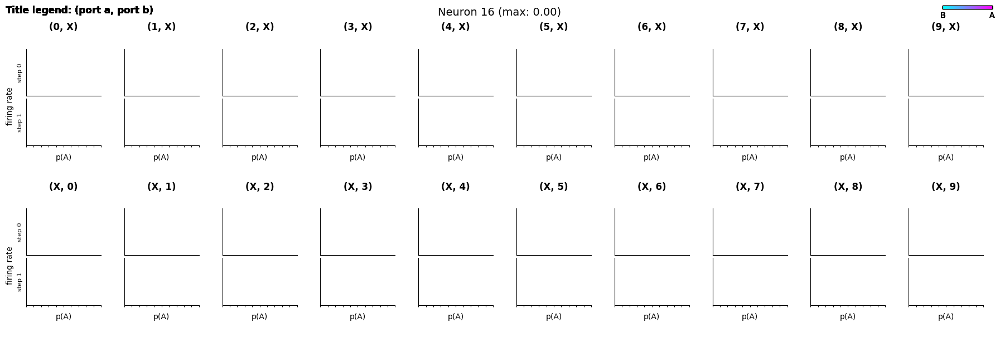

 17%|█▋        | 17/100 [00:42<03:24,  2.47s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/17.png


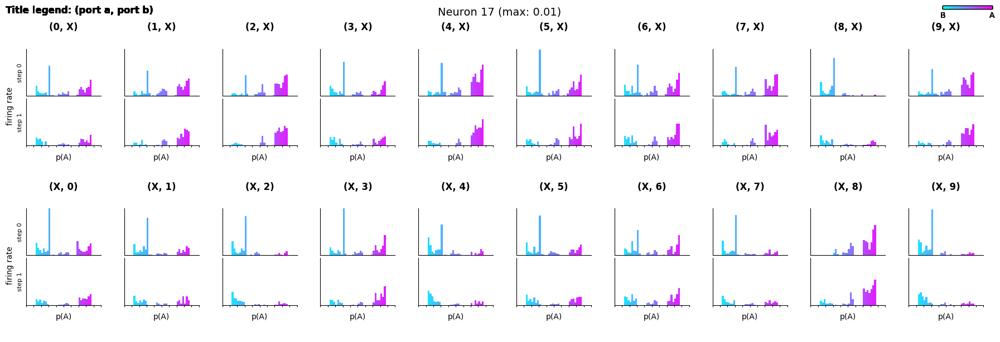

 18%|█▊        | 18/100 [00:44<03:14,  2.37s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/18.png


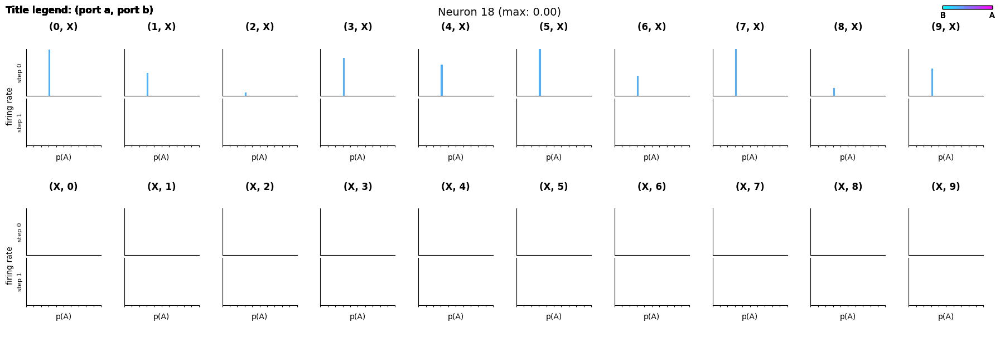

 19%|█▉        | 19/100 [00:46<03:15,  2.42s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/19.png


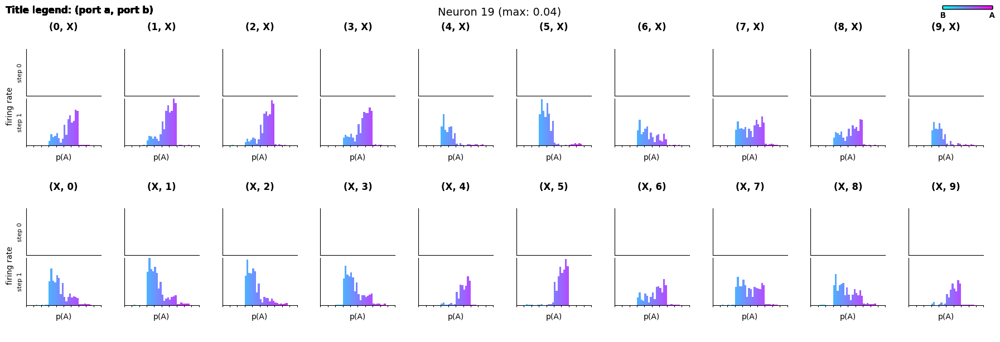

 20%|██        | 20/100 [00:49<03:20,  2.50s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/20.png


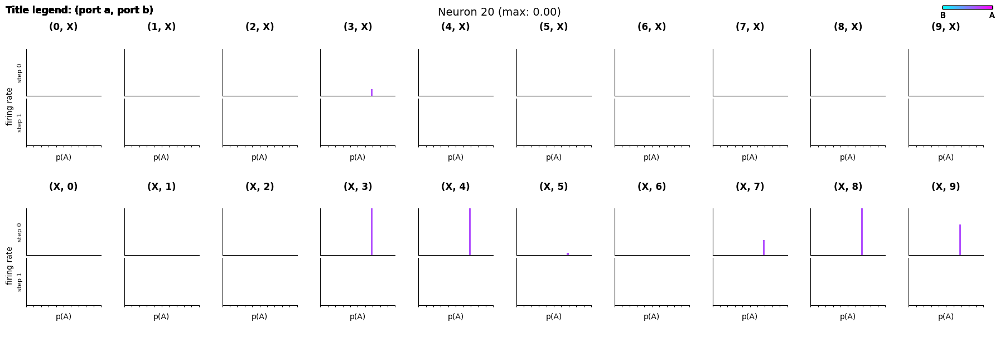

 21%|██        | 21/100 [00:51<03:07,  2.38s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/21.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

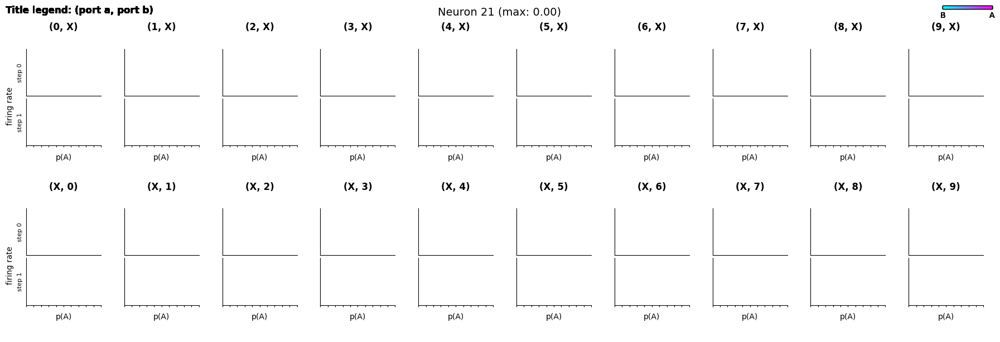

 22%|██▏       | 22/100 [00:54<03:14,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/22.png


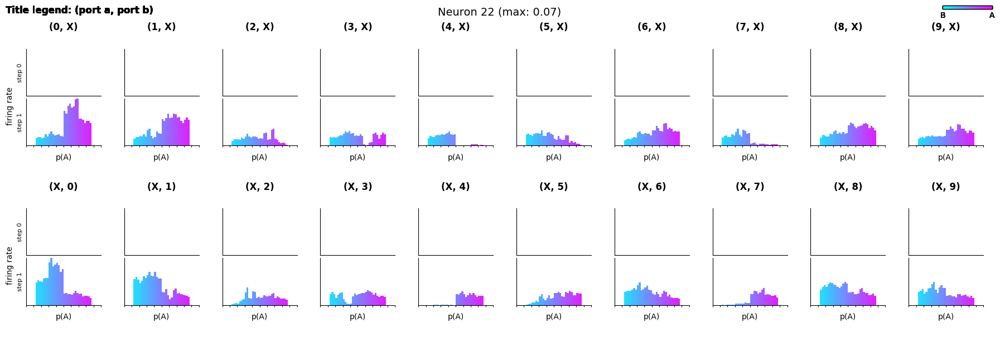

 23%|██▎       | 23/100 [00:56<03:05,  2.41s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/23.png


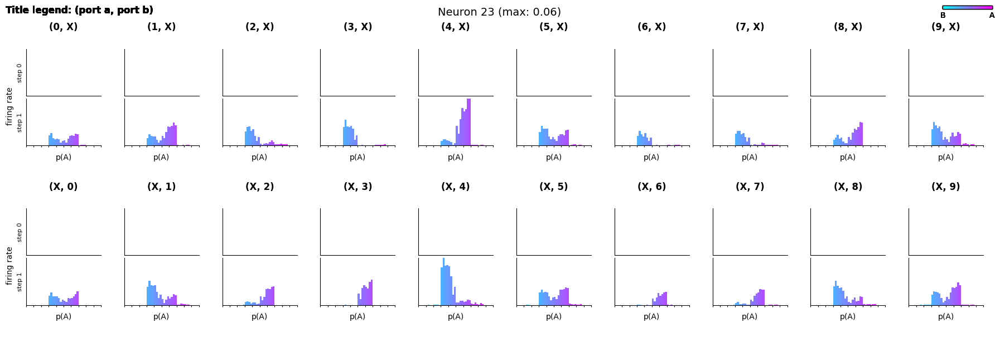

 24%|██▍       | 24/100 [00:59<03:08,  2.47s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/24.png


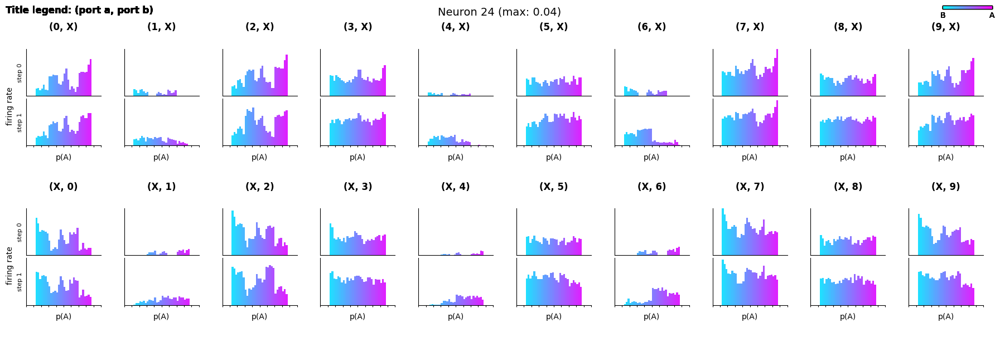

 25%|██▌       | 25/100 [01:01<02:56,  2.36s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/25.png


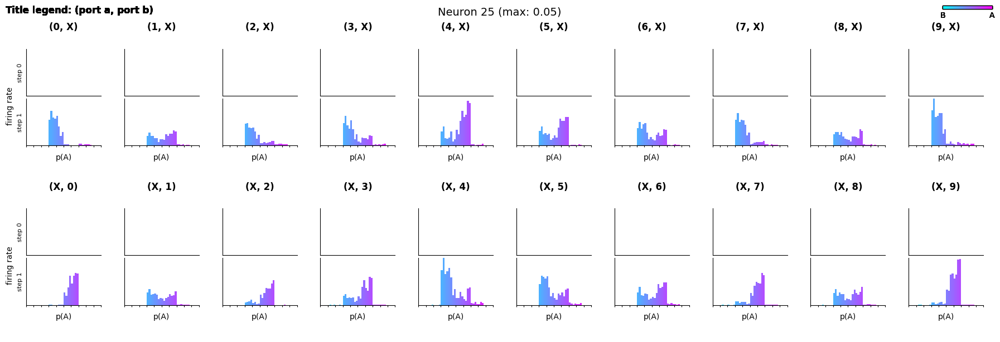

 26%|██▌       | 26/100 [01:03<02:59,  2.42s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/26.png


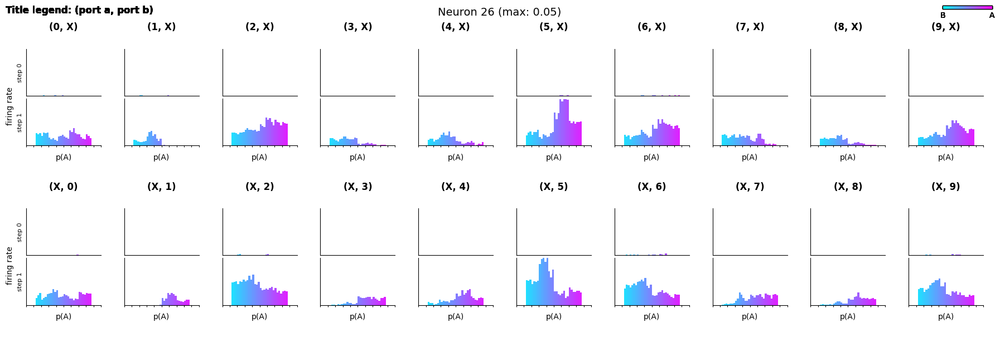

 27%|██▋       | 27/100 [01:05<02:50,  2.33s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/27.png


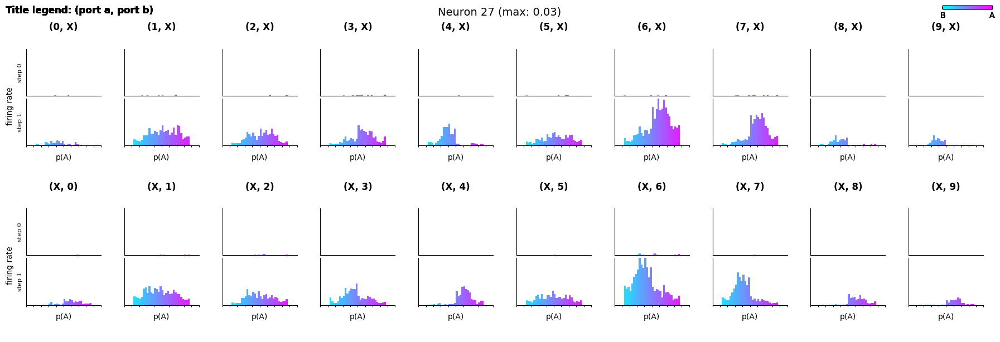

 28%|██▊       | 28/100 [01:08<02:57,  2.47s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/28.png


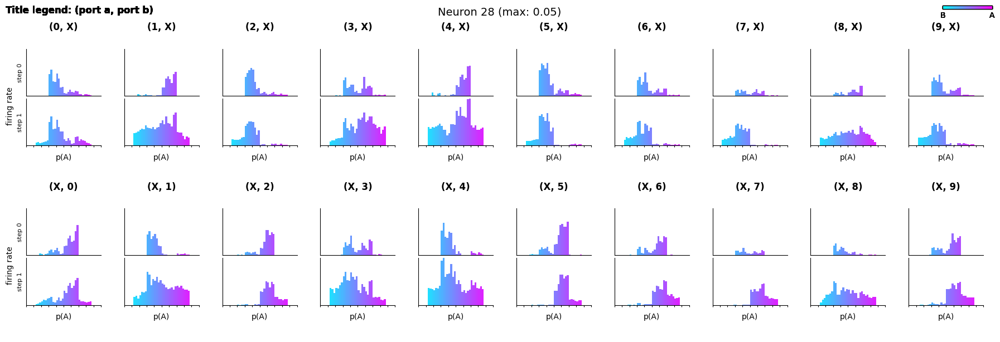

 29%|██▉       | 29/100 [01:11<03:00,  2.54s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/29.png


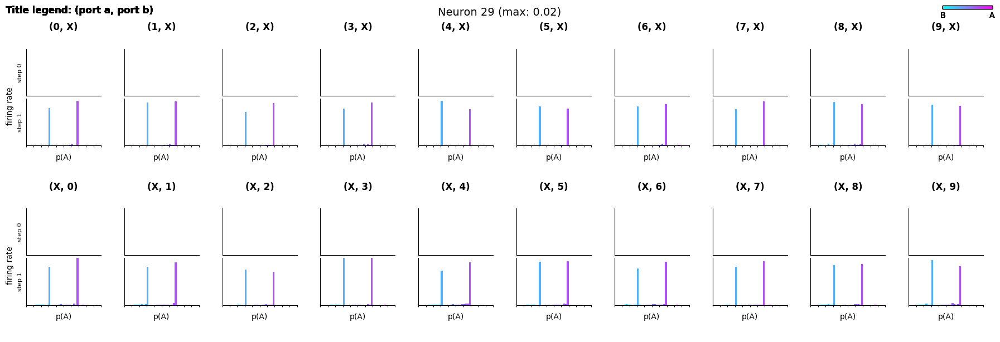

 30%|███       | 30/100 [01:13<02:48,  2.41s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/30.png


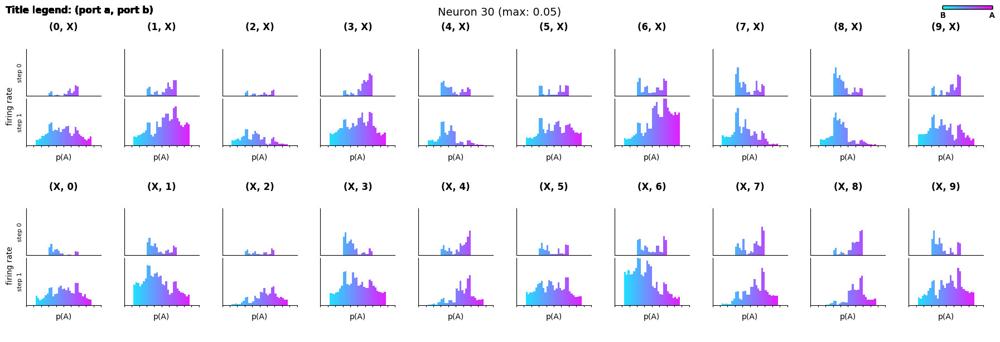

 31%|███       | 31/100 [01:16<02:52,  2.50s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/31.png


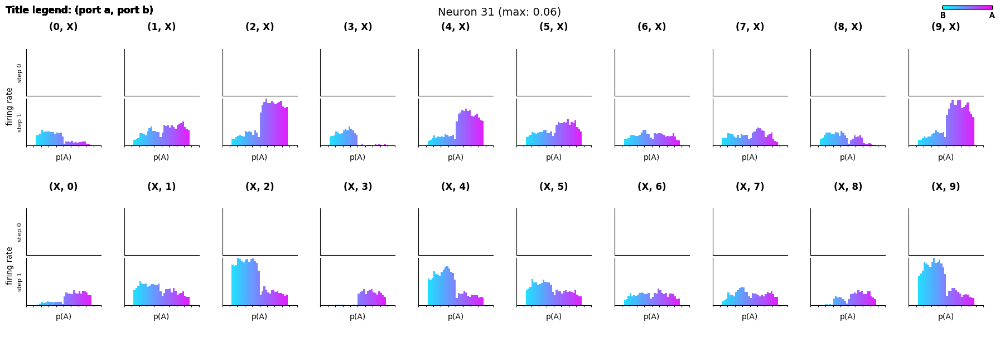

 32%|███▏      | 32/100 [01:18<02:41,  2.37s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/32.png


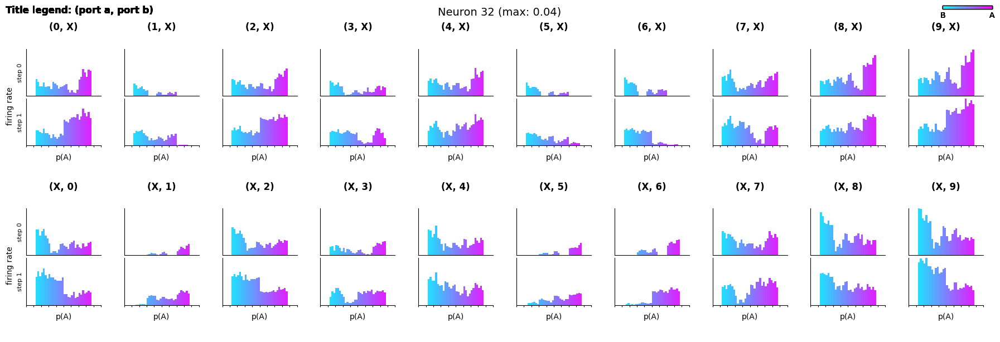

 33%|███▎      | 33/100 [01:20<02:45,  2.46s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/33.png


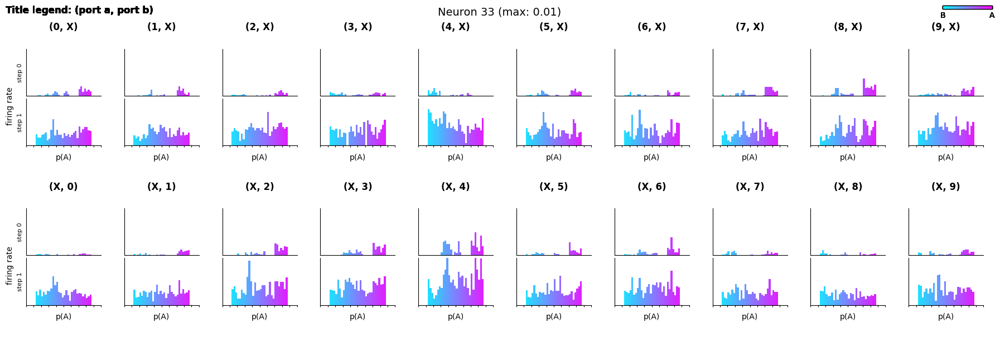

 34%|███▍      | 34/100 [01:23<02:35,  2.36s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/34.png


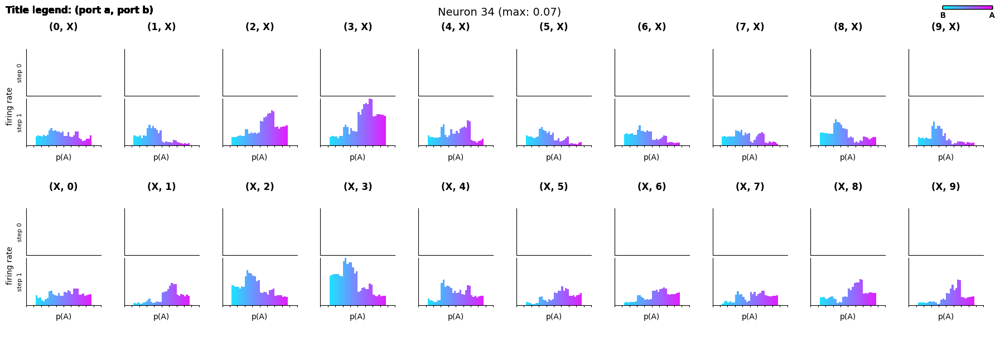

 35%|███▌      | 35/100 [01:25<02:38,  2.44s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/35.png


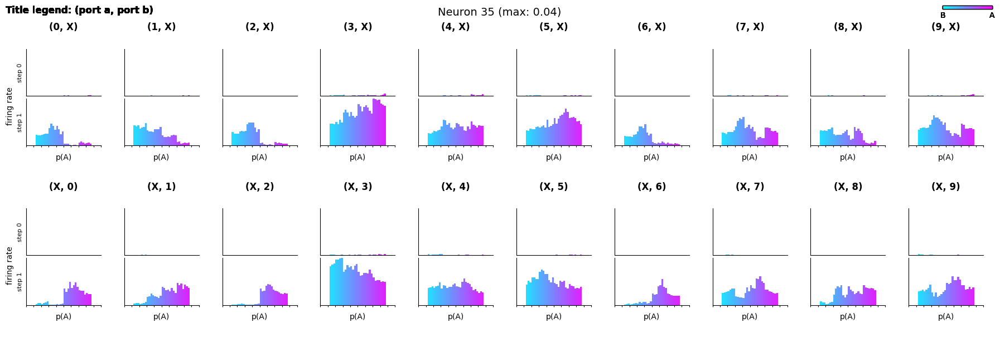

 36%|███▌      | 36/100 [01:27<02:29,  2.34s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/36.png


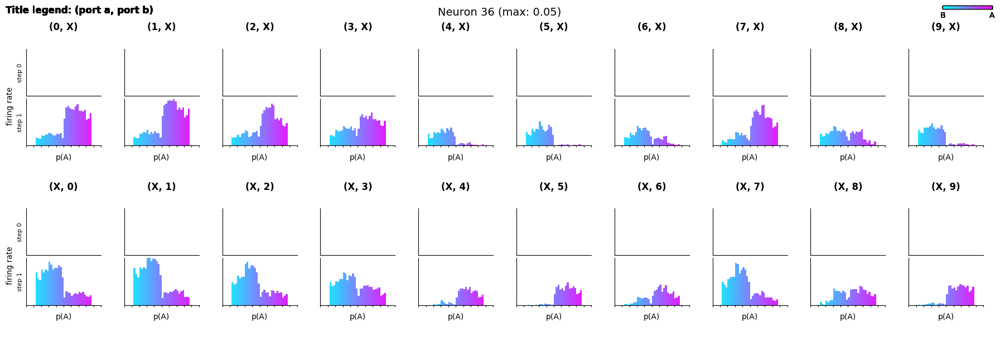

 37%|███▋      | 37/100 [01:30<02:39,  2.53s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/37.png


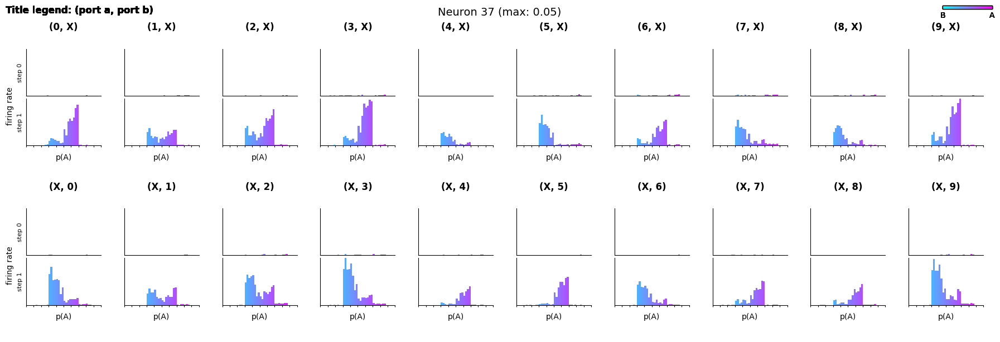

 38%|███▊      | 38/100 [01:33<02:40,  2.59s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/38.png


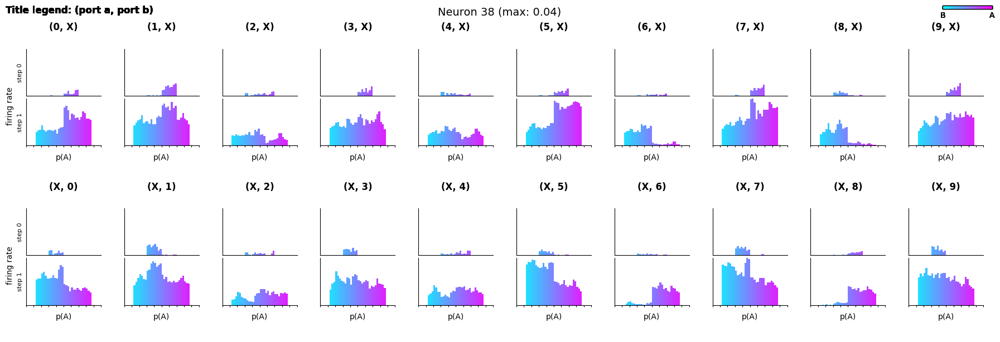

 39%|███▉      | 39/100 [01:35<02:30,  2.48s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/39.png


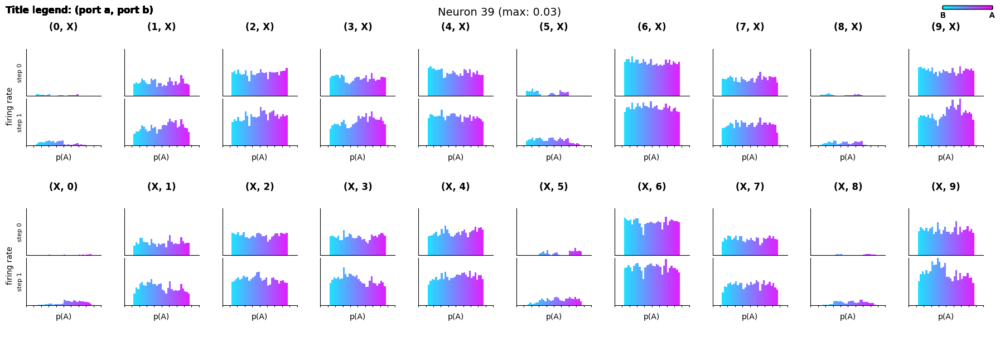

 40%|████      | 40/100 [01:38<02:32,  2.54s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/40.png


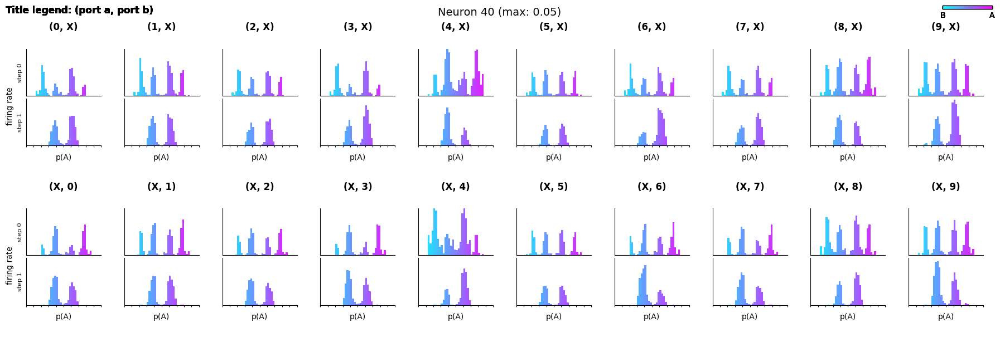

 41%|████      | 41/100 [01:40<02:22,  2.41s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/41.png


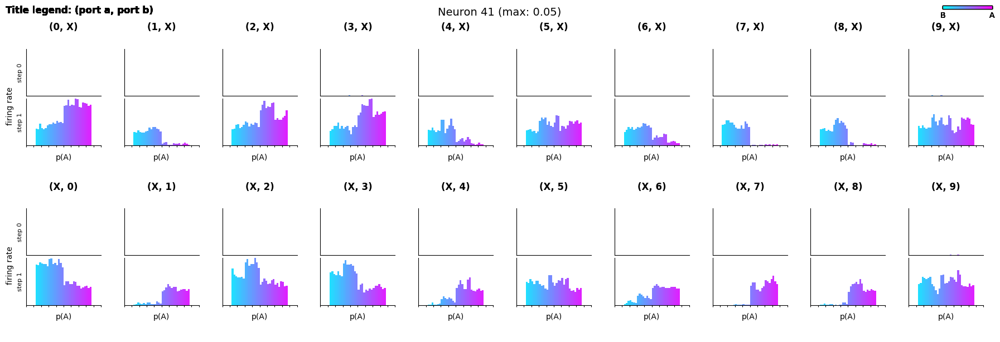

 42%|████▏     | 42/100 [01:43<02:24,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/42.png


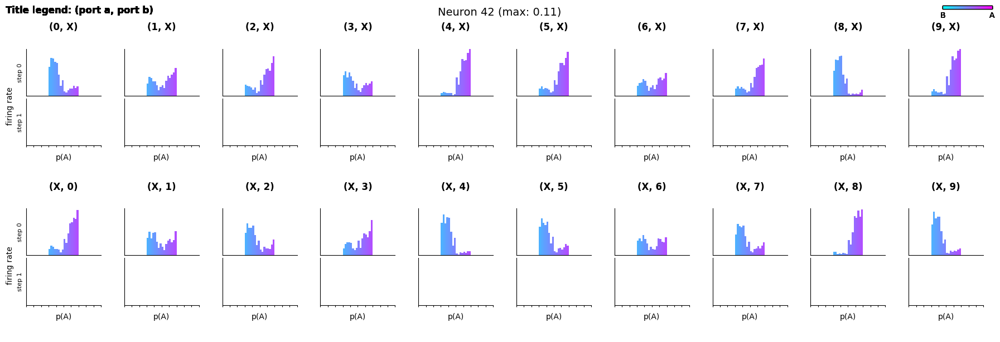

 43%|████▎     | 43/100 [01:45<02:15,  2.38s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/43.png


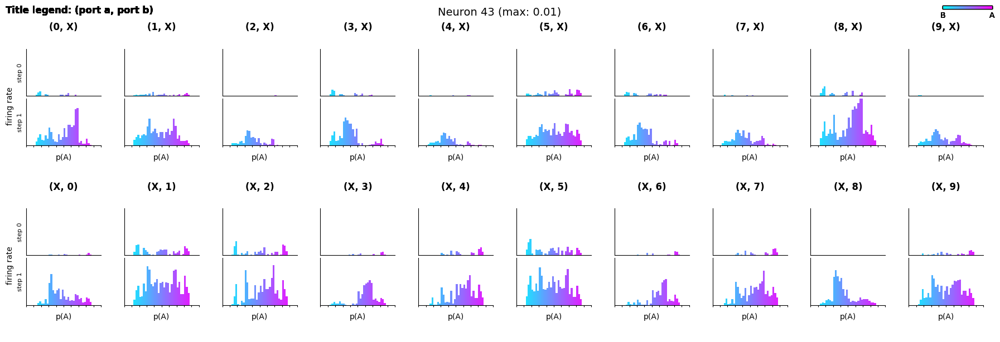

 44%|████▍     | 44/100 [01:47<02:17,  2.45s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/44.png


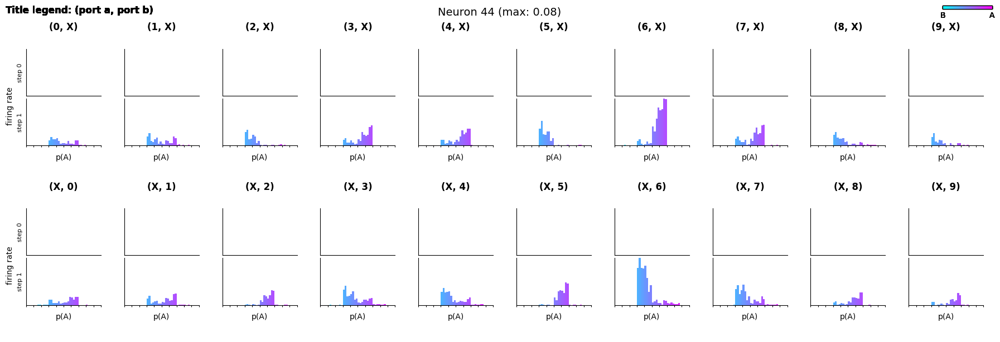

 45%|████▌     | 45/100 [01:50<02:08,  2.34s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/45.png


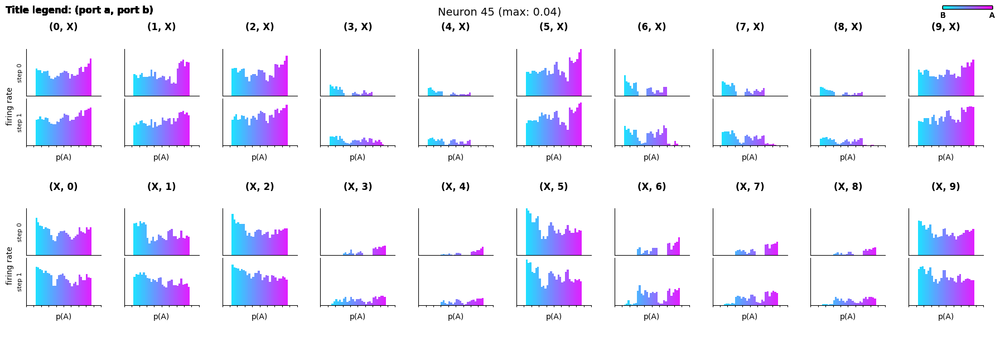

 46%|████▌     | 46/100 [01:52<02:15,  2.50s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/46.png


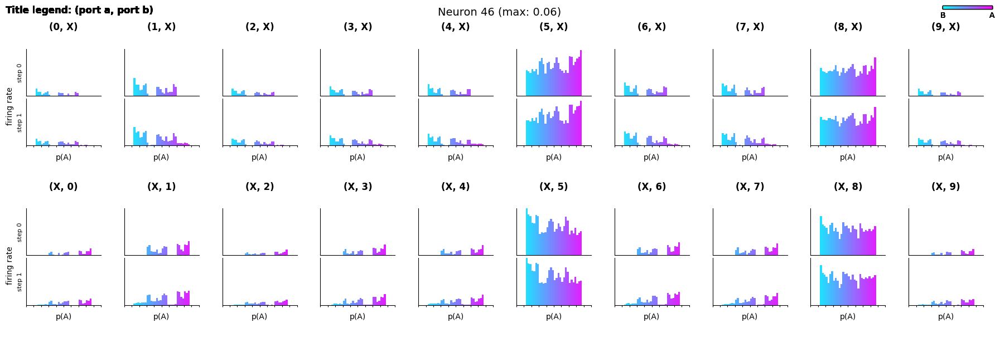

 47%|████▋     | 47/100 [01:55<02:17,  2.59s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/47.png


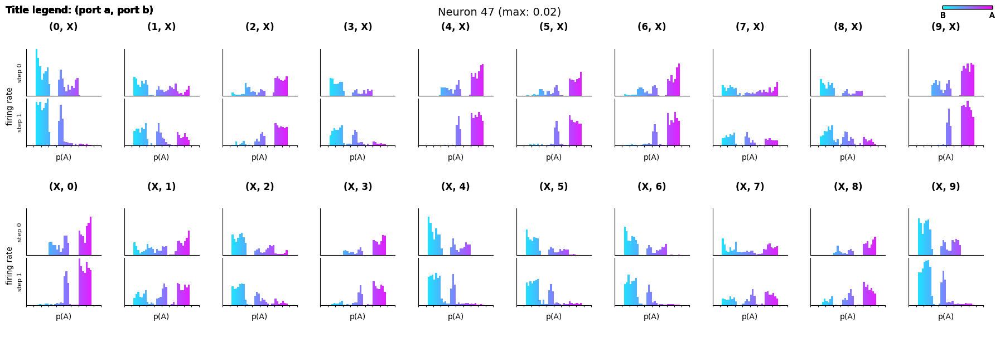

 48%|████▊     | 48/100 [01:57<02:08,  2.46s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/48.png


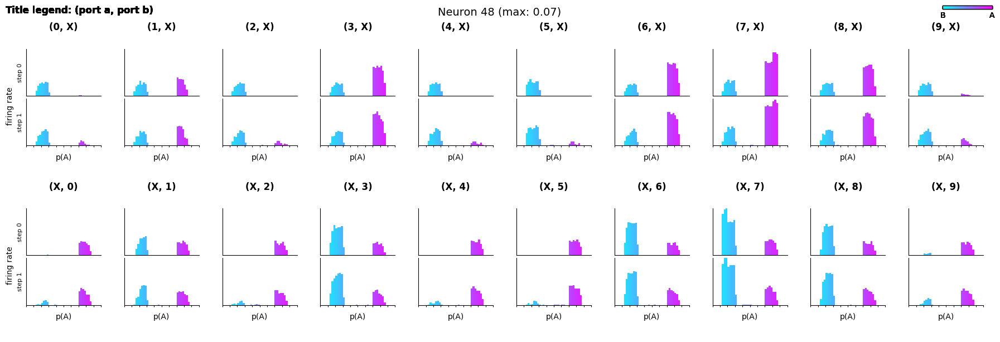

 49%|████▉     | 49/100 [02:00<02:10,  2.56s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/49.png


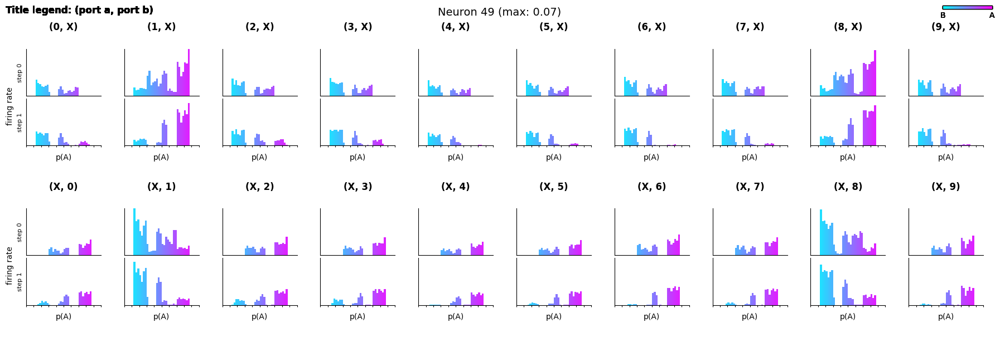

 50%|█████     | 50/100 [02:02<02:01,  2.43s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/50.png


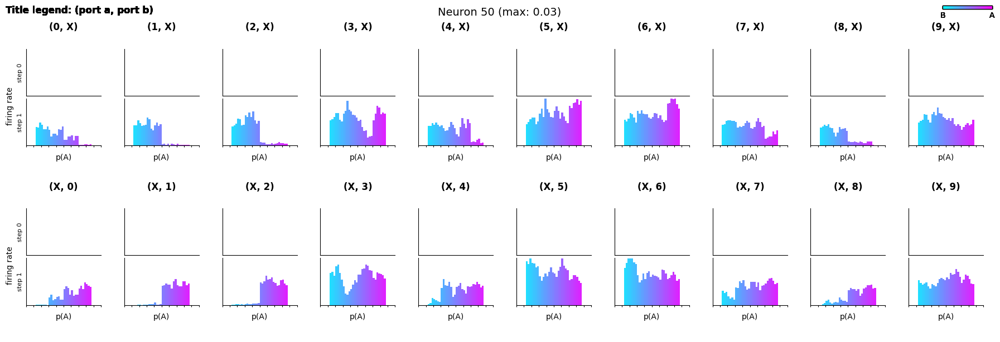

 51%|█████     | 51/100 [02:05<02:03,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/51.png


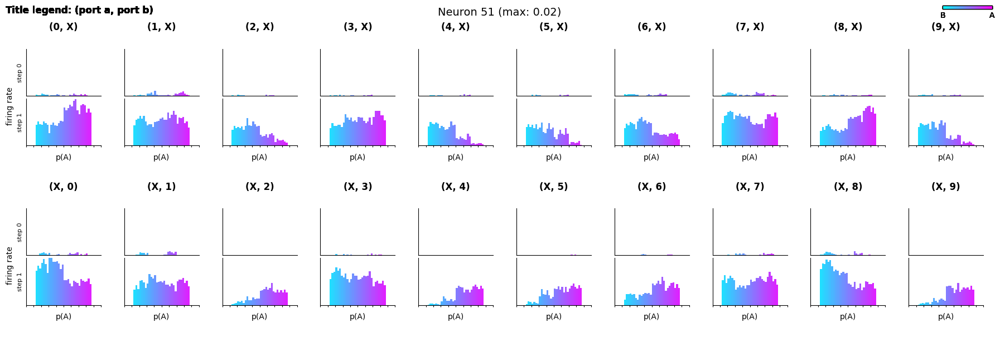

 52%|█████▏    | 52/100 [02:07<01:55,  2.41s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/52.png


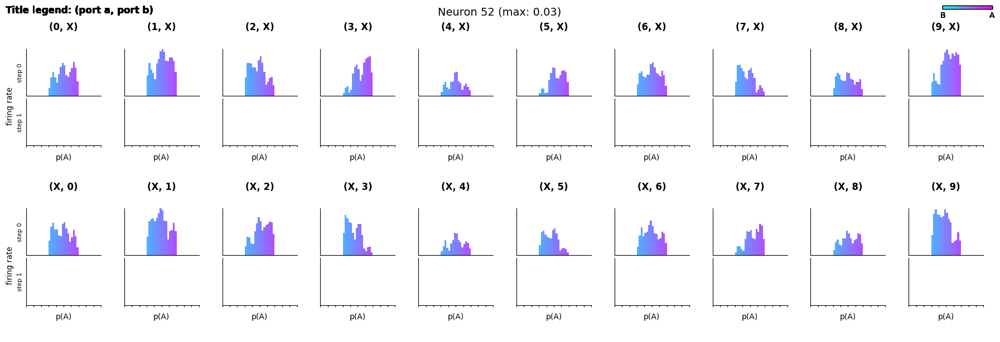

 53%|█████▎    | 53/100 [02:10<01:57,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/53.png


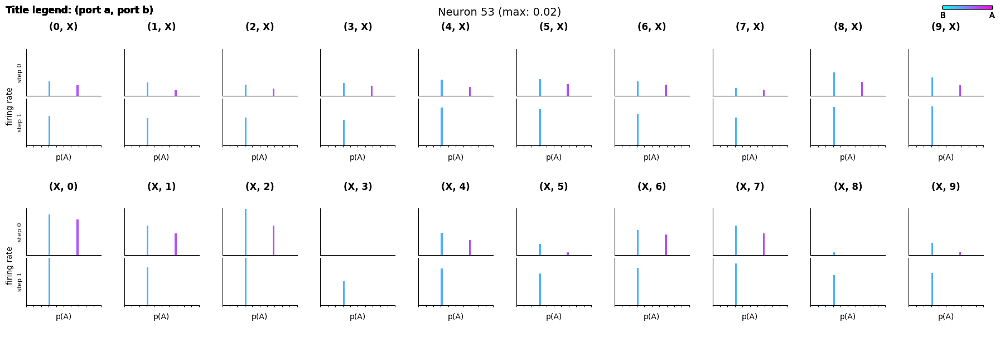

 54%|█████▍    | 54/100 [02:12<01:56,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/54.png


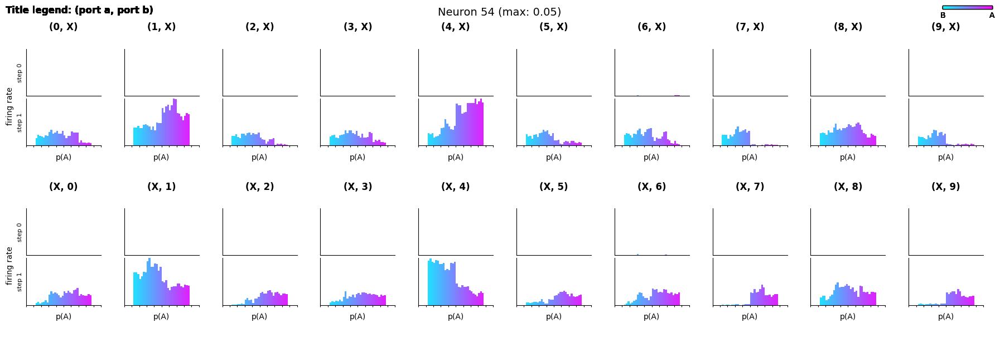

 55%|█████▌    | 55/100 [02:15<01:47,  2.40s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/55.png


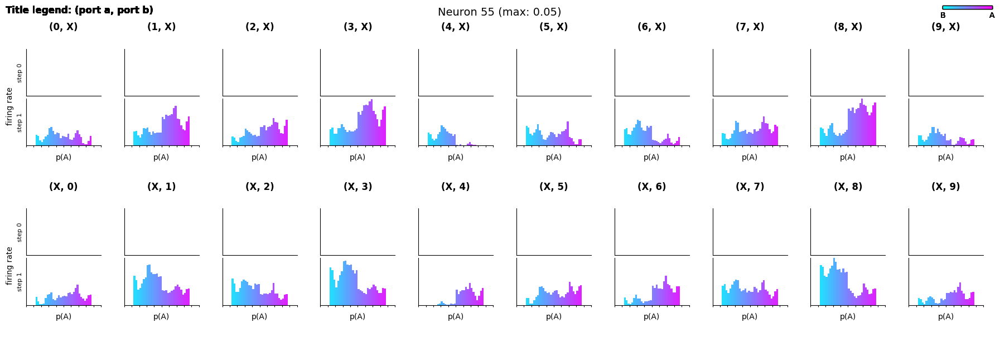

 56%|█████▌    | 56/100 [02:17<01:49,  2.50s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/56.png


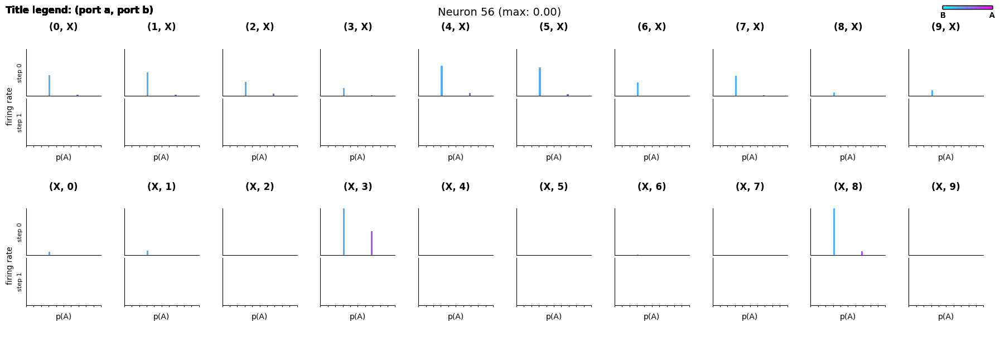

 57%|█████▋    | 57/100 [02:19<01:43,  2.40s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/57.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

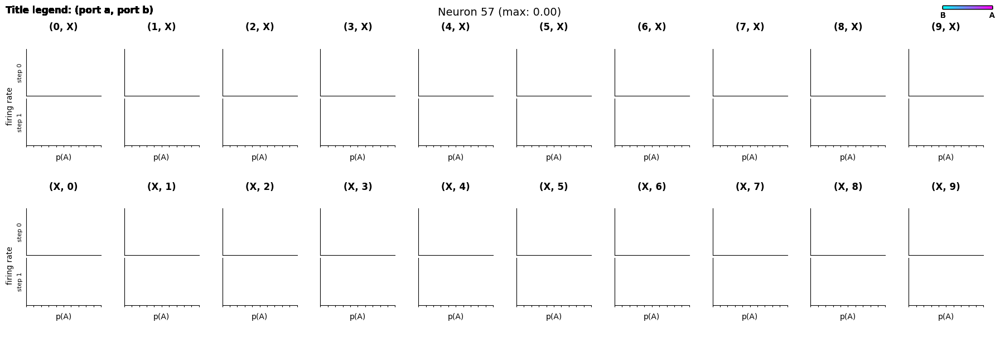

 58%|█████▊    | 58/100 [02:22<01:44,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/58.png


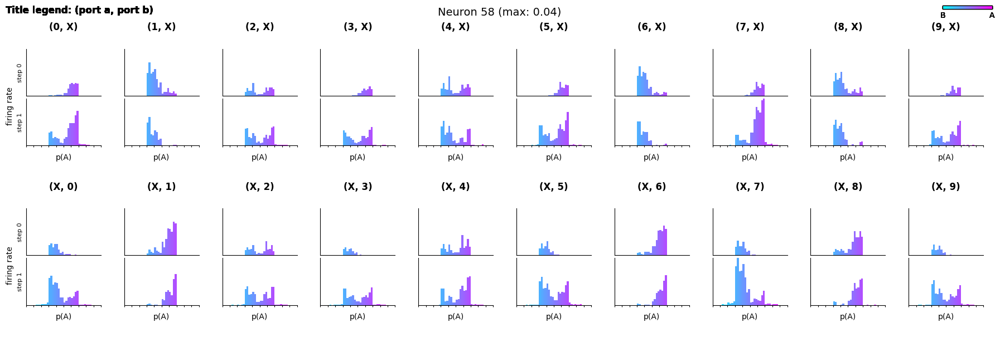

 59%|█████▉    | 59/100 [02:24<01:37,  2.38s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/59.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

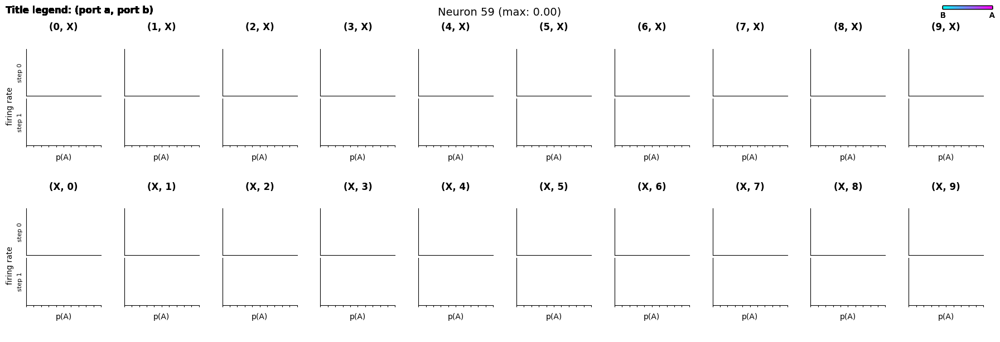

 60%|██████    | 60/100 [02:27<01:38,  2.47s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/60.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

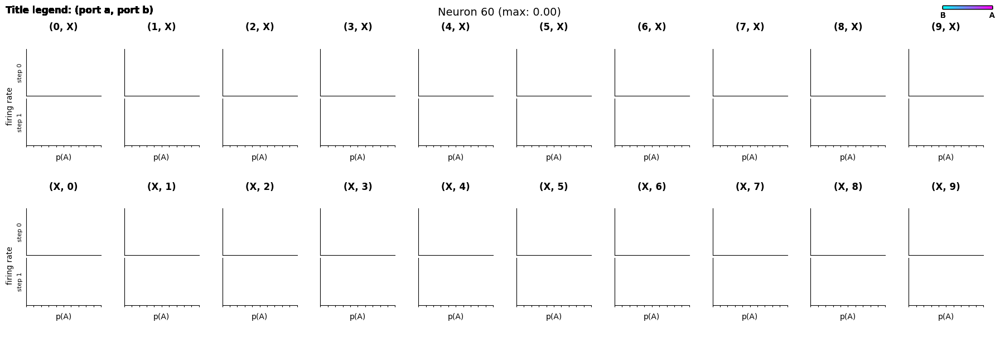

 61%|██████    | 61/100 [02:29<01:32,  2.38s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/61.png


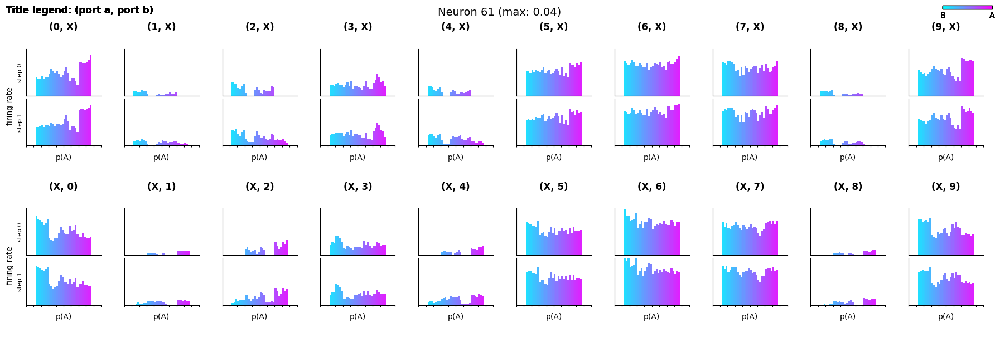

 62%|██████▏   | 62/100 [02:32<01:35,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/62.png


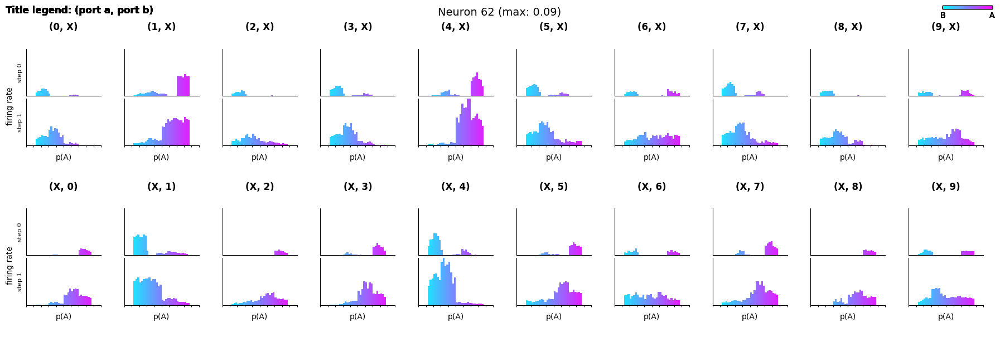

 63%|██████▎   | 63/100 [02:35<01:34,  2.55s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/63.png


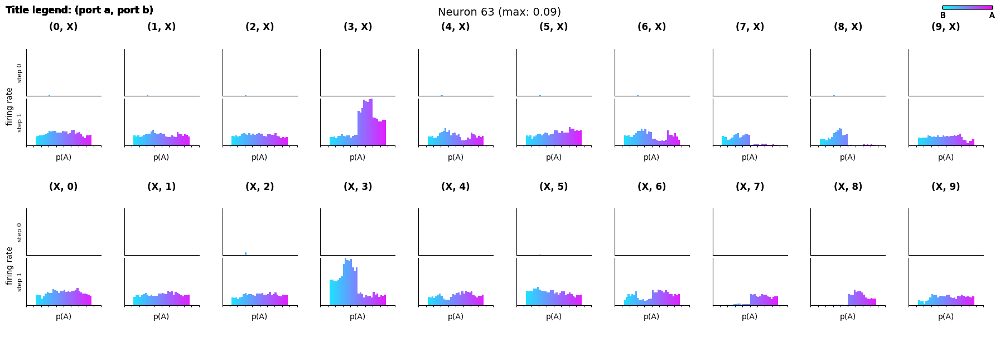

 64%|██████▍   | 64/100 [02:37<01:26,  2.41s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/64.png


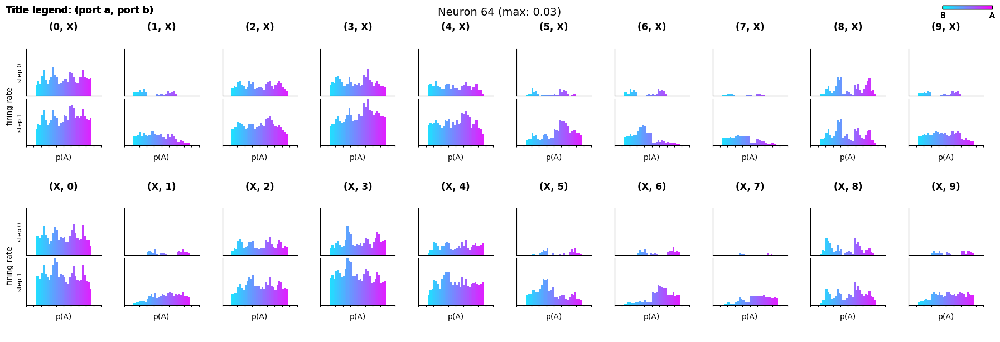

 65%|██████▌   | 65/100 [02:39<01:27,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/65.png


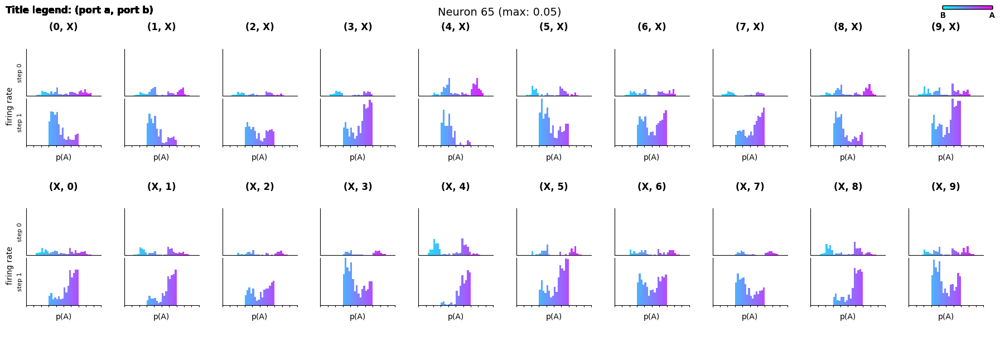

 66%|██████▌   | 66/100 [02:41<01:20,  2.38s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/66.png


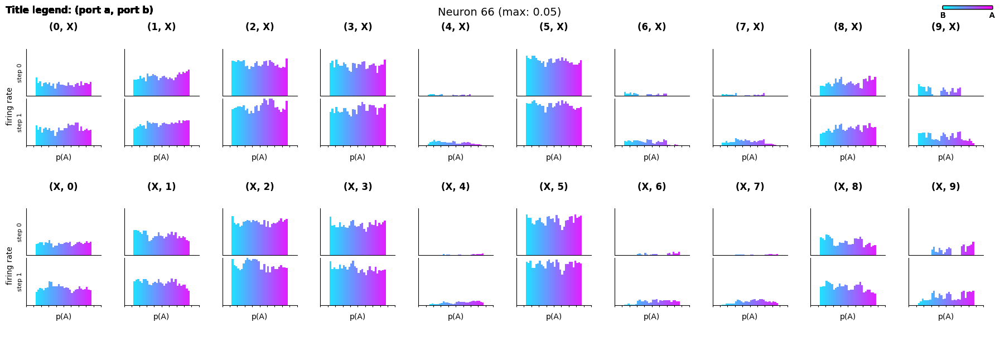

 67%|██████▋   | 67/100 [02:44<01:21,  2.48s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/67.png


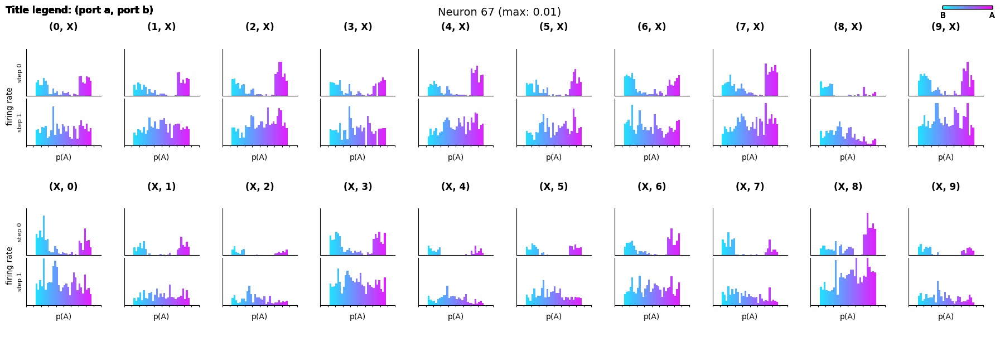

 68%|██████▊   | 68/100 [02:46<01:16,  2.39s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/68.png


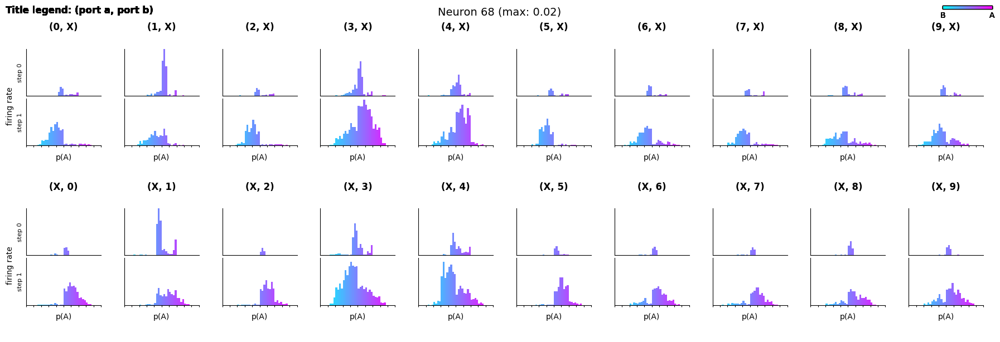

 69%|██████▉   | 69/100 [02:49<01:17,  2.49s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/69.png


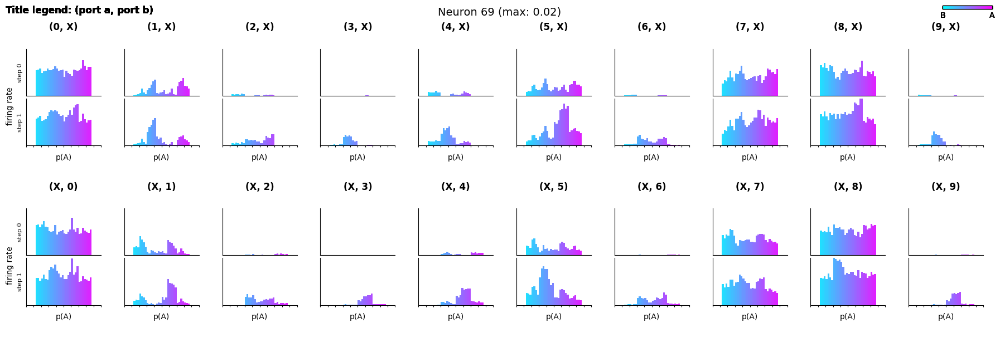

 70%|███████   | 70/100 [02:51<01:11,  2.39s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/70.png


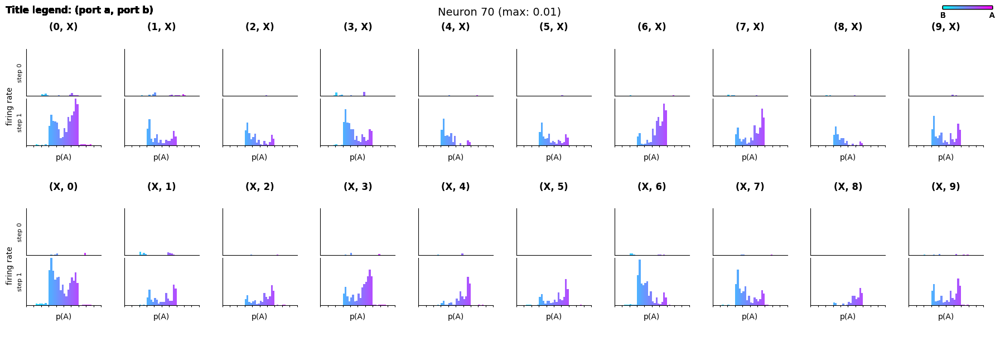

 71%|███████   | 71/100 [02:54<01:13,  2.53s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/71.png


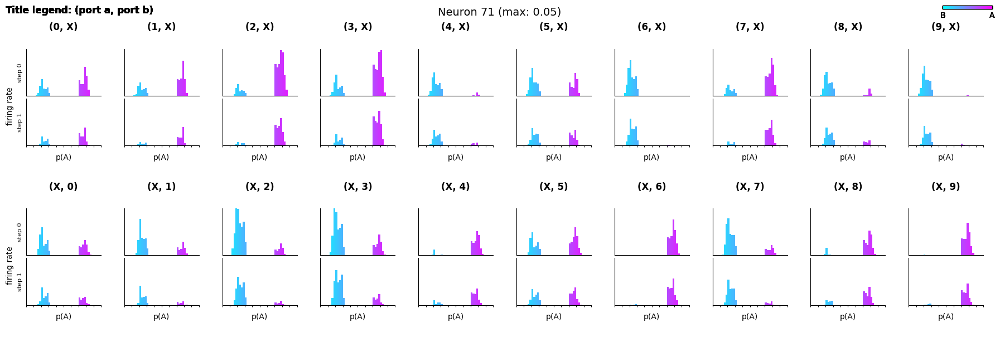

 72%|███████▏  | 72/100 [02:57<01:11,  2.56s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/72.png


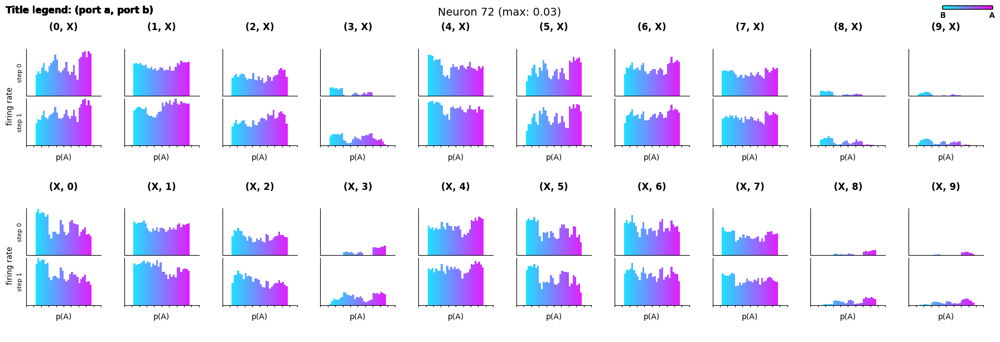

 73%|███████▎  | 73/100 [02:59<01:06,  2.45s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/73.png


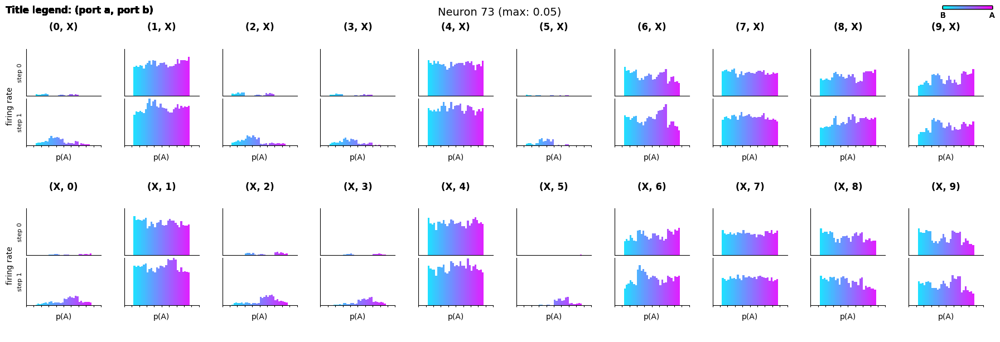

 74%|███████▍  | 74/100 [03:02<01:05,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/74.png


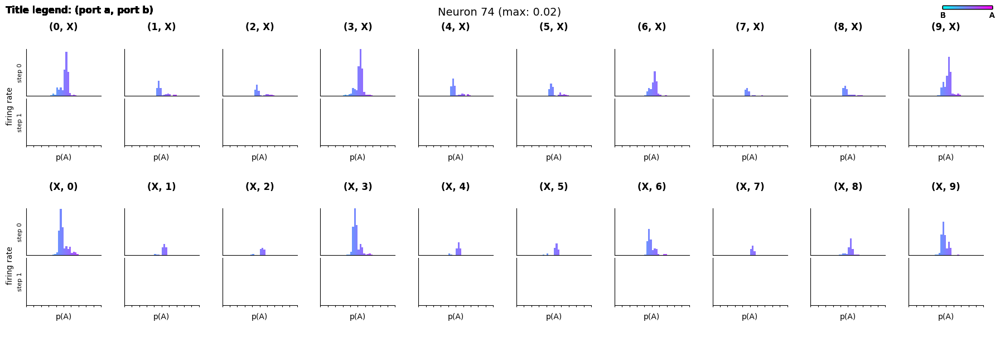

 75%|███████▌  | 75/100 [03:04<01:00,  2.43s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/75.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

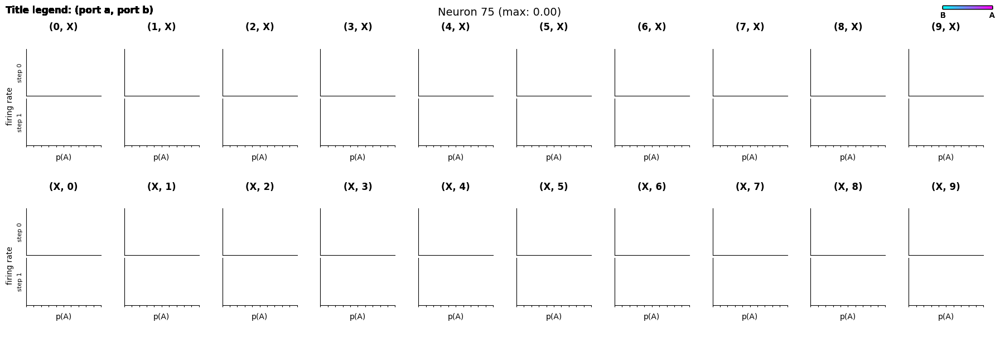

 76%|███████▌  | 76/100 [03:07<01:00,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/76.png


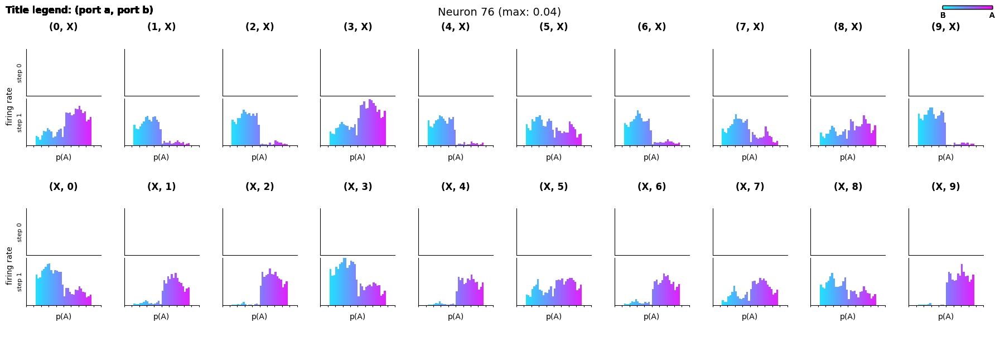

 77%|███████▋  | 77/100 [03:09<00:55,  2.40s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/77.png


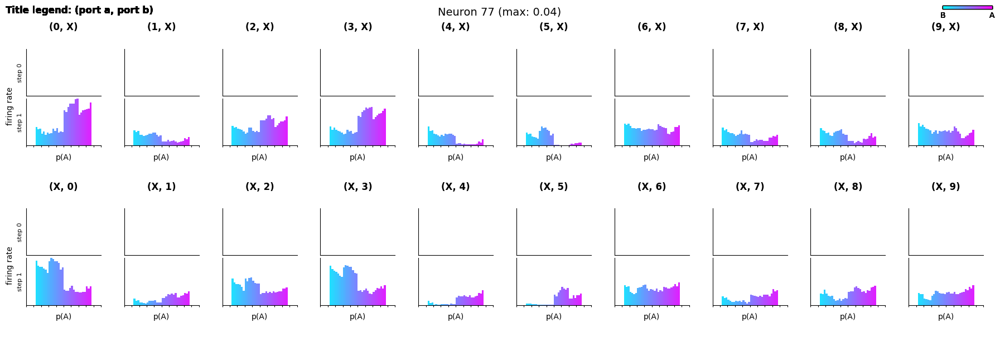

 78%|███████▊  | 78/100 [03:11<00:54,  2.48s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/78.png


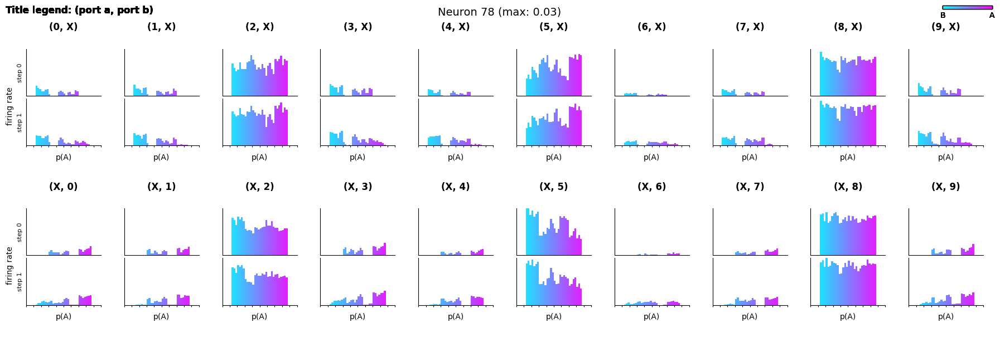

 79%|███████▉  | 79/100 [03:13<00:49,  2.37s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/79.png


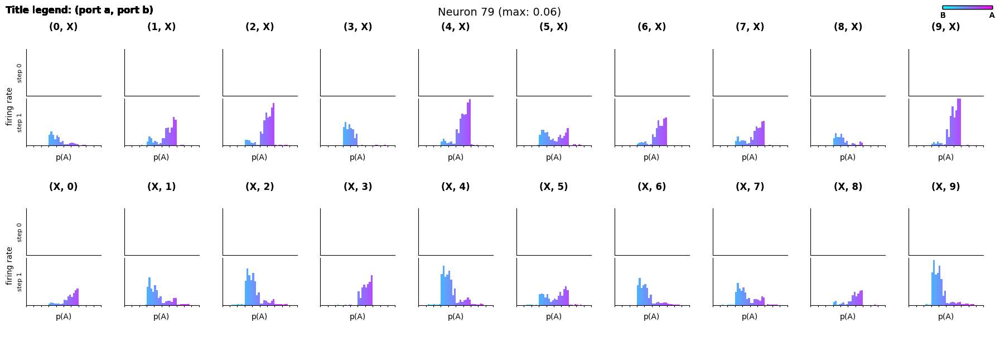

 80%|████████  | 80/100 [03:16<00:50,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/80.png


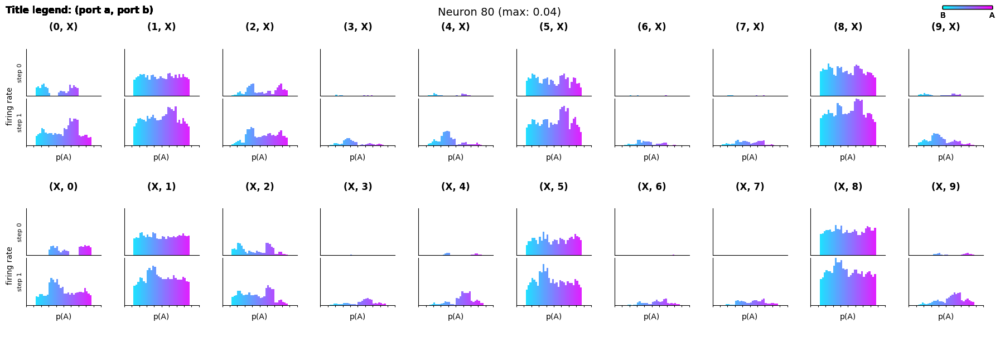

 81%|████████  | 81/100 [03:19<00:48,  2.56s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/81.png


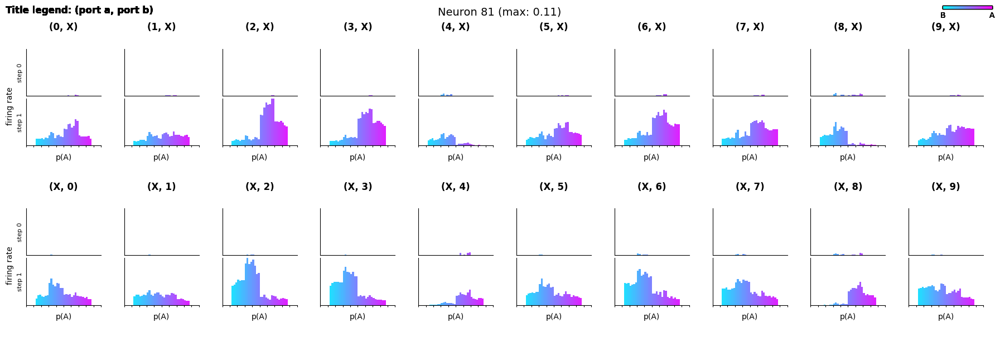

 82%|████████▏ | 82/100 [03:21<00:43,  2.44s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/82.png


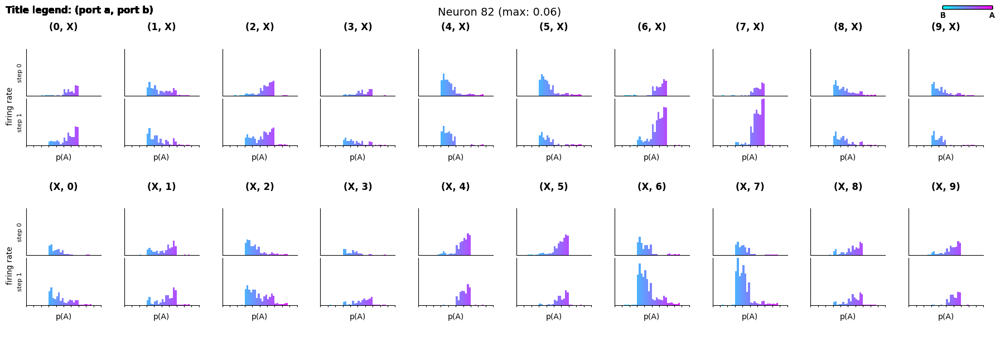

 83%|████████▎ | 83/100 [03:24<00:42,  2.52s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/83.png


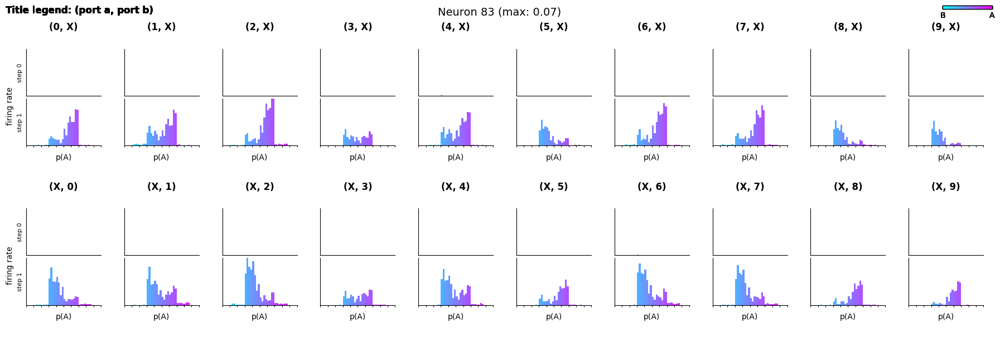

 84%|████████▍ | 84/100 [03:26<00:38,  2.40s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/84.png


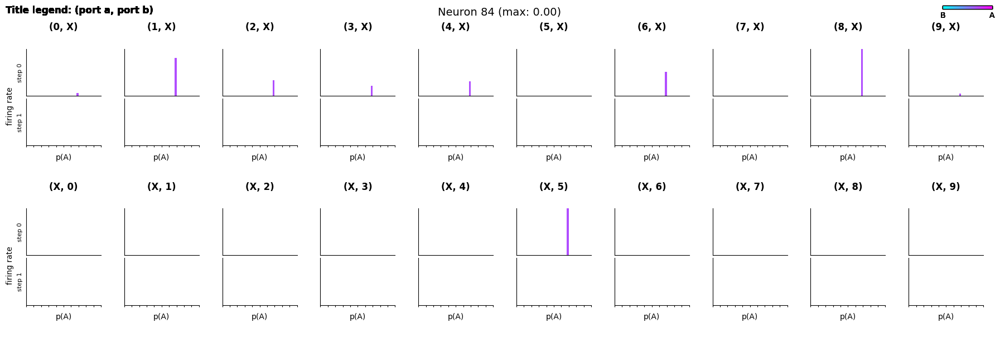

 85%|████████▌ | 85/100 [03:29<00:37,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/85.png


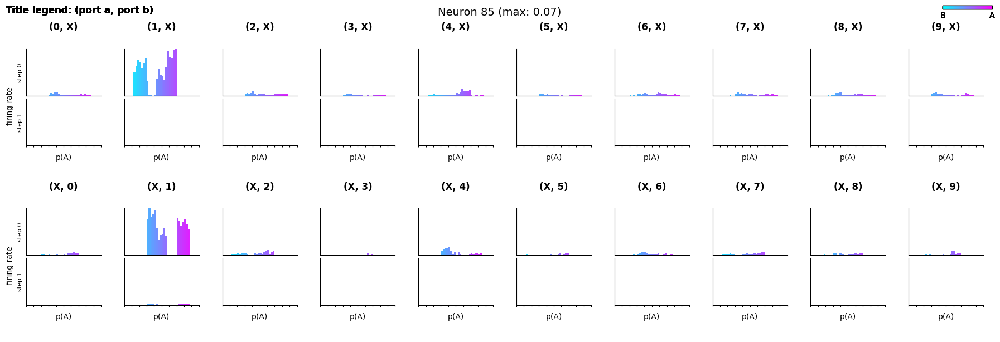

 86%|████████▌ | 86/100 [03:31<00:33,  2.39s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/86.png


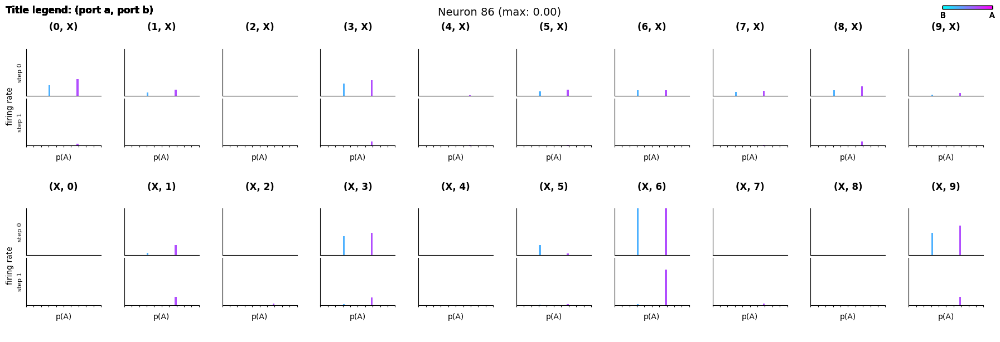

 87%|████████▋ | 87/100 [03:33<00:31,  2.46s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/87.png


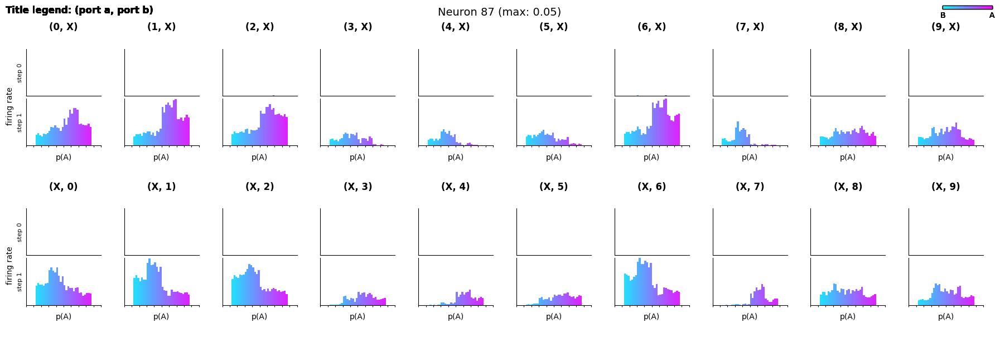

 88%|████████▊ | 88/100 [03:36<00:28,  2.36s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/88.png


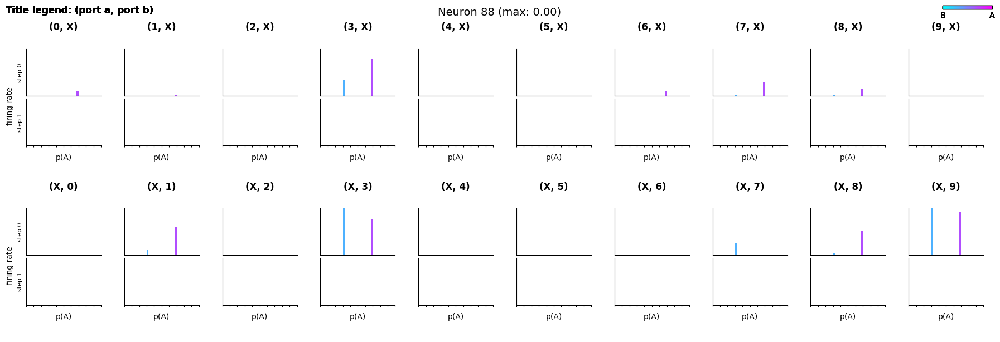

 89%|████████▉ | 89/100 [03:38<00:27,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/89.png


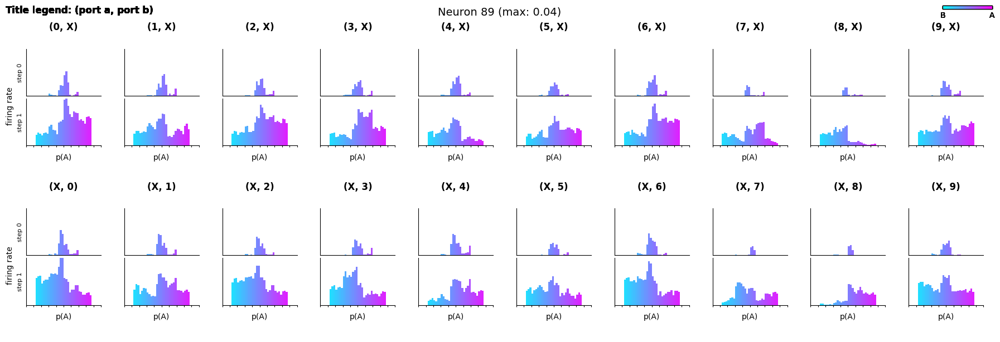

 90%|█████████ | 90/100 [03:41<00:25,  2.57s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/90.png


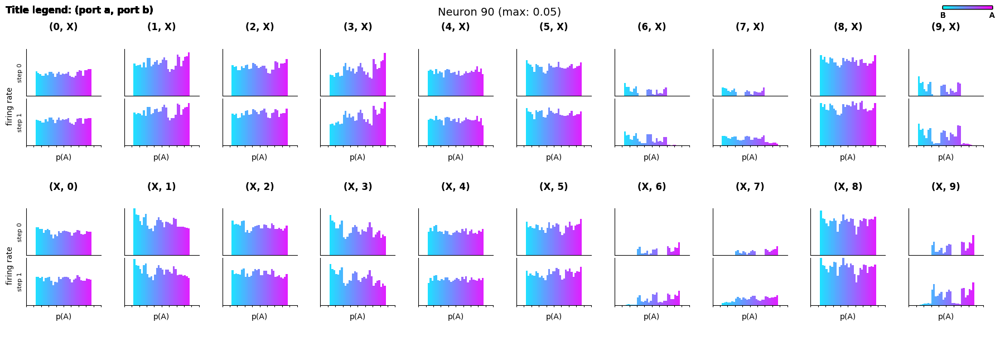

 91%|█████████ | 91/100 [03:43<00:21,  2.44s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/91.png


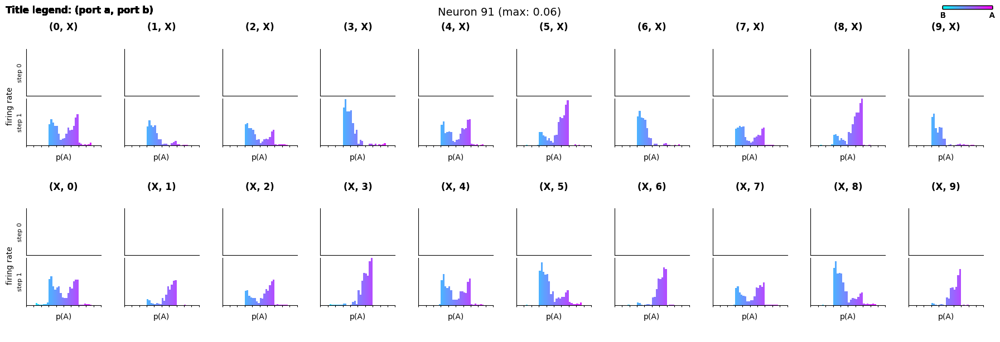

 92%|█████████▏| 92/100 [03:46<00:20,  2.51s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/92.png


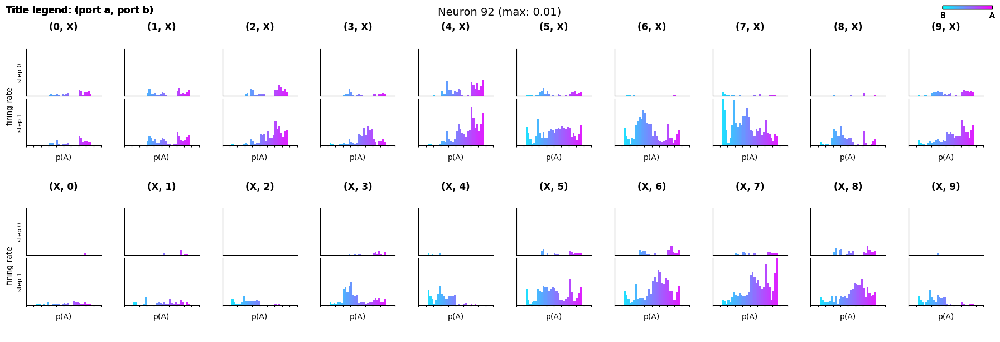

 93%|█████████▎| 93/100 [03:48<00:16,  2.38s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/93.png


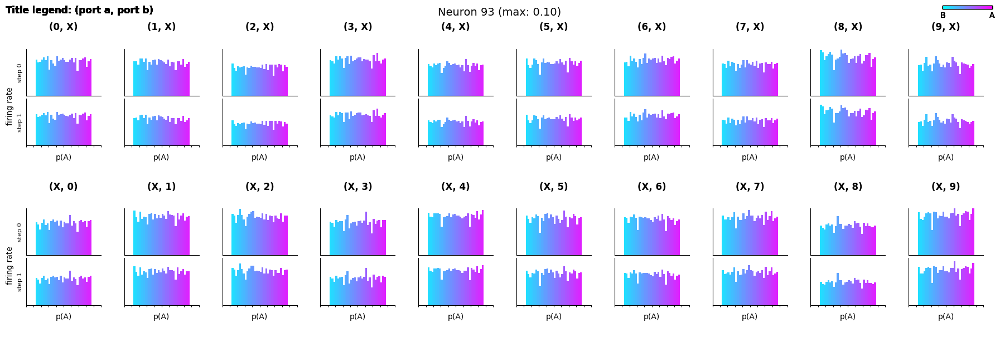

 94%|█████████▍| 94/100 [03:51<00:14,  2.48s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/94.png


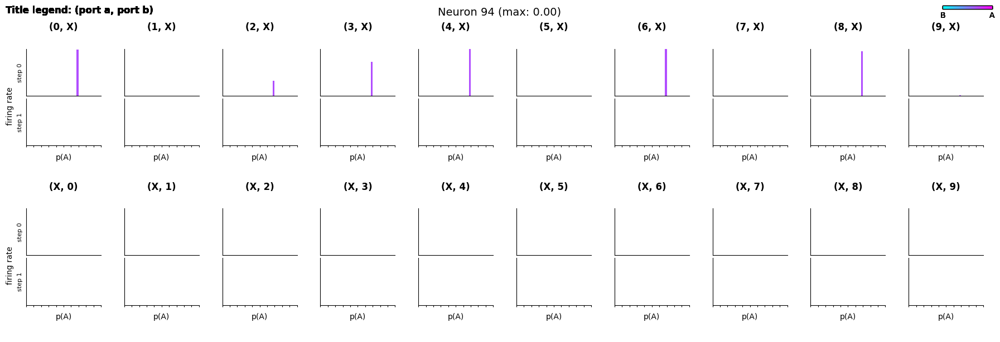

 95%|█████████▌| 95/100 [03:53<00:11,  2.37s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/95.png


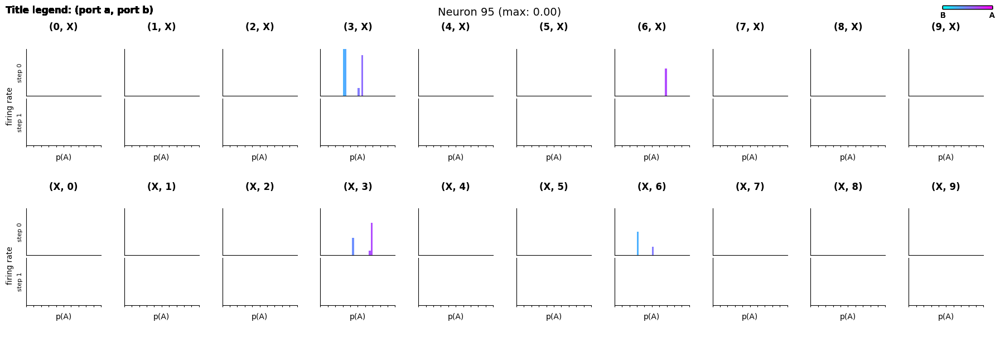

 96%|█████████▌| 96/100 [03:56<00:09,  2.44s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/96.png


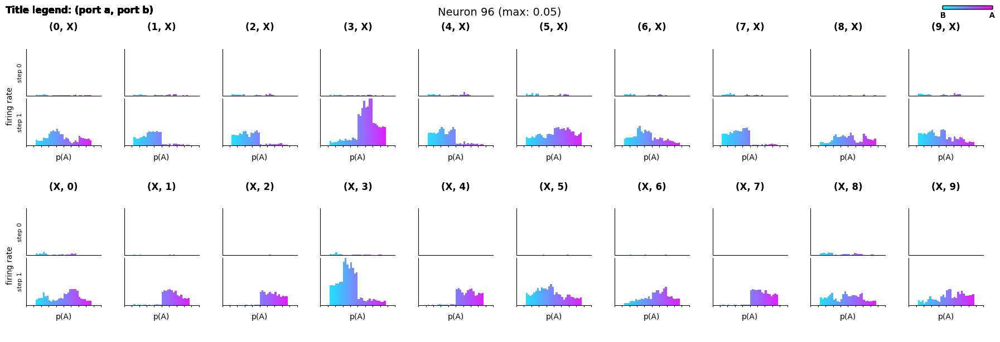

 97%|█████████▋| 97/100 [03:58<00:07,  2.35s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/97.png


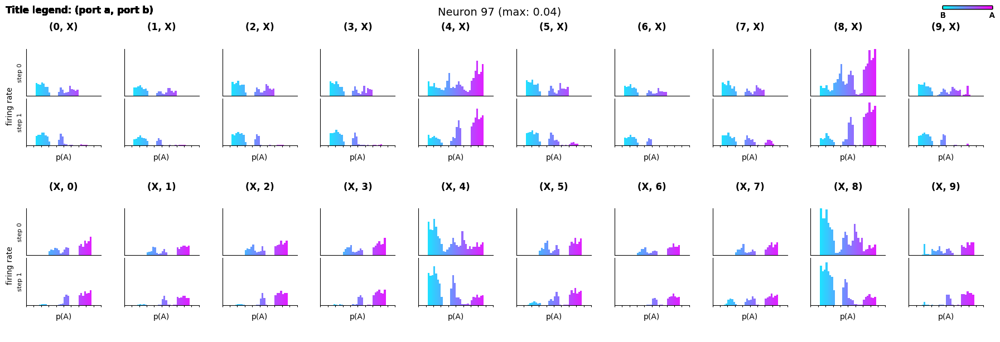

 98%|█████████▊| 98/100 [04:00<00:04,  2.49s/it]/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])


/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/98.png


/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analysis/decoder/../../model/plotting.py:343: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  if not np.isnan(vmax): inner_ax.set_ylim([0, vmax])
/Users/jo/notebooks_paper/analys

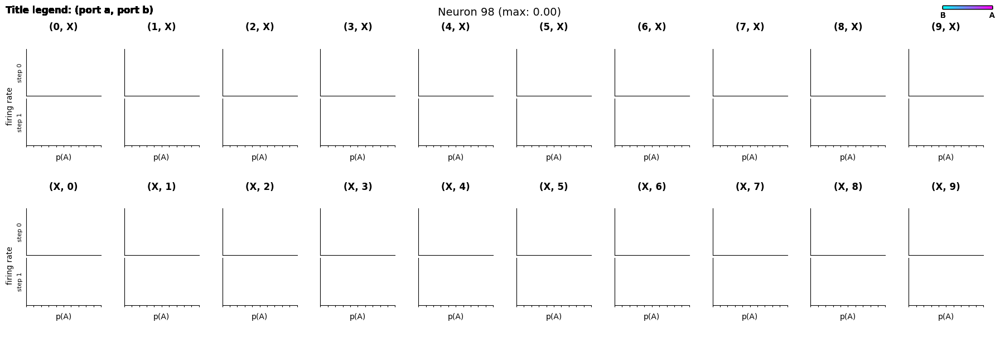

 99%|█████████▉| 99/100 [04:03<00:02,  2.55s/it]

/Users/jo/notebooks_paper/analysis/decoder/run_data_new/separate_figs/polar/mean/hist_griddy_40/99.png


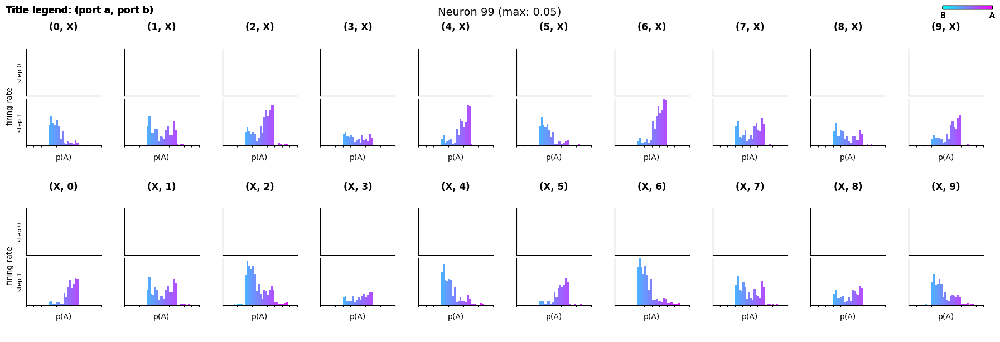

100%|██████████| 100/100 [04:05<00:00,  2.46s/it]


In [573]:
from plotting import *
plot_average_layout_hists(means, neur_ids=np.arange(100), overwrite=True, show=True)

In [558]:
np.unique(layouts)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39])

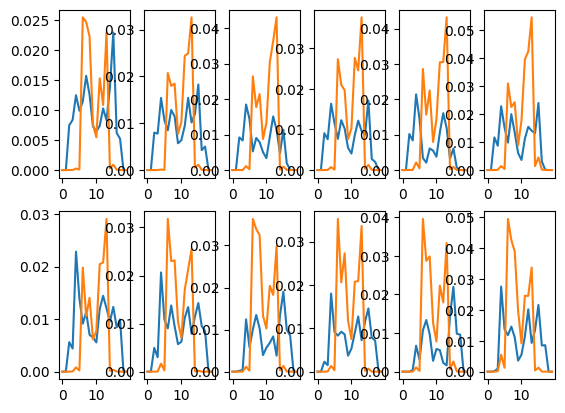

In [535]:
neuron_id = 5
ports = np.arange(6)
conds = [0,1]

fig, axes = plt.subplots(len(conds), len(ports))

for port in ports:
    for cond in conds:
        for step in range(Conf.trial_len):
            ax = axes[cond, port]
            mean = means[cond, port, :, neuron_id, step]
            ax.plot(mean)

In [510]:
n_p_bins = 8
p_port = copy(p_A)
p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]] = 1 - p_port[action[:,::2] == layouts[:,-1][:, np.newaxis]]
bin_edges = np.linspace(0.5, np.max(p_port), n_p_bins+1)[1:]  # Creates 5 edges for 4 bins
bins = np.repeat(np.digitize(p_port, bin_edges).squeeze(), 2, axis=1)

neuron_id = 0
trial_start = 1, -1

hid = hiddens[:, : , neuron_id]

for a_port in range(4):
    layout_batch_mask = np.where(layouts[:, 0] == a_port)[0]
    hid_batch_masked = hid[layout_batch_mask]
    
    for p in range(n_p_bins):
        prob_mask = bins[layout_batch_mask] == p

        hid_prob_masked = hid_batch_masked[prob_mask]

        

        # print(hid_prob_masked.shape)
        # print(bins[layout_batch_mask][0,:10])
        # print(action[layout_batch_mask][0,:10])

(2652,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(2730,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(804,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(2008,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(3124,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(1194,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(3032,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(4296,)
[4 4 1 1 5 5 6 6 7 7]
[ 0  0 11 11 11 11 11 11 11 11]
(2784,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(2750,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(856,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(2188,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(3038,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(1320,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(2968,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(4096,)
[4 4 1 1 3 3 2 2 5 5]
[1 1 4 4 1 1 4 4 4 4]
(2804,)
[4 4 6 6 0 0 4 4 1 1]
[27 27 27 27 27 27 27 27  2  2]
(2622,)
[4 4 6 6 0 0 4 4 1 1

In [496]:
n_batches = 504
n_neurons = 256
n_p_bins = 8
# neur_ids = range(np.minimum(n_neurons, hiddens.shape[-1]))
neur_ids = [39]
polar = True
separate_figures = True
overwrite = True
# load_dir = '../run_data_1_128_l2_1e6_l2_3e4'

subplot_kw={'projection': 'polar'} if polar else None

bin_edges = np.linspace(1, 0, n_p_bins+1)  # Creates 5 edges for 4 bins
cmap = cm.get_cmap('cool', n_p_bins) if n_p_bins > 2 else cm.get_cmap('bwr', n_p_bins) # Get a colormap object

if not separate_figures:
    # Adjusting figure size based on the number of batches and neurons
    fig_width = max(10, n_batches)  # Adjust width as needed
    fig_height = max(20, n_neurons)  # Adjust height as needed
    fig, axes = plt.subplots(n_neurons, n_batches, figsize=(fig_width, fig_height),
                            subplot_kw=subplot_kw, layout='constrained')
else:
    n_col = Conf.port_dim - 1
    # n_row = int(np.ceil((n_batches) / (n_col-2))) + n_batches // (n_col-2)
    n_row = Conf.port_dim ** 2
    # Adjusting figure size based on the number of batches and neurons
    fig_width = 16  # Adjust width as needed
    fig_height = max(2, 2*n_row)  # Adjust height as needed
    save_dir = os.path.join(load_dir, 'separate_figs', 'polar' if polar else 'planar')
    print(save_dir)
    if not os.path.exists(save_dir): os.makedirs(save_dir)

theta = np.linspace(0, 2*np.pi, Conf.trial_len, endpoint=False)
if polar:
    theta = np.append(theta, theta[0])
rotation_angle = (2*np.pi / Conf.trial_len)/2 - np.pi/2

# a_trial_confirmed = np.argmax(p_A, axis=1)
# b_trial_confirmed = np.argmin(p_A, axis=1)
# a_ports = targets_arg_trial[np.arange(len(a_trial_confirmed)), a_trial_confirmed, -1]
# b_ports = targets_arg_trial[np.arange(len(b_trial_confirmed)), b_trial_confirmed, -1]
i_ports = np.argmax(inputs[:,:,:Conf.port_dim], axis=-1)[:, Conf.trial_len-3]
a_ports = np.argmax(inputs[:,:,:Conf.port_dim], axis=-1)[:, Conf.trial_len-2]
b_ports = np.argmax(inputs[:,:,:Conf.port_dim], axis=-1)[:, Conf.trial_len-1]

for k in tqdm(neur_ids):
    # vmax = np.minimum(Conf.threshold, np.mean(hiddens[:, 5*Conf.trial_len:, k]) + 2 * np.std(hiddens[:, 5*Conf.trial_len:, k]))
    vmax = np.percentile(hiddens[:,:,k], 99)
    vmax_ = np.max(hiddens[:, 5*Conf.trial_len:, k])
    print(vmax, vmax_, np.where(hiddens[:, 5*Conf.trial_len:, k] == vmax_))

    if separate_figures:
        fpath = os.path.join(save_dir, str(k) + '.png')
        if not overwrite and os.path.exists(fpath):
            print(f'file {fpath} already exists')
            continue
        fig, axes = plt.subplots(n_row, n_col+1, figsize=(fig_width, fig_height), subplot_kw=subplot_kw, layout='constrained')
        for ax in axes.flatten():
            ax.set_visible(False)
        # Draw horizontal lines across the figure
        for i in range(1, n_row // Conf.port_dim):
            # Calculate the y position in figure coordinates
            line_y = (n_row - i * Conf.port_dim) / n_row
            # Create a line at the desired y position that spans the width of the figure
            line = Line2D([0, 1], [line_y, line_y], transform=fig.transFigure, color="black", linewidth=2)
            fig.add_artist(line)

        for i in range(0, n_row // Conf.port_dim - 1):
        # Create an axes into which the colorbar can be drawn
            cbar_ax = inset_axes(axes[i * Conf.port_dim, 0],
                                width="90%",  # Use half the width of the parent axes.
                                height="10%",   # Specify the height as 10% of the parent axes.
                                loc='upper center',  # Position at the lower center of the parent axes.
                                borderpad=1,  # Positive borderpad to move inside of the parent axes.
                                )

            # Create the colorbar in the new axes
            cbar = fig.colorbar(cm.ScalarMappable(norm=None, cmap=cmap), cax=cbar_ax, orientation='horizontal')

            # Set the colorbar ticks and labels
            cbar.set_ticks([0, 1])
            cbar.set_ticklabels(['A', 'B'])
            cbar.ax.tick_params(direction='in', pad=3)
            # axes[i * Conf.port_dim, 0].set_title(f'Init port, a/b ports', fontsize=12, fontweight='bold')

    for batch in range(np.minimum(n_batches, hiddens.shape[0])):
        vmax_batch = np.max(hiddens[batch, 5*Conf.trial_len:, k])
        a_idx = np.where(choices_arg_trial[batch, :, -1] == a_ports[batch])[0]
        b_idx = np.where(choices_arg_trial[batch, :, -1] == b_ports[batch])[0]
        perm = (i_ports[batch], a_ports[batch], b_ports[batch])
        
        a_seq = choices_arg_trial[batch, a_idx[0], :]
        b_seq = choices_arg_trial[batch, b_idx[0], :]
        labels = [str(a_lab) if a_lab == b_lab else str(a_lab) + '/' + str(b_lab) for a_lab, b_lab in zip(a_seq, b_seq)]
    
        if not separate_figures:
            ax = axes[k, batch]
        else:
            ver_idx, hor_idx = perm[0]*(Conf.port_dim) + perm[1], perm[2]
            if ver_idx >= axes.shape[0] or hor_idx >= axes.shape[1]:
                continue
            ax = axes[ver_idx, hor_idx] #axes.flatten()[batch]
            ax.set_visible(True)

        h = hidden_trial[batch, :, :, k]
        # Assign each probability to a bin
        bins = np.digitize(p_A[batch, :], bin_edges) - 1
        for i in range(n_p_bins):
            bin_idxs = np.where(bins == i)[0]
            if len(bin_idxs) > 0:
                h_bin = h[bin_idxs, :]
                h_bin_mean = np.mean(h_bin, axis=0)

                if polar:
                    h_bin_mean = np.append(h_bin_mean, h_bin_mean[0])
                    ax.set_theta_offset(rotation_angle)
                else:
                    ax.spines['right'].set_visible(False)
                    ax.spines['top'].set_visible(False)        
                
                ax.plot(theta, h_bin_mean, linewidth=1, c=cmap(i), marker='o', markersize=3)
            
        ax.set_xticks(theta[:-1] if polar else theta, labels)
        ax.tick_params(axis='x', pad=-4 if polar else 0)  # Adjust pad value as needed
        # ax.set_xticklabels(a_seq.astype(str).tolist(), fontsize=6, pad=-15)  # Adjust pad as needed
        ax.set_yticklabels([])  # Remove y-ticks
        # vlim = np.minimum(vmax, vmax_)
        vlim = vmax
        # ax.set_ylim([0, np.maximum(vlim, 0.1)])
        ax.set_ylim([0, vlim])
        if batch == 0 and not separate_figures:
            ax.set_ylabel(f'Neuron {k}', labelpad=20, fontsize=12)
        if k == 0 or separate_figures:
            # ax.set_title(f'Layout {batch}', fontsize=12)
            ax.set_title(f'{perm[0]}, {perm[1]}/{perm[2]}', fontsize=12, fontweight='bold')
        ax.set_xlabel(f'{vlim:.2f} ({vmax_batch:.2f})', labelpad=20 if polar else 5, fontsize=10)
        ax.xaxis.set_label_position('top')

    if separate_figures:
        fig.savefig(fpath)
        plt.close()
else:
    fig.savefig(os.path.join(load_dir, 'polar.png' if polar else 'planar.png'))
    plt.show()
        


AttributeError: 'numpy.ndarray' object has no attribute 'get_cmap'